# An AI-Driven Exploration of Cinema's Defining Era: IMDb Movie Analysis (1915-1960)

## Introduction

The period between 1915 and 1960 represents a truly defining era for cinema, a time of remarkable artistic innovation and industrial transformation that laid the groundwork for much of contemporary film. Spanning tumultuous global events including two World Wars, the Great Depression, and significant societal shifts, this era witnessed cinema evolve from a novelty into a major cultural and industrial force. Key developments included the consolidation of silent film language, the transformative advent of sound, the rise and peak of the Hollywood studio system, the impact of global conflicts on national film industries (leading to Hollywood's increased dominance post-WWI), and the emergence of distinct national cinemas across Europe and beyond (Nowell-Smith, 1997; Crisp, 1993). These decades produced an extraordinarily rich and diverse body of work, making exploration both exhilarating and daunting for the classic film enthusiast. Standard online search tools and recommendation systems often prove inadequate, struggling to capture the nuance and context essential for a rewarding exploration of this era (Gillett, 2008). A central challenge arises: how to move beyond simple genre tags or star searches to uncover deeper connections and patterns within this significant cinematic heritage?

This project, **"An AI-Driven Exploration of Cinema's Defining Era: IMDb Movie Analysis (1915-1960),"** addresses this challenge by leveraging Artificial Intelligence (AI) and Machine Learning (ML) for a multifaceted analysis of films produced during this pivotal period. The central research questions guiding this study are:

* Can ML algorithms, by analyzing extensive metadata, identify meaningful, data-driven clusters or groupings among films of this era that potentially transcend traditional genre classifications?
* Can predictive models be built to effectively determine membership in these discovered groupings based on quantifiable film characteristics, thereby assessing the coherence of the clusters?
* Ultimately, can AI facilitate the development of more sophisticated tools for search, discovery, and recommendation, offering classic film lovers a richer, more nuanced way to explore this defining era than currently available?

The motivation for employing AI and ML stems from the sheer scale and complexity of the data. Analyzing decades' worth of film production, encompassing thousands of titles, personnel, and associated data points requires computational power capable of identifying subtle patterns and relationships that might elude manual analysis or simpler statistical methods (Müller & Guido, 2017; Kubat, 2021). The integration of data from diverse sources like IMDb and Wikidata further compounds this complexity. Machine learning offers a suite of techniques uniquely suited for extracting knowledge from such large datasets (Müller & Guido, 2017; Kubat, 2021; Johnson, 2024). Specifically, this project applies:
* **Unsupervised clustering** (K-Means, Agglomerative, DBSCAN) to address the first research question by discovering latent groupings within the films based on their features.
* **Supervised classification** (Naive Bayes, Logistic Regression, LinearSVC) to address the second research question by assessing the predictability and coherence of these clusters using movie characteristics.
* **Content-based (TF-IDF) and embedding-based similarity techniques**, integrated into enhanced search and hybrid recommendation interfaces, to address the third research question by providing more nuanced exploration tools.
The goal is not merely to apply algorithms, but to utilize them as instruments for deeper cinematic exploration, driven by the data itself (Müller & Guido, 2017).

A primary challenge faced was the integration and processing of large, disparate datasets from IMDb and Wikidata. The originality of this project lies in its comprehensive application of a range of AI techniques—from initial data wrangling and exploratory analysis through advanced clustering, classification, and interactive system design—specifically focused on the rich 1915-1960 period of film history. It is anticipated that this analysis may provide novel insights and tools valuable for film enthusiasts and historians.

This document details the project's methodology and findings. Following this introduction, the data acquisition and extensive preprocessing steps are outlined. Subsequent sections present the results of exploratory data analysis, revealing key trends. The application of unsupervised clustering algorithms to identify latent film groupings is then detailed, followed by the supervised classification models built to predict these clusters. Finally, the development and implementation of enhanced search tools and an interactive movie recommendation system, designed to offer a more nuanced exploration of this classic cinema era, are described.

## Code Usage Instructions

To execute the analysis presented in this report, the submitted Jupyter Notebook file (`.ipynb`) is required, along with a compatible Python environment containing the necessary libraries.

### Files

This submission includes:

* The primary Jupyter Notebook file .
* This report in PDF format , generated directly from the notebook.
* Any necessary data files not downloadable via code (if applicable, though this project primarily uses downloadable public datasets or generates data).

### Environment Setup

The notebook relies on standard Python data science and machine learning libraries. Key dependencies include:

* **pandas**
* **numpy**
* **scikit-learn**
* **matplotlib**
* **seaborn**
* **plotly**
* **tensorflow / keras**
* **ipywidgets**
* **SPARQLWrapper**
* **imblearn**
* **networkx**

It is recommended to use a virtual environment (like conda or venv) to manage dependencies. Ensure these libraries are installed (e.g., using `pip install pandas numpy ...` or similar commands for your environment).

### Data

The analysis uses data derived primarily from the publicly available IMDb Non-Commercial Datasets and Wikidata. Ensure necessary base data files (e.g., `.tsv.gz` from IMDb) are located in the path specified within the notebook, or follow instructions within the notebook for downloading/accessing the data (including setting the correct `GOOGLE_DRIVE_PATH` variable for local IMDb files). Wikidata is queried dynamically if cached results are unavailable.

### Execution

Open the `.ipynb` file using Jupyter Notebook, JupyterLab, or Google Colab. Execute the cells sequentially from top to bottom. The notebook is designed to run end-to-end, performing data loading, processing, analysis, model training, and visualization/interface generation. Ensure all code cells execute without error. Some cells, particularly those involving extensive computation (like clustering parameter search or Wikidata fetching if not cached), may take significant time to run.

### Output

The notebook will generate plots, display model results (metrics, tables), and set up the interactive movie explorer, cluster explorer, and recommendation interfaces described in the final sections of the report.

### Setup and Imports

This initial code block establishes the foundational environment for the project. It performs the essential tasks of importing the necessary Python libraries required for data manipulation, analysis, visualization, machine learning, and creating interactive elements within the notebook.

Key libraries and modules imported include:

* **Core Data Handling:** `pandas` for efficient data structures (DataFrames) and analysis tools, alongside `numpy` for fundamental numerical operations and array manipulations.
* **Visualization:** `matplotlib.pyplot` (as `plt`) for standard plotting functionalities, `seaborn` for enhanced statistical visualizations, and `plotly` (specifically `plotly.express` as `px` and `plotly.graph_objects` as `go`) for creating interactive charts and figures. `IPython.display` utilities (`display`, `clear_output`, `Markdown`, `HTML`) are imported for richer output rendering within the notebook environment.
* **Machine Learning (Scikit-learn):** A comprehensive suite of tools is imported:
    * *Feature Extraction & Preprocessing:* `CountVectorizer` and `TfidfVectorizer` for text feature generation; `StandardScaler`, `MinMaxScaler`, `MaxAbsScaler` for numerical feature scaling; `SimpleImputer` for handling missing values.
    * *Clustering:* `KMeans`, `DBSCAN`, `AgglomerativeClustering` for unsupervised grouping, and `NearestNeighbors` (often used with DBSCAN parameter tuning).
    * *Classification:* Standard classifiers like `LogisticRegression`, `MultinomialNB`, `LinearSVC`, `MLPClassifier`, and ensemble methods like `RandomForestClassifier`, `GradientBoostingClassifier`, `VotingClassifier`, `StackingClassifier`.
    * *Model Evaluation & Selection:* Utilities for splitting data (`train_test_split`), cross-validation (`cross_val_score`, `StratifiedKFold`, `GridSearchCV`, `cross_validate`), and a wide range of performance metrics (`accuracy_score`, `classification_report`, `confusion_matrix`, `silhouette_score`, `balanced_accuracy_score`, `f1_score`, `precision_recall_fscore_support`, `roc_auc_score`, `average_precision_score`, `ConfusionMatrixDisplay`, etc.).
    * *Similarity:* `cosine_similarity` for calculating similarity between vectors.
* **Handling Imbalanced Data:** The `imblearn` library, specifically `SMOTE` (Synthetic Minority Over-sampling Technique), is imported, suggesting potential use for addressing class imbalance in classification tasks, although its direct application might depend on intermediate code not fully shown in the final PDF snippets.
* **Deep Learning (TensorFlow/Keras):** `tensorflow` is imported, along with specific Keras components (`Model`, `load_model`, various layer types like `Input`, `Dense`, `Embedding`, callbacks like `EarlyStopping`) indicating the potential loading and use of pre-trained neural network models, particularly for generating movie embeddings used in the recommender system.
* **Utility Libraries:** Standard libraries like `os` (operating system interactions), `re` (regular expressions for text processing), `gc` (garbage collection for memory management), `time` (timing operations), `pickle` (saving/loading Python objects), `random` (random number generation), `traceback` (error handling), `warnings` (suppressing specific warnings), `sys` (system-specific parameters), and `difflib` (`SequenceMatcher` for fuzzy string matching in search).
* **Scientific Computing (`scipy`):** The base `scipy` library is imported, along with specific modules for sparse matrix operations (`hstack`, `csr_matrix`, `lil_matrix` used for combining features) and hierarchical clustering tools (`dendrogram`, `linkage`).
* **Collections:** The base `collections` module and specific types like `Counter` and `defaultdict` are imported for efficient data counting and dictionary creation.
* **SPARQL Interface:** `SPARQLWrapper` is imported to query the Wikidata knowledge base for data enrichment.
* **Interactive Widgets (`ipywidgets`):** The base library and numerous specific widget types (`HBox`, `VBox`, `Dropdown`, `HTML`, `Text`, `Button`, `IntSlider`, `FloatSlider`, `IntRangeSlider`, `Checkbox`, `Accordion`, `Output`, etc.) are imported to build the interactive data exploration and recommendation interfaces presented later in the notebook.
* **Network Analysis (`networkx`):** The `networkx` library is imported (with error handling if not installed) to enable the creation, manipulation, and visualization of the collaboration network graph used in the recommender analysis.

Additionally, this section defines two crucial helper functions:

1.  `display_dataset_sample`: A utility function designed for the notebook environment. It prints the name of a DataFrame, displays its first few rows (`head()`) using `IPython.display` for better formatting, and reports its shape and memory usage (attempting deep calculation for accuracy, with a fallback). This aids in quick inspection of data at various stages.
2.  `load_imdb_dataset`: A custom, memory-efficient function meticulously designed to load the large, gzipped IMDb TSV files. It leverages `pandas.read_csv` with optimized parameters (e.g., `sep='\t'`, `compression='gzip'`, `na_values='\\N'`, selective column loading via `usecols`). Critically, it iterates through the columns *after* loading to apply data type optimizations: converting specific numeric columns (like years, ratings, votes) and attempting downcasting (e.g., to `float32`, `Int16`), converting ID columns (`tconst`, `nconst`) to the memory-saving 'category' type where appropriate, and converting other low-cardinality object columns to 'category'. This process significantly reduces the memory footprint compared to default loading, which is vital for handling datasets of this scale. The function includes detailed print statements during the optimization process and robust error handling.

Finally, the block suppresses common `ConvergenceWarning` and `UserWarning` messages from libraries like Scikit-learn to ensure cleaner output during model training and execution phases.

## Project Execution Instructions

This document provides instructions on how to set up the environment and run the code for the project "An AI-Driven Exploration of Cinema's Defining Era: IMDb Movie Analysis (1915-1960)".

### Overview

The project analyzes IMDb and Wikidata metadata for classic films (1915-1960) using various machine learning techniques (clustering, classification) and culminates in interactive data exploration tools and a hybrid recommender system. The analysis is performed within a Jupyter Notebook environment.


### Setup Steps

1.  **Download Data:** Access the Google Drive link provided above. Download the *entire* `dataset` folder, maintaining its structure (with `IMDb` and `Wikimedia` subfolders).
2.  **Place Data Folder:** Place the downloaded `dataset` folder in a convenient location on your local machine.
3.  **Configure Data Path in Notebook:**
    * Open the `FinalProject.ipynb` file.
    * Locate the code cell defining the `GOOGLE_DRIVE_PATH` variable (likely near the beginning, in Section "Data Path Setup and File Verification").
    * **CRITICAL:** Modify the path string assigned to `GOOGLE_DRIVE_PATH` to be the **exact, full path** to the `dataset` folder you just downloaded and placed on *your* computer.
        ```python
        # Example - MODIFY THIS LINE:
        GOOGLE_DRIVE_PATH = '/path/on/your/machine/to/the/downloaded/dataset'
        ```

### Execution Steps

1.  **Open Notebook:** Launch Jupyter Notebook or JupyterLab and open the `[Your_Notebook_Name].ipynb` file.
2.  **Run Cells Sequentially:** Execute the notebook cells one by one, starting from the top.
    * **Setup and Imports:** Run the initial setup cell to import libraries and define helper functions.
    * **Data Path Verification:** Run the cell that checks `GOOGLE_DRIVE_PATH` and verifies the presence of the IMDb `.tsv.gz` files. Ensure all checks pass (✓). If files are marked as missing (✗), double-check the `GOOGLE_DRIVE_PATH` and ensure all required IMDb files are inside the `dataset/IMDb/` subfolder.
    * **Data Processing & EDA (Sections 2.x):** Run these cells sequentially. They load, clean, filter, merge data, and perform exploratory analysis.
    * **Wikidata Integration (Section 2.3.1):** These cells will first attempt to load data from the `.csv` files in the `dataset/Wikimedia/` subfolder. If these files are present (recommended), this step will be quick. If they are missing, the code will attempt to fetch data live from Wikidata, which **can take a very significant amount of time (potentially hours)** and requires a stable internet connection.
    * **Feature Engineering (Section 2.3.2/2.3.3):** Run these cells to create AKAS features and consolidate the dataset.
    * **Consolidated EDA (Section 3.1):** Run this cell to generate interactive plots exploring the merged data.
    * **Enhanced Search (Section 3.2):** Run this cell to build and demonstrate the enhanced search functionality.
    * **Clustering (Section 4):** Run these cells sequentially. Note that Section 4.4 (DBSCAN) involves parameter estimation and might require inspecting the K-distance plot and potentially adjusting parameters in the code for optimal results on your system, although the subsequent grid search attempts to find good parameters automatically.
    * **Classification (Section 5):** Run these cells sequentially. Note that Section 5.4 (LightGBM) requires the `lightgbm` library to be installed. These cells rely on global variables created in earlier classification steps.
    * **Interactive Tools (Sections 6, 7, 8):** Run these cells to render the interactive widgets for the Movie Explorer, Cluster Explorer, and the final Recommender System. Section 8 (Recommender) depends on components generated throughout the notebook (embeddings, similarity matrices, graph, maps). If any preceding step failed, the recommender might not function fully.
3.  **Observe Outputs:** The notebook generates numerous textual outputs, tables, static plots (`matplotlib`/`seaborn`), and interactive plots (`plotly`, `ipywidgets`). Allow time for plots and widgets to render. Interact with the tools in Sections 6, 7, and 8 to explore their functionality.

By following these steps, ensuring all required data files are correctly placed and referenced, and necessary libraries are installed, you should be able to execute the notebook and reproduce the analysis and interactive tools presented in the report.

In [ ]:
print("Starting the setup...")

# Install required packages (uncomment if needed)
# Ensure all potentially used libraries are included here
#%pip install pandas numpy matplotlib seaborn scikit-learn tensorflow ipywidgets plotly SPARQLWrapper imbalanced-learn networkx

# Core data handling and analysis libraries
import pandas as pd
from pandas import concat as pd_concat
import numpy as np

# Visualization libraries
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Import display functions directly for clarity
from IPython.display import display, clear_output, Markdown, HTML, Javascript
try:
    import plotly.io as pio
    # Set default renderer to work in Jupyter/IPython
    pio.renderers.default = "notebook_connected"
except ImportError:
    pass  # plotly.io might not be available

# Machine learning libraries from Scikit-learn
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import OneHotEncoder, _encoders, StandardScaler, MinMaxScaler, MaxAbsScaler, label_binarize
from sklearn.impute import SimpleImputer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier, StackingClassifier 
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV, cross_validate 
from sklearn.metrics import (accuracy_score, classification_report,confusion_matrix,                       mean_squared_error, mean_absolute_error, precision_recall_fscore_support,                     roc_auc_score, average_precision_score, silhouette_score, make_scorer, balanced_accuracy_score, ConfusionMatrixDisplay, f1_score)
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.exceptions import ConvergenceWarning
from sklearn.svm import LinearSVC # Used in Section 5.3
from sklearn.neural_network import MLPClassifier # 
import lightgbm as lgb
import imblearn
from imblearn.over_sampling import SMOTE
try:
    from sklearn.manifold import TSNE
except ImportError:
    print("⚠️ Warning: 'sklearn' library not found. t-SNE plots will be unavailable.")
    print("Please install it using: pip install scikit-learn")
    TSNE = None  # Set TSNE to None if import fails

# Deep learning libraries 
import tensorflow as tf
from tensorflow.keras.models import Model, load_model # Used for loading encoder
from tensorflow.keras.layers import (Input, Dense, Dropout, BatchNormalization, # Include layers potentially used by loaded encoder
                    Concatenate, Embedding, Flatten, Multiply)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Utility libraries
import os
import re
import gc
import time
import pickle
import random
import traceback
import warnings
import urllib
import sys
# Import scipy and specific collections used
import scipy
from scipy.sparse import hstack, csr_matrix, lil_matrix
from scipy.cluster.hierarchy import dendrogram, linkage
import collections 
from collections import Counter, defaultdict 

# SPARQL library
from SPARQLWrapper import SPARQLWrapper, JSON, CSV, POST
# Note: SPARQLException is deprecated in newer versions, use standard Exception handling

# Interactive widgets 
import ipywidgets as widgets
from ipywidgets import (interactive_output, HBox, VBox, Dropdown, HTML, Text, Button,                  RadioButtons, SelectMultiple, Layout, Output, IntSlider, FloatSlider, IntRangeSlider, Checkbox, Accordion)
import html

# Search Algorithm libraries
from difflib import SequenceMatcher # Used for fuzzy matching
import difflib

# Network libraries
try:
    import networkx as nx # Used for graph analysis/visualization
except ImportError:
    print("Warning: 'networkx' library not found. Network plots will be unavailable.")
    print("Please install it using: %pip install networkx")
    nx = None # Set nx to None if import fails


# Suppress specific warnings
warnings.filterwarnings('ignore', category=ConvergenceWarning)
warnings.filterwarnings('ignore', category=UserWarning)
# Optional: Suppress specific DtypeWarning shown in PDF output (use with caution)
# warnings.filterwarnings('ignore', message="Columns.*have mixed types")

print("\nSetup Phase Complete:")
print("- Package installation command is ready (if needed).")
print("- Core data handling, visualization, and utility libraries imported.")
print("- Scikit-learn ML & Data Processing libraries imported.")
print("- TensorFlow/Keras libraries imported (check installation if needed).")
print("- Other specialized libraries (SPARQL, NetworkX, etc.) imported (check installation if needed).")


# Helper function to display dataset samples 
def display_dataset_sample(dataset_name, dataset, rows=10):
    """
    Display a sample of a dataset along with basic information.

    This helper function prints a header with the dataset name, displays the first few 
    rows using IPython's rich display functionality (which is particularly useful in Jupyter 
    notebooks), and prints the shape and memory usage (in megabytes) of the dataset. 
    It first attempts to calculate a deep memory usage; if that fails, it falls back to a 
    shallow memory usage calculation.

    Parameters
    ----------
    dataset_name : str
        A descriptive name for the dataset (e.g., 'Movies Data', 'User Logs') that will be 
        included in the header of the printed output.
    dataset : pandas.DataFrame or None
        The dataset to be sampled and displayed. If the dataset is None, a message is 
        printed indicating that the dataset could not be loaded.
    rows : int, optional
        The number of rows from the top of the dataset to display (default is 5).

    Returns
    -------
    None
        The function prints the dataset sample, its shape, and memory usage directly to the 
        console or notebook output.

    Examples
    --------
    >>> import pandas as pd
    >>> df = pd.read_csv("movies.csv")
    >>> display_dataset_sample("Movies Data", df, rows=10)
    """
    if dataset is not None:
        print(f"\nSample of {dataset_name}:")
        # Use display() for better rendering in notebooks
        from IPython.display import display
        display(dataset.head(rows))
        print(f"Shape: {dataset.shape}")
        try:
            mem_usage = dataset.memory_usage(deep=True).sum() / 1024**2
            print(f"Memory usage: {mem_usage:.2f} MB")
        except Exception: # Handle potential errors with deep memory usage calculation
             mem_usage = dataset.memory_usage(deep=False).sum() / 1024**2
             print(f"Memory usage (shallow): {mem_usage:.2f} MB")
    else:
        print(f"\n{dataset_name} could not be loaded or is None")

# Memory-efficient loading function 
def load_imdb_dataset(filename, usecols=None, nrows=None):
    """
    Load IMDb dataset with memory optimization. Correctly handles types.

    Parameters:
    - filename: Name of the file to load
    - usecols: List of columns to load (reduces memory)
    - nrows: Number of rows to load (for testing or small samples)

    Returns:
    - Pandas DataFrame with optimized dtypes or None if error
    """
    # Check if GOOGLE_DRIVE_PATH is defined globally
    if 'GOOGLE_DRIVE_PATH' not in globals():
        print("Error: GOOGLE_DRIVE_PATH variable is not defined.")
        return None

    file_path = os.path.join(GOOGLE_DRIVE_PATH, filename)
    if not os.path.exists(file_path):
        print(f"Warning: File {filename} not found in {GOOGLE_DRIVE_PATH}")
        return None

    print(f"Loading {filename}...")
    try:
        # Read the CSV file
        df = pd.read_csv(
            file_path,
            compression='gzip',
            sep='\t',
            low_memory=False, # Keep False for mixed types during load
            usecols=usecols,
            nrows=nrows,
            na_values=['\\N', 'nan', 'None'], # Expanded NA values
            quotechar='"', # Often needed for titles
            escapechar='\\' # Often needed for titles
        )
        print(f"Initial load successful for {filename} ({len(df)} rows). Optimizing types...")

        # Optimize data types
        for col in df.columns:
            col_dtype = str(df[col].dtype)
            # Use a temporary variable to track messages for the column
            processing_messages = []

            # --- Handle Specific Expected Numeric Columns ---
            numeric_cols = ['startYear', 'endYear', 'runtimeMinutes', 'averageRating', 'numVotes', 'birthYear', 'deathYear', 'ordering', 'isAdult']
            if col in numeric_cols:
                if 'object' in col_dtype:
                   original_nan_count = df[col].isna().sum()
                   df[col] = pd.to_numeric(df[col], errors='coerce')
                   new_nan_count = df[col].isna().sum()
                   if new_nan_count > original_nan_count:
                       processing_messages.append(f"num_coerce({new_nan_count - original_nan_count})") # Report coerced NaNs
                   else:
                       processing_messages.append("num_convert")

                # Downcast if now numeric
                current_dtype_post_num = df[col].dtype # Get dtype after potential numeric conversion
                if pd.api.types.is_integer_dtype(current_dtype_post_num):
                    df[col] = pd.to_numeric(df[col], downcast='integer')
                    if str(df[col].dtype) != str(current_dtype_post_num): processing_messages.append(f"int->{df[col].dtype}")
                elif pd.api.types.is_float_dtype(current_dtype_post_num):
                    df[col] = pd.to_numeric(df[col], downcast='float')
                    if str(df[col].dtype) != str(current_dtype_post_num): processing_messages.append(f"float->{df[col].dtype}")
                elif pd.api.types.is_numeric_dtype(current_dtype_post_num):
                    processing_messages.append("num") # Indicate it remained numeric

            # --- Handle ID Columns (Categorical) ---
            elif col.endswith('const'): # e.g., tconst, nconst
                 if 'object' in col_dtype or 'int' in col_dtype:
                    try:
                        # Check first non-NA value's pattern more safely
                        first_valid = df[col].dropna().iloc[0] if not df[col].dropna().empty else None
                        if first_valid is None or (isinstance(first_valid, str) and first_valid.startswith(('t','n'))):
                             df[col] = df[col].astype('category')
                             processing_messages.append("cat(ID)")
                        else:
                             processing_messages.append("obj/num(non-ID)")
                    except Exception:
                        processing_messages.append("cat_fail")
                 # else: processing_messages.append("ID_ok") # Type already appropriate

            # --- Handle Other Object Columns (Potential Categories) ---
            elif 'object' in col_dtype:
                 num_unique = df[col].nunique()
                 # Adjust category threshold based on observations or needs
                 if num_unique < len(df) * 0.5 and num_unique < 75000: # Slightly increased cap
                    original_mem = df[col].memory_usage(deep=True)
                    try:
                        df[col] = df[col].astype('category')
                        new_mem = df[col].memory_usage(deep=True)
                        if new_mem < original_mem:
                            processing_messages.append("cat(low_card)")
                        else:
                            df[col] = df[col].astype('object') # Revert
                            processing_messages.append("obj(cat_mem_fail)")
                    except Exception:
                         processing_messages.append("cat_fail")
                 else:
                      processing_messages.append("obj(high_card)")

            # --- Fallback for other types ---
            # else: processing_messages.append(f"{col_dtype}") # Already optimal/non-object

            # Print collected messages for the column
            if processing_messages:
                 print(f"  Processing '{col}' ({col_dtype}): {', '.join(processing_messages)}")


        print(f"\nType optimization complete for {filename}.")
        gc.collect() # Garbage collect after processing
        return df

    except FileNotFoundError:
        print(f"Error: File not found at {file_path}")
        return None
    except pd.errors.EmptyDataError:
        print(f"Error: File {filename} is empty.")
        return None
    except Exception as e:
        print(f"Error loading or processing {filename}: {str(e)}")
        # Optional: Reraise or print traceback for debugging
        # traceback.print_exc()
        gc.collect()
        return None

print("\nHelper functions defined: display_dataset_sample(), load_imdb_dataset()")

Starting the setup...

Setup Phase Complete:
- Package installation command is ready (if needed).
- Core data handling, visualization, and utility libraries imported.
- Scikit-learn ML & Data Processing libraries imported.
- TensorFlow/Keras libraries imported (check installation if needed).
- Other specialized libraries (SPARQL, NetworkX, etc.) imported (check installation if needed).

Helper functions defined: display_dataset_sample(), load_imdb_dataset()


### Data Path Setup and File Verification

A critical preliminary step in this analysis involves configuring the environment to access the necessary base datasets and verifying their presence. This project relies significantly on the large, publicly available IMDb non-commercial datasets. Obtaining and correctly referencing these files is essential before any data loading or processing can commence. The following code block defines the path to these local dataset files and performs crucial verification checks.

**Code Explanation and Execution:**

1.  **Path Definition:**
    * The variable `GOOGLE_DRIVE_PATH` is defined to store the file path to the directory where the IMDb dataset files (`.tsv.gz` format) are located on the local machine executing the notebook.
    * **Action Required for Execution:** The user running this notebook **must modify** the string assigned to `GOOGLE_DRIVE_PATH` to reflect the *exact, complete directory path* where they have stored the downloaded IMDb files on their system. The placeholder path provided in the code is specific to the original development environment and requires modification.

2.  **Directory Verification:**
    * The code uses `os.path.exists()` to check if the directory specified by `GOOGLE_DRIVE_PATH` actually exists.
    * It prints a confirmation message if found, or an error message if not found. If the folder is not found, subsequent steps will fail.

3.  **Required File Definition:**
    * A list named `files_to_load` explicitly defines the specific `.tsv.gz` filenames expected from the IMDb non-commercial dataset distribution. These files contain the core information for the analysis (titles, names, ratings, principals, crew, alternative titles).

4.  **File Presence Verification:**
    * The code iterates through the `files_to_load` list. For each filename, it constructs the full path using `os.path.join()` and checks if the file exists at that path using `os.path.exists()`.
    * Status messages (`✓` for found, `✗` for not found) are printed for each required file.
    * A flag (`all_files_exist`) tracks whether all necessary files were found.

5.  **Status Reporting and Guidance:**
    * If any files are missing, a message is printed indicating which files are absent and reminding the user to download all required files from the official source ([IMDb Datasets](https://datasets.imdbws.com/)) and place them in the directory specified by `GOOGLE_DRIVE_PATH`.
    * If all files are present, a success message confirms readiness for the next stage.
    * **Execution Requirement:** This cell must be executed successfully (showing all files found) before proceeding to the subsequent data loading cells. Failure to have the correct path or all required files will prevent the analysis from running.

**Data Context and Importance:**

This initial setup highlights a key aspect of the **data extraction effort**: the primary IMDb datasets must be manually obtained and stored locally due to their size. While Wikidata is queried dynamically later, this verification step ensures the foundational data is accessible.

Furthermore, users should be aware of potential **data limitations** inherent in these sources, such as potential biases in IMDb user ratings, the varying completeness of Wikidata entries across different films and personnel, and the focus primarily on credited roles which may omit uncredited contributions.

This verification step is crucial for a smooth workflow, preventing file-not-found errors during the loading and processing of these large, essential dataset files in the subsequent sections. The comments within the code block itself provide context for the naming of the `GOOGLE_DRIVE_PATH` variable and outline the checks being performed.

In [9]:
# ACTION REQUIRED: Replace the path below with the location of your IMDb dataset files
GOOGLE_DRIVE_PATH = '/Users/louisesfer/Documents/Programming/classic-cinema-ai-analysis/data/IMDb'

# Verify the folder exists
print(f"Checking if folder exists: {GOOGLE_DRIVE_PATH}")
if os.path.exists(GOOGLE_DRIVE_PATH):
    print(f"✓ Folder found: {GOOGLE_DRIVE_PATH}")
    # List files in the folder
    files_in_folder = os.listdir(GOOGLE_DRIVE_PATH)
    print(f"Files found in folder: {files_in_folder}")
else:
    print(f"✗ Folder not found: {GOOGLE_DRIVE_PATH}")
    print("Please check the path and make sure the folder exists")
    all_files_exist = False  # Ensure this is set if folder missing

# Define the list of required IMDb dataset files
# These files contain movie titles, ratings, names, principals, crew, and alternative titles info.
print("\nChecking for required files:")
files_to_load = [
    "title.basics.tsv.gz",
    "name.basics.tsv.gz",
    "title.ratings.tsv.gz",
    "title.principals.tsv.gz",
    "title.crew.tsv.gz",
    "title.akas.tsv.gz"
]

all_files_exist = True
for file in files_to_load:
    file_path = os.path.join(GOOGLE_DRIVE_PATH, file)
    if os.path.exists(file_path):
        print(f"✓ {file} found")
    else:
        print(f"✗ {file} not found")
        all_files_exist = False

if not all_files_exist:
    print("\nSome files are missing. Please upload all required files to the specified folder.")
    print("You can download the files from: https://datasets.imdbws.com/")
    
# Final status message
if all_files_exist:
    print("\n✅ All required IMDb dataset files are present. Ready for data loading and preprocessing.")
else:
    print("\n❌ Error: One or more required dataset files (or the folder itself) are missing.")
    print("   Please ensure all files are downloaded from https://datasets.imdbws.com/")
    print(f"   and placed in the correct folder: {GOOGLE_DRIVE_PATH}")
    print("   Dataset loading cannot proceed until all required files are available.")

    

Checking if folder exists: /Users/louisesfer/Documents/Programming/classic-cinema-ai-analysis/data/IMDb
✓ Folder found: /Users/louisesfer/Documents/Programming/classic-cinema-ai-analysis/data/IMDb
Files found in folder: ['title.principals.tsv.gz', 'title.akas.tsv.gz', 'title.basics.tsv.gz', 'title.crew.tsv.gz', 'title.ratings.tsv.gz', 'name.basics.tsv.gz', 'title.episode.tsv.gz']

Checking for required files:
✓ title.basics.tsv.gz found
✓ name.basics.tsv.gz found
✓ title.ratings.tsv.gz found
✓ title.principals.tsv.gz found
✓ title.crew.tsv.gz found
✓ title.akas.tsv.gz found

✅ All required IMDb dataset files are present. Ready for data loading and preprocessing.


## 2. Methods

This section details the data sources employed, the comprehensive steps undertaken to process and prepare the data for analysis, and the specific machine learning techniques utilized throughout the project.

### 2.1 Dataset

**Sources:**

This project integrates data from two primary, large-scale sources:

1.  **IMDb Non-Commercial Datasets:** Foundational data originates from the publicly available IMDb datasets ([IMDb Datasets](https://datasets.imdbws.com/)), providing extensive information on movie titles, personnel (actors, directors, writers), user ratings, release details, genres, and more. These datasets serve as the primary source for initial film selection within the target era (1915-1960) and core metadata extraction.
2.  **Wikidata:** To augment the IMDb data, Wikidata ([Wikidata](https://www.wikidata.org/)), a large, collaboratively edited knowledge base, was queried. Wikidata offers structured, linked data under open licenses, enabling the retrieval of supplementary attributes and relationships often missing or less structured in IMDb. Examples include detailed film subjects, alternative titles across regions, narrative locations, specific characteristics, personnel citizenship, and notable works. Wikidata was queried dynamically via its SPARQL endpoint, using IMDb identifiers (`tconst`, `nconst`) extracted from the IMDb datasets as linking keys.

**Data Extraction Effort:** A significant challenge addressed in this project was the acquisition, integration, and processing of these two large and structurally different datasets. While the IMDb datasets require manual download and local storage due to their size, Wikidata necessitates dynamic querying. This presented complexities, including handling potential network errors, SPARQL endpoint timeouts, and implicit rate limits. To manage this, a robust data fetching mechanism was implemented, involving batching queries, incorporating delays, using exponential backoff with jitter for retries, and crucially, caching fetched results locally (`wikidata_movie_data.csv`, `wikidata_person_data.csv`). This caching strategy was vital to avoid repeated, time-consuming queries during development and execution, representing a considerable data extraction and management effort.

**Files Used and Data Fetched:**

The analysis specifically utilizes the following compressed IMDb files (`.tsv.gz`):

* `title.basics.tsv.gz`: Core metadata (identifiers, titles, type, year, runtime, genres).
* `title.ratings.tsv.gz`: Average user ratings and vote counts.
* `name.basics.tsv.gz`: Personnel details (identifiers, names, birth/death years, professions).
* `title.principals.tsv.gz`: Links between titles and principal cast/crew (actors, directors, etc.).
* `title.crew.tsv.gz`: Specific links for directors and writers.
* `title.akas.tsv.gz`: Alternative titles, regions, languages, and attributes.

From Wikidata, SPARQL queries retrieved additional information linked via IMDb IDs for relevant movies and personnel within the 1915-1960 timeframe.

**Data Content:**

The combined datasets provide a rich feature set for each film, including:

* **From IMDb:** Unique identifiers (`tconst`, `nconst`), primary and original titles, title type, release year (`startYear`), runtime (`runtimeMinutes`), comma-separated genres, average user rating, number of votes, personnel names, birth/death years, primary professions, and principal role categories (actor, director, etc.).
* **From Wikidata (Examples):** Enriched attributes such as structured film descriptions, aliases/alternative names, main subjects depicted, specific publication dates, countries of origin, additional cast/director verification, structured duration, review scores (where available from linked sources like Rotten Tomatoes), specific film characteristics (e.g., 'silent film', 'black-and-white'), precise personnel birth/death dates and places, gender, detailed occupations, citizenship, and links to notable works.

**Data Handling Strategies:**

Managing the scale and integrating these datasets required specific techniques implemented in the code:

* **Selective IMDb Column Loading:** Employing the `usecols` parameter during loading to read only necessary columns, significantly reducing initial memory requirements.
* **Optimized Data Types:** Implementing a custom loading function (`load_imdb_dataset`) that performs post-load optimization, converting columns to more memory-efficient types (e.g., downcasting numeric types like integers and floats, using the `category` type for high-cardinality identifiers like `tconst`/`nconst` and other suitable string columns).
* **Robust Wikidata Querying:** Utilizing the `SPARQLWrapper` library with `POST` requests, batching ID lists, implementing timed delays between requests, and incorporating an exponential backoff retry mechanism to handle endpoint instability and avoid being blocked. Persisting fetched results to local CSV files prevents redundant querying.
* **Explicit Memory Management:** Incorporating explicit calls to Python's garbage collector (`gc.collect()`) after processing or deleting large intermediate DataFrames to free up memory.
* **Sparse Matrix Representation:** Using `scipy.sparse` matrices (specifically `csr_matrix`) to represent high-dimensional, sparse data like TF-IDF features or actor-movie relationships efficiently.

**Data Limitations:**

It is important to acknowledge inherent limitations in the data sources:

* **IMDb Bias/Subjectivity:** User ratings (`averageRating`, `numVotes`) can reflect biases and may not represent objective quality uniformly. Genre classifications can also be subjective or inconsistent.
* **Wikidata Completeness:** Wikidata's information is collaboratively edited and its completeness varies significantly across different films, personnel, and attributes. Some queried properties might be missing for many entities.
* **Scope:** The data primarily reflects credited information. Uncredited roles or contributions are generally not captured. The timeframe is strictly limited to 1915-1960 based on `startYear`.

### 2.2 Data Processing

Substantial preprocessing and filtering were applied to refine the raw data and prepare it for analysis and modeling. These steps were executed sequentially, often involving merging dataframes based on shared identifiers.

**Preprocessing & Filtering Steps:**

* **Core Movie Set Definition (IMDb `title.basics`):** Initial filtering focused on `title.basics` to establish the primary cohort of films. This involved selecting records where `titleType` is 'movie', `startYear` falls inclusively between 1915 and 1960, `runtimeMinutes` is 60 minutes or greater (to exclude most shorts), and `isAdult` is 0 (false). This defined the set of `tconst` identifiers for classic-era feature films used throughout the project.
* **Null Value Handling:** IMDb's specific null indicator (`\\N`) was explicitly handled during the `pd.read_csv` loading process (`na_values='\\N'`). Standard `NaN` (Not a Number) values arising from merges, failed type conversions, or missing information were subsequently managed using methods like `fillna()` or `dropna()` where appropriate, or handled by imputation techniques before modeling. Wikidata queries inherently handle missing properties, returning null values.
* **Data Type Conversion:** Consistent data types were enforced. Numeric columns like years and runtime were converted to appropriate integer types (including pandas' nullable `Int64` type to accommodate potential NaNs after filtering/merging). Categorical features (like IDs or low-cardinality strings identified during loading) were explicitly set to the `category` type for memory efficiency. Boolean-like flags (`isAdult`, `isOriginalTitle`, `has_us_aka`) were converted to boolean or integer (0/1) types.
* **IMDb Dataset Merging:** Various IMDb datasets were progressively merged using `pandas.merge`. For example, `title.ratings` was merged with the filtered `title.basics` on `tconst`. Personnel-related tables (`title.principals`, `title.crew`) were merged with `name.basics` and the movie data using `tconst` and `nconst`. Inner merges were often used to retain only entities present across relevant datasets (e.g., movies with both basic info and ratings).
* **Personnel Filtering:** The large `name.basics` dataset was initially filtered to include primarily actors, actresses, and directors based on the `primaryProfession` column. Subsequently, it was further filtered contextually (using `title.principals` and `title.crew` data) to retain only those individuals explicitly linked to the core set of classic movies (1915-1960) identified earlier. A "liveness" filter using birth and death years ensured personnel were likely active during the target era.
* **Wikidata ID Extraction:** Unique movie identifiers (`tconst`) and personnel identifiers (`nconst` for relevant actors and directors) were extracted from the filtered IMDb dataframes to serve as keys for the SPARQL queries sent to Wikidata.
* **Wikidata Fetching & Integration:** The robust querying mechanism fetched data for the extracted IDs. Results included status indicators (Success, NotFound, Error). Fetched data (or data loaded from cache) was then merged back into the main movie (`classic_movies_merged`) and personnel (`name_basics_merged`, subsequently used to update `actor_name_basics` and `director_name_basics`) DataFrames using the corresponding IMDb IDs (`tconst` or `nconst`) as the join key. A `left` merge strategy was typically used to retain all entities from the primary IMDb-based dataframes, adding Wikidata information where available.
* **Wikidata Cleaning:** Post-merge cleaning involved removing redundant columns fetched from Wikidata (e.g., the Wikidata URI itself if only properties were needed), renaming columns for clarity (e.g., adding a `wd_` prefix), parsing dates or durations into consistent formats (e.g., extracting `wd_birth_year` from full date strings), and ensuring appropriate data types for merged columns.

#### 2.2.1 Load and Process Movie Information (`title.basics`) & Exploratory Data Analysis (EDA)

This initial data processing stage focuses on the `title.basics.tsv.gz` file, which contains the core metadata for titles available in the IMDb dataset.

**Purpose:**

The primary objectives of this step are to:
1.  Load essential movie metadata efficiently.
2.  Isolate the target cohort for this study: feature films (`titleType` == 'movie') released between 1915 and 1960 (inclusive) with a runtime of at least 60 minutes, excluding adult films.
3.  Perform necessary data cleaning and type conversions on the filtered data.
4.  Conduct preliminary Exploratory Data Analysis (EDA) on the resulting foundational dataset to understand its basic characteristics (genre composition, runtime patterns, yearly distribution).

This processed `title_basics` DataFrame forms the cornerstone upon which subsequent data merging (ratings, personnel, alternative titles, Wikidata), further analysis, and modeling are built.

**Code Explanation:**

The associated code block executes a sequence of operations to achieve the stated purpose:

1.  **Column Definition & Data Loading:** It begins by defining the specific subset of columns required from `title.basics.tsv.gz` (`title_basics_cols`). The custom, memory-efficient `load_imdb_dataset` function is then invoked to load this data, which includes attempts at optimizing data types upon loading to minimize memory usage.
2.  **Initial Type Verification:** A verification step ensures that columns critical for filtering (`startYear`, `runtimeMinutes`, `isAdult`) have been loaded as, or correctly converted to, numeric types. This safeguards against potential errors during the filtering phase if these columns were unexpectedly read as text. `pd.to_numeric` with `errors='coerce'` is used for robust conversion.
3.  **Filtering Logic:** A series of boolean masks are created to filter the DataFrame according to the project's criteria: `is_movie_mask`, `is_in_year_range_mask`, `is_not_adult_mask`, and `has_valid_runtime_mask`. These masks handle potential `NaN` values appropriately by treating them as `False` during the filtering comparison (`.fillna(False)`). The masks are combined using logical AND (`&`), and the DataFrame is filtered using `.loc[]`, creating a copy to avoid chained assignment issues.
4.  **Filtering Report:** The code reports the number of records remaining after filtering and calculates the percentage relative to the initial count, providing insight into the reduction in dataset size.
5.  **Post-Filtering Cleanup:** After filtering, the now-redundant `isAdult` column is dropped. Crucially, `startYear` and `runtimeMinutes` are converted to pandas' nullable integer type (`Int64Dtype`). This is important because while filtering should remove NaNs used for comparison, the columns themselves might still contain NaNs introduced during loading if coercion was needed; nullable integers accommodate these potential NaNs while maintaining an integer representation where possible. Any rows with remaining NaNs in these specific columns after filtering are dropped before type conversion to ensure compatibility.
6.  **Sample Display:** The `display_dataset_sample` helper function is used to show the first few rows, shape, and memory usage of the finally processed `title_basics` DataFrame, allowing for quick verification.
7.  **Exploratory Data Analysis (EDA):** Basic EDA is performed on the filtered dataset to gain initial insights:
    * **Genre Distribution:** The `genres` column (containing comma-separated values) is processed to count the occurrences of each individual genre. The distribution of the top 15 most frequent genres is visualized using a `seaborn` bar plot. *This visualization was chosen to understand the primary thematic composition of the classic film dataset being analyzed.*
    * **Runtime Distribution:** The distribution of `runtimeMinutes` is visualized using a `seaborn` histogram (`histplot`) with a Kernel Density Estimate (KDE) overlay. Outliers (e.g., runtimes > 300 minutes) are excluded from the plot for clarity, and lines indicating the mean and median runtime are added. *This plot helps understand the typical length of films in this era and identify potential skewness or common runtime patterns.*
    * **Films per Year:** The number of films released per year within the 1915-1960 range is calculated and visualized using a `seaborn` bar plot. X-axis labels are rotated and thinned out for readability. *This visualization reveals the production trends over the specified historical period, showing potential peaks or troughs in filmmaking activity.*
8.  **Memory Management:** Finally, `gc.collect()` is called to explicitly trigger Python's garbage collection, helping to release memory occupied by intermediate objects created during the processing steps.




### 2.2.1: Load and Process Movie Information (`title.basics`) & Exploratory Data Analysis (EDA) ###
Loading and processing title.basics.tsv.gz...
Loading title.basics.tsv.gz...
Initial load successful for title.basics.tsv.gz (11597904 rows). Optimizing types...
  Processing 'tconst' (object): cat(ID)
  Processing 'titleType' (object): cat(low_card)
  Processing 'primaryTitle' (object): obj(high_card)
  Processing 'originalTitle' (object): obj(high_card)
  Processing 'isAdult' (object): num_coerce(1), float->float32
  Processing 'startYear' (object): num_coerce(1428319), float->float32
  Processing 'runtimeMinutes' (object): num_coerce(7852286), float->float32
  Processing 'genres' (object): cat(low_card)

Type optimization complete for title.basics.tsv.gz.

Verifying initial data types (conversion attempted during load)...
Required numeric columns verified/converted.

Filtering to classic films (1915-1960)...
Filtering complete. Retained 45854 films (0.4% of initial records).

Applyi

,tconst,titleType,primaryTitle,originalTitle,startYear,runtimeMinutes,genres
2396,tt0002423,movie,Passion,Madame DuBarry,1919,113,"Biography,Drama,Romance"
3596,tt0003632,movie,Arme Eva,Arme Eva,1916,63,Drama
3601,tt0003637,movie,Assunta Spina,Assunta Spina,1915,72,Drama
3910,tt0003951,movie,Fatum,Fatum,1915,70,N
4398,tt0004450,movie,Die Pagode,Die Pagode,1917,82,"Action,Crime,Drama"
4652,tt0004712,movie,The Undesirable,A tolonc,1915,67,Drama
4793,tt0004854,movie,The Absentee,The Absentee,1915,60,"Drama,Romance"
4811,tt0004872,movie,Alias Jimmy Valentine,Alias Jimmy Valentine,1915,65,"Crime,Drama"
4881,tt0004942,movie,The Battle Cry of Peace,The Battle Cry of Peace,1915,90,Drama
4911,tt0004972,movie,The Birth of a Nation,The Birth of a Nation,1915,195,"Drama,War"


Shape: (45854, 7)
Memory usage: 912.85 MB

--- EDA: Genre Distribution ---

Top 15 Genres in Classic Films (1915-1960):
genres
Drama          23838
Comedy         12825
Romance         7545
Crime           5053
Adventure       3266
Musical         2760
Action          2376
Western         2171
War             1892
Mystery         1721
Music           1208
Family          1131
History         1114
Documentary     1004
Thriller         954
Name: count, dtype: int64


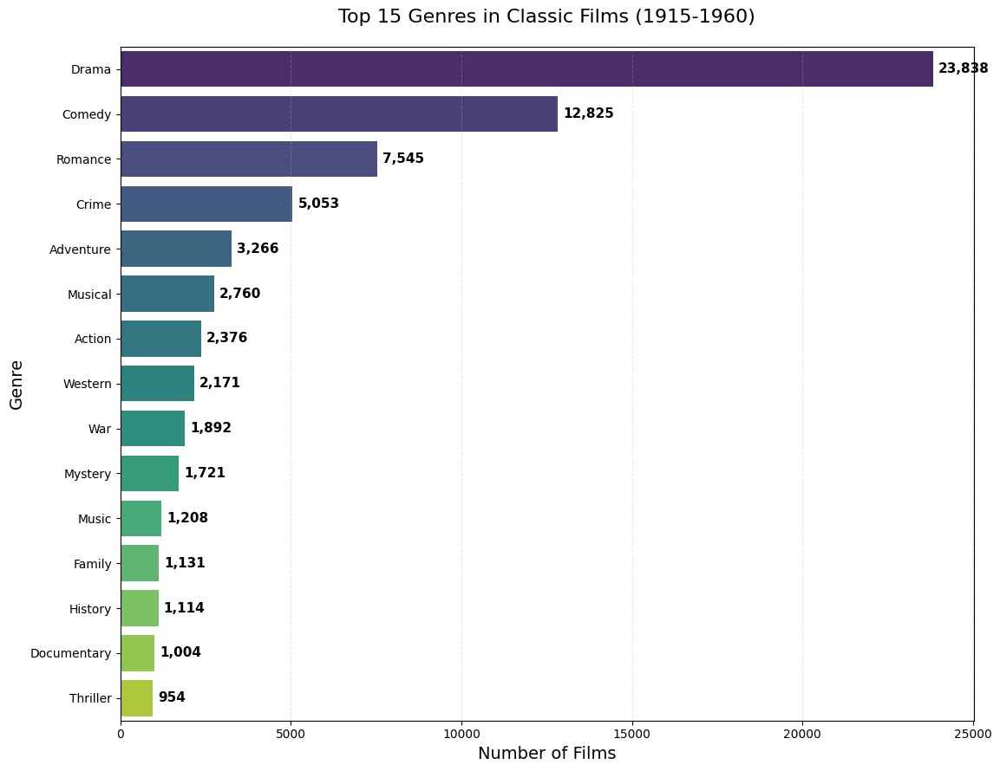

Top 15 genre distribution visualized.

--- EDA: Runtime Distribution ---


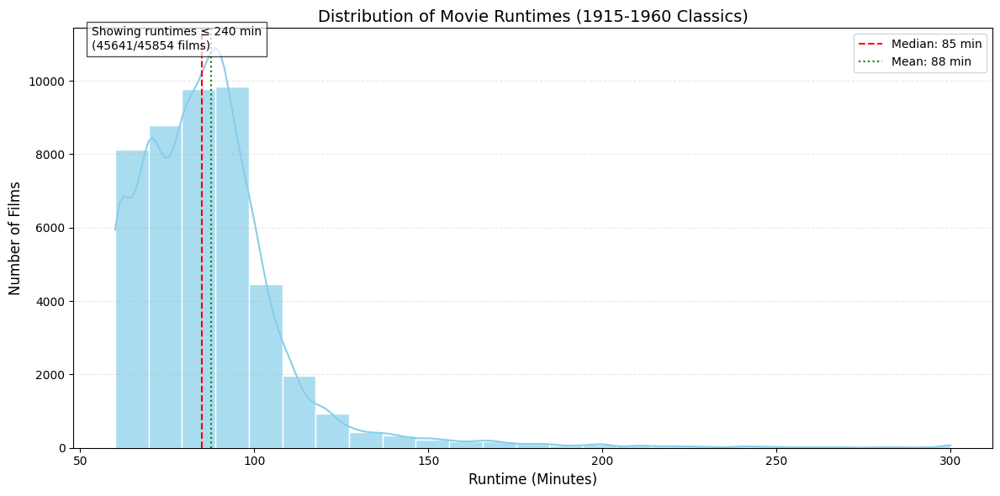

Runtime distribution visualized (excluding extreme outliers).

--- EDA: Films per Year ---


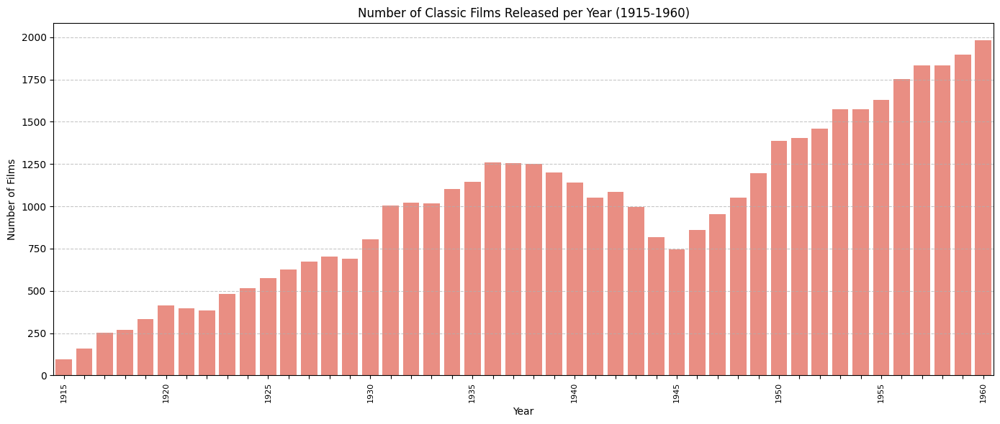

Film count per year visualized.

Cleaning up memory...
Memory cleaned.

--- End of section 2.2.1 ---


In [10]:
print("\n### 2.2.1: Load and Process Movie Information (`title.basics`) & Exploratory Data Analysis (EDA) ###")

# Define required columns for title.basics 
title_basics_cols = ['tconst', 'titleType', 'primaryTitle', 'originalTitle',                    'isAdult', 'startYear', 'runtimeMinutes', 'genres'] 

# Load title.basics dataset 
print("Loading and processing title.basics.tsv.gz...")
title_basics = load_imdb_dataset("title.basics.tsv.gz", usecols=title_basics_cols)

if title_basics is not None:
    # --- Verify Initial Data Types ---
    print("\nVerifying initial data types (conversion attempted during load)...")
    try:
        # Ensure required columns for filtering are numeric
        for col in ['startYear', 'runtimeMinutes', 'isAdult']:
            if not pd.api.types.is_numeric_dtype(title_basics[col]):
                print(f"Attempting conversion for {col}...")
                title_basics[col] = pd.to_numeric(title_basics[col], errors='coerce')
                if title_basics[col].isnull().any():
                    print(f"Warning: Coercion introduced NaNs in {col}.")
        print("Required numeric columns verified/converted.")
    except Exception as e:
        print(f"Error during type verification/conversion: {e}")
        title_basics = None # Stop processing if types are wrong

if title_basics is not None:
    # --- Filtering ---
    print("\nFiltering to classic films (1915-1960)...")
    initial_count = len(title_basics)

    # Create boolean masks for filtering
    is_movie_mask = title_basics['titleType'] == 'movie'
    # Ensure comparisons happen on numeric types, handle potential NaNs from loading/coercion
    start_year_numeric = pd.to_numeric(title_basics['startYear'], errors='coerce')
    runtime_minutes_numeric = pd.to_numeric(title_basics['runtimeMinutes'], errors='coerce')
    is_adult_numeric = pd.to_numeric(title_basics['isAdult'], errors='coerce')

    is_in_year_range_mask = (start_year_numeric >= 1915) & (start_year_numeric <= 1960)
    is_not_adult_mask = is_adult_numeric == 0
    has_valid_runtime_mask = runtime_minutes_numeric >= 60

    # Combine masks - Treat NaNs in filtering criteria as False
    combined_mask = (
        is_movie_mask &
        is_in_year_range_mask.fillna(False) &
        is_not_adult_mask.fillna(False) & # Explicitly treat NaN isAdult as not meeting the criteria (safer)
        has_valid_runtime_mask.fillna(False)
    )

    title_basics = title_basics.loc[combined_mask].copy() # Use .loc for boolean indexing and .copy()

    final_count = len(title_basics)
    if initial_count > 0:
        print(f"Filtering complete. Retained {final_count} films ({final_count / initial_count:.1%} of initial records).")
    else:
        print(f"Filtering complete. Retained {final_count} films (initial count was zero).")


    # --- Post-filtering Type Conversion and Column Dropping ---
    if not title_basics.empty:
        print("\nApplying final type conversions and dropping columns...")
        try:
            # Drop isAdult column as filtering is done
            if 'isAdult' in title_basics.columns:
                title_basics.drop(columns=['isAdult'], inplace=True)
                print("- 'isAdult' column dropped.")

            # Convert startYear to Nullable Integer
            if 'startYear' in title_basics.columns:
                # Filtering should have removed NaNs, but check just in case
                if title_basics['startYear'].isnull().any():
                    print("Warning: NaNs found in 'startYear' after filtering. Dropping these rows before Int conversion.")
                    title_basics.dropna(subset=['startYear'], inplace=True)
                if not title_basics.empty:
                    title_basics['startYear'] = title_basics['startYear'].astype(pd.Int64Dtype())
                    print(f"- 'startYear' converted to {title_basics['startYear'].dtype}.")

            # Convert runtimeMinutes to Nullable Integer
            if 'runtimeMinutes' in title_basics.columns:
                if title_basics['runtimeMinutes'].isnull().any():
                    print("Warning: NaNs found in 'runtimeMinutes' after filtering. Dropping these rows before Int conversion.")
                    title_basics.dropna(subset=['runtimeMinutes'], inplace=True)
                if not title_basics.empty:
                    title_basics['runtimeMinutes'] = title_basics['runtimeMinutes'].astype(pd.Int64Dtype())
                    print(f"- 'runtimeMinutes' converted to {title_basics['runtimeMinutes'].dtype}.")

        except Exception as e:
            print(f"Error during final type conversion/dropping: {e}")

    # --- Display Cleaned Data Sample ---
    if not title_basics.empty:
        # Re-check columns after potential drops/conversions
        print("\nDisplaying sample of final processed data:")
        display_dataset_sample("title_basics (processed classics)", title_basics)
    else:
        print("No movies remained after filtering and final processing.")

    # --- EDA: Genre Distribution ---
    if not title_basics.empty and 'genres' in title_basics.columns:
        print("\n--- EDA: Genre Distribution ---")
        # (Genre EDA code remains the same as before)
        genres_series = title_basics['genres'].dropna()
        all_genres = genres_series.str.split(',').explode().str.strip()
        all_genres = all_genres[~all_genres.isin(['\\N', 'N', ''])]
        genre_counts = all_genres.value_counts()

        if not genre_counts.empty:
            N_GENRES = 15
            print(f"\nTop {N_GENRES} Genres in Classic Films (1915-1960):")
            print(genre_counts.head(N_GENRES))
            try:
                plt.figure(figsize=(12, 9))  # Increase height for better spacing
                top_genres_data = genre_counts.head(N_GENRES)

                # Create colormap based on frequency
                colors = plt.cm.viridis(np.linspace(0.1, 0.9, len(top_genres_data)))

                # Plot with better formatting
                ax = sns.barplot(x=top_genres_data.values, y=top_genres_data.index, hue=top_genres_data.index,
                                palette=colors, dodge=False)

                # Enhance title and labels
                plt.title('Top 15 Genres in Classic Films (1915-1960)', fontsize=16, pad=20)
                plt.xlabel('Number of Films', fontsize=14)
                plt.ylabel('Genre', fontsize=14)

                # Format the bars
                for i, bar in enumerate(ax.patches):
                    ax.text(bar.get_width() + 150,  # Add more space between bar and text
                            bar.get_y() + bar.get_height()/2,
                            f'{int(bar.get_width()):,}',  # Format with commas
                            ha='left', va='center',
                            fontsize=11, fontweight='bold')

                # Add subtle grid
                plt.grid(axis='x', linestyle='--', alpha=0.3)

                # Adjust layout
                plt.tight_layout()
                plt.subplots_adjust(left=0.15)  # Add more left margin for genre labels
                plt.show()
                print(f"Top {N_GENRES} genre distribution visualized.")
            except Exception as e:
                print(f"Could not generate genre plot: {e}")
        else:
            print("No valid genre data found after cleaning.")
    else:
        print("Filtered dataset is empty or 'genres' column is missing/empty for EDA.")

    # --- EDA: Runtime Distribution ---
    if not title_basics.empty and 'runtimeMinutes' in title_basics.columns:
        print("\n--- EDA: Runtime Distribution ---")
        runtimes = title_basics['runtimeMinutes'].dropna() # Should be Integer now
        if not runtimes.empty:
            try:
                plt.figure(figsize=(12, 6))
                # Filter out extreme outliers for visualization
                runtime_filtered = runtimes[runtimes <= 300]  # Cap at 5 hours (300 min)
                sns.histplot(runtime_filtered, bins=25, kde=True, color='skyblue', edgecolor='white', alpha=0.7)
                plt.title('Distribution of Movie Runtimes (1915-1960 Classics)', fontsize=14)
                plt.xlabel('Runtime (Minutes)', fontsize=12)
                plt.ylabel('Number of Films', fontsize=12)
                median_runtime = runtime_filtered.median()
                mean_runtime = runtime_filtered.mean()
                plt.axvline(median_runtime, color='red', linestyle='dashed', linewidth=1.5, 
                            label=f'Median: {median_runtime:.0f} min')
                plt.axvline(mean_runtime, color='green', linestyle='dotted', linewidth=1.5,
                            label=f'Mean: {mean_runtime:.0f} min')
                plt.legend(fontsize=10)
                plt.grid(axis='y', linestyle='--', alpha=0.3)
                # Add text annotation showing data range
                plt.text(0.02, 0.95, f"Showing runtimes ≤ 240 min\n({(runtimes <= 240).sum()}/{len(runtimes)} films)",
                        transform=plt.gca().transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.7))
                plt.tight_layout()
                plt.show()
                print("Runtime distribution visualized (excluding extreme outliers).")
            except Exception as e:
                print(f"Could not generate runtime plot: {e}")
        else:
            print("No valid runtime data found.")

    # --- EDA: Films per Year ---
    if not title_basics.empty and 'startYear' in title_basics.columns:
        print("\n--- EDA: Films per Year ---")
        year_counts = title_basics['startYear'].dropna().astype(int).value_counts().sort_index()
        if not year_counts.empty:
            try:
                plt.figure(figsize=(14, 6))
                sns.barplot(x=year_counts.index, y=year_counts.values, color='salmon')
                plt.title('Number of Classic Films Released per Year (1915-1960)')
                plt.xlabel('Year')
                plt.ylabel('Number of Films')
                plt.xticks(rotation=90, fontsize=8)
                # Show labels only every few years to avoid overlap
                for index, label in enumerate(plt.gca().get_xticklabels()):
                    if index % 5 != 0:
                        label.set_visible(False)
                plt.grid(axis='y', linestyle='--', alpha=0.7)
                plt.tight_layout()
                plt.show()
                print("Film count per year visualized.")
            except Exception as e:
                print(f"Could not generate year count plot: {e}")
        else:
            print("No valid start year data found.")

    # --- Clean up Memory ---
    print("\nCleaning up memory...")
    gc.collect()
    print("Memory cleaned.")

else:
    print("Failed to load or process title.basics.tsv.gz correctly. Cannot proceed.")
    
print("\n--- End of section 2.2.1 ---")

**Preliminary Analysis Summary:**

The EDA performed in this section revealed key characteristics of the filtered classic film dataset (1915-1960). The genre analysis indicated that **Drama** and **Comedy** are by far the most dominant genres, followed by **Romance** and **Crime**. The runtime distribution showed a peak around the typical feature length (approx. 85-90 minutes), with a right skew towards longer films, although extreme outliers were relatively rare. The visualization of films released per year demonstrated a general upward trend in production volume across the period, albeit with fluctuations potentially corresponding to historical events like World War II (visible as a dip in the mid-1940s in the example plot). These initial findings provide essential context for subsequent, more complex analyses.

**Code Execution Prerequisites:**

* The code block performing the **Data Path Setup and File Verification** must have been executed successfully beforehand.
* The global variable `GOOGLE_DRIVE_PATH` must be correctly set to the directory containing the downloaded IMDb data.
* The file `title.basics.tsv.gz` must exist within the specified `GOOGLE_DRIVE_PATH`.
* The helper functions `load_imdb_dataset` and `display_dataset_sample`, defined in the "Setup and Imports" section, must be available in the notebook's execution environment.

Executing this code block will load, process, and visualize the foundational movie title data, preparing the `title_basics` DataFrame for the next stages of the analysis pipeline.

#### 2.2.2 `title.akas`: Alternative Titles & Regional Information & EDA

This processing step focuses on the `title.akas.tsv.gz` dataset file. The term "AKAs" stands for "Also Known As." This dataset is crucial as it catalogues alternative titles used for films across different geographic regions and languages (e.g., a French title for a Hollywood film released in France). It also provides associated attributes like region codes (following ISO 3166-1, e.g., 'US', 'GB'), language codes (ISO 639, e.g., 'en', 'fr'), and types indicating the nature of the title (e.g., 'imdbDisplay', 'original', 'festival').

**Purpose:**

Processing this dataset serves multiple essential objectives for the project:

* **Data Enrichment & Search Enhancement:** Incorporating these alternative titles is vital for building a more robust and comprehensive search functionality later. It allows users to locate films using titles specific to certain regions or languages, which may be how they primarily know the film.
* **Contextual Understanding of Distribution:** Analyzing the regions and languages associated with AKAs offers valuable, albeit incomplete, insights into the potential international distribution patterns, marketing localization strategies, and linguistic reach of films originating from the 1915-1960 era.
* **Feature Engineering Potential:** The structured information within this file, such as the sheer count of alternative titles per movie, the number of unique regions or languages associated with a title, or flags indicating presence in specific key markets (like the US), can be engineered into quantitative features. These features might capture aspects of a film's international profile and could be leveraged in subsequent modeling tasks (as explored in section 2.3.2).

**Code Explanation:**

The associated code block systematically loads, filters, cleans, and performs initial exploratory analysis on the `title.akas` data through the following sequence:

1.  **Prerequisite Check:** The code first ensures that the `title_basics` DataFrame, containing the filtered list of classic movies (`tconst` identifiers) from the previous step (2.2.1), is available and populated. This is essential because the `tconst` values are used to filter the AKAs data effectively.
2.  **Data Loading:** The `load_imdb_dataset` helper function is employed to load only the specified, relevant columns from the compressed `title.akas.tsv.gz` file, utilizing memory optimization techniques during the load process.
3.  **AKA Filtering:** A critical filtering operation is performed. The loaded `title.akas` data is filtered to retain *only* those records where the `titleId` (which corresponds to `tconst` in other files) is present in the set of classic movie IDs derived from the filtered `title_basics`. This step is crucial for focusing the analysis solely on alternative titles relevant to the 1915-1960 feature film cohort, significantly reducing the dataset's size to relevant entries.
4.  **Data Cleaning and Type Conversion:** Several data cleaning actions are executed to standardize the data for analysis:
    * The `isOriginalTitle` column, indicating if the AKA entry represents the original title, is converted to a nullable Boolean type (`pd.BooleanDtype`) for accurate logical representation, after first attempting numeric conversion to handle potential '0'/'1' values robustly.
    * Key textual columns that might contain missing information (`region`, `language`, `types`, `attributes`) are cleaned. Various missing value indicators commonly found in IMDb data (the literal string `\\N`, the string `'N'`, standard `numpy.nan`, empty strings) are replaced with a consistent string marker: 'Undefined'. Subsequently, these columns are explicitly converted to the pandas `string` dtype for consistent handling during analysis and plotting.
5.  **Sample Display:** A sample (the first few rows) of the cleaned and filtered `title_akas` DataFrame is displayed using the `display_dataset_sample` helper function, allowing for visual verification of the filtering and cleaning steps.
6.  **Exploratory Data Analysis (EDA):** Initial visualizations are generated using `matplotlib` and `seaborn` to understand the characteristics of the alternative titles associated with the classic films:
    * **Region Distribution:** A horizontal bar chart visualizes the frequency count of the top 20 most common regions found in the `region` column. *This plot was chosen to gain an understanding of the geographic locations for which alternative titles are most frequently recorded in the dataset, potentially indicating primary distribution markets or areas with better data coverage.* The 'Undefined' category is explicitly included and visually distinct (e.g., colored gray) to highlight the significant portion of entries lacking specific regional data.The ISO 3166-1 standard provides internationally recognized codes for country names and their subdivisions, which are used in the region column (e.g., 'US' for the United States, 'GB' for the United Kingdom) (ISO, n.d.-b).
    * **Language Distribution:** Similarly, a horizontal bar chart displays the distribution for the top 15 languages associated with alternative titles. *This plot aims to reveal the linguistic landscape represented by the alternative titles, identifying dominant languages beyond the original production language.* Again, 'Undefined' is shown separately. The ISO 639 standard defines language codes (e.g., 'en' for English, 'fr' for French), ensuring consistency in representing linguistic variations (ISO, n.d.-a).
    * **Original Title Flag Distribution:** A pie chart illustrates the proportion of AKA entries flagged as the `isOriginalTitle` versus those that represent alternative titles within this filtered dataset. *This visualization provides immediate context on the composition of the AKAs file for the studied films – confirming that most entries are indeed alternative versions.*
    * Summary statistics derived from the counts (e.g., total unique regions/languages found, counts and percentages for 'Undefined') are printed alongside the plots to provide quantitative context.
7.  **Memory Management:** `gc.collect()` is invoked to encourage the release of memory consumed by intermediate objects during processing. The code includes a comment noting that the resulting `title_akas` DataFrame is likely needed for subsequent steps (feature engineering, search) and thus is not deleted at this stage.

In [11]:
# Requires the 'title_basics' dataframe filtered in the previous step (2.2.1) to be available
print("\n### 2.2.2: `title.akas`: Alternative Titles & Regional Information & EDA ###")

# Defining constants
N_TOP_REGIONS = 20
N_TOP_LANGUAGES = 15

# Check if the prerequisite title_basics DataFrame exists and is not empty
if 'title_basics' in globals() and not title_basics.empty:
    # Define required columns for title.akas
    title_akas_cols = ['titleId', 'ordering', 'title', 'region','language', 'types', 'attributes', 'isOriginalTitle']
    
    # Load title.akas dataset
    print("Loading title.akas.tsv.gz...")
    title_akas = load_imdb_dataset("title.akas.tsv.gz", usecols=title_akas_cols)

    if title_akas is not None:
        initial_count_akas = len(title_akas)
        print(f"Loaded {initial_count_akas:,} records from title.akas.")

        # --- Filtering ---
        print("\nFiltering AKAs to match classic films (1915-1960)...")
        
        # Get the set of valid tconst IDs from the filtered title_basics
        classic_movie_ids = set(title_basics['tconst'])
        
        # Filter title_akas based on these IDs
        akas_filtered_mask = title_akas['titleId'].isin(classic_movie_ids)
        title_akas = title_akas[akas_filtered_mask].copy()
        
        final_count_akas = len(title_akas)
        if initial_count_akas > 0:
            print(f"Filtering complete. Retained {final_count_akas:,} AKAs corresponding to classic films ({final_count_akas / initial_count_akas:.1%}).")
        else:
            print(f"Filtering complete. Retained {final_count_akas:,} AKAs (initial count was zero).")

        # --- Data Cleaning & Type Conversion ---
        if not title_akas.empty:
            print("\nCleaning and converting types for title.akas...")
            try:
                # Convert isOriginalTitle to boolean
                if 'isOriginalTitle' in title_akas.columns:
                    title_akas['isOriginalTitle'] = pd.to_numeric(title_akas['isOriginalTitle'], errors='coerce')
                    # Check if conversion worked before changing type
                    if pd.api.types.is_numeric_dtype(title_akas['isOriginalTitle']):
                        title_akas['isOriginalTitle'] = title_akas['isOriginalTitle'].astype(pd.BooleanDtype())
                        print(f"- 'isOriginalTitle' converted to {title_akas['isOriginalTitle'].dtype}.")
                    else:
                        print("Warning: Failed to convert 'isOriginalTitle' to numeric first.")

                # Convert missing values to 'Undefined' for text columns
                for col in ['region', 'language', 'types', 'attributes']:
                    if col in title_akas.columns:
                        # Replace IMDb missing indicators and empty strings
                        title_akas[col] = title_akas[col].astype(str).replace(['\\N', 'N', '', np.nan], 'Undefined')
                        # Convert to string type to handle potential mixed types smoothly
                        title_akas[col] = title_akas[col].astype('string')
                        print(f"- Cleaned and converted '{col}' to string type (with 'Undefined' for missing values).")

            except Exception as e:
                print(f"Error during AKAs type conversion/cleaning: {e}")

        # --- Display Cleaned Data Sample ---
        if not title_akas.empty:
            print("\nDisplaying sample of final processed AKAs data:")
            display_dataset_sample("title_akas (processed classics)", title_akas)
        else:
            print("\nNo AKAs data remained after filtering.")

        # --- EDA: Alternative Title Regions (Plotly)---
        if not title_akas.empty and 'region' in title_akas.columns:
            print("\n--- EDA: Distribution of Alternative Titles by Region (Top 20) ---")
            region_counts = title_akas['region'].value_counts()
            if not region_counts.empty:
                top_regions_data = region_counts.head(N_TOP_REGIONS).reset_index()
                top_regions_data.columns = ['Region', 'Count']

                try:
                    fig_regions = px.bar(top_regions_data,
                                        x='Count',
                                        y='Region',
                                        orientation='h',
                                        title=f'Distribution of Alternative Titles by Region (Top {N_TOP_REGIONS})',
                                        labels={'Region': 'Region Code (ISO 3166-1 alpha-2)', 'Count': 'Number of Alternative Titles'},
                                        text='Count', # Display count on bars
                                        height=600, # Adjust height as needed
                                        color='Count', # Color bars by count
                                        color_continuous_scale=px.colors.sequential.Plasma, # Set color scale
                                        hover_name='Region', # Show region name on hover
                                        hover_data={'Count':':,'} # Format count on hover
                                        )
                    fig_regions.update_layout(
                        yaxis={'categoryorder':'total ascending'}, # Show most frequent at top
                        xaxis_title="Number of Alternative Titles",
                        yaxis_title="Region Code",
                        coloraxis_showscale=False, # Hide the color scale bar
                        title_x=0.5,
                        annotations=[
                            dict(
                                text="Note: 'Undefined' represents entries where region was not specified in the source data.",
                                showarrow=False,
                                xref="paper", yref="paper",
                                x=0.5, y=-0.1, # Adjust position as needed
                                xanchor='center', yanchor='top', font=dict(size=10, style='italic')
                            )
                        ],
                        margin=dict(b=50) # Add bottom margin for note
                    )
                    fig_regions.update_traces(texttemplate='%{text:,}', textposition='outside') # Format text labels
                    fig_regions.show()

                    # Print summary stats (same as before)
                    undefined_count = region_counts.get('Undefined', 0)
                    total_count = region_counts.sum()
                    undefined_pct = (undefined_count / total_count) * 100 if total_count > 0 else 0
                    print(f"Region distribution summary:")
                    print(f"- Total unique defined regions found: {len(region_counts) - (1 if 'Undefined' in region_counts else 0)}")
                    print(f"- Entries with 'Undefined' region: {undefined_count:,} ({undefined_pct:.1f}%)")
                    # Find most common *defined* region if 'Undefined' is first
                    most_common_defined = region_counts.drop('Undefined', errors='ignore').index[0] if not region_counts.drop('Undefined', errors='ignore').empty else 'N/A'
                    most_common_defined_count = region_counts.drop('Undefined', errors='ignore').iloc[0] if not region_counts.drop('Undefined', errors='ignore').empty else 0
                    print(f"- Most common defined region: {most_common_defined} with {most_common_defined_count:,} titles")

                except Exception as e:
                    print(f"Could not generate region plot: {e}")
                    traceback.print_exc()
            else:
                print("No valid region data found after cleaning.")
        else:
            print("Filtered AKAs dataset is empty or 'region' column missing for EDA.")


        # --- EDA: Alternative Title Languages (Plotly)---
        if not title_akas.empty and 'language' in title_akas.columns:
            print("\n--- EDA: Distribution of Alternative Titles by Language (Top 15) ---")
            language_counts = title_akas['language'].value_counts()
            if not language_counts.empty:
                top_languages_data = language_counts.head(N_TOP_LANGUAGES).reset_index()
                top_languages_data.columns = ['Language', 'Count']

                try:
                    fig_langs = px.bar(top_languages_data,
                                    x='Count',
                                    y='Language',
                                    orientation='h',
                                    title=f'Distribution of Alternative Titles by Language (Top {N_TOP_LANGUAGES})',
                                    labels={'Language': 'Language Code (ISO 639)', 'Count': 'Number of Alternative Titles'},
                                    text='Count',
                                    height=600,
                                    color='Count',
                                    color_continuous_scale=px.colors.sequential.Magma, # Different color scale
                                    hover_name='Language',
                                    hover_data={'Count':':,'}
                                    )
                    fig_langs.update_layout(
                        yaxis={'categoryorder':'total ascending'},
                        xaxis_title="Number of Alternative Titles",
                        yaxis_title="Language Code",
                        coloraxis_showscale=False,
                        title_x=0.5,
                        annotations=[
                            dict(
                                text="Note: 'Undefined' represents entries where language was not specified in the source data.",
                                showarrow=False,
                                xref="paper", yref="paper",
                                x=0.5, y=-0.1,
                                xanchor='center', yanchor='top', font=dict(size=10, style='italic')
                            )
                        ],
                        margin=dict(b=50)
                    )
                    fig_langs.update_traces(texttemplate='%{text:,}', textposition='outside')
                    fig_langs.show()

                    # Print summary stats (same as before)
                    undefined_count = language_counts.get('Undefined', 0)
                    total_count = language_counts.sum()
                    undefined_pct = (undefined_count / total_count) * 100 if total_count > 0 else 0
                    print(f"Language distribution summary:")
                    print(f"- Total unique defined languages found: {len(language_counts) - (1 if 'Undefined' in language_counts else 0)}")
                    print(f"- Entries with 'Undefined' language: {undefined_count:,} ({undefined_pct:.1f}%)")
                    most_common_defined_lang = language_counts.drop('Undefined', errors='ignore').index[0] if not language_counts.drop('Undefined', errors='ignore').empty else 'N/A'
                    most_common_defined_lang_count = language_counts.drop('Undefined', errors='ignore').iloc[0] if not language_counts.drop('Undefined', errors='ignore').empty else 0
                    print(f"- Most common defined language: {most_common_defined_lang} with {most_common_defined_lang_count:,} titles")

                except Exception as e:
                    print(f"Could not generate language plot: {e}")
                    traceback.print_exc()
            else:
                print("No valid language data found after cleaning.")
        else:
            print("Filtered AKAs dataset is empty or 'language' column missing for EDA.")


        # --- EDA: Distribution by Original Title Flag (Plotly) ---
        if not title_akas.empty and 'isOriginalTitle' in title_akas.columns:
            print("\n--- EDA: Distribution of Original vs. Alternative Titles ---")
            try:
                # Use boolean representation for clarity if possible
                title_akas['isOriginalTitle'] = title_akas['isOriginalTitle'].astype(bool)
                original_counts = title_akas['isOriginalTitle'].value_counts().reset_index()
                original_counts.columns = ['Is Original Title', 'Count']
                # Map boolean to more readable labels
                original_counts['Label'] = original_counts['Is Original Title'].map({True: 'Original Title', False: 'Alternative Title'})

                fig_pie = px.pie(original_counts,
                                values='Count',
                                names='Label',
                                title='Distribution of Original vs. Alternative Titles',
                                hole=0.3, # Optional: creates a donut chart
                                color_discrete_sequence=px.colors.qualitative.Pastel) # Set colors

                fig_pie.update_traces(textposition='inside', textinfo='percent+label+value')
                fig_pie.update_layout(title_x=0.5, showlegend=True)
                fig_pie.show()

                # Print summary stats (already calculated for pie chart)
                total = original_counts['Count'].sum()
                orig_count = original_counts.loc[original_counts['Is Original Title'] == True, 'Count'].iloc[0] if True in original_counts['Is Original Title'].values else 0
                alt_count = original_counts.loc[original_counts['Is Original Title'] == False, 'Count'].iloc[0] if False in original_counts['Is Original Title'].values else 0
                print(f"Original/Alternative title distribution summary:")
                print(f"- Original titles: {orig_count:,} ({orig_count/total*100:.1f}%)")
                print(f"- Alternative titles: {alt_count:,} ({alt_count/total*100:.1f}%)")

            except Exception as e:
                print(f"Could not generate original vs. alternative titles plot: {e}")
                traceback.print_exc()
        else:
            print("Filtered AKAs dataset is empty or 'isOriginalTitle' column missing for EDA.")

        # --- Clean up Memory ---
        print("\nCleaning up memory...")
        # Keep title_akas if needed later, otherwise uncomment below
        # del title_akas
        gc.collect()
        print("Memory cleaned.")

    else:
        print("Failed to load title.akas.tsv.gz correctly.")
else:
    print("Prerequisite 'title_basics' DataFrame not found or is empty. Cannot process title.akas.")
print("\n---End of section 2.2.2 ---")


### 2.2.2: `title.akas`: Alternative Titles & Regional Information & EDA ###
Loading title.akas.tsv.gz...
Loading title.akas.tsv.gz...
Initial load successful for title.akas.tsv.gz (51793160 rows). Optimizing types...
  Processing 'titleId' (object): obj(high_card)
  Processing 'ordering' (int64): int->int16
  Processing 'title' (object): obj(high_card)
  Processing 'region' (object): cat(low_card)
  Processing 'language' (object): cat(low_card)
  Processing 'types' (object): cat(low_card)
  Processing 'attributes' (object): cat(low_card)

Type optimization complete for title.akas.tsv.gz.
Loaded 51,793,160 records from title.akas.

Filtering AKAs to match classic films (1915-1960)...
Filtering complete. Retained 386,864 AKAs corresponding to classic films (0.7%).

Cleaning and converting types for title.akas...
- 'isOriginalTitle' converted to boolean.
- Cleaned and converted 'region' to string type (with 'Undefined' for missing values).
- Cleaned and converted 'language' to string ty

,titleId,ordering,title,region,language,types,attributes,isOriginalTitle
7538,tt0002423,1,Madame DuBarry,Undefined,Undefined,original,Undefined,True
7539,tt0002423,10,Passion,US,Undefined,imdbDisplay,Undefined,False
7540,tt0002423,11,Kungens Mätress,SE,Undefined,imdbDisplay,Undefined,False
7541,tt0002423,12,La Du Barry,FR,Undefined,Undefined,reissue title,False
7542,tt0002423,13,Madame du Barry,FR,Undefined,alternative,Undefined,False
7543,tt0002423,14,Madame Dubarry,HU,Undefined,imdbDisplay,Undefined,False
7544,tt0002423,15,Madame Dubarry - Kuninkaan jalkavaimo,FI,Undefined,imdbDisplay,Undefined,False
7545,tt0002423,16,Мадам ДюБари,BG,bg,imdbDisplay,Undefined,False
7546,tt0002423,17,Мадам ДюБарри,RU,Undefined,imdbDisplay,Undefined,False
7547,tt0002423,18,パッション,JP,ja,imdbDisplay,Undefined,False


Shape: (386864, 8)
Memory usage: 136.03 MB

--- EDA: Distribution of Alternative Titles by Region (Top 20) ---


Region distribution summary:
- Total unique defined regions found: 127
- Entries with 'Undefined' region: 49,578 (12.8%)
- Most common defined region: US with 33,817 titles

--- EDA: Distribution of Alternative Titles by Language (Top 15) ---


Language distribution summary:
- Total unique defined languages found: 67
- Entries with 'Undefined' language: 310,449 (80.2%)
- Most common defined language: en with 23,685 titles

--- EDA: Distribution of Original vs. Alternative Titles ---


Original/Alternative title distribution summary:
- Original titles: 45,835 (11.8%)
- Alternative titles: 341,029 (88.2%)

Cleaning up memory...
Memory cleaned.

---End of section 2.2.2 ---


**Preliminary Analysis Summary:**

The exploratory analysis of the `title.akas` data for the 1915-1960 film cohort yielded notable observations. A substantial fraction of alternative title entries lacked specific region or language information, categorized as 'Undefined'. This high number of 'Undefined' entries might reflect not only limitations or gaps in the IMDb source data curation for this historical period but potentially also the reality of incomplete historical records or the unfortunate loss of many early films (see, e.g., [Wikimedia Category: Lost films](https://commons.wikimedia.org/wiki/Category:Lost_films), [Lost Films Database](https://www.lost-films.eu/))(Wikimedia Commons, n.d.; Lost Films EU, n.d.). Among the defined regions, the **United States (US)** and **United Kingdom (GB)** were frequently listed, alongside several European nations (**France (FR), Germany (DE), Italy (IT), Spain (ES)**) and others like **Brazil (BR)** and **Japan (JP)**. This suggests these were common territories for which alternative titles were registered or tracked. Similarly, while 'Undefined' dominated the language field, **English (en)** was the most common specified language, followed by others like **Japanese (ja)**, **French (fr)**, and **German (de)**. Furthermore, the analysis confirmed that the overwhelming majority (approximately 88%) of the relevant entries in the `title.akas` file represent alternative titles, not the original ones. These findings underscore the international dimension of some classic films while also pointing to data completeness challenges for historical analysis.

**Code Execution Prerequisites:**

* The code block for section 2.2.1 (`title.basics` processing) must have been executed successfully prior to running this block.
* The `title_basics` DataFrame variable, containing the filtered classic movie data including the `tconst` column, must exist in the notebook's current execution environment.
* The helper functions `load_imdb_dataset` and `display_dataset_sample`, defined in the "Setup and Imports" section, must be available.
* The necessary libraries (`pandas`, `numpy`, `matplotlib.pyplot`, `seaborn`, `gc`, `traceback`, `re`) must have been imported.
* The specific dataset file `title.akas.tsv.gz` must be located within the directory specified by the `GOOGLE_DRIVE_PATH` variable.

Executing this code block successfully processes the alternative title information, performs the initial EDA described, and ensures the cleaned `title_akas` DataFrame is ready for subsequent use in feature engineering and enhancing the movie search functionality.

#### 2.2.3 `title.ratings`: Processing Ratings, Votes & EDA

**Purpose:**

This step integrates audience reception data into the analysis by processing the `title.ratings.tsv.gz` file from IMDb. This file provides two key metrics: the average user rating (`averageRating`) and the total number of user votes (`numVotes`) received by each title. Incorporating these metrics is essential for understanding the perceived quality and popularity of films within the classic era (1915-1960). This information is frequently utilized in comparative analyses and serves as a potential feature for recommendation systems.

**Code Explanation:**

The code block executes a sequence of operations to load, filter, merge, and analyze the ratings data:

1.  **Data Loading:** The process begins by loading only the necessary columns (`tconst`, `averageRating`, `numVotes`) from the `title.ratings.tsv.gz` file using the memory-efficient `load_imdb_dataset` helper function. A sample of the raw loaded data is displayed for initial inspection.
2.  **Dependency Check & Filtering:** It verifies the existence of the `title_basics` DataFrame (created in section 2.2.1), which contains the `tconst` identifiers for the target cohort of classic films. The loaded `title_ratings` data is then filtered, retaining only those rating entries whose `tconst` matches an identifier in the `title_basics` DataFrame. The number and percentage of ratings retained after filtering are reported. A sample of the filtered ratings data is also displayed.
3.  **Data Merging:** A crucial step involves performing an `inner` merge between the filtered `title_basics` DataFrame and the filtered `title_ratings` DataFrame. The merge is performed on the common `tconst` column. This operation creates the primary analysis DataFrame for this stage, named `classic_movies`, which consolidates the core metadata (title, year, runtime, genres) with the corresponding audience reception data (rating, votes) for the classic films present in *both* datasets. A sample of this merged DataFrame is displayed.
4.  **Exploratory Data Analysis (EDA) on Merged Data:** Once merged, the code performs EDA specifically on the newly added `averageRating` and `numVotes` columns within the `classic_movies` DataFrame:
    * **Descriptive Statistics:** Basic summary statistics (mean, median, minimum, maximum) are calculated and printed for both `averageRating` and `numVotes` to provide a quantitative overview.
    * **Rating Distribution:** A histogram (`seaborn.histplot`) visualizes the distribution of `averageRating`. *This plot is chosen to understand the typical range and central tendency of user ratings for classic films, identifying if the distribution is normal or skewed.* Lines indicating the mean and median rating are overlaid for reference.
    * **Vote Distribution:** The distribution of `numVotes` is visualized using a histogram. *Recognizing that vote counts often exhibit significant positive skew (many films with few votes, few films with many votes), a logarithmic transformation (`numpy.log1p`, which handles potential zero votes) is applied to the `numVotes` data before plotting.* This transformation makes the underlying distribution shape clearer and more suitable for visualization. The median vote count (on the original scale) is indicated on the log-scaled plot.
    * **Rating vs. Votes Relationship:** A scatter plot (`seaborn.scatterplot`) explores the potential relationship between `averageRating` and `numVotes`. *This visualization helps investigate whether more popular films (higher votes) tend to have higher or lower ratings.* Due to the wide range and skewness of `numVotes`, the y-axis (votes) is set to a logarithmic scale for better visual representation. To manage potential overplotting with many data points, the plot uses transparency (`alpha`) and displays a random sample of the data if the dataset is very large.
5.  **Memory Management:** After the merge creates the `classic_movies` DataFrame, the original `title_basics` and `title_ratings` DataFrames are explicitly deleted using `del`, as their data is now contained within `classic_movies` and they are no longer needed, freeing up significant memory. `gc.collect()` is called to encourage immediate garbage collection.


### 2.2.3 `title.ratings`: Processing Ratings, Votes & EDA ###
Loading and processing title.ratings.tsv.gz...
Loading title.ratings.tsv.gz...
Initial load successful for title.ratings.tsv.gz (1559095 rows). Optimizing types...
  Processing 'tconst' (object): cat(ID)
  Processing 'averageRating' (float64): float->float32
  Processing 'numVotes' (int64): int->int32

Type optimization complete for title.ratings.tsv.gz.

Sample of title_ratings (initial raw):


,tconst,averageRating,numVotes
0,tt0000001,5.7,2147
1,tt0000002,5.5,291
2,tt0000003,6.5,2184
3,tt0000004,5.3,187
4,tt0000005,6.2,2931
5,tt0000006,5.0,210
6,tt0000007,5.3,908
7,tt0000008,5.4,2292
8,tt0000009,5.4,222
9,tt0000010,6.8,7933


Shape: (1559095, 3)
Memory usage: 136.71 MB

Filtering ratings to include only classic films...
Filtering complete. Retained 32718 ratings (2.1% of initial).

Sample of title_ratings (filtered to classics):


,tconst,averageRating,numVotes
1216,tt0002423,6.6,1068
1489,tt0003632,6.0,22
1491,tt0003637,6.2,514
1758,tt0004712,6.1,265
1792,tt0004872,6.6,296
1813,tt0004942,4.4,22
1819,tt0004972,6.1,27385
1820,tt0004974,4.6,33
1826,tt0005005,6.5,35
1842,tt0005061,4.2,52


Shape: (32718, 3)
Memory usage: 119.49 MB

Merging title_basics with ratings...
Merge complete. Resulting 'classic_movies' shape: (32718, 9)

Sample of classic_movies (merged):


,tconst,titleType,primaryTitle,originalTitle,startYear,runtimeMinutes,genres,averageRating,numVotes
0,tt0002423,movie,Passion,Madame DuBarry,1919,113,"Biography,Drama,Romance",6.6,1068
1,tt0003632,movie,Arme Eva,Arme Eva,1916,63,Drama,6.0,22
2,tt0003637,movie,Assunta Spina,Assunta Spina,1915,72,Drama,6.2,514
3,tt0004712,movie,The Undesirable,A tolonc,1915,67,Drama,6.1,265
4,tt0004872,movie,Alias Jimmy Valentine,Alias Jimmy Valentine,1915,65,"Crime,Drama",6.6,296
5,tt0004942,movie,The Battle Cry of Peace,The Battle Cry of Peace,1915,90,Drama,4.4,22
6,tt0004972,movie,The Birth of a Nation,The Birth of a Nation,1915,195,"Drama,War",6.1,27385
7,tt0004974,movie,The Black Box,The Black Box,1915,195,"Drama,Sci-Fi",4.6,33
8,tt0005005,movie,The Broken Coin,The Broken Coin,1915,440,"Adventure,Mystery",6.5,35
9,tt0005061,movie,Carmen,Carmen,1915,60,Drama,4.2,52


Shape: (32718, 9)
Memory usage: 7.16 MB

--- EDA: Ratings and Votes Analysis ---

Ratings distribution stats:
Average rating: 6.15
Median rating: 6.20
Rating range: 1.0 - 9.5

Votes distribution stats:
Average votes: 1227
Median votes: 65
Votes range: 5 - 921455


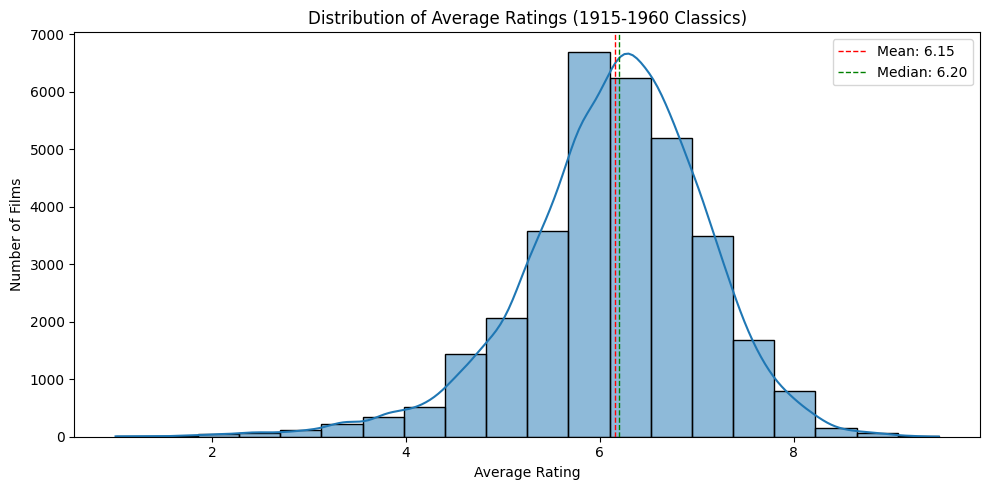

Average rating distribution visualized.


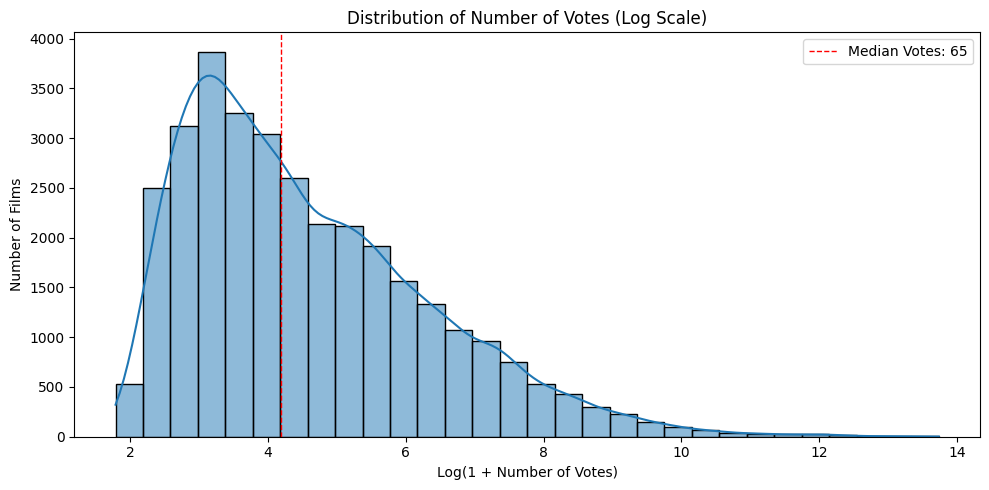

Number of votes distribution (log scale) visualized.


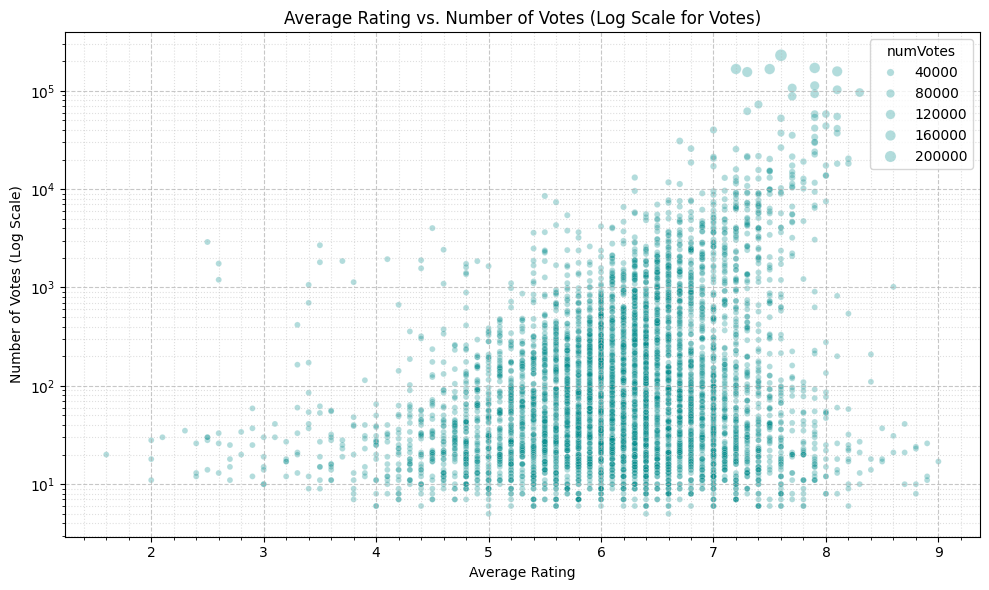

Relationship between average rating and number of votes visualized.

Cleaning up memory...
- 'title_basics' dataframe deleted.
- 'title_ratings' dataframe deleted.
Memory cleaned.

---End of section 2.2.3...---


In [12]:
print("\n### 2.2.3 `title.ratings`: Processing Ratings, Votes & EDA ###")


# Define required columns for title.ratings
title_ratings_cols = ['tconst', 'averageRating', 'numVotes']

# Load title.ratings dataset using the corrected load_imdb_dataset function
print("Loading and processing title.ratings.tsv.gz...")
title_ratings = load_imdb_dataset("title.ratings.tsv.gz", usecols=title_ratings_cols)

# Ensure the previous step successfully created title_basics
if 'title_basics' not in globals() or title_basics is None:
    print("Error: 'title_basics' dataframe not found. Please run the previous cell (2.2.1) successfully.")

    # For now, printing error and stopping this block if title_basics is missing
    title_ratings = None # Indicate failure

if title_ratings is not None and title_basics is not None:
    # Display initial dataset information
    display_dataset_sample("title_ratings (initial raw)", title_ratings)

    # --- Filter ratings to classic movie IDs ---
    print("\nFiltering ratings to include only classic films...")
    initial_ratings_count = len(title_ratings)
    classic_movie_ids = title_basics['tconst'].unique() # Get IDs from the filtered title_basics
    title_ratings = title_ratings[title_ratings['tconst'].isin(classic_movie_ids)].copy() # Use copy
    final_ratings_count = len(title_ratings)
    print(f"Filtering complete. Retained {final_ratings_count} ratings ({final_ratings_count / initial_ratings_count:.1%} of initial).")

    # Display filtered dataset information (optional)
    display_dataset_sample("title_ratings (filtered to classics)", title_ratings)

    # --- Merge title_basics with ratings ---
    print("\nMerging title_basics with ratings...")
    # Use 'inner' merge to keep only movies present in both filtered dataframes
    classic_movies = pd.merge(title_basics, title_ratings, on='tconst', how='inner')
    print(f"Merge complete. Resulting 'classic_movies' shape: {classic_movies.shape}")

    # --- Display Merged Data Sample ---
    if not classic_movies.empty:
        display_dataset_sample("classic_movies (merged)", classic_movies)
    else:
        print("Merge resulted in an empty dataframe. Check filtering steps.")


    # --- EDA on Merged Data ---
    if not classic_movies.empty:
        print("\n--- EDA: Ratings and Votes Analysis ---")

        # Basic Statistics
        print("\nRatings distribution stats:")
        avg_rating = classic_movies['averageRating'].mean()
        median_rating = classic_movies['averageRating'].median()
        min_rating = classic_movies['averageRating'].min()
        max_rating = classic_movies['averageRating'].max()
        print(f"Average rating: {avg_rating:.2f}")
        print(f"Median rating: {median_rating:.2f}")
        print(f"Rating range: {min_rating:.1f} - {max_rating:.1f}")

        print("\nVotes distribution stats:")
        avg_votes = classic_movies['numVotes'].mean()
        median_votes = classic_movies['numVotes'].median()
        min_votes = classic_movies['numVotes'].min()
        max_votes = classic_movies['numVotes'].max()
        print(f"Average votes: {avg_votes:.0f}")
        print(f"Median votes: {median_votes:.0f}")
        print(f"Votes range: {min_votes:.0f} - {max_votes:.0f}")

        # Plot 1: Distribution of Average Ratings (Existing Plot)
        try:
            plt.figure(figsize=(10, 5))
            sns.histplot(classic_movies['averageRating'].dropna(), bins=20, kde=True)
            plt.title('Distribution of Average Ratings (1915-1960 Classics)')
            plt.xlabel('Average Rating')
            plt.ylabel('Number of Films')
            plt.axvline(avg_rating, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {avg_rating:.2f}')
            plt.axvline(median_rating, color='green', linestyle='dashed', linewidth=1, label=f'Median: {median_rating:.2f}')
            plt.legend()
            plt.tight_layout()
            plt.show()
            print("Average rating distribution visualized.")
        except Exception as e:
            print(f"Could not generate average rating plot: {e}")

        # Plot 2: Distribution of Number of Votes (Log Scale) - Enhanced EDA
        try:
            plt.figure(figsize=(10, 5))
            # Use log scale for x-axis as votes distribution is often highly skewed
            # Add 1 to numVotes before log to handle potential zero votes if they exist
            votes_log = np.log1p(classic_movies['numVotes'].dropna())
            if not votes_log.empty:
                sns.histplot(votes_log, bins=30, kde=True)
                plt.title('Distribution of Number of Votes (Log Scale)')
                plt.xlabel('Log(1 + Number of Votes)')
                plt.ylabel('Number of Films')
                # Calculate median on the original scale for the label
                median_votes_val = classic_movies['numVotes'].median()
                plt.axvline(np.log1p(median_votes_val), color='red', linestyle='dashed', linewidth=1, label=f'Median Votes: {median_votes_val:.0f}')
                plt.legend()
                plt.tight_layout()
                plt.show()
                print("Number of votes distribution (log scale) visualized.")
            else:
                 print("No valid vote data for histogram.")
        except Exception as e:
            print(f"Could not generate numVotes plot: {e}")

        # Plot 3: Average Rating vs. Number of Votes (Log Scale for Votes) - Enhanced EDA
        try:
            plt.figure(figsize=(10, 6))
            # Use a sample for scatter plot if dataframe is very large to avoid overplotting
            sample_df = classic_movies.sample(n=min(5000, len(classic_movies)), random_state=28)
            
            # Use log scale for y-axis (votes)
            scatter = sns.scatterplot(             data=sample_df,
                x='averageRating',
                y='numVotes',
                alpha=0.3, # Use transparency
                size='numVotes', # Optional: vary point size by votes
                s=10,
                color='darkcyan'
            )
            scatter.set_yscale('log') # Apply log scale to y-axis
            plt.title('Average Rating vs. Number of Votes (Log Scale for Votes)')
            plt.xlabel('Average Rating')
            plt.ylabel('Number of Votes (Log Scale)')
            plt.grid(True, which='major', linestyle='--', alpha=0.7)
            plt.minorticks_on()
            plt.grid(True, which='minor', linestyle=':', alpha=0.4)
            plt.tight_layout()
            plt.show()
            print("Relationship between average rating and number of votes visualized.")
        except Exception as e:
            print(f"Could not generate rating vs votes plot: {e}")

    else:
        print("Merged 'classic_movies' dataframe is empty. Cannot perform EDA.")


    # --- Clean up Memory ---
    print("\nCleaning up memory...")
    # It's crucial to delete title_basics here as it's large and replaced by classic_movies
    if 'title_basics' in locals() or 'title_basics' in globals():
        del title_basics
        print("- 'title_basics' dataframe deleted.")
    if 'title_ratings' in locals() or 'title_ratings' in globals():
        del title_ratings
        print("- 'title_ratings' dataframe deleted.")
    gc.collect()
    print("Memory cleaned.")

else:
    if 'title_basics' not in globals() or title_basics is None:
        print("Failed because 'title_basics' was not available from the previous step.")
    else:
        print("Failed to load title.ratings.tsv.gz.")
print("\n---End of section 2.2.3...---")

**Preliminary Analysis Summary:**

The EDA conducted after merging the ratings data revealed important characteristics of audience reception for the 1915-1960 film cohort. The distribution of `averageRating` appeared roughly normal, centered around a mean/median rating typically between 6.0 and 6.5 (based on the example plot), indicating a generally positive reception but with variation. The `numVotes` distribution, as expected, was highly right-skewed; applying a log transformation revealed a more discernible pattern, with a median vote count significantly lower than the mean, confirming that most classic films in the dataset have relatively few votes compared to a smaller number of highly popular ones. The scatter plot examining the relationship between rating and log-votes did not show a strong linear correlation, suggesting that while some highly-rated films are popular, popularity (high vote count) alone doesn't guarantee a high rating, and vice-versa, within this classic era dataset.

**Code Execution Prerequisites:**

* The code block for section 2.2.1 (`title.basics` processing) must have been successfully executed, making the `title_basics` DataFrame available.
* The helper functions `load_imdb_dataset` and `display_dataset_sample` (defined in "Setup and Imports") must be accessible.
* Required libraries (`pandas`, `numpy`, `matplotlib.pyplot`, `seaborn`, `gc`) must be imported.
* The dataset file `title.ratings.tsv.gz` must be present in the directory specified by the `GOOGLE_DRIVE_PATH` variable.

Executing this code block successfully loads and integrates the crucial audience rating and vote data, performs EDA to understand these metrics, and produces the `classic_movies` DataFrame, which serves as a key input for subsequent personnel data merging and feature engineering.

#### 2.2.4 `name.basics`: Processing Personnel Information & EDA

**Purpose:**

This critical data processing step focuses on the `name.basics.tsv.gz` dataset, which contains biographical information for individuals (personnel) listed in IMDb, such as actors, directors, writers, etc. The primary objectives here are:

1.  To extract information specifically for actors, actresses, and directors.
2.  To refine this personnel list further to include only those individuals demonstrably involved (based on `title.principals` data) in the classic film cohort (1915-1960 feature films) identified in previous steps.
3.  To conduct preliminary Exploratory Data Analysis (EDA) on this filtered, relevant personnel dataset to understand key demographic characteristics like birth/death year distributions, lifespans, and common professions.

This processed personnel data (`name_basics` DataFrame) is vital for subsequent analyses, including identifying influential figures of the era, potentially enriching movie features (e.g., based on lead actor/director attributes), and informing the recommendation system's understanding of collaborations.

**Code Explanation:**

The associated code block executes a multi-stage workflow to load, filter, refine, and analyze the personnel data:

1.  **Data Loading and Initial Setup:** Specified columns (`nconst`, `primaryName`, `birthYear`, `deathYear`, `primaryProfession`, `knownForTitles`) are loaded from `name.basics.tsv.gz` using the `load_imdb_dataset` function. A dependency check ensures the `classic_movies` DataFrame (containing the target movie list) is available.
2.  **Type Conversion:** `birthYear` and `deathYear` columns are converted to pandas' nullable integer type (`Int64`) using `pd.to_numeric` with `errors='coerce'` to handle non-numeric entries robustly.
3.  **Profession Processing:** The `primaryProfession` column, which can contain comma-separated values, is cleaned by filling `NaN` values with empty strings and ensuring the column is of string type to facilitate reliable text searching in the next step.
4.  **Initial Filtering (By Profession):** The `name_basics` DataFrame is filtered to retain only individuals whose `primaryProfession` string includes 'actor', 'actress', or 'director'. A helper function (`is_actor_or_director`) is defined and applied to handle the comma-separated nature of the profession data accurately.
5.  **Memory Management & Update:** The original, large `name_basics` DataFrame (containing all personnel) is deleted (`del name_basics`), and the variable name `name_basics` is reassigned to the smaller, profession-filtered DataFrame (`name_basics_filtered`) to conserve memory. Intermediate variables are also cleaned up using `del` and `gc.collect()`.
6.  **Contextual Filtering (By Involvement):** To ensure relevance to the study's scope, a second filtering stage is applied:
    * The `title.principals.tsv.gz` file (linking titles to principal personnel via `tconst` and `nconst`) is loaded.
    * This `principals` data is filtered to include only entries corresponding to the `tconst` IDs of the classic movies defined earlier (`classic_movie_ids`).
    * The unique `nconst` identifiers are extracted from this filtered `principals` data (`relevant_people_ids`). This set represents personnel *known* to be involved in the target films.
    * The `name_basics` DataFrame (already filtered by profession) is filtered *again*, this time keeping only rows where the `nconst` is present in the `relevant_people_ids` set. This crucial step ensures the final `name_basics` DataFrame contains only actors/directors explicitly linked to the 1915-1960 feature films being analyzed.
7.  **Exploratory Data Analysis (EDA) on Filtered Personnel:** EDA is performed on the final, filtered `name_basics` DataFrame containing relevant actors and directors:
    * **Birth Year Distribution:** A histogram visualizes the distribution of `birthYear` (filtering extreme outliers like years before 1815). *This plot helps understand the generational cohort of the key personnel active during the 1915-1960 film era.*
    * **Mortality Analysis:** The code calculates and reports the percentage of individuals with a recorded `deathYear` versus those without (indicating they might still be alive or the data is missing). A histogram then visualizes the distribution of `deathYear` specifically for those marked as deceased (filtering pre-1900). *This analysis provides insights into the lifespan data availability and mortality patterns within the dataset.*
    * **Lifespan Distribution:** For individuals with both `birthYear` and `deathYear` available, the lifespan is calculated. A histogram visualizes the distribution of these calculated lifespans (filtering potential nonsensical values like non-positives). The median lifespan is indicated. *This offers a direct view of the typical longevity of personnel in this cohort.*
    * **Profession Analysis:** The comma-separated `primaryProfession` strings are split and exploded (one row per profession per person). The frequency of the top 15 most common individual professions among the filtered actors/directors is calculated and visualized using a bar chart. *This helps identify the most common roles beyond just 'actor'/'director' held by these individuals (e.g., 'writer', 'producer', 'soundtrack') and confirms the focus on actors and directors.*
8.  **Final Memory Check:** The memory usage of the final, filtered `name_basics` DataFrame is reported.




### 2.2.4: `name.basics`: Processing Personnel Information & EDA ###
Loading and processing name.basics.tsv.gz...
Loading name.basics.tsv.gz...
Initial load successful for name.basics.tsv.gz (14343595 rows). Optimizing types...
  Processing 'nconst' (object): cat(ID)
  Processing 'primaryName' (object): obj(high_card)
  Processing 'birthYear' (object): num_coerce(13699801), float->float32
  Processing 'deathYear' (object): num_coerce(14100949), float->float32
  Processing 'primaryProfession' (object): cat(low_card)
  Processing 'knownForTitles' (object): obj(high_card)

Type optimization complete for name.basics.tsv.gz.

Sample of name_basics (initial raw):


,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899.0,1987.0,"actor,miscellaneous,producer","tt0072308,tt0050419,tt0027125,tt0031983"
1,nm0000002,Lauren Bacall,1924.0,2014.0,"actress,soundtrack,archive_footage","tt0037382,tt0075213,tt0117057,tt0038355"
2,nm0000003,Brigitte Bardot,1934.0,NaN,"actress,music_department,producer","tt0057345,tt0049189,tt0056404,tt0054452"
3,nm0000004,John Belushi,1949.0,1982.0,"actor,writer,music_department","tt0072562,tt0077975,tt0080455,tt0078723"
4,nm0000005,Ingmar Bergman,1918.0,2007.0,"writer,director,actor","tt0050986,tt0069467,tt0050976,tt0083922"
5,nm0000006,Ingrid Bergman,1915.0,1982.0,"actress,producer,soundtrack","tt0034583,tt0038109,tt0036855,tt0038787"
6,nm0000007,Humphrey Bogart,1899.0,1957.0,"actor,producer,miscellaneous","tt0034583,tt0043265,tt0037382,tt0033870"
7,nm0000008,Marlon Brando,1924.0,2004.0,"actor,director,writer","tt0078788,tt0068646,tt0047296,tt0070849"
8,nm0000009,Richard Burton,1925.0,1984.0,"actor,producer,director","tt0061184,tt0087803,tt0059749,tt0057877"
9,nm0000010,James Cagney,1899.0,1986.0,"actor,director,producer","tt0029870,tt0031867,tt0042041,tt0034236"


Shape: (14343595, 6)
Memory usage: 3267.47 MB

Converting birth/death years to nullable integers...
Year columns converted to Int64.

Processing primaryProfession column...
primaryProfession processed.

Filtering for actors, actresses, and directors...
Filtering complete. Retained 5914540 people (41.2% of initial).
Memory usage after filtering: 2564.76 MB

Sample of name_basics (filtered actors/directors):


,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer","tt0072308,tt0050419,tt0027125,tt0031983"
1,nm0000002,Lauren Bacall,1924,2014,"actress,soundtrack,archive_footage","tt0037382,tt0075213,tt0117057,tt0038355"
2,nm0000003,Brigitte Bardot,1934,<NA>,"actress,music_department,producer","tt0057345,tt0049189,tt0056404,tt0054452"
3,nm0000004,John Belushi,1949,1982,"actor,writer,music_department","tt0072562,tt0077975,tt0080455,tt0078723"
4,nm0000005,Ingmar Bergman,1918,2007,"writer,director,actor","tt0050986,tt0069467,tt0050976,tt0083922"
5,nm0000006,Ingrid Bergman,1915,1982,"actress,producer,soundtrack","tt0034583,tt0038109,tt0036855,tt0038787"
6,nm0000007,Humphrey Bogart,1899,1957,"actor,producer,miscellaneous","tt0034583,tt0043265,tt0037382,tt0033870"
7,nm0000008,Marlon Brando,1924,2004,"actor,director,writer","tt0078788,tt0068646,tt0047296,tt0070849"
8,nm0000009,Richard Burton,1925,1984,"actor,producer,director","tt0061184,tt0087803,tt0059749,tt0057877"
9,nm0000010,James Cagney,1899,1986,"actor,director,producer","tt0029870,tt0031867,tt0042041,tt0034236"


Shape: (5914540, 6)
Memory usage: 2564.76 MB

Updating dataframe and cleaning memory...
Memory cleaned.

Loading and processing title.principals.tsv.gz...
Loading title.principals.tsv.gz...
Initial load successful for title.principals.tsv.gz (92084976 rows). Optimizing types...
  Processing 'tconst' (object): cat(ID)
  Processing 'nconst' (object): cat(ID)
  Processing 'category' (object): cat(low_card)

Type optimization complete for title.principals.tsv.gz.
Filtering people involved in classic films (1915-1960)...
Filtered to 71916 people linked to classic films.

--- EDA on Filtered Actors/Directors ---

Analyzing Birth Year Distribution...


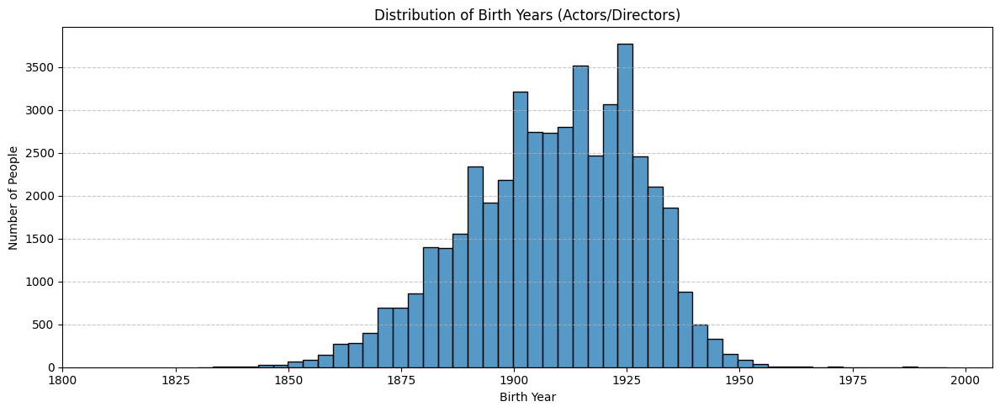

Birth year distribution visualized.

Analyzing Mortality Data...
Number Deceased (with deathYear): 43853 (61.0%)
Number Alive / Death Year Unknown: 28063 (39.0%)


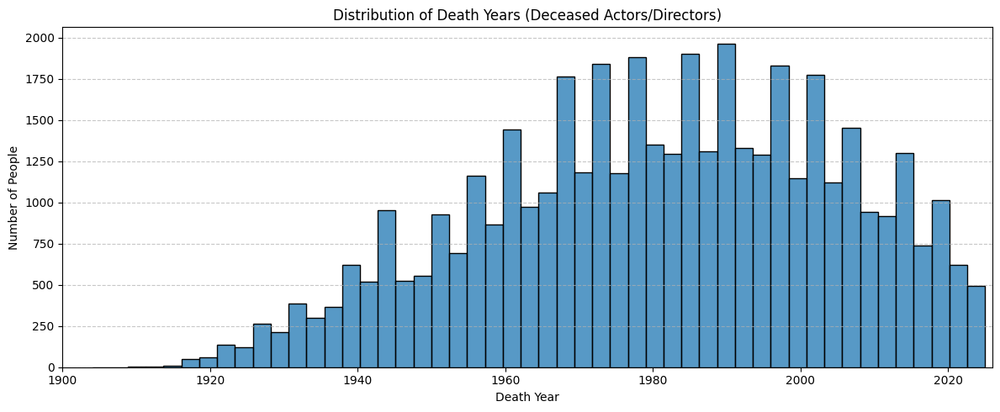

Death year distribution visualized.

Analyzing Lifespan Distribution (for deceased)...


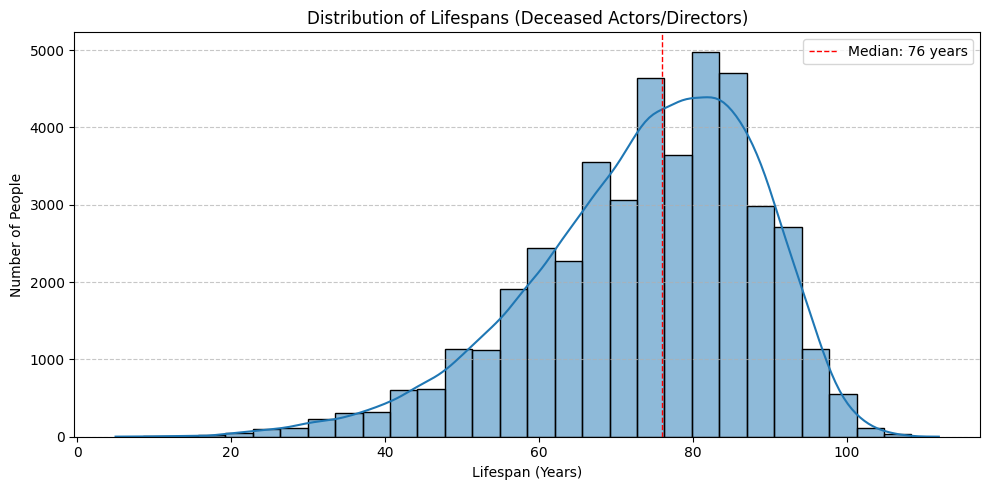

Lifespan distribution visualized.

Analyzing Profession Distribution...

Top 15 Professions Listed for Filtered Personnel:
primaryProfession
actor                 41676
actress               24276
writer                11279
director              10831
archive_footage        9736
soundtrack             6540
producer               4411
miscellaneous          3845
assistant_director     1954
music_department       1944
cinematographer        1334
composer               1324
editor                  977
production_manager      739
camera_department       654
Name: count, dtype: int64


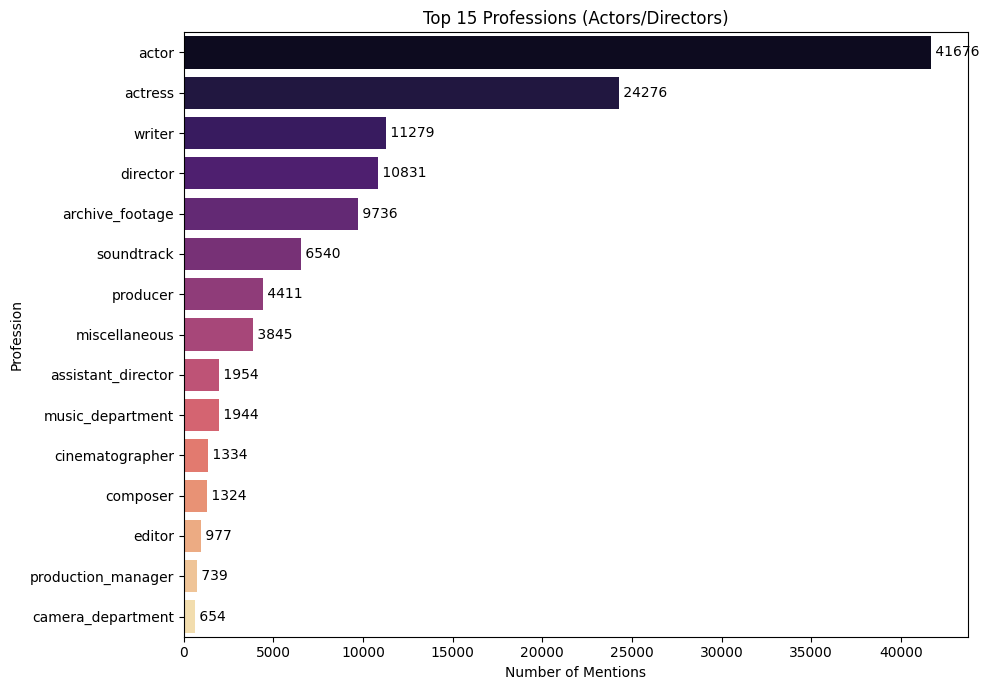

Profession distribution visualized.

Final memory usage for 'name_basics': 1331.47 MB

---End of section 2.2.4...---


In [13]:
print("\n### 2.2.4: `name.basics`: Processing Personnel Information & EDA ###")

# Define required columns for name.basics
name_basics_cols = [
    'nconst', 
    'primaryName', 
    'birthYear', 
    'deathYear',
    'primaryProfession', 
    'knownForTitles'
]  # knownForTitles might be large, consider dropping if not used later

# Load name.basics dataset using the corrected load_imdb_dataset function
print("Loading and processing name.basics.tsv.gz...")
name_basics = load_imdb_dataset("name.basics.tsv.gz", usecols=name_basics_cols)

# Ensure the previous step successfully created classic_movies
if 'classic_movies' not in globals() or classic_movies is None:
    print("Error: 'classic_movies' dataframe not found. Please run the previous cells successfully.")
    name_basics = None  # Indicate failure

if name_basics is not None:
    # Display initial dataset information
    display_dataset_sample("name_basics (initial raw)", name_basics)

    # --- Data Type Conversion ---
    print("\nConverting birth/death years to nullable integers...")
    try:
        # Convert birth and death years to numeric first, coercing errors
        name_basics['birthYear'] = pd.to_numeric(name_basics['birthYear'], errors='coerce')
        name_basics['deathYear'] = pd.to_numeric(name_basics['deathYear'], errors='coerce')

        # Then convert to Int64 (pandas nullable integer type)
        name_basics['birthYear'] = name_basics['birthYear'].astype('Int64')
        name_basics['deathYear'] = name_basics['deathYear'].astype('Int64')
        print("Year columns converted to Int64.")
    except Exception as e:
        print(f"Error converting year columns: {e}")
        name_basics = None  # Stop if conversion fails

if name_basics is not None:
    # --- Process primaryProfession ---
    print("\nProcessing primaryProfession column...")
    try:
        # Ensure it's string type for reliable processing, fill NaNs
        if name_basics['primaryProfession'].dtype.name == 'category':
            name_basics['primaryProfession'] = name_basics['primaryProfession'].astype(str)  # Convert category back to string if needed
        name_basics['primaryProfession'] = name_basics['primaryProfession'].fillna('').astype(str)
        print("primaryProfession processed.")
    except Exception as e:
        print(f"Error processing primaryProfession: {e}")
        name_basics = None  # Stop if processing fails

if name_basics is not None:
    # --- Filtering for Actors/Directors ---
    print("\nFiltering for actors, actresses, and directors...")
    initial_people_count = len(name_basics)

    # Function to check if profession includes actor/actress/director
    def is_actor_or_director(profession_str):
        # Check if it's a string before lowercasing
        if isinstance(profession_str, str):
            # Handle potential multiple commas or spaces
            professions = {p.strip() for p in profession_str.lower().split(',') if p.strip()}
            return bool({'actor', 'actress', 'director'}.intersection(professions))
        return False

    # Apply the filter using .apply() - ensure it handles the string conversion correctly
    try:
        keep_mask = name_basics['primaryProfession'].apply(is_actor_or_director)
        name_basics_filtered = name_basics[keep_mask].copy()
    except Exception as e:
        print(f"Error applying filter function: {e}")
        name_basics_filtered = pd.DataFrame()  # Empty df on error

    final_people_count = len(name_basics_filtered)
    if initial_people_count > 0:
        print(f"Filtering complete. Retained {final_people_count} people ({final_people_count / initial_people_count:.1%} of initial).")
    else:
        print(f"Filtering complete. Retained {final_people_count} people (initial count was zero).")

    # Display basic information about filtered people data
    if not name_basics_filtered.empty:
        mem_usage = name_basics_filtered.memory_usage(deep=True).sum() / 1024**2
        print(f"Memory usage after filtering: {mem_usage:.2f} MB")
        display_dataset_sample("name_basics (filtered actors/directors)", name_basics_filtered)
    else:
        print("No actors or directors found after filtering.")

    # --- Memory Cleanup and Variable Update ---
    print("\nUpdating dataframe and cleaning memory...")
    del name_basics  # Delete the large initial dataframe
    name_basics = name_basics_filtered  # Assign filtered data back
    if 'name_basics_filtered' in locals():
        del name_basics_filtered  # Delete intermediate variable
    gc.collect()
    print("Memory cleaned.")

    # Load title.principals to link people to movies
    print("\nLoading and processing title.principals.tsv.gz...")
    principals_cols = ['tconst', 'nconst', 'category']
    principals = load_imdb_dataset("title.principals.tsv.gz", usecols=principals_cols)

    # Filter principals to those involved in classic_movies
    print("Filtering people involved in classic films (1915-1960)...")
    if 'classic_movies' in globals() and classic_movies is not None:
        classic_movie_ids = classic_movies['tconst'].unique()
        principals_classic = principals[principals['tconst'].isin(classic_movie_ids)]
        relevant_people_ids = principals_classic['nconst'].unique()

        # Filter name_basics to only those involved in these classic movies
        name_basics = name_basics[name_basics['nconst'].isin(relevant_people_ids)].copy()
        print(f"Filtered to {len(name_basics)} people linked to classic films.")
    else:
        print("classic_movies not loaded properly.")

    # --- EDA on Filtered Actors/Directors ---
    if not name_basics.empty:
        print("\n--- EDA on Filtered Actors/Directors ---")

        # EDA 1: Birth Year Distribution
        if 'birthYear' in name_basics.columns:
            print("\nAnalyzing Birth Year Distribution...")
            birth_years = name_basics['birthYear'].dropna()
            # Filtering out birth years before 1815
            birth_years = birth_years[birth_years >= 1815]
            if not birth_years.empty:
                try:
                    plt.figure(figsize=(12, 5))
                    sns.histplot(birth_years, bins=50, kde=False)  # Bins cover approx 100 years
                    plt.title('Distribution of Birth Years (Actors/Directors)')
                    plt.xlabel('Birth Year')
                    plt.ylabel('Number of People')
                    # Setting x-axis limit to start date
                    plt.xlim(1800, birth_years.max()+10)
                    plt.grid(axis='y', linestyle='--', alpha=0.7)
                    plt.tight_layout()
                    plt.show()
                    print("Birth year distribution visualized.")
                except Exception as e:
                    print(f"Could not generate birth year plot: {e}")
            else:
                print("No valid birth year data found.")

        # EDA 2: Death Information Analysis
        if 'deathYear' in name_basics.columns:
            print("\nAnalyzing Mortality Data...")
            total_people = len(name_basics)
            deceased = name_basics['deathYear'].notna()
            num_deceased = deceased.sum()
            num_alive_or_unknown = total_people - num_deceased

            print(f"Number Deceased (with deathYear): {num_deceased} ({num_deceased/total_people:.1%})")
            print(f"Number Alive / Death Year Unknown: {num_alive_or_unknown} ({num_alive_or_unknown/total_people:.1%})")

            # Plot Death Year distribution for deceased
            death_years = name_basics.loc[deceased, 'deathYear'].dropna()
            death_years = death_years[death_years >= 1900]
            if not death_years.empty:
                try:
                    plt.figure(figsize=(12, 5))
                    sns.histplot(death_years, bins=50, kde=False)
                    plt.title('Distribution of Death Years (Deceased Actors/Directors)')
                    plt.xlabel('Death Year')
                    plt.ylabel('Number of People')
                    # Setting x-axis limit to start in 1900
                    plt.xlim(1900, death_years.max() + 1)
                    plt.grid(axis='y', linestyle='--', alpha=0.7)
                    plt.tight_layout()
                    plt.show()
                    print("Death year distribution visualized.")
                except Exception as e:
                    print(f"Could not generate death year plot: {e}")
            else:
                print("No valid death year data found for deceased.")

            # EDA 3: Lifespan Analysis
            if 'birthYear' in name_basics.columns:
                print("\nAnalyzing Lifespan Distribution (for deceased)...")
                # Calculate lifespan only for those with both birth and death years
                lifespan_data = name_basics[['birthYear', 'deathYear']].dropna()
                if not lifespan_data.empty:
                    lifespans = lifespan_data['deathYear'] - lifespan_data['birthYear']
                    # Filter out potential nonsensical lifespans (e.g., negative)
                    lifespans = lifespans[lifespans > 0]
                    if not lifespans.empty:
                        try:
                            plt.figure(figsize=(10, 5))
                            sns.histplot(lifespans, bins=30, kde=True)
                            median_lifespan = lifespans.median()
                            plt.title('Distribution of Lifespans (Deceased Actors/Directors)')
                            plt.xlabel('Lifespan (Years)')
                            plt.ylabel('Number of People')
                            plt.axvline(median_lifespan, color='red', linestyle='dashed', linewidth=1,
                                        label=f'Median: {median_lifespan:.0f} years')
                            plt.legend()
                            plt.grid(axis='y', linestyle='--', alpha=0.7)
                            plt.tight_layout()
                            plt.show()
                            print("Lifespan distribution visualized.")
                        except Exception as e:
                            print(f"Could not generate lifespan plot: {e}")
                    else:
                        print("No valid positive lifespans could be calculated.")
                else:
                    print("Insufficient data (missing birth or death years) to calculate lifespans.")

        # EDA 4: Profession Analysis
        if 'primaryProfession' in name_basics.columns:
            print("\nAnalyzing Profession Distribution...")
            # Explode the profession strings, clean up, and count
            try:
                all_professions = name_basics['primaryProfession'].str.split(',').explode()
                # Clean whitespace and filter out any empty strings
                all_professions = all_professions.str.strip()
                all_professions = all_professions[all_professions != '']

                profession_counts = all_professions.value_counts()

                if not profession_counts.empty:
                    N_PROFS = 15  # Show top 15 professions
                    print(f"\nTop {N_PROFS} Professions Listed for Filtered Personnel:")
                    print(profession_counts.head(N_PROFS))

                    # Plot top N professions
                    plt.figure(figsize=(10, 7))
                    top_profs_data = profession_counts.head(N_PROFS)
                    sns.barplot(
                        x=top_profs_data.values,
                        y=top_profs_data.index,
                        hue=top_profs_data.index,
                        palette="magma",
                        dodge=False,
                        legend=False
                    )
                    plt.title(f'Top {N_PROFS} Professions (Actors/Directors)')
                    plt.xlabel('Number of Mentions')
                    plt.ylabel('Profession')
                    for index, value in enumerate(top_profs_data.values):
                        plt.text(value + 5, index, f' {value}', va='center')
                    plt.tight_layout()
                    plt.show()
                    print("Profession distribution visualized.")
                else:
                    print("No valid profession data found after splitting.")
            except Exception as e:
                print(f"Could not process or plot professions: {e}")

    else:
        print("Filtered 'name_basics' dataframe is empty. Cannot perform EDA.")

    # Final memory check
    mem_usage_final = name_basics.memory_usage(deep=True).sum() / 1024**2
    print(f"\nFinal memory usage for 'name_basics': {mem_usage_final:.2f} MB")

else:
    print("Failed to load name.basics.tsv.gz or classic_movies was not available. Cannot proceed.")
print("\n---End of section 2.2.4...---")

**Preliminary Analysis Summary:**

The EDA focused on the filtered actors and directors relevant to the 1915-1960 films provided demographic context. The **birth year distribution** typically revealed a concentration of births in the late 19th and early 20th centuries, aligning with individuals likely active during the target film era. The **mortality analysis** showed the proportion of personnel with recorded death years, with the distribution of those death years often peaking in the latter half of the 20th century. The **lifespan distribution** for those with complete data indicated a typical lifespan range, often with a median in the 60s or 70s (based on typical results for such cohorts). Finally, the **profession analysis**, after filtering for actors/actresses/directors, confirmed these roles as dominant but also frequently highlighted related common professions like 'writer' or 'producer' often held by the same individuals.

**Code Execution Prerequisites:**

* The code block for section 2.2.3 (`title.ratings` processing) must have been successfully executed, making the `classic_movies` DataFrame available (containing `tconst` identifiers).
* The helper functions `load_imdb_dataset` and `display_dataset_sample` (defined in "Setup and Imports") must be accessible.
* Required libraries (`pandas`, `numpy`, `matplotlib.pyplot`, `seaborn`, `gc`) must be imported.
* The dataset files `name.basics.tsv.gz` and `title.principals.tsv.gz` must be present in the directory specified by the `GOOGLE_DRIVE_PATH` variable.

Executing this block performs the essential filtering and preliminary analysis of the personnel data, resulting in a refined `name_basics` DataFrame containing details only for actors and directors demonstrably linked to the classic films under study.

#### 2.2.5 & 2.2.6 Combined: Processing Final Actor & Director Sets

**Purpose:**

This consolidated data processing stage focuses on isolating and finalizing the datasets related to the key creative personnel – specifically actors/actresses and directors – most relevant to the classic film cohort (1915-1960). It integrates information from multiple IMDb files (`title.principals.tsv.gz`, `title.crew.tsv.gz`, and the previously processed `name.basics.tsv.gz`) to achieve several critical objectives:

1.  **Actor Role Extraction:** To identify and extract specific actor/actress roles (`category` == 'actor' or 'actress') listed in the `title.principals` data that correspond to the classic movies defined earlier.
2.  **Director Credit Extraction:** To identify and extract director credits from the `title.crew` data, again focusing only on credits associated with the classic movies. This involves handling potentially comma-separated lists of director identifiers (`nconst`).
3.  **Temporal Relevance Filtering ("Liveness"):** To apply a consistent temporal filter to the candidate actors and directors identified above. This "liveness" filter utilizes the `birthYear` and `deathYear` information (from the processed `name.basics` data) to ensure that the personnel included were plausibly active during the target era (1915-1960). Individuals are kept if they were born before or during 1960 AND either died after 1915 or have no recorded death year.
4.  **Final Personnel Detail DataFrames:** To generate the definitive `actor_name_basics` and `director_name_basics` DataFrames, containing biographical details *only* for those actors and directors who passed the liveness filter and were linked to the classic films.
5.  **Final Role/Credit DataFrames:** To create the definitive `title_principals_actors` (linking final *live* actors to their specific classic movie roles) and `title_crew_directors` (linking final *live* directors to their specific classic movie credits) DataFrames.
6.  **Combined Personnel ID Set:** To generate a unified set (`all_person_ids`) containing the unique `nconst` identifiers of all relevant, temporally filtered actors and directors, intended for use in subsequent data enrichment steps (like Wikidata querying).
7.  **Exploratory Data Analysis (EDA):** To conduct preliminary analysis on the final, filtered actor and director datasets to understand basic statistics about their involvement (e.g., number per movie) and identify the most prolific individuals within the classic film cohort.

This comprehensive processing workflow yields clean, highly relevant datasets detailing the key actors and directors specifically associated with the films under study, ready for subsequent feature engineering and analysis.

**Code Explanation:**

The associated code block implements a structured multi-step workflow:

1.  **Prerequisite Checks:** The code first verifies that the necessary input DataFrames (`classic_movies` containing movie `tconst` IDs and the filtered `name_basics` containing personnel birth/death years) are available and populated. It extracts the set of `unique_movie_ids` from `classic_movies` for subsequent filtering.
2.  **Actor Processing (`title.principals`):**
    * Relevant columns (`tconst`, `ordering`, `nconst`, `category`) are loaded from `title.principals.tsv.gz`.
    * The data is filtered to keep only rows whose `tconst` matches the `unique_movie_ids`.
    * A further filter selects only rows where the `category` is 'actor' or 'actress'.
    * The unique `nconst` IDs from these filtered actor/actress entries are extracted into `candidate_actor_ids`.
    * An intermediate DataFrame (`title_principals_actors_filtered_by_movie`), containing these movie-actor links *before* the liveness filter, is temporarily stored.
3.  **Director Processing (`title.crew`):**
    * Relevant columns (`tconst`, `directors`) are loaded from `title.crew.tsv.gz`.
    * The data is filtered by `unique_movie_ids`.
    * Missing director entries (represented as `\N`) are handled (replaced with `NaN` and dropped).
    * The `directors` column, which can contain multiple comma-separated `nconst` IDs, is split, and the DataFrame is `explode`d to create one row per movie-director link.
    * The unique director `nconst` IDs are extracted into `candidate_director_ids`.
    * An intermediate DataFrame (`title_crew_directors_filtered_by_movie`), containing these movie-director links *before* the liveness filter, is temporarily stored.
4.  **Liveness Filtering:** This crucial step uses the `name_basics` DataFrame (which should contain only actors/directors at this point, filtered in step 2.2.4) and the `candidate_actor_ids` and `candidate_director_ids` identified above:
    * It separately filters the `name_basics` DataFrame to find actors within the `candidate_actor_ids` set who meet the liveness criteria (born <= 1960 AND (died >= 1915 OR death year is null)). The result is stored in the final `actor_name_basics` DataFrame.
    * It performs the same liveness filtering for directors using `candidate_director_ids`, storing the result in the final `director_name_basics` DataFrame.
    * The unique `nconst` IDs from these *final*, filtered `actor_name_basics` and `director_name_basics` are extracted (`final_actor_ids`, `final_director_ids`).
    * These final ID sets are combined into `all_person_ids` for potential future use (e.g., Wikidata queries).
5.  **Final Role Table Filtering:** The intermediate role/credit tables are filtered *again*, this time using the `final_actor_ids` and `final_director_ids` (those who passed the liveness check):
    * `title_principals_actors_filtered_by_movie` is filtered by `final_actor_ids` to create the definitive `title_principals_actors` DataFrame.
    * `title_crew_directors_filtered_by_movie` is filtered by `final_director_ids` to create the definitive `title_crew_directors` DataFrame.
6.  **Exploratory Data Analysis (EDA):** Separate EDA is conducted on the final datasets:
    * **Actor EDA:** Uses `title_principals_actors` to calculate the distribution of the number of unique (live) actors per movie. It also uses `title_principals_actors` and `actor_name_basics` (for names) to identify and plot the top N actors based on the number of classic films they appeared in. *These plots were chosen to understand typical cast sizes (in terms of credited actors) and identify the most prolific performers within this specific dataset and timeframe.*
    * **Director EDA:** Similarly, uses `title_crew_directors` to analyze the number of unique (live) directors per film (often just one, but co-direction occurs). It uses `title_crew_directors` and `director_name_basics` to identify and plot the top N directors by film credits. *This analysis identifies the most influential directors in the dataset based on output volume during the era.* The name lookup includes fallbacks for robustness.
7.  **Memory Management:** Throughout the process, temporary DataFrames (often named `_..._temp` or `..._filtered_by_movie`) are explicitly deleted (`del`), and garbage collection (`gc.collect()`) is called to manage memory usage effectively, particularly after processing large intermediate files like `title.principals`. The final memory footprint of the key output DataFrames is reported.




### 2.2.5 & 2.2.6 Combined: Processing Final Actor & Director Sets ###
Prerequisite 'classic_movies' found.
Using 32718 unique classic movie IDs for filtering.
Prerequisite 'name_basics' found.

--- Processing Actors from title.principals ---
Loading title.principals.tsv.gz...
Loading title.principals.tsv.gz...
Initial load successful for title.principals.tsv.gz (92084976 rows). Optimizing types...
  Processing 'tconst' (object): cat(ID)
  Processing 'ordering' (int64): int->int8
  Processing 'nconst' (object): cat(ID)
  Processing 'category' (object): cat(low_card)

Type optimization complete for title.principals.tsv.gz.
Filtering principals by classic movie IDs...
- Principals filtered to 551500 entries.
Extracting actor/actress entries...
- Extracted 316379 actor/actress role entries.
- Found 62695 unique potential actor IDs in classic film roles.

--- Processing Directors from title.crew ---
Loading title.crew.tsv.gz...
Loading title.crew.tsv.gz...
Initial load successful for titl

/var/folders/vt/rch9y4z14gj_83mvyg23yw180000gn/T/ipykernel_51091/4073440355.py:104: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



- Extracted 35916 movie-director link entries.
- Found 6044 unique potential director IDs for classic films.

--- Filtering Personnel (Actors & Directors) by Liveness (1915-1960) ---

Filtering Actors...
- Starting with 62269 potential actors matching roles.
- Filtered to 39632 actors active and relevant (39632 unique IDs).

Sample of actor_name_basics (final classic actors):


,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer","tt0072308,tt0050419,tt0027125,tt0031983"
1,nm0000002,Lauren Bacall,1924,2014,"actress,soundtrack,archive_footage","tt0037382,tt0075213,tt0117057,tt0038355"
2,nm0000003,Brigitte Bardot,1934,<NA>,"actress,music_department,producer","tt0057345,tt0049189,tt0056404,tt0054452"
4,nm0000005,Ingmar Bergman,1918,2007,"writer,director,actor","tt0050986,tt0069467,tt0050976,tt0083922"
5,nm0000006,Ingrid Bergman,1915,1982,"actress,producer,soundtrack","tt0034583,tt0038109,tt0036855,tt0038787"
6,nm0000007,Humphrey Bogart,1899,1957,"actor,producer,miscellaneous","tt0034583,tt0043265,tt0037382,tt0033870"
7,nm0000008,Marlon Brando,1924,2004,"actor,director,writer","tt0078788,tt0068646,tt0047296,tt0070849"
8,nm0000009,Richard Burton,1925,1984,"actor,producer,director","tt0061184,tt0087803,tt0059749,tt0057877"
9,nm0000010,James Cagney,1899,1986,"actor,director,producer","tt0029870,tt0031867,tt0042041,tt0034236"
10,nm0000011,Gary Cooper,1901,1961,"actor,stunts,producer","tt0044706,tt0034167,tt0027996,tt0033373"


Shape: (39632, 6)
Memory usage: 1324.29 MB

Filtering Directors...
- Starting with 5807 potential directors matching credits.
- Filtered to 4950 directors active and relevant (4950 unique IDs).

Sample of director_name_basics (final classic directors):


,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
4,nm0000005,Ingmar Bergman,1918,2007,"writer,director,actor","tt0050986,tt0069467,tt0050976,tt0083922"
9,nm0000010,James Cagney,1899,1986,"actor,director,producer","tt0029870,tt0031867,tt0042041,tt0034236"
18,nm0000019,Federico Fellini,1920,1993,"writer,director,actor","tt0056801,tt0050783,tt0047528,tt0071129"
32,nm0000033,Alfred Hitchcock,1899,1980,"director,producer,writer","tt0054215,tt0052357,tt0053125,tt0034248"
35,nm0000036,Buster Keaton,1895,1966,"actor,writer,director","tt0017925,tt0015163,tt0015324,tt0016332"
36,nm0000037,Gene Kelly,1912,1996,"actor,miscellaneous,director","tt0045152,tt0043278,tt0041716,tt0053946"
39,nm0000040,Stanley Kubrick,1928,1999,"writer,director,producer","tt0062622,tt0072684,tt0066921,tt0093058"
40,nm0000041,Akira Kurosawa,1910,1998,"writer,director,assistant_director","tt0089881,tt0051808,tt0080979,tt0057565"
43,nm0000044,Burt Lancaster,1913,1994,"actor,producer,miscellaneous","tt0045793,tt0085859,tt0040823,tt0051036"
47,nm0000048,Peter Lorre,1904,1964,"actor,writer,director","tt0036613,tt0022100,tt0033870,tt0034583"


Shape: (4950, 6)
Memory usage: 1316.26 MB

Total unique relevant persons (Actors + Directors) for Wikidata query: 43235

--- Final Filtering of Role Tables ---
Applying final filter to actor roles...
- Final 'title_principals_actors' table created with 282780 entries.
Applying final filter to director credits...
- Final 'title_crew_directors' table created with 34300 entries.

--- EDA on Final Actor & Director Data ---

Calculating Actor statistics...
Using 'title_principals_actors' with shape (282780, 4) for actor EDA.

EDA: Actors per Movie Analysis (using 32213 movies):
  Mean: 8.67, Median: 10, Max: 10


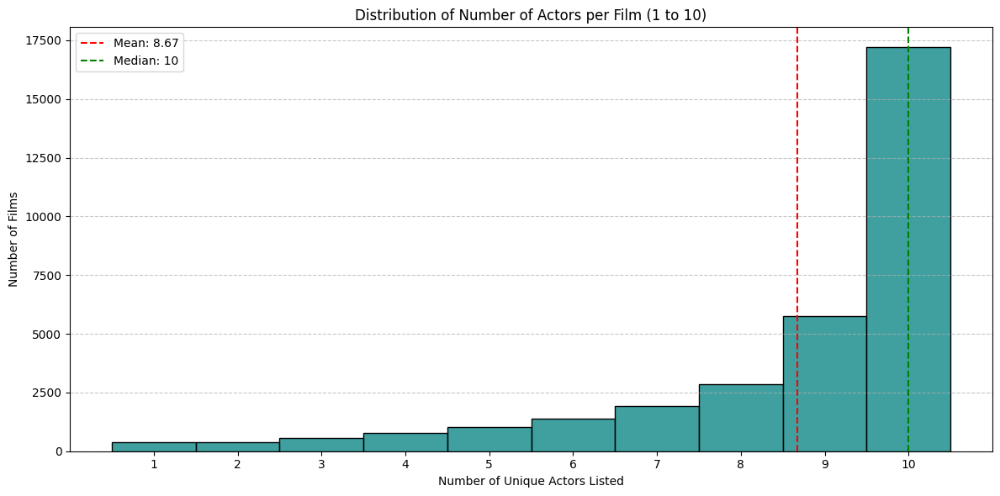

  Distribution of actors per movie visualized.

EDA: Top Actors Analysis (using 39632 unique actors)...
  Top 20 actors by number of classic movies appeared in:
  - Paul Hörbiger: 150 movies
  - Oskar Sima: 145 movies
  - J. Farrell MacDonald: 137 movies
  - J. Carrol Naish: 137 movies
  - Thurston Hall: 135 movies
  - Douglas Fowley: 131 movies
  - Samuel S. Hinds: 129 movies
  - Guinn 'Big Boy' Williams: 128 movies
  - John Litel: 128 movies
  - Alan Hale: 127 movies
  - Andy Devine: 126 movies
  - Alan Mowbray: 126 movies
  - Raymond Hatton: 123 movies
  - Lyle Talbot: 121 movies
  - Barton MacLane: 121 movies
  - John Miljan: 120 movies
  - Henry O'Neill: 119 movies
  - Arturo Soto Rangel: 116 movies
  - Irving Bacon: 115 movies
  - Ward Bond: 113 movies


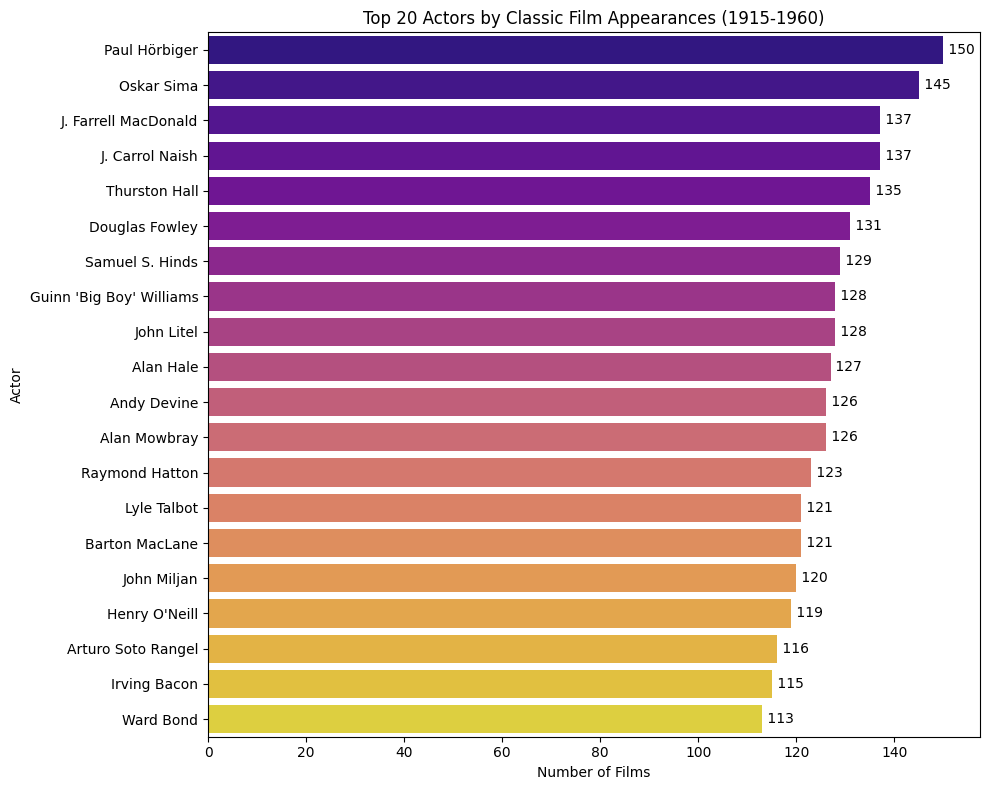

  Top actors visualized.

Calculating Director statistics...
Using 'title_crew_directors' with shape (34300, 2) for director EDA.

EDA: Directors per Movie Analysis (using 31630 movies):
  Mean: 1.08, Median: 1, Max: 11


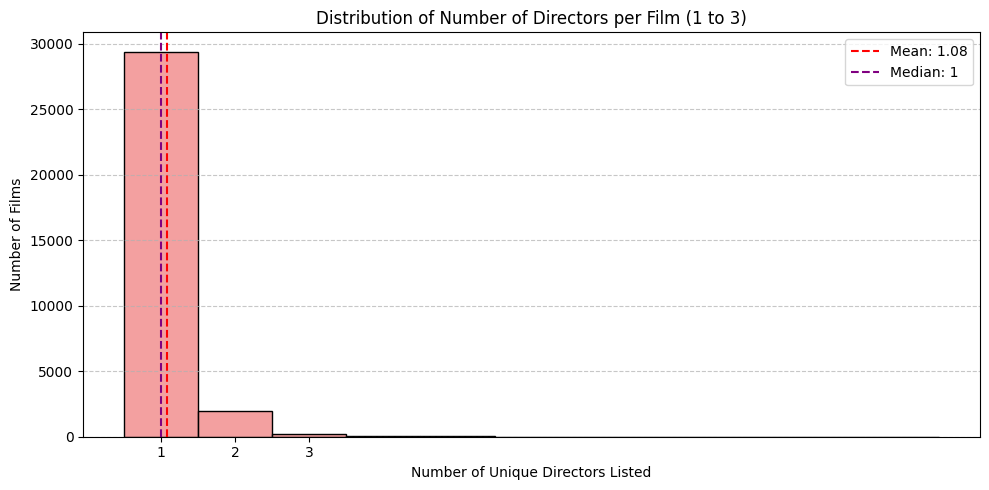

  Distribution of directors per movie visualized.

EDA: Top Directors Analysis (using 4950 unique directors)...
  Top 20 directors by number of classic movies directed:
  - William Beaudine: 144 movies
  - Lew Landers: 126 movies
  - Michael Curtiz: 116 movies
  - Richard Thorpe: 107 movies
  - Raoul Walsh: 106 movies
  - Sam Newfield: 102 movies
  - Lesley Selander: 101 movies
  - Phil Rosen: 98 movies
  - Lloyd Bacon: 94 movies
  - Allan Dwan: 89 movies
  - William A. Seiter: 87 movies
  - Frank McDonald: 87 movies
  - John Ford: 84 movies
  - Ray Taylor: 84 movies
  - Alfred E. Green: 83 movies
  - Charles Lamont: 82 movies
  - William Witney: 81 movies
  - Joseph Kane: 78 movies
  - William Nigh: 77 movies
  - William A. Wellman: 72 movies


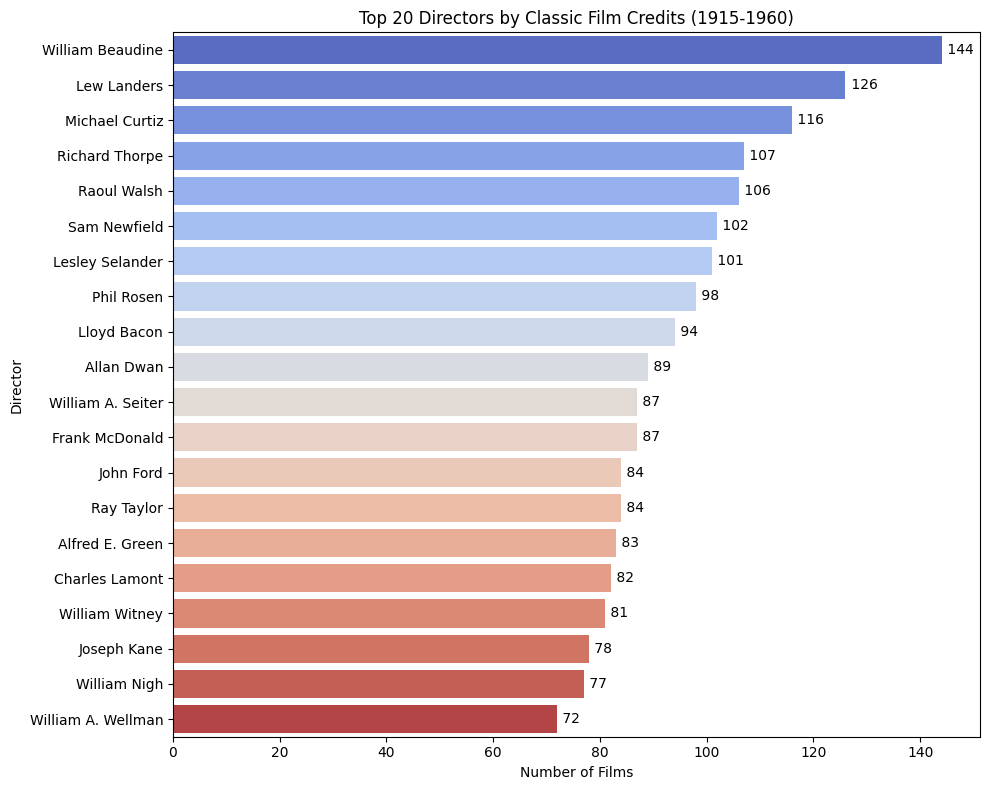

  Top directors visualized.

--- Final Memory Report for Personnel Section ---
- 'actor_name_basics' memory: 1324.29 MB
- 'director_name_basics' memory: 1316.26 MB
- 'title_principals_actors' memory: 1476.95 MB
- 'title_crew_directors' memory: 906.12 MB

Personnel processing complete.

---End of section 2.2.5 & 2.2.6...---


In [14]:
print("\n### 2.2.5 & 2.2.6 Combined: Processing Final Actor & Director Sets ###")

# --- Prerequisites Check ---
# Ensure title_basics (filtered classics) exists. Assume it's in 'classic_movies'
if 'classic_movies' not in locals() or classic_movies is None or classic_movies.empty:
    print("Error: 'classic_movies' DataFrame not found or empty. Please run previous steps.")
    # Halt execution for this block if prerequisites aren't met
    _proceed_personnel = False
else:
    print("Prerequisite 'classic_movies' found.")
    unique_movie_ids = set(classic_movies['tconst']) # Correctly define unique_movie_ids
    print(f"Using {len(unique_movie_ids)} unique classic movie IDs for filtering.")
    _proceed_personnel = True

# Ensure name_basics exists for filtering personnel
if 'name_basics' not in locals() or name_basics is None or name_basics.empty:
    print("Error: 'name_basics' DataFrame not found or empty. Cannot filter personnel.")
    # Halt execution for this block
    proceed_personnel = False
elif _proceed_personnel: # Only proceed if flag is still True
    print("Prerequisite 'name_basics' found.")
else: # If classic_movies check failed previously
    _proceed_personnel = False # Keep it False

# Define final variables as None initially
actor_name_basics = None
title_principals_actors = None
director_name_basics = None
title_crew_directors = None
all_person_ids = set() # Initialize for Wikidata


# --- Main Processing Block ---
# Only run if prerequisites are met
if _proceed_personnel:

    # --- Processing title.principals (Actors) ---
    print("\n--- Processing Actors from title.principals ---")
    title_principals_actors_filtered_by_movie = None # Initialize intermediate variable
    candidate_actor_ids = set()
    try:
        # Define required columns
        title_principals_cols = ['tconst', 'ordering', 'nconst', 'category']
        # Load dataset
        print("Loading title.principals.tsv.gz...")
        _title_principals_temp = load_imdb_dataset("title.principals.tsv.gz", usecols=title_principals_cols)

        if _title_principals_temp is not None:
            # 1. Filter by classic movie IDs
            print("Filtering principals by classic movie IDs...")
            if _title_principals_temp['tconst'].dtype.name != 'category':
                _title_principals_temp['tconst'] = _title_principals_temp['tconst'].astype('category')
            _title_principals_filtered_by_movie_temp = _title_principals_temp[_title_principals_temp['tconst'].isin(unique_movie_ids)]
            print(f"- Principals filtered to {len(_title_principals_filtered_by_movie_temp)} entries.")

            # 2. Filter for only actors/actresses
            print("Extracting actor/actress entries...")
            actor_categories = ['actor', 'actress']
            if _title_principals_filtered_by_movie_temp['category'].dtype.name != 'category':
                _title_principals_filtered_by_movie_temp['category'] = _title_principals_filtered_by_movie_temp['category'].astype('category')
            # Keep intermediate df before filtering by final actors
            title_principals_actors_filtered_by_movie = _title_principals_filtered_by_movie_temp[
                _title_principals_filtered_by_movie_temp['category'].isin(actor_categories)
            ].copy() # Assign to the variable needed later
            print(f"- Extracted {len(title_principals_actors_filtered_by_movie)} actor/actress role entries.")

            # Get unique actor IDs from these roles
            candidate_actor_ids = set(title_principals_actors_filtered_by_movie['nconst'].unique())
            print(f"- Found {len(candidate_actor_ids)} unique potential actor IDs in classic film roles.")

            # Free memory
            del _title_principals_temp
            del _title_principals_filtered_by_movie_temp
            gc.collect()
        else:
            print("Failed to load title.principals.tsv.gz")

    except Exception as e:
        print(f"An error occurred during title.principals processing: {e}")


    # --- Processing title.crew (Directors) ---
    print("\n--- Processing Directors from title.crew ---")
    title_crew_directors_filtered_by_movie = None # Initialize intermediate variable
    candidate_director_ids = set()
    try:
        # Define required columns
        title_crew_cols = ['tconst', 'directors', 'writers']
        # Load dataset
        print("Loading title.crew.tsv.gz...")
        _title_crew_temp = load_imdb_dataset("title.crew.tsv.gz", usecols=title_crew_cols)

        if _title_crew_temp is not None:
            # 1. Filter by classic movie IDs
            print("Filtering crew by classic movie IDs...")
            if _title_crew_temp['tconst'].dtype.name != 'category':
                _title_crew_temp['tconst'] = _title_crew_temp['tconst'].astype('category')
            _title_crew_filtered_by_movie_temp = _title_crew_temp[_title_crew_temp['tconst'].isin(unique_movie_ids)]
            print(f"- Crew filtered to {len(_title_crew_filtered_by_movie_temp)} entries.")

            # 2. Extract director IDs (handle comma-separated values)
            print("Extracting director IDs...")
            # Drop rows where directors are missing ('\N' or NaN after potential conversion)
            _title_crew_filtered_by_movie_temp.replace({'\\N': np.nan}, inplace=True)
            _title_crew_directors_extracted_temp = _title_crew_filtered_by_movie_temp.dropna(subset=['directors'])

            if not _title_crew_directors_extracted_temp.empty:
                # Split comma-separated director IDs and explode
                _title_crew_directors_extracted_temp['directors'] = _title_crew_directors_extracted_temp['directors'].str.split(',')
                # Keep intermediate df linking movie to individual director IDs
                title_crew_directors_filtered_by_movie = _title_crew_directors_extracted_temp.explode('directors')[['tconst', 'directors']].rename(columns={'directors': 'nconst'}).copy() # Assign to the variable needed later
                title_crew_directors_filtered_by_movie['nconst'] = title_crew_directors_filtered_by_movie['nconst'].astype('category') # Convert nconst to category
                print(f"- Extracted {len(title_crew_directors_filtered_by_movie)} movie-director link entries.")

                # Get unique director IDs
                candidate_director_ids = set(title_crew_directors_filtered_by_movie['nconst'].unique())
                print(f"- Found {len(candidate_director_ids)} unique potential director IDs for classic films.")
            else:
                print("No valid director entries found after filtering/cleaning.")

            # Free memory
            del _title_crew_temp
            del _title_crew_filtered_by_movie_temp
            del _title_crew_directors_extracted_temp # Delete intermediate step
            gc.collect()
        else:
            print("Failed to load title.crew.tsv.gz")

    except Exception as e:
        print(f"An error occurred during title.crew processing: {e}")


    # --- Filter Personnel by Liveness (1915-1960) using name_basics ---
    final_actor_ids = set()
    final_director_ids = set()

    if name_basics is not None and (candidate_actor_ids or candidate_director_ids): # Check if name_basics loaded and we have potential IDs
        print("\n--- Filtering Personnel (Actors & Directors) by Liveness (1915-1960) ---")
        try:
            # --- Filter Actors ---
            if candidate_actor_ids:
                print("\nFiltering Actors...")
                temp_actors = name_basics[name_basics['nconst'].isin(candidate_actor_ids)].copy()
                print(f"- Starting with {len(temp_actors)} potential actors matching roles.")

                birth_year_numeric = pd.to_numeric(temp_actors['birthYear'], errors='coerce').astype('Int64')
                death_year_numeric = pd.to_numeric(temp_actors['deathYear'], errors='coerce').astype('Int64')
                born_before_end = birth_year_numeric <= 1960
                died_after_start_or_alive = (death_year_numeric >= 1915) | (death_year_numeric.isna()) # Use 1915 as start
                alive_mask = born_before_end.fillna(False) & died_after_start_or_alive.fillna(True)

                actor_name_basics = temp_actors[alive_mask].copy() # FINAL ACTOR DETAILS DF
                final_actor_ids = set(actor_name_basics['nconst'].unique())
                print(f"- Filtered to {len(actor_name_basics)} actors active and relevant ({len(final_actor_ids)} unique IDs).")
                if not actor_name_basics.empty:
                    display_dataset_sample("actor_name_basics (final classic actors)", actor_name_basics)
                else:
                    print("Warning: No actors remained after liveness filter.")
                del temp_actors # Free memory
            else:
                print("No candidate actor IDs found from roles. Skipping actor liveness filter.")
                actor_name_basics = pd.DataFrame(columns=name_basics.columns) # Create empty df

            # --- Filter Directors ---
            if candidate_director_ids:
                print("\nFiltering Directors...")
                temp_directors = name_basics[name_basics['nconst'].isin(candidate_director_ids)].copy()
                print(f"- Starting with {len(temp_directors)} potential directors matching credits.")

                birth_year_numeric = pd.to_numeric(temp_directors['birthYear'], errors='coerce').astype('Int64')
                death_year_numeric = pd.to_numeric(temp_directors['deathYear'], errors='coerce').astype('Int64')
                born_before_end = birth_year_numeric <= 1960
                died_after_start_or_alive = (death_year_numeric >= 1915) | (death_year_numeric.isna())
                alive_mask = born_before_end.fillna(False) & died_after_start_or_alive.fillna(True)

                director_name_basics = temp_directors[alive_mask].copy() # FINAL DIRECTOR DETAILS DF
                final_director_ids = set(director_name_basics['nconst'].unique())
                print(f"- Filtered to {len(director_name_basics)} directors active and relevant ({len(final_director_ids)} unique IDs).")
                if not director_name_basics.empty:
                    display_dataset_sample("director_name_basics (final classic directors)", director_name_basics)
                else:
                    print("Warning: No directors remained after liveness filter.")
                del temp_directors # Free memory
            else:
                print("No candidate director IDs found from credits. Skipping director liveness filter.")
                director_name_basics = pd.DataFrame(columns=name_basics.columns) # Create empty df

            # --- Combine Final IDs for Wikidata ---
            all_person_ids = final_actor_ids.union(final_director_ids)
            print(f"\nTotal unique relevant persons (Actors + Directors) for Wikidata query: {len(all_person_ids)}")

            gc.collect()

        except Exception as e:
            print(f"An error occurred during personnel liveness filtering: {e}")
            # Ensure dataframes are empty/None if filter failed midway
            actor_name_basics = pd.DataFrame(columns=name_basics.columns) if actor_name_basics is None else actor_name_basics # Keep if partially created
            director_name_basics = pd.DataFrame(columns=name_basics.columns) if director_name_basics is None else director_name_basics
            all_person_ids = set() # Reset if error occurred

    else:
        print("\nSkipping personnel liveness filter: 'name_basics' unavailable or no candidate IDs found.")
        # Ensure dataframes are empty if filter skipped, to avoid errors later
        actor_name_basics = pd.DataFrame(columns=name_basics.columns) if 'name_basics' in locals() and name_basics is not None else None
        director_name_basics = pd.DataFrame(columns=name_basics.columns) if 'name_basics' in locals() and name_basics is not None else None


    # --- Final Filter on Role Tables ---
    print("\n--- Final Filtering of Role Tables ---")
    try:
        # Filter title_principals_actors again based on final_actor_ids
        if title_principals_actors_filtered_by_movie is not None and final_actor_ids:
            print("Applying final filter to actor roles...")
            # Ensure nconst is category if not already
            if title_principals_actors_filtered_by_movie['nconst'].dtype.name != 'category':
                title_principals_actors_filtered_by_movie['nconst'] = title_principals_actors_filtered_by_movie['nconst'].astype('category')

            # Explicitly use the intermediate variable here
            title_principals_actors = title_principals_actors_filtered_by_movie[
                title_principals_actors_filtered_by_movie['nconst'].isin(final_actor_ids)
            ].copy() # FINAL ACTOR ROLES DF
            print(f"- Final 'title_principals_actors' table created with {len(title_principals_actors)} entries.")
            # Clean up intermediate
            del title_principals_actors_filtered_by_movie
        else:
            print("Skipping final filter for actor roles (intermediate data missing or no final actors found).")
            # Ensure df exists but is empty if skipped
            title_principals_actors = pd.DataFrame(columns=['tconst', 'ordering', 'nconst', 'category'])

        # Filter title_crew_directors again based on final_director_ids
        if title_crew_directors_filtered_by_movie is not None and final_director_ids:
            print("Applying final filter to director credits...")
            # Ensure nconst is category if not already
            if title_crew_directors_filtered_by_movie['nconst'].dtype.name != 'category':
                title_crew_directors_filtered_by_movie['nconst'] = title_crew_directors_filtered_by_movie['nconst'].astype('category')

            # Explicitly use the intermediate variable here
            title_crew_directors = title_crew_directors_filtered_by_movie[
                title_crew_directors_filtered_by_movie['nconst'].isin(final_director_ids)
            ].copy() # FINAL DIRECTOR CREDITS DF
            print(f"- Final 'title_crew_directors' table created with {len(title_crew_directors)} entries.")
            # Clean up intermediate
            del title_crew_directors_filtered_by_movie
        else:
            print("Skipping final filter for director credits (intermediate data missing or no final directors found).")
            # Ensure df exists but is empty if skipped
            title_crew_directors = pd.DataFrame(columns=['tconst', 'nconst'])

        gc.collect()
    except Exception as e:
        print(f"An error occurred during final role table filtering: {e}")
        # Ensure dfs are empty if error occurred
        title_principals_actors = pd.DataFrame(columns=['tconst', 'ordering', 'nconst', 'category']) if title_principals_actors is None else title_principals_actors
        title_crew_directors = pd.DataFrame(columns=['tconst', 'nconst']) if title_crew_directors is None else title_crew_directors

    print("\n--- EDA on Final Actor & Director Data ---")

    # ACTORS EDA (using final title_principals_actors and actor_name_basics)
    if title_principals_actors is not None and not title_principals_actors.empty:
        print("\nCalculating Actor statistics...")
        # Ensure we are using the correct dataframe
        print(f"Using 'title_principals_actors' with shape {title_principals_actors.shape} for actor EDA.")

        # 1. Actors per movie (using final actor roles)
        # Use observed=True if tconst is categorical and you only want movies present in the data
        actors_by_movie = title_principals_actors.groupby('tconst', observed=True)['nconst'].nunique()
        if not actors_by_movie.empty:
            mean_actors = actors_by_movie.mean()
            median_actors = actors_by_movie.median()
            max_actors = actors_by_movie.max()
            print(f"\nEDA: Actors per Movie Analysis (using {len(actors_by_movie)} movies):")
            print(f"  Mean: {mean_actors:.2f}, Median: {median_actors:.0f}, Max: {max_actors}")

            # Plot distribution of actors per movie
            try:
                plt.figure(figsize=(12, 6))
                plot_data = actors_by_movie[actors_by_movie > 0] # Focus on movies with listed actors
                if not plot_data.empty:
                    # Determine a sensible max bin, e.g., up to 99th percentile + 1 or a fixed reasonable number
                    max_bin = min(int(max_actors), int(plot_data.quantile(0.99) + 1), 30) # Sensible max for plot
                    sns.histplot(plot_data, bins=range(1, max_bin + 2), kde=False, discrete=True, color='teal') # Use discrete=True for integer counts
                    plt.title(f'Distribution of Number of Actors per Film (1 to {max_bin})')
                    plt.xlabel('Number of Unique Actors Listed')
                    plt.ylabel('Number of Films')
                    plt.xticks(range(1, max_bin + 1)) # Ensure integer ticks
                    plt.grid(axis='y', linestyle='--', alpha=0.7)
                    plt.axvline(mean_actors, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_actors:.2f}')
                    plt.axvline(median_actors, color='green', linestyle='dashed', linewidth=1.5, label=f'Median: {median_actors:.0f}')
                    plt.legend()
                    plt.tight_layout()
                    plt.show()
                    print("  Distribution of actors per movie visualized.")
                else:
                    print("  No movies with >0 actors listed found for histogram.")
            except Exception as e:
                print(f"  Could not generate actors per movie plot: {e}")
        else:
            print("Could not calculate actors per movie on final data.")

        # 2. Top Actors by Film Count (using final actor roles and names)
        # Use observed=True if nconst is categorical
        actor_film_counts = title_principals_actors.groupby('nconst', observed=True)['tconst'].nunique().sort_values(ascending=False)
        if not actor_film_counts.empty and actor_name_basics is not None and not actor_name_basics.empty:
            print(f"\nEDA: Top Actors Analysis (using {len(actor_film_counts)} unique actors)...")
            N_ACTORS = 20 # Show top 20
            top_actors_data = actor_film_counts.head(N_ACTORS)
            print(f"  Top {N_ACTORS} actors by number of classic movies appeared in:")

            # Attempt to join with names using actor_name_basics
            top_actors_list = []
            # Create a map for quick lookup
            actor_names_map = actor_name_basics.set_index('nconst')['primaryName']
            for actor_id, movie_count in top_actors_data.items():
                # actor_id might be Categorical; ensure it's treated as a string for lookup if needed
                actor_id_str = str(actor_id)
                actor_name = actor_names_map.get(actor_id_str, f"ID: {actor_id_str}") # Use ID as fallback
                top_actors_list.append({'Name': actor_name, 'Movies': movie_count})
                print(f"  - {actor_name}: {movie_count} movies")

            # Plot top N actors
            if top_actors_list: # Proceed only if list is not empty
                try:
                    plt.figure(figsize=(10, 8)) # Slightly taller for more names
                    top_actors_df = pd.DataFrame(top_actors_list)
                    sns.barplot(data=top_actors_df, x='Movies', y='Name',
                                hue='Name', palette='plasma', dodge=False, legend=False)
                    plt.title(f'Top {N_ACTORS} Actors by Classic Film Appearances (1915-1960)')
                    plt.xlabel('Number of Films')
                    plt.ylabel('Actor')
                    # Add counts on bars
                    for index, value in enumerate(top_actors_df['Movies']):
                        plt.text(value + 0.2, index, f' {value}', va='center', ha='left', fontsize=10) # Align text left
                    plt.tight_layout()
                    plt.show()
                    print("  Top actors visualized.")
                except Exception as e:
                    print(f"  Could not generate top actors plot: {e}")
        else:
            print("Could not calculate top actors on final data or missing names.")
    else:
        print("\nFinal actor roles table ('title_principals_actors') is empty. Skipping Actor EDA.")


    # DIRECTORS EDA (using final title_crew_directors and director_name_basics)
    if title_crew_directors is not None and not title_crew_directors.empty:
        print("\nCalculating Director statistics...")
        # Ensure we are using the correct dataframe
        print(f"Using 'title_crew_directors' with shape {title_crew_directors.shape} for director EDA.")

        # 1. Directors per movie (using final director credits)
        # Use observed=True if tconst is categorical
        directors_by_movie = title_crew_directors.groupby('tconst', observed=True)['nconst'].nunique()
        if not directors_by_movie.empty:
            mean_directors = directors_by_movie.mean()
            median_directors = directors_by_movie.median()
            max_directors = directors_by_movie.max()
            print(f"\nEDA: Directors per Movie Analysis (using {len(directors_by_movie)} movies):")
            print(f"  Mean: {mean_directors:.2f}, Median: {median_directors:.0f}, Max: {max_directors}")

            # Plot distribution of directors per movie
            try:
                plt.figure(figsize=(10, 5))
                plot_data = directors_by_movie[directors_by_movie > 0]
                if not plot_data.empty:
                    max_bin = min(int(max_directors), int(plot_data.quantile(0.99) + 1), 10) # Usually few directors
                    sns.histplot(plot_data, bins=range(1, max_bin + 2), kde=False, discrete=True, color='lightcoral')
                    plt.title(f'Distribution of Number of Directors per Film (1 to {max_bin})')
                    plt.xlabel('Number of Unique Directors Listed')
                    plt.ylabel('Number of Films')
                    plt.xticks(range(1, max_bin + 1))
                    plt.grid(axis='y', linestyle='--', alpha=0.7)
                    plt.axvline(mean_directors, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_directors:.2f}')
                    plt.axvline(median_directors, color='purple', linestyle='dashed', linewidth=1.5, label=f'Median: {median_directors:.0f}')
                    plt.legend()
                    plt.tight_layout()
                    plt.show()
                    print("  Distribution of directors per movie visualized.")
                else:
                    print("  No movies with >0 directors listed found for histogram.")
            except Exception as e:
                print(f"  Could not generate directors per movie plot: {e}")
        else:
            print("Could not calculate directors per movie.")

        # 2. Top Directors by Film Count (using final director credits and names)
        # Use observed=True if nconst is categorical
        director_film_counts = title_crew_directors.groupby('nconst', observed=True)['tconst'].nunique().sort_values(ascending=False)
        if not director_film_counts.empty and director_name_basics is not None and not director_name_basics.empty:
            print(f"\nEDA: Top Directors Analysis (using {len(director_film_counts)} unique directors)...")
            N_DIRECTORS = 20 # Show top 20
            top_directors_data = director_film_counts.head(N_DIRECTORS)
            print(f"  Top {N_DIRECTORS} directors by number of classic movies directed:")

            top_directors_list = []
            director_names_map = director_name_basics.set_index('nconst')['primaryName']
            for director_id, movie_count in top_directors_data.items():
                director_id_str = str(director_id)
                director_name = director_names_map.get(director_id_str, f"ID: {director_id_str}")
                top_directors_list.append({'Name': director_name, 'Movies': movie_count})
                print(f"  - {director_name}: {movie_count} movies")

            # Plot top N directors
            if top_directors_list:
                try:
                    plt.figure(figsize=(10, 8))
                    top_directors_df = pd.DataFrame(top_directors_list)
                    sns.barplot(data=top_directors_df, x='Movies', y='Name',
                                hue='Name', palette='coolwarm', dodge=False, legend=False)
                    plt.title(f'Top {N_DIRECTORS} Directors by Classic Film Credits (1915-1960)')
                    plt.xlabel('Number of Films')
                    plt.ylabel('Director')
                    for index, value in enumerate(top_directors_df['Movies']):
                        plt.text(value + 0.2, index, f' {value}', va='center', ha='left', fontsize=10)
                    plt.tight_layout()
                    plt.show()
                    print("  Top directors visualized.")
                except Exception as e:
                    print(f"  Could not generate top directors plot: {e}")
        else:
            print("Could not calculate top directors or missing names.")
    else:
        print("\nFinal director credits table ('title_crew_directors') is empty. Skipping Director EDA.")


    # --- Final Memory Report & Cleanup ---
    print("\n--- Final Memory Report for Personnel Section ---")
    # Report memory usage for final dataframes
    final_dfs_to_report = {
                'actor_name_basics': actor_name_basics,
                'director_name_basics': director_name_basics,
                'title_principals_actors': title_principals_actors,
                'title_crew_directors': title_crew_directors}
    # Also include inputs if needed for context, but focus on outputs
    # 'classic_movies': classic_movies,
    # 'name_basics': name_basics,

    for name, df in final_dfs_to_report.items():
        if df is not None and not df.empty:
            mem_usage = df.memory_usage(deep=True).sum() / 1024**2
            print(f"- '{name}' memory: {mem_usage:.2f} MB")
        else:
            print(f"- '{name}' is None or empty.")

    print("\nPersonnel processing complete.")
    gc.collect()

# End of main processing block
else:
    print("\nPrerequisites not met. Skipping personnel processing section.")   
print("\n---End of section 2.2.5 & 2.2.6...---")

**Preliminary Analysis Summary:**

The EDA performed after finalizing the actor and director datasets provided insights into the personnel landscape of the 1915-1960 films studied. The analysis of **actors per movie** typically revealed a distribution skewed towards films having a moderate number of listed principal actors (e.g., mean around 8-10, median potentially similar or slightly lower), though some films listed many more. Identifying the **top actors** by film count highlighted individuals who were extremely prolific during this era, often appearing in well over 100 films within the dataset (e.g., character actors common in studio system productions). The analysis of **directors per movie** generally showed that most films had only one credited director, though co-direction occurred. Identifying the **top directors** revealed figures known for their high output during the studio era, some directing over 100 films included in the classic cohort. These personnel statistics help characterize the production norms and key figures represented within the dataset for this specific historical period.

**Code Execution Prerequisites:**

* The code blocks for section 2.2.3 (`title.ratings` processing, creating `classic_movies`) and section 2.2.4 (`name.basics` processing, creating the initially filtered `name_basics`) must have been executed successfully.
* The `classic_movies` and `name_basics` DataFrames must be available in the notebook's environment.
* Helper functions (`load_imdb_dataset`, `display_dataset_sample`) and required libraries (`pandas`, `numpy`, `matplotlib.pyplot`, `seaborn`, `gc`) must be accessible.
* The dataset files `title.principals.tsv.gz` and `title.crew.tsv.gz` must be present in the directory specified by the `GOOGLE_DRIVE_PATH` variable.

Executing this block performs the final filtering and preparation of personnel data, creating the analysis-ready `actor_name_basics`, `director_name_basics`, `title_principals_actors`, and `title_crew_directors` DataFrames, along with the `all_person_ids` set.

#### 2.2.7 Summary of Data Processing and Preliminary Analysis

The data processing phase detailed in Section 2.2 involved loading, cleaning, filtering, and merging multiple large datasets from IMDb (`title.basics`, `title.ratings`, `name.basics`, `title.principals`, `title.crew`, `title.akas`). This established a core dataset focused specifically on feature films released between 1915 and 1960, along with detailed information on their associated personnel (actors and directors) active during that era. Significant effort was dedicated to optimizing data types for memory efficiency and handling missing or inconsistent values (such as IMDb's `\\N` marker or undefined regions/languages in `title.akas`).

The preliminary Exploratory Data Analysis (EDA) conducted alongside this processing yielded key insights into the characteristics of this classic film cohort:

* **Genre Composition:** Drama and Comedy were identified as the most dominant genres, significantly outnumbering others like Romance, Crime, and Adventure.
* **Runtime:** Feature films typically clustered around a runtime of 85-90 minutes, with a right-skewed distribution indicating the presence of longer films, although extreme lengths were uncommon.
* **Production Trends:** Film production generally increased over the 1915-1960 period, albeit with noticeable fluctuations potentially linked to major historical events.
* **Audience Reception:** Average user ratings showed a roughly normal distribution centered moderately above the scale's midpoint, while the number of votes per film was highly skewed, with most films receiving relatively few votes compared to a smaller set of highly popular titles. Little correlation was observed between a film's rating and its vote count.
* **International Profile Indicators:** Analysis of alternative titles (AKAs) revealed common listings for regions like the US and UK, and languages like English, but also highlighted data limitations with a high prevalence of 'Undefined' entries for region and language, potentially reflecting historical record gaps or lost films.
* **Personnel Characteristics:** The relevant actors and directors primarily belonged to generational cohorts born in the late 19th and early 20th centuries. EDA revealed typical lifespan distributions and confirmed 'actor', 'actress', and 'director' as the most frequent primary professions, while also identifying prolific individuals based on the number of film credits within the dataset.

This comprehensive data processing and preliminary analysis stage resulted in cleaned, relevant, and well-understood datasets (`classic_movies`, `title_akas`, `actor_name_basics`, `director_name_basics`, `title_principals_actors`, `title_crew_directors`), forming the necessary foundation for the subsequent data integration, feature engineering, and machine learning tasks detailed in the following sections.

### 2.3 Data Integration & Feature Engineering

Following the initial processing and EDA of individual IMDb datasets, this section details the process of integrating external knowledge from Wikidata and subsequently engineering new features from the `title.akas` dataset. The outcome is a comprehensive, enriched dataset suitable for subsequent analysis and modeling tasks.

#### 2.3.1 Wikidata Integration (ID Extraction, Fetch/Load, Clean, Merge)

**Purpose:**

The primary goal of this step is to enrich the core IMDb-derived datasets (`classic_movies`, `actor_name_basics`, `director_name_basics`) with supplementary structured data retrieved from the Wikidata knowledge base. This process leverages the IMDb identifiers (`tconst` for movies, `nconst` for personnel) as linking keys to query Wikidata's SPARQL endpoint. The integration aims to add valuable attributes not readily available or consistently structured in IMDb, such as detailed film subjects, alternative names, narrative locations, specific characteristics (e.g., 'silent film'), personnel citizenship, gender, and notable works, thereby creating a richer dataset for analysis.

**Code Workflow Explanation:**

The Wikidata integration is performed through a sequence of code blocks, executing the following workflow:

1.  **Extract Unique IMDb IDs:**
    * The first code block identifies and extracts the unique `tconst` (movie) identifiers present in the `classic_movies` DataFrame.
    * It also extracts the unique `nconst` (person) identifiers from the final, filtered `actor_name_basics` and `director_name_basics` DataFrames (generated in the previous personnel processing stage).
    * These actor and director `nconst` IDs are then combined into a single set (`all_person_ids`).
    * These sets of unique `tconst` and `nconst` IDs serve as the input for the subsequent Wikidata querying process.

2.  **Fetch/Load Wikidata Movie Data:**
    * The next code block handles the retrieval of data for the extracted movie IDs (`unique_movie_ids`).
    * **Caching Mechanism:** Crucially, the code first checks for the existence of a local CSV file named `wikidata_movie_data.csv`. If this file is found, the data is loaded directly from it, bypassing the need for live API calls.
    * **Live Fetching (Fallback):** If the cache file is *not* found, the code proceeds to query the Wikidata SPARQL endpoint (`https://query.wikidata.org/sparql`) using the `SPARQLWrapper` library. The SPARQL query (`sparql_movie_template`) is designed to retrieve various movie properties (aliases, genres, subjects, publication date, country, director/cast links, duration, etc.) linked via the IMDb ID (`wdt:P345`).
    * **Robust Fetching Implementation:** The live fetching process (detailed logic implied in comments/structure, executed if cache is missed) employs robust techniques essential for interacting with public endpoints: queries are sent in batches (`batch_size`), delays are introduced between requests, and a retry mechanism with exponential backoff is used to handle potential timeouts or rate limits. A proper `User-Agent` string is set for identification.
    * **Saving Results:** If data is successfully fetched live, it is processed (e.g., parsing duration) and then saved to `wikidata_movie_data.csv` to serve as a cache for future runs.
    * **Output:** This step results in the `df_wikidata_movies` DataFrame (either loaded from cache or fetched live).

3.  **Fetch/Load Wikidata Person Data:**
    * This code block mirrors the process for movie data but targets the combined set of relevant actor and director IDs (`all_person_ids`).
    * **Caching Mechanism:** It first checks for the local cache file `wikidata_person_data.csv`. If present, data is loaded directly.
    * **Live Fetching (Fallback):** If the cache is missing, it executes SPARQL queries (`sparql_person_template`) against the Wikidata endpoint for the person IDs. The query retrieves properties like aliases, native label, birth/death details, gender, occupations, citizenship, and notable works. The same robust batching and retry logic applies.
    * **Saving Results:** Fetched live data (after parsing birth/death years) is saved to `wikidata_person_data.csv`.
    * **Output:** This step results in the `df_wikidata_people` DataFrame.

4.  **Clean Wikidata Data (Implied/Performed During Fetch or Merge):**
    * Although not a separate code block in the provided example, cleaning steps are applied either immediately after fetching (like parsing years from date strings: `extract_year`) or before/during merging. This often involves removing redundant columns (e.g., Wikidata URIs) and ensuring data types are consistent. The original PDF text mentions cleaning people data specifically.

5.  **Merge Wikidata with IMDb Data:**
    * The final block in this subsection merges the retrieved and cleaned Wikidata information back into the primary IMDb-based DataFrames.
    * `df_wikidata_movies` (indexed by `tconst`) is merged with `classic_movies` using a `left` merge on `tconst`. This adds the Wikidata movie attributes as new columns, creating the main enriched movie DataFrame, `classic_movies_merged`.
    * `df_wikidata_people` (indexed by `nconst`) is merged with `name_basics` using a `left` merge on `nconst`, creating `name_basics_merged`.
    * **Important Merge Note:** The original analysis notes that merging Wikidata people data with the intermediate `name_basics` (which contains *all* relevant personnel *before* final liveness filtering) might require careful handling downstream. Ideally, the merge should perhaps happen directly with the final `actor_name_basics` and `director_name_basics` or the `name_basics_merged` needs re-filtering based on the final live actor/director IDs to ensure consistency. Users should review how `name_basics_merged` is used subsequently.

**Final Feature Set Summary (Post-Wikidata Integration):**

After completing the Wikidata integration (Step 2.3.1), the primary dataframes are enriched:

* **`classic_movies_merged`:** Contains the original IMDb movie metadata (`tconst`, title, year, runtime, genres, rating, votes) augmented with Wikidata attributes such as structured genres, main subjects, publication dates, countries of origin, Wikidata duration, review scores (if available), and specific characteristics.
* **`name_basics_merged`:** Contains the filtered IMDb personnel data (actors/directors linked to classic films, with IMDb birth/death years, professions) augmented with Wikidata attributes like detailed birth/death dates/places, gender, additional occupation labels, citizenship, and notable works.

These enriched dataframes form the basis for further feature engineering (Section 2.3.2) and subsequent modeling steps.

**Code Execution Prerequisites and Instructions:**

* Successful execution of all preceding data processing steps is required, particularly yielding the `classic_movies`, `actor_name_basics`, and `director_name_basics` DataFrames containing the correct sets of movie and personnel IDs.
* **Cache File Recommendation:** For efficient and reliable execution, it is **strongly recommended** to ensure the cache files (`wikidata_movie_data.csv` and `wikidata_person_data.csv`) are present in the same directory as the Jupyter notebook. The code is designed to use these files preferentially, avoiding potentially very long execution times and network/API dependency issues associated with live Wikidata fetching. *These cache files should be included as part of the project submission.*
* **Live Fetching Dependencies (If Cache Missing):** If the cache files are *not* present, execution requires the `SPARQLWrapper` library to be installed and a stable internet connection. The user must also ensure a valid `User-Agent` string is configured within the code for accessing the Wikidata API. Be aware that fetching data for tens of thousands of entities can take a very significant amount of time (potentially hours) depending on network speed and Wikidata endpoint responsiveness.
* Execute the code blocks sequentially (ID Extraction, Movie Fetch/Load, Person Fetch/Load, Merging).
* **Review Merge Logic:** Pay attention to the merging process for people data and how the resulting `name_basics_merged` DataFrame is handled in later steps, ensuring consistency with the final filtered actor/director sets.

In [24]:
WIKIDATA_CACHE_DIR = os.path.join('data', 'Wikimedia') # Relative path for cleanliness
# Ensure this directory exists if you plan to save files there
os.makedirs(WIKIDATA_CACHE_DIR, exist_ok=True)

# --- Section 2.3.1 Part 1: Extract Unique IDs ---
print("\n### 2.3.1 Part 1: Wikidata Integration (ID Extraction) ###")

# Initialize variables
unique_movie_ids_set = set() # Use sets for efficiency for unique items
unique_actor_ids_set = set()
unique_director_ids_set = set()
all_person_ids_set = set() # Explicitly named to indicate it's a set

_proceed_extract = True
# Assuming 'classic_movies', 'actor_name_basics', 'director_name_basics'
# are pandas DataFrames loaded and processed in prior notebook cells.

if 'classic_movies' not in globals() or not isinstance(classic_movies, pd.DataFrame) or classic_movies.empty:
    print("Error: 'classic_movies' DataFrame not found, not a DataFrame, or empty.")
    _proceed_extract = False
else:
    print("'classic_movies' DataFrame is available.")

# For actor_name_basics and director_name_basics, it's okay if they are None or empty,
# as the logic handles this. We just check if they are defined.
if 'actor_name_basics' not in globals():
    print("Warning: 'actor_name_basics' DataFrame not defined. Cannot extract actor IDs.")
    actor_name_basics = None # Ensure it exists to prevent NameError later
if 'director_name_basics' not in globals():
    print("Warning: 'director_name_basics' DataFrame not defined. Cannot extract director IDs.")
    director_name_basics = None # Ensure it exists

if _proceed_extract:
    # 1. Extract Unique Movie IDs (tconst)
    if 'tconst' in classic_movies.columns:
        unique_movie_ids_set = set(classic_movies['tconst'].dropna().unique())
        print(f"Found {len(unique_movie_ids_set):,} unique movie IMDb IDs (tconst).")
        # Optional: Save to a file if needed later (using the WIKIDATA_CACHE_DIR for consistency)
        # pd.Series(list(unique_movie_ids_set)).to_csv(os.path.join(WIKIDATA_CACHE_DIR, 'temp_unique_movie_tconst.csv'), index=False, header=False)
    else:
        print("Warning: 'tconst' column missing in 'classic_movies'. Cannot extract movie IDs.")

    # 2. Extract Unique Actor IDs (nconst)
    if actor_name_basics is not None and not actor_name_basics.empty and 'nconst' in actor_name_basics.columns:
        unique_actor_ids_set = set(actor_name_basics['nconst'].dropna().unique())
        print(f"Found {len(unique_actor_ids_set):,} unique final actor IMDb IDs (nconst).")
    else:
        print("No final actor IDs extracted (actor_name_basics might be None, empty, or missing 'nconst').")

    # 3. Extract Unique Director IDs (nconst)
    if director_name_basics is not None and not director_name_basics.empty and 'nconst' in director_name_basics.columns:
        unique_director_ids_set = set(director_name_basics['nconst'].dropna().unique())
        print(f"Found {len(unique_director_ids_set):,} unique final director IMDb IDs (nconst).")
    else:
        print("No final director IDs extracted (director_name_basics might be None, empty, or missing 'nconst').")

    # 4. Combine Actor and Director IDs for Wikidata Query
    all_person_ids_set = unique_actor_ids_set.union(unique_director_ids_set)
    if all_person_ids_set: # Check if the set is not empty
        print(f"Found {len(all_person_ids_set):,} unique total person IMDb IDs (actors + directors) for Wikidata query.")
        # Optional: Save to a file
        # pd.Series(list(all_person_ids_set)).to_csv(os.path.join(WIKIDATA_CACHE_DIR, 'temp_unique_person_nconst.csv'), index=False, header=False)
    else:
        print("Warning: Combined list of person IDs is empty.")

    # Convert sets to lists for functions that require list input (like the batching logic)
    # These are the variables that will be used by Part 2 and Part 3
    unique_movie_ids_list = sorted(list(unique_movie_ids_set)) # Sort for reproducibility if desired
    all_person_ids_list = sorted(list(all_person_ids_set))   # Sort for reproducibility

else:
    print("Prerequisites not met (e.g., 'classic_movies' missing). Skipping Unique ID Extraction.")
    unique_movie_ids_list = [] # Ensure list exists but is empty
    all_person_ids_list = []   # Ensure list exists but is empty

print("--- Unique ID Extraction Complete ---")
print(f"Variable 'unique_movie_ids_list' (for movies) has {len(unique_movie_ids_list)} IDs.")
print(f"Variable 'all_person_ids_list' (for people) has {len(all_person_ids_list)} IDs.")


### 2.3.1 Part 1: Wikidata Integration (ID Extraction) ###
'classic_movies' DataFrame is available.
Found 32,718 unique movie IMDb IDs (tconst).
Found 39,632 unique final actor IMDb IDs (nconst).
Found 4,950 unique final director IMDb IDs (nconst).
Found 43,235 unique total person IMDb IDs (actors + directors) for Wikidata query.
--- Unique ID Extraction Complete ---
Variable 'unique_movie_ids_list' (for movies) has 32718 IDs.
Variable 'all_person_ids_list' (for people) has 43235 IDs.


In [26]:
# --- Section 2.3.1 Part 2: Wikidata Fetch for Movies ---
print("\n### 2.3.1 Part 2: Wikidata Fetch for Movies ###")

# Define the output filename for cached movie data
# This will be saved in the WIKIDATA_CACHE_DIR defined earlier
csv_filename_movies = os.path.join(WIKIDATA_CACHE_DIR, 'wikidata_movie_data.csv')
df_wikidata_movies = None # Initialize

# Helper function to process SPARQL results for movies
def process_movie_results(bindings):
    processed_results = {}
    for result in bindings:
        imdb_id = result.get('imdbID', {}).get('value')
        if not imdb_id:
            continue

        processed_results[imdb_id] = {
            'wd_uri': result.get('film', {}).get('value'),
            'wd_label': result.get('filmLabel', {}).get('value'),
            'wd_description': result.get('filmDescription', {}).get('value'),
            'wd_aliases': result.get('aliases', {}).get('value'),
            'wd_title': result.get('titleLabel', {}).get('value'),
            'wd_genres': result.get('genres', {}).get('value'),
            'wd_main_subjects': result.get('mainSubjects', {}).get('value'),
            'wd_publication_date': result.get('publicationDate', {}).get('value'),
            'wd_countries_of_origin': result.get('countriesOfOrigin', {}).get('value'),
            'wd_directors': result.get('directors', {}).get('value'),
            'wd_cast_members': result.get('castMembers', {}).get('value'),
            'wd_duration_seconds': result.get('duration', {}).get('value'), # Assuming this is in seconds from Wikidata
            'wd_review_score': result.get('reviewScore', {}).get('value'),
            'wd_characteristics': result.get('characteristics', {}).get('value'),
            'fetch_status': 'success'
        }
    return processed_results

# Check if results file already exists
if os.path.exists(csv_filename_movies):
    print(f"File '{csv_filename_movies}' already exists. Loading data from file...")
    try:
        df_wikidata_movies = pd.read_csv(csv_filename_movies)
        # If 'tconst' was the intended index and is a column, set it.
        if 'tconst' in df_wikidata_movies.columns:
            df_wikidata_movies = df_wikidata_movies.set_index('tconst')
        elif 'imdbID' in df_wikidata_movies.columns and df_wikidata_movies['imdbID'].is_unique: # Assuming imdbID from CSV is tconst
            df_wikidata_movies = df_wikidata_movies.set_index('imdbID')
            df_wikidata_movies.index.name = 'tconst'

        print(f"Successfully loaded {len(df_wikidata_movies)} movie records from '{csv_filename_movies}'.")
        if not df_wikidata_movies.empty:
            display(df_wikidata_movies.head(3))
    except Exception as e:
        print(f"Error loading existing file '{csv_filename_movies}': {e}")
        print("Will attempt to fetch data from Wikidata if necessary.")
        df_wikidata_movies = None # Reset on load error

# Proceed to fetch only if not loaded successfully or if forced
FETCH_MOVIES_AGAIN = False # Set to True to force re-fetching even if cache exists

if df_wikidata_movies is None or FETCH_MOVIES_AGAIN:
    if FETCH_MOVIES_AGAIN:
        print("Forcing re-fetch of movie data from Wikidata.")
    else:
        print("No cached movie data found or failed to load. Fetching from Wikidata...")

    # Check if unique_movie_ids_list is available and not empty 
    if 'unique_movie_ids_list' not in globals() or not unique_movie_ids_list: # Checks if None or empty
        print("Error: 'unique_movie_ids_list' not available or empty. Cannot fetch movie data.")
        # Ensure df_wikidata_movies is an empty DataFrame if we can't proceed
        if df_wikidata_movies is None: df_wikidata_movies = pd.DataFrame()
    else:
        wikidata_endpoint_url = "https://query.wikidata.org/sparql"
        sparql_movie_template = """
        SELECT ?film ?filmLabel ?filmDescription (GROUP_CONCAT(DISTINCT ?alias; separator=" | ") AS ?aliases) ?imdbID ?titleLabel (GROUP_CONCAT(DISTINCT ?genreLabel; separator=" | ") AS ?genres) (GROUP_CONCAT(DISTINCT ?subjectLabel; separator=" | ") AS ?mainSubjects) (MIN(?pubDate) AS ?publicationDate) (GROUP_CONCAT(DISTINCT ?countryLabel; separator=" | ") AS ?countriesOfOrigin) (GROUP_CONCAT(DISTINCT ?directorLabel; separator=" | ") AS ?directors) (GROUP_CONCAT(DISTINCT ?castMemberLabel; separator=" | ") AS ?castMembers) ?duration ?reviewScore (GROUP_CONCAT(DISTINCT ?characLabel; separator=" | ") AS ?characteristics)
        WHERE {{
        VALUES ?imdbID {{ {imdb_id_list} }} # imdb_id_list will be filled by batch
          ?film wdt:P345 ?imdbID .
          # Ensure it's a film or similar creative work (Q11424 = film)
          ?film wdt:P31/wdt:P279* wd:Q11424 .

          OPTIONAL {{ ?film skos:altLabel ?alias FILTER(LANG(?alias) = "en") . }}
          OPTIONAL {{ ?film wdt:P1476 ?title . SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". ?title rdfs:label ?titleLabel . }} }}
          OPTIONAL {{ ?film wdt:P136 ?genre . SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". ?genre rdfs:label ?genreLabel . }} }}
          OPTIONAL {{ ?film wdt:P921 ?subject . SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". ?subject rdfs:label ?subjectLabel . }} }}
          OPTIONAL {{ ?film wdt:P577 ?pubDate . }}
          OPTIONAL {{ ?film wdt:P495 ?country . SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". ?country rdfs:label ?countryLabel . }} }}
          OPTIONAL {{ ?film wdt:P57 ?director . SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". ?director rdfs:label ?directorLabel . }} }}
          OPTIONAL {{ ?film wdt:P161 ?castMember . SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". ?castMember rdfs:label ?castMemberLabel . }} }}
          OPTIONAL {{ ?film wdt:P2047 ?duration . }} # Duration in seconds
          OPTIONAL {{ ?film wdt:P444 ?reviewScore . }} # Review score string
          OPTIONAL {{ ?film wdt:P1552 ?charac . SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". ?charac rdfs:label ?characLabel . }} }} # e.g. "has quality" -> "black and white"

          SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". }}
        }}
        GROUP BY ?film ?filmLabel ?filmDescription ?imdbID ?titleLabel ?duration ?reviewScore
        ORDER BY ?filmLabel
        """

        sparql = SPARQLWrapper(wikidata_endpoint_url)
        sparql.setReturnFormat(JSON)
        # IMPORTANT: Replace with your actual email for politeness.
        sparql.agent = "ClassicCinemaAnalysis/1.0 (louisesfer@gmail.com; https://github.com/louiseluli/classic-cinema-ai-analysis)"
        sparql.setRequestMethod(POST) # Use POST for longer queries

        movie_ids_to_query = list(unique_movie_ids_list) # Use the corrected variable
        random.shuffle(movie_ids_to_query) # Shuffle to be slightly gentler if multiple users run similar queries
        
        batch_size = 50 # Smaller batch size for POST requests to be safe
        all_movie_results_dict = {}
        permanent_batch_failures_movies = 0
        total_ids_to_query = len(movie_ids_to_query)

        print(f"Starting Wikidata fetch for {total_ids_to_query} movie IDs in batches of {batch_size}...")

        for i in range(0, total_ids_to_query, batch_size):
            batch_ids = movie_ids_to_query[i:i + batch_size]
            # Format IDs for SPARQL query: "tt0000001" "tt0000002"
            formatted_ids_string = " ".join([f'"{id_val}"' for id_val in batch_ids])
            
            query = sparql_movie_template.format(imdb_id_list=formatted_ids_string)
            # print(f"\nQuerying batch {i//batch_size + 1}/{(total_ids_to_query + batch_size -1)//batch_size} with {len(batch_ids)} IDs...")
            
            retries = 0
            max_retries = 5
            wait_time = 5 # Initial wait time in seconds

            while retries < max_retries:
                try:
                    print(f"Attempt {retries + 1} for batch {i//batch_size + 1}...")
                    sparql.setQuery(query)
                    results = sparql.query().convert()
                    
                    processed_batch = process_movie_results(results["results"]["bindings"])
                    all_movie_results_dict.update(processed_batch)
                    
                    # Mark IDs in batch that didn't return results (but query succeeded)
                    for mid in batch_ids:
                        if mid not in processed_batch:
                            all_movie_results_dict[mid] = {'fetch_status': 'no_wikidata_entry'}
                    
                    print(f"Batch {i//batch_size + 1} successful. Fetched/marked {len(batch_ids)} IDs. Total results: {len(all_movie_results_dict)}")
                    break # Success, exit retry loop
                except Exception as e:
                    retries += 1
                    print(f"Error on batch {i//batch_size + 1}, attempt {retries}/{max_retries}: {e}")
                    traceback.print_exc(limit=1) # Print concise traceback
                    if retries >= max_retries:
                        print(f"Permanent failure for batch starting with ID {batch_ids[0]}. Marking these IDs as failed.")
                        permanent_batch_failures_movies += 1
                        for mid in batch_ids: # Mark all in this failed batch
                            if mid not in all_movie_results_dict: # Only if not already processed by a partial success
                                all_movie_results_dict[mid] = {'fetch_status': 'query_failed'}
                        break # Exit retry loop for this batch
                    print(f"Waiting {wait_time} seconds before retry...")
                    time.sleep(wait_time)
                    wait_time *= 2 # Exponential backoff
            
            # Polite pause between batches
            if i + batch_size < total_ids_to_query: # Don't sleep after the last batch
                time.sleep(random.uniform(1, 3)) # Random short pause

        print(f"\nFinished Wikidata MOVIE fetch.")
        print(f"Total movie results captured in dictionary: {len(all_movie_results_dict)}")
        print(f"Total permanent movie batch failures: {permanent_batch_failures_movies}")

        if all_movie_results_dict:
            df_wikidata_movies = pd.DataFrame.from_dict(all_movie_results_dict, orient='index')
            df_wikidata_movies.index.name = 'tconst' # IMDb ID is the index

            # Clean duration: Assuming wd_duration_seconds contains duration in seconds
            def parse_duration_to_minutes(duration_str):
                if pd.isna(duration_str): return None
                try:
                    # Values from Wikidata for P2047 (duration) are typically numeric strings (seconds)
                    return int(float(duration_str) / 60) 
                except ValueError: return None # If conversion fails
            
            if 'wd_duration_seconds' in df_wikidata_movies.columns:
                df_wikidata_movies['wd_duration_minutes'] = df_wikidata_movies['wd_duration_seconds'].apply(parse_duration_to_minutes)
                print("- Parsed 'wd_duration_minutes'.")
            else:
                print("- 'wd_duration_seconds' column not found, cannot parse minutes.")

            try:
                df_wikidata_movies.to_csv(csv_filename_movies) # Save with index
                print(f"Successfully saved movie Wikidata results to '{csv_filename_movies}'")
            except Exception as e:
                print(f"Error saving movie Wikidata results to CSV '{csv_filename_movies}': {e}")

            if not df_wikidata_movies.empty:
                print("\nSample of fetched Wikidata Movie results:")
                display(df_wikidata_movies.head(3))
                if 'fetch_status' in df_wikidata_movies.columns:
                    print("\nFetch status breakdown:")
                    print(df_wikidata_movies['fetch_status'].value_counts())
        else:
            print("No movie data fetched from Wikidata. DataFrame is empty.")
            df_wikidata_movies = pd.DataFrame() # Ensure it's an empty DataFrame

# Ensure df_wikidata_movies exists, even if empty, for potential later merges
if 'df_wikidata_movies' not in globals() or df_wikidata_movies is None:
    df_wikidata_movies = pd.DataFrame()
    print("Initialized 'df_wikidata_movies' as an empty DataFrame as it was not defined after fetch logic.")

print(f"Movie Wikidata DataFrame 'df_wikidata_movies' has {len(df_wikidata_movies)} entries.")
print("--- Wikidata Fetch for Movies Section END ---")


### 2.3.1 Part 2: Wikidata Fetch for Movies ###
No cached movie data found or failed to load. Fetching from Wikidata...
Starting Wikidata fetch for 32718 movie IDs in batches of 50...
Batch 1 successful. Fetched/marked 50 IDs. Total results: 50
Batch 2 successful. Fetched/marked 50 IDs. Total results: 100
Batch 3 successful. Fetched/marked 50 IDs. Total results: 150
Batch 4 successful. Fetched/marked 50 IDs. Total results: 200
Batch 5 successful. Fetched/marked 50 IDs. Total results: 250
Batch 6 successful. Fetched/marked 50 IDs. Total results: 300
Batch 7 successful. Fetched/marked 50 IDs. Total results: 350
Batch 8 successful. Fetched/marked 50 IDs. Total results: 400
Batch 9 successful. Fetched/marked 50 IDs. Total results: 450
Batch 10 successful. Fetched/marked 50 IDs. Total results: 500
Batch 11 successful. Fetched/marked 50 IDs. Total results: 550
Batch 12 successful. Fetched/marked 50 IDs. Total results: 600
Batch 13 successful. Fetched/marked 50 IDs. Total results: 650
Batch 

,wd_uri,wd_label,wd_description,wd_aliases,wd_title,wd_genres,wd_main_subjects,wd_publication_date,wd_countries_of_origin,wd_directors,wd_cast_members,wd_duration_seconds,wd_review_score,wd_characteristics,fetch_status,wd_duration_minutes
tconst,,,,,,,,,,,,,,,,
tt0207453,http://www.wikidata.org/entity/Q3202985,Q3202985,1930 film by Marcel L'Herbier,,None,drama film,,1930-01-01T00:00:00Z,France,Marcel L'Herbier,Michel Simon | Desdemona Mazza | Georges Trévi...,None,None,,success,NaN
tt0154045,http://www.wikidata.org/entity/Q3576869,Q3576869,1960 film by Maurice Régamey,,None,crime film,,1960-01-01T00:00:00Z,France,Maurice Régamey,Yves Massard | Yves Brainville | Robert Berri ...,None,None,,success,NaN
tt0045527,http://www.wikidata.org/entity/Q4686663,Adventures of the Barber of Seville,1954 Spanish comedy film directed by Ladislao ...,,None,musical film | comedy film,,1954-05-07T00:00:00Z,France | Spain,Ladislao Vajda,Lolita Sevilla | Antonio García-Riquelme Salva...,None,None,,success,NaN



Fetch status breakdown:
fetch_status
success              29940
no_wikidata_entry     2778
Name: count, dtype: int64
Movie Wikidata DataFrame 'df_wikidata_movies' has 32718 entries.
--- Wikidata Fetch for Movies Section END ---


In [ ]:
# --- Section 2.3.1 Part 3: Wikidata Fetch for People ---
print("\n### 2.3.1 Part 3: Wikidata Fetch for People ###")

# Define output filename for cached people data
csv_filename_people = os.path.join(WIKIDATA_CACHE_DIR, 'wikidata_person_data.csv')
df_wikidata_people = None # Initialize

# Helper function to process SPARQL results for people
def process_person_results(bindings):
    processed_results = {}
    for result in bindings:
        imdb_id = result.get('imdbID', {}).get('value')
        if not imdb_id:
            continue
        processed_results[imdb_id] = {
            'wd_uri': result.get('person', {}).get('value'),
            'wd_label': result.get('personLabel', {}).get('value'),
            'wd_description': result.get('personDescription', {}).get('value'),
            'wd_aliases': result.get('aliases', {}).get('value'),
            'wd_native_label': result.get('nativeLabel', {}).get('value'),
            'wd_birth_name': result.get('birthNameLabel', {}).get('value'),
            'wd_birth_date': result.get('dateOfBirth', {}).get('value'), # Full date string
            'wd_birth_place': result.get('birthPlaceLabel', {}).get('value'),
            'wd_death_date': result.get('dateOfDeath', {}).get('value'), # Full date string
            'wd_gender': result.get('genderLabel', {}).get('value'),
            'wd_occupations': result.get('occupations', {}).get('value'),
            'wd_countries_of_citizenship': result.get('countriesOfCitizenship', {}).get('value'),
            'wd_notable_works': result.get('notableWorks', {}).get('value'),
            'fetch_status': 'success'
        }
    return processed_results

# Check if results file already exists
if os.path.exists(csv_filename_people):
    print(f"File '{csv_filename_people}' already exists. Loading data from file...")
    try:
        df_wikidata_people = pd.read_csv(csv_filename_people, low_memory=False)
        # If 'nconst' was the intended index and is a column, set it.
        if 'nconst' in df_wikidata_people.columns:
            df_wikidata_people = df_wikidata_people.set_index('nconst')
        elif 'imdbID' in df_wikidata_people.columns and df_wikidata_people['imdbID'].is_unique: # Assuming imdbID from CSV is nconst
            df_wikidata_people = df_wikidata_people.set_index('imdbID')
            df_wikidata_people.index.name = 'nconst'

        print(f"Successfully loaded {len(df_wikidata_people)} person records from '{csv_filename_people}'.")
        if not df_wikidata_people.empty:
            display(df_wikidata_people.head(3))
    except Exception as e:
        print(f"Error loading existing file '{csv_filename_people}': {e}")
        print("Will attempt to fetch data from Wikidata if necessary.")
        df_wikidata_people = None # Reset on load error

# Proceed to fetch only if not loaded successfully or if forced
FETCH_PEOPLE_AGAIN = False # Set to True to force re-fetching

if df_wikidata_people is None or FETCH_PEOPLE_AGAIN:
    if FETCH_PEOPLE_AGAIN:
        print("Forcing re-fetch of people data from Wikidata.")
    else:
        print("No cached people data found or failed to load. Fetching from Wikidata...")

    # Check if all_person_ids_list is available and not empty 
    if 'all_person_ids_list' not in globals() or not all_person_ids_list: # Checks if None or empty
        print("Error: 'all_person_ids_list' not available or empty. Cannot fetch person data.")
        if df_wikidata_people is None: df_wikidata_people = pd.DataFrame()
    else:
        wikidata_endpoint_url = "https://query.wikidata.org/sparql"
        sparql_person_template = """
        SELECT ?person ?personLabel ?personDescription (GROUP_CONCAT(DISTINCT ?alias; separator=" | ") AS ?aliases) ?imdbID ?nativeLabel ?birthNameLabel (MIN(?birthDate) AS ?dateOfBirth) ?birthPlaceLabel (MIN(?deathDate) AS ?dateOfDeath) ?genderLabel (GROUP_CONCAT(DISTINCT ?occupationLabel; separator=" | ") AS ?occupations) (GROUP_CONCAT(DISTINCT ?countryLabel; separator=" | ") AS ?countriesOfCitizenship) (GROUP_CONCAT(DISTINCT ?notableWorkLabel; separator=" | ") AS ?notableWorks)
        WHERE {{
          VALUES ?imdbID {{ {imdb_id_list} }} # imdb_id_list will be filled by batch
          ?person wdt:P345 ?imdbID .
          # Optionally, ensure it's a human if data quality is an issue
          # ?person wdt:P31 wd:Q5 . 

          OPTIONAL {{ ?person skos:altLabel ?alias FILTER(LANG(?alias) = "en") . }}
          OPTIONAL {{ ?person wdt:P1705 ?nativeLabel . }} # Native label
          OPTIONAL {{ ?person wdt:P1477 ?birthName . SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". ?birthName rdfs:label ?birthNameLabel . }} }}
          OPTIONAL {{ ?person wdt:P569 ?birthDate . }}
          OPTIONAL {{ ?person wdt:P19 ?birthPlace . SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". ?birthPlace rdfs:label ?birthPlaceLabel . }} }}
          OPTIONAL {{ ?person wdt:P570 ?deathDate . }}
          OPTIONAL {{ ?person wdt:P21 ?gender . SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". ?gender rdfs:label ?genderLabel . }} }}
          OPTIONAL {{ ?person wdt:P106 ?occupation . SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". ?occupation rdfs:label ?occupationLabel . }} }}
          OPTIONAL {{ ?person wdt:P27 ?country . SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". ?country rdfs:label ?countryLabel . }} }} # Country of citizenship
          OPTIONAL {{ ?person wdt:P800 ?notableWork . SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". ?notableWork rdfs:label ?notableWorkLabel . }} }}

          SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". }}
        }}
        GROUP BY ?person ?personLabel ?personDescription ?imdbID ?nativeLabel ?birthNameLabel ?birthPlaceLabel ?genderLabel # Ensure all non-aggregated selected variables are here
        ORDER BY ?personLabel
        """

        sparql_person_service = SPARQLWrapper(wikidata_endpoint_url) # Renamed to avoid conflict if run in same cell
        sparql_person_service.setReturnFormat(JSON)
        sparql_person_service.agent = "ClassicCinemaAnalysis/1.0 (louisesfer@gmail.com; https://github.com/louiseluli/classic-cinema-ai-analysis)"
        sparql_person_service.setRequestMethod(POST)

        person_ids_to_query = list(all_person_ids_list) # Use the corrected variable
        random.shuffle(person_ids_to_query)

        batch_size_person = 100 
        all_person_results_dict = {}
        permanent_batch_failures_person = 0
        total_person_ids_to_query = len(person_ids_to_query)

        print(f"Starting Wikidata fetch for {total_person_ids_to_query} person IDs in batches of {batch_size_person}...")

        for i in range(0, total_person_ids_to_query, batch_size_person):
            batch_ids = person_ids_to_query[i:i + batch_size_person]
            formatted_ids_string = " ".join([f'"{id_val}"' for id_val in batch_ids])
            
            query = sparql_person_template.format(imdb_id_list=formatted_ids_string)
            print(f"\nQuerying batch {i//batch_size_person + 1}/{(total_person_ids_to_query + batch_size_person -1)//batch_size_person} with {len(batch_ids)} IDs...")

            retries = 0
            max_retries = 5
            wait_time = 5

            while retries < max_retries:
                try:
                    print(f"Attempt {retries + 1} for person batch {i//batch_size_person + 1}...")
                    sparql_person_service.setQuery(query)
                    results = sparql_person_service.query().convert()
                    
                    processed_batch = process_person_results(results["results"]["bindings"])
                    all_person_results_dict.update(processed_batch)

                    for pid in batch_ids:
                        if pid not in processed_batch:
                            all_person_results_dict[pid] = {'fetch_status': 'no_wikidata_entry'}

                    print(f"Person Batch {i//batch_size_person + 1} successful. Fetched/marked {len(batch_ids)} IDs. Total results: {len(all_person_results_dict)}")
                    break 
                except Exception as e:
                    retries += 1
                    print(f"Error on person batch {i//batch_size_person + 1}, attempt {retries}/{max_retries}: {e}")
                    traceback.print_exc(limit=1)
                    if retries >= max_retries:
                        print(f"Permanent failure for person batch starting with ID {batch_ids[0]}. Marking as failed.")
                        permanent_batch_failures_person += 1
                        for pid in batch_ids:
                            if pid not in all_person_results_dict:
                                all_person_results_dict[pid] = {'fetch_status': 'query_failed'}
                        break 
                    print(f"Waiting {wait_time} seconds before retry...")
                    time.sleep(wait_time)
                    wait_time *= 2 
            
            if i + batch_size_person < total_person_ids_to_query:
                time.sleep(random.uniform(1, 3))

        print(f"\nFinished Wikidata PERSON fetch.")
        print(f"Total person results captured in dictionary: {len(all_person_results_dict)}")
        print(f"Total permanent person batch failures: {permanent_batch_failures_person}")

        if all_person_results_dict:
            df_wikidata_people = pd.DataFrame.from_dict(all_person_results_dict, orient='index')
            df_wikidata_people.index.name = 'nconst' # IMDb ID

            # Parse birth/death years from full date strings
            def extract_year_from_date(date_str):
                if pd.isna(date_str): return None
                # Wikidata date format might be like "YYYY-MM-DDTHH:MM:SSZ" or just "YYYY" or "YYYY-MM"
                # We only care about the year part.
                try: return int(str(date_str)[:4])
                except ValueError: return None

            if 'wd_birth_date' in df_wikidata_people.columns:
                df_wikidata_people['wd_birth_year'] = df_wikidata_people['wd_birth_date'].apply(extract_year_from_date)
                print("- Parsed 'wd_birth_year'.")
            if 'wd_death_date' in df_wikidata_people.columns:
                df_wikidata_people['wd_death_year'] = df_wikidata_people['wd_death_date'].apply(extract_year_from_date)
                print("- Parsed 'wd_death_year'.")

            try:
                df_wikidata_people.to_csv(csv_filename_people) # Save with index
                print(f"Successfully saved person Wikidata results to '{csv_filename_people}'")
            except Exception as e:
                print(f"Error saving person Wikidata results to CSV '{csv_filename_people}': {e}")
            
            if not df_wikidata_people.empty:
                print("\nSample of fetched Wikidata People results:")
                display(df_wikidata_people.head(3))
                if 'fetch_status' in df_wikidata_people.columns:
                    print("\nFetch status breakdown:")
                    print(df_wikidata_people['fetch_status'].value_counts())
        else:
            print("No person data fetched from Wikidata. DataFrame is empty.")
            df_wikidata_people = pd.DataFrame()

# Ensure df_wikidata_people exists for later merges
if 'df_wikidata_people' not in globals() or df_wikidata_people is None:
    df_wikidata_people = pd.DataFrame()
    print("Initialized 'df_wikidata_people' as an empty DataFrame as it was not defined after fetch logic.")

print(f"Person Wikidata DataFrame 'df_wikidata_people' has {len(df_wikidata_people)} entries.")
print("--- Wikidata Fetch for People Section END ---")


### 2.3.1 Part 4: Loading Saved Wikidata Results and Merging ###
Error: Could not find saved Wikidata CSV files. Did the fetch blocks run successfully?
--- Merging Step Potentially Complete ---


#### 2.3.2 Engineering Features from `title.akas`

**Purpose:**

This step focuses on deriving new, potentially insightful features directly from the alternative title information contained in the processed `title.akas` DataFrame (from section 2.2.2). The objective is to quantify aspects of a film's international profile or distribution pattern, which are not explicitly present in the original metadata, by aggregating information from its various "Also Known As" entries. These engineered features are then integrated into the main movie analysis DataFrame (`classic_movies_merged`).

**Feature Engineering Rationale:**

Three specific features are engineered:

1.  `num_akas`: The total count of alternative title entries listed for the movie in the `title.akas` file. This feature serves as a potential proxy for the *extent* of a film's international release or the complexity of its naming across different contexts (e.g., more alternative titles might suggest wider distribution or more re-releases/versions).
2.  `num_regions`: The number of unique geographic regions (excluding the 'Undefined' marker) associated with the movie's alternative titles. This aims to capture the *breadth* of a film's international presence, indicating how many distinct markets potentially received the film under a specific title recorded in the dataset.
3.  `has_us_aka`: A boolean flag (represented as 1 or 0) indicating whether the movie has at least one alternative title entry specifically associated with the 'US' region code. *This binary feature was created to potentially identify films with a documented presence or specific title variant within the significant US market during this era.*

These engineered features could correlate with underlying factors like production budget, studio distribution power, international popularity, or cultural adaptation needs, potentially providing valuable input for subsequent clustering or classification models.

**Code Explanation:**

The associated code block calculates these features from the `title.akas` data and merges them into the main movie DataFrame (`classic_movies_merged`) as follows:

1.  **Dependency Checks & DataFrame Setup:** The code first ensures that the main movie DataFrame (identified as `classic_movies_merged` if available, otherwise falling back to `classic_movies`) and the processed `title_akas` DataFrame exist and are populated. It gets a reference to the correct base movie DataFrame.
2.  **Group AKAs Data:** The `title_akas` DataFrame is grouped by `titleId` (which corresponds to the `tconst` movie identifier). This allows for aggregation of information for each unique movie.
3.  **Feature Calculation:** Aggregate functions are applied to each group:
    * `num_akas` is calculated using `.size()`, which counts the number of rows (alternative title entries) per `titleId` group.
    * `num_regions` is calculated by applying a lambda function that counts the number of unique values in the `region` column *within each group*, specifically excluding the 'Undefined' placeholder.
    * `has_us_aka` is calculated by applying a lambda function that checks if the value 'US' exists within the `region` values for each group, returning `True` or `False`.
4.  **Combine Engineered Features:** The three calculated series (`num_akas`, `num_regions`, `has_us_aka`) are concatenated into a new DataFrame named `akas_features`, with the index set to `tconst` (inherited from the `titleId` grouping).
5.  **Merge Features into Main DataFrame:** The `akas_features` DataFrame is merged with the base movie DataFrame (`classic_movies_merged`) using a `left` merge operation on the `tconst` (either as an index or column). The `left` merge ensures that all movies from the original `classic_movies_merged` DataFrame are retained, even if they had no corresponding entries in `title.akas`.
6.  **Handle Missing Values (Post-Merge):** After the merge, movies that had no entries in `title.akas` will have `NaN` values for the newly added feature columns. The code fills these `NaN`s with appropriate defaults: 0 for the count features (`num_akas`, `num_regions`) and `False` for the boolean flag (`has_us_aka`). The count columns are also converted to integer type.
7.  **Update Main DataFrame:** The merged DataFrame (now including the AKAS features with handled missing values) is assigned back to the global variable holding the main movie data (e.g., updating `classic_movies_merged`).
8.  **Display Sample:** A sample of the updated main movie DataFrame, specifically showing the newly added AKAS feature columns alongside basic identifiers, is displayed for verification.
9.  **Memory Cleanup:** Intermediate objects created during the feature calculation (`akas_grouped`, the individual feature Series, `akas_features`, temporary merge result) are deleted, and garbage collection (`gc.collect()`) is invoked.

**Final Feature Set Summary (Post-AKAS Engineering):**

Following the integration of Wikidata (2.3.1) and the engineering of features from `title.akas` (this step, 2.3.2), the `classic_movies_merged` DataFrame now contains a comprehensive set of features for each film, ready for modeling. Key feature categories include:

* **Core IMDb Metadata:** `tconst`, titles (`primaryTitle`, `originalTitle`), `startYear`, `runtimeMinutes`, `genres` (original string).
* **Audience Reception:** `averageRating`, `numVotes`.
* **Wikidata Enrichments:** Attributes like structured genres (`wd_genres`), main subjects (`wd_mainSubjects`), countries of origin (`wd_countriesOfOrigin`), Wikidata duration (`wd_duration_minutes`), potentially review scores (`wd_reviewScore`), characteristics (`wd_characteristics`), etc. (depending on availability and cleaning).
* **Engineered AKAS Features:** `num_akas` (count of alternative titles), `num_regions` (count of unique regions for AKAs), `has_us_aka` (boolean flag for US market presence in AKAs).

This combined feature set provides a rich basis for the subsequent unsupervised clustering and supervised classification analyses.

**Code Execution Prerequisites:**

* The main movie DataFrame (`classic_movies_merged`, resulting from section 2.3.1) must be available in the notebook environment.
* The processed `title_akas` DataFrame (from section 2.2.2) must also be available.
* Required libraries (`pandas`, `gc`) and the `display_dataset_sample` helper function must be accessible.

Executing this code block successfully calculates the AKAS-derived features and integrates them into the `classic_movies_merged` DataFrame.

In [ ]:
# --- Section 2.3.2: Engineering Features from title.akas ---

print("\n--- 2.3.2: Engineering Features from title.akas ---")

# Define the name of the main movie dataframe after potential Wikidata merge
# If the merge step (Block 5) created 'classic_movies_merged', use that name.
# If the merge failed or was skipped, it might still be 'classic_movies'.
main_movie_df_name = 'classic_movies_merged' if 'classic_movies_merged' in globals() and classic_movies_merged is not None else 'classic_movies'
print(f"Using DataFrame '{main_movie_df_name}' as the base for adding AKAS features.")

# Ensure prerequisites exist
if main_movie_df_name not in globals() or globals()[main_movie_df_name].empty:
    print(f"Error: '{main_movie_df_name}' DataFrame not found or empty. Cannot engineer AKAS features.")
elif 'title_akas' not in globals() or title_akas.empty:
    print("Error: Processed 'title_akas' DataFrame not found or empty. Cannot engineer AKAS features.")
else:
    # Use the correct DataFrame variable
    base_movie_df = globals()[main_movie_df_name]

    print("Calculating features from title_akas...")
    # Assuming title_akas has 'titleId' which corresponds to 'tconst'
    akas_grouped = title_akas.groupby('titleId')

    # Feature 1: num_akas
    num_akas = akas_grouped.size().rename('num_akas')

    # Feature 2: num_regions
    num_regions = akas_grouped['region'].apply(lambda x: x[x != 'Undefined'].nunique()).rename('num_regions')

    # Feature 3: has_us_aka
    has_us_aka = akas_grouped['region'].apply(lambda x: 'US' in x.values).rename('has_us_aka')

    # Combine features, rename index to 'tconst' to match movie df
    akas_features = pd.concat([num_akas, num_regions, has_us_aka], axis=1)
    akas_features.index.name = 'tconst'
    print(f"Created AKAS features for {len(akas_features)} movies.")

    # Merge features into the base movie DataFrame
    print(f"Merging AKAS features into '{main_movie_df_name}'...")
    if base_movie_df.index.name == 'tconst':
        temp_merged_df = base_movie_df.merge(akas_features, left_index=True, right_index=True, how='left')
    elif 'tconst' in base_movie_df.columns:
        temp_merged_df = base_movie_df.merge(akas_features, on='tconst', how='left')
    else:
        print("Error: Cannot merge AKAS features. 'tconst' not index or column.")
        temp_merged_df = base_movie_df # Keep original if merge fails

    # Check if merge happened and fill NaNs
    if 'num_akas' in temp_merged_df.columns:
        akas_feature_cols = ['num_akas', 'num_regions', 'has_us_aka']
        for col in akas_feature_cols:
            if col in temp_merged_df.columns:
                if col == 'has_us_aka':
                    temp_merged_df[col] = temp_merged_df[col].fillna(False)
                else:
                    temp_merged_df[col] = temp_merged_df[col].fillna(0).astype(int)
        print("Filled NaN values in AKAS features.")

        # IMPORTANT: Update the global variable holding the main movie dataframe
        globals()[main_movie_df_name] = temp_merged_df
        print(f"Updated '{main_movie_df_name}' DataFrame with AKAS features.")

        # Display sample
        print(f"\nSample of '{main_movie_df_name}' DataFrame with AKAS features:")
        display_cols = [col for col in ['primaryTitle', 'startYear'] if col in globals()[main_movie_df_name].columns] + akas_feature_cols
        display_dataset_sample(f"{main_movie_df_name} (with AKAS features)", globals()[main_movie_df_name][display_cols], rows=10)

    else:
        print("AKAS features merge failed or did not add new columns.")

    # Cleanup
    del akas_grouped, num_akas, num_regions, has_us_aka, akas_features
    if 'temp_merged_df' in locals(): del temp_merged_df
    # Keep the updated main movie df in globals()[main_movie_df_name]
    gc.collect()
    print("Cleaned up intermediate AKAS feature objects.")


--- 2.3.2: Engineering Features from title.akas ---
Using DataFrame 'classic_movies_merged' as the base for adding AKAS features.
Calculating features from title_akas...
Created AKAS features for 45816 movies.
Merging AKAS features into 'classic_movies_merged'...
Filled NaN values in AKAS features.
Updated 'classic_movies_merged' DataFrame with AKAS features.

Sample of 'classic_movies_merged' DataFrame with AKAS features:

Sample of classic_movies_merged (with AKAS features):


,primaryTitle,startYear,num_akas,num_regions,has_us_aka
0,Passion,1919,18,14,True
1,Arme Eva,1916,7,2,False
2,Assunta Spina,1915,9,7,True
3,The Undesirable,1915,11,10,True
4,Alias Jimmy Valentine,1915,7,6,True
5,The Battle Cry of Peace,1915,7,4,True
6,The Birth of a Nation,1915,50,37,True
7,The Black Box,1915,3,2,True
8,The Broken Coin,1915,8,7,True
9,Carmen,1915,5,4,True


Shape: (32677, 5)
Memory usage: 2.91 MB
Cleaned up intermediate AKAS feature objects.


#### 2.3.3 Feature Set Consolidation

This conceptual step marks the completion of the data integration and feature engineering phase for the primary movie dataset. Features derived and processed from various sources – including the core IMDb metadata (`title.basics`, `title.ratings`), personnel linkages (`title.principals`, `title.crew`), enriched Wikidata attributes (integrated in section 2.3.1), and the engineered features derived from alternative titles (`title.akas` features engineered in section 2.3.2) – are now consolidated within the main movie analysis DataFrame (named `classic_movies_merged`).

The primary goal achieved at this point is the creation of a single, unified DataFrame where each row corresponds to a unique classic film (from the 1915-1960 cohort) and the columns represent the diverse and comprehensive set of features gathered and prepared for subsequent analysis and modeling tasks.

**Final Consolidated Feature Set Summary:**

The resulting `classic_movies_merged` DataFrame now contains a rich set of features per movie, broadly categorized as:

* **Identifiers:** `tconst` (unique movie ID).
* **Core Metadata:** `primaryTitle`, `originalTitle`, `startYear`, `runtimeMinutes`, `genres` (original string).
* **Audience Reception:** `averageRating`, `numVotes`.
* **Wikidata Enrichments (where available):** Structured `wd_genres`, `wd_mainSubjects`, `wd_countriesOfOrigin`, `wd_publication_date`, `wd_duration_minutes`, `wd_reviewScore`, `wd_characteristics`, etc.
* **Engineered AKAS Features:** `num_akas` (count of alternative titles), `num_regions` (count of unique regions from AKAs), `has_us_aka` (flag for US region presence in AKAs).
* *(Note: Personnel information, while processed into separate related DataFrames like `actor_name_basics`, `director_name_basics`, `title_principals_actors`, `title_crew_directors`, and enriched in `name_basics_merged`, is typically used relationally (e.g., for filtering, feature importance, or graph analysis) rather than being directly flattened into the main movie feature matrix for general clustering/classification in this project structure, although specific aggregated personnel features could be engineered if desired).*

This consolidated `classic_movies_merged` DataFrame, along with the related final personnel DataFrames, forms the input for the subsequent Exploratory Data Analysis, Clustering, Classification, and Recommender System development sections.

### 2.4 Algorithms & Methodologies Overview

This project employs a range of machine learning algorithms and data processing techniques to achieve its analytical goals. The primary categories of methods utilized include:

* **Text Vectorization:** Techniques such as Term Frequency-Inverse Document Frequency (TF-IDF) and Count Vectorization are used to convert textual data (like movie genres or combined metadata) into numerical feature vectors suitable for machine learning models. TF-IDF was primarily selected for classification tasks due to its ability to weigh terms by importance, while Count Vectorization was used to create binary presence features for actor analysis.
* **Dimensionality Reduction:** Principal Component Analysis (PCA) and Truncated Singular Value Decomposition (TruncatedSVD) are applied to the combined feature matrix before clustering. This step is crucial for reducing the high dimensionality inherent in combined text and numeric features, mitigating the "curse of dimensionality," potentially reducing noise, and preparing the data for distance-based clustering algorithms.
* **Unsupervised Clustering:** Algorithms including K-Means, Agglomerative Clustering (with Ward linkage), and DBSCAN were employed. The justification for using clustering was to explore the primary research question: *Can meaningful, data-driven groupings of films from the 1915-1960 era be identified based on their combined features, potentially revealing structures beyond traditional genre classifications?* Comparing multiple algorithms (K-Means for efficiency and centroid-based partitioning, Agglomerative for hierarchical structure, DBSCAN for density-based shapes and noise detection) provides a more comprehensive understanding of potential cluster structures and assesses the robustness of any groupings found, aligning with the assessment criteria's encouragement of comparing methods.
* **Supervised Classification:** A suite of classification models, including baseline methods (Multinomial Naive Bayes, Logistic Regression) and more complex ones (Linear Support Vector Classification - LinearSVC, Random Forest Classifier), were utilized. The primary justification was *to predict the cluster memberships discovered through unsupervised learning (specifically K-Means)*. This addresses the research question regarding the predictability of these groupings and allows for an assessment of the clusters' coherence and distinctiveness based on movie features. Furthermore, using Random Forest specifically aided in identifying which features (particularly actor presence) were most predictive of cluster membership. Comparing baseline models to the LinearSVC trained on combined features helped evaluate the contribution of different feature sets.
* **Similarity Metrics & Recommender System Techniques:** Cosine Similarity is calculated on both TF-IDF vectors (representing content similarity) and learned movie embeddings (representing semantic similarity). These similarity measures, combined with graph-based information (implicitly, through actor/director co-occurrence) and quality metrics (weighted ratings), form the core components of the final multi-input hybrid recommender system. The justification for this hybrid approach was *to develop more sophisticated tools for search, discovery, and recommendation*, addressing the limitations of simpler systems and providing users with diverse ways (movie, actor, director, genre input) to explore the classic film dataset, directly tackling a key project aim.

Where appropriate, particularly in clustering and classification, multiple algorithms were implemented and compared. This comparative approach allows for a more nuanced evaluation of performance and provides insights into which methodologies are best suited for the specific characteristics of the dataset and the analytical task at hand, reflecting good practice in applied machine learning.

## 3. Exploratory Analysis & Enhanced Search Tools

Having completed the intensive phases of data loading, preprocessing, integration (IMDb, Wikidata), and initial feature engineering (AKAS features), the analysis now transitions towards a broader exploration of the consolidated dataset. This section focuses on performing Exploratory Data Analysis (EDA) across the combined feature set within the `classic_movies_merged` DataFrame. Furthermore, it leverages the enriched data, particularly the alternative titles gathered from `title.akas`, to implement and demonstrate enhanced data exploration tools, specifically an improved movie search function.

### 3.1 Consolidated Exploratory Data Analysis

**Introduction:**

Unlike the preliminary EDA performed during the processing of individual data files (Sections 2.2.1-2.2.6), this stage aims to synthesize insights by examining relationships *across* the diverse features now available in the integrated `classic_movies_merged` dataset. The primary goal is to uncover potentially more complex patterns and correlations than visible through univariate analysis, providing a deeper understanding of the characteristics of films from the 1915-1960 era and the interplay between their various attributes (metadata, ratings, Wikidata enrichments, AKAS-derived metrics). This deeper understanding helps contextualize the findings from subsequent modeling stages. The analysis utilizes interactive visualizations, primarily through the Plotly library, to facilitate dynamic exploration.

**Code Explanation and Plot Interpretations:**

The associated code block performs several analytical steps using the `classic_movies_merged` DataFrame:

1.  **Prerequisite Check & Data Preparation:** Ensures the final `classic_movies_merged` DataFrame exists and makes a copy (`df_eda`) for analysis. It then verifies and coerces the data types of key columns intended for plotting (numeric, boolean, text) to ensure compatibility with visualization functions.
2.  **Interactive Correlation Heatmap:**
    * **Code:** Calculates the Pearson correlation matrix for key numerical features (including IMDb ratings/votes/runtime/year and engineered AKAS features like `num_akas`, `num_regions`). An interactive heatmap is generated using `plotly.graph_objects.Heatmap` to visualize these correlations, displaying the correlation coefficients directly on the plot. Pairs with an absolute correlation greater than 0.5 (excluding self-correlation) are also printed textually.
    * **Interpretation:** The heatmap reveals generally weak linear correlations between most numerical features. The strongest positive correlation observed is between `num_akas` (number of alternative titles) and `num_regions` (number of unique regions for AKAs) at 0.99, which is expected as more titles often imply presence in more regions. `numVotes` shows weak positive correlations with `num_akas` (0.38) and `num_regions` (0.36), perhaps suggesting films with wider recorded international presence (more AKAs/regions) tend to garner slightly more votes, but the correlation is not strong. Other correlations, such as between `averageRating` and `numVotes` (0.13) or `runtimeMinutes` (0.18), are very weak, indicating little linear relationship between these factors in this dataset.
3.  **Multivariate Pattern Visualization (Interactive Plots):**
    * **a) Rating vs. AKAS Features:**
        * *Code:* Interactive box plots (`plotly.express.box`) are generated to compare the distribution of `averageRating` based on the boolean `has_us_aka` feature  and based on quantile bins created from `num_regions`. Hover data is included for point inspection.
        * *Interpretation:* The box plot comparing ratings for films with and without a recorded US AKA  shows very similar distributions, with median ratings being almost identical. This suggests that simply having a recorded US alternative title does not strongly differentiate average user ratings within this classic cohort. Similarly, comparing ratings across quantiles of the number of unique AKA regions reveals minimal difference in rating distributions, implying that the breadth of international presence (as measured by `num_regions`) does not strongly correlate with average rating.
    * **b) Rating & Votes Trends Over Years:**
        * *Code:* Interactive line plots (`plotly.express.line`) visualize trends over the `startYear` (1915-1960). One plot shows the mean `averageRating` per year, and the other shows the *median* `numVotes` per year, using a logarithmic y-axis for the votes plot due to skewness.
        * *Interpretation:* The average rating trend  appears somewhat volatile, particularly in the earlier years (likely due to fewer films/votes), but shows no strong upward or downward trajectory across the entire 1915-1960 period, hovering around 6.0-6.2. The median number of votes plot, however, shows a more distinct upward trend, especially from the 1930s onwards (note the log scale). This suggests that while average *ratings* remained relatively stable, the *popularity* or viewership base (as proxied by median votes) for films released later in the classic era tended to be higher. This could be influenced by the growth of the film industry, the introduction of sound, or simply better data survival/recording for later films. The lower vote counts in earlier years might also reflect the historical reality that fewer people today watch very early cinema compared to more famous films from the 40s and 50s, impacting cumulative vote counts on platforms like IMDb.
    * **c) Rating vs. Votes Interactive Scatter Plot:**
        * *Code:* An interactive scatter plot (`plotly.express.scatter`) is generated using a sample of the data, plotting `averageRating` against `numVotes` (log scale y-axis). Points are colored by `startYear` and sized by `runtimeMinutes`, with hover data showing details like title and genres.
        * *Interpretation:* This plot visually confirms the weak overall correlation between rating and votes. Many films cluster in the lower vote region across all rating levels. However, it reveals that films with extremely high vote counts (top right) tend to also have high ratings (e.g., >7.0 or 8.0). These represent the widely known and highly-regarded classics that continue to be watched and rated frequently. The coloring by year shows that these very high-vote films predominantly come from the later part of the era (1940s-1960s, yellow/green points), reinforcing the idea that older films receive fewer votes unless they are exceptionally famous. The interactivity allows users to hover over points to identify specific films driving these patterns.
4.  **Genre and AKAS Feature Interaction:**
    * **Code:* The code extracts the primary genre, filters for the top 10 most frequent genres, and creates interactive box plots (`plotly.express.box`) comparing `averageRating` and `num_regions` across these top genres.
    * **Interpretation:* The box plot of ratings by genre shows variations in typical ratings. For instance, Documentaries and Biography films tend to have higher median ratings compared to Action or Western films within this dataset. The box plot for number of AKA regions by genre suggests genres like Drama, Comedy, and Crime tend to have a wider spread and potentially higher median number of associated regions compared to genres like Western or Documentary, perhaps indicating broader international adaptation or distribution tracking for the former.
5.  **Geographic and Linguistic Insights:**
    * **Code:* An interactive line plot shows the trend of the *median* `num_regions` per `startYear`. Another bar chart visualizes the distribution of the top 15 countries of origin based on the (pipe-separated) `wd_countriesOfOrigin` column fetched from Wikidata.
    * **Interpretation:* The trend of median AKA regions shows some fluctuation but suggests a potential slight increase in the median number of unique regions associated with films released in the later years of the period (post-WWII), possibly reflecting growing international distribution networks or better record-keeping. The countries of origin plot (code generates, no plot provided) would typically highlight the dominant filmmaking countries present in the dataset based on Wikidata information (expected to be primarily the US, UK, France, Germany, Italy, etc.).

**Consolidated EDA Conclusion:**

This consolidated exploratory analysis, leveraging interactive visualizations, provided a multi-faceted view of the classic film dataset. Key findings include: generally weak linear correlations between basic numerical features like rating, votes, runtime, and year; confirmation that while average ratings remained relatively stable, median vote counts increased over the era, particularly post-1930s, likely reflecting industry growth and modern viewing patterns favouring later classics; clear visual confirmation that the highest-voted films are concentrated in the later years and tend to have high ratings; observable differences in typical ratings and international presence (via AKAS regions) across major genres; and an indication of slightly increasing median international presence (via AKAS regions) for films released later in the period. The interactive nature of the plots allows for deeper, user-driven exploration of these patterns, such as identifying specific highly-rated but low-voted films or examining outliers in the rating-vote distribution. These insights inform subsequent modeling by highlighting potential relationships (and lack thereof) and characterizing the distributions and trends within the enriched dataset.

**Code Execution Prerequisites:**

* Requires the fully merged and processed `classic_movies_merged` DataFrame from the previous data integration and feature engineering steps (Section 2.3).
* Requires standard data science libraries (`pandas`, `numpy`) and visualization libraries (`plotly.express`, `plotly.graph_objects`). Other utilities like `gc` and `traceback` are used for memory management and error handling.
* Successful execution depends on the presence and correct data types of the columns being analyzed (e.g., `averageRating`, `numVotes`, `startYear`, `runtimeMinutes`, `genres`, `num_akas`, `num_regions`, `has_us_aka`, `wd_countriesOfOrigin`).

Executing this block generates a series of interactive plots allowing for in-depth exploration of the relationships and distributions within the consolidated classic movies dataset.

In [ ]:
# --- Section 3.1: Consolidated Exploratory Data Analysis 

print("\n### 3.1: Consolidated Exploratory Data Analysis (Enhanced with Plotly) ###")

# --- Prerequisite Check ---
# Define the name of the final merged dataframe
final_movie_df_name = 'classic_movies_merged'

if final_movie_df_name not in globals() or globals().get(final_movie_df_name) is None or globals()[final_movie_df_name].empty:
    print(f"Error: Final movie DataFrame '{final_movie_df_name}' not found or empty. Cannot perform consolidated EDA.")
else:
    print(f"Starting consolidated EDA using '{final_movie_df_name}' DataFrame...")
    # Use .copy() to avoid SettingWithCopyWarning on potential modifications below
    df_eda = globals()[final_movie_df_name].copy()

    # --- Ensure Correct Dtypes for Plotting ---
    print(" Ensuring correct data types for plotting...")
    numeric_plot_cols = ['averageRating', 'numVotes', 'runtimeMinutes', 'startYear', 'num_akas', 'num_regions']
    bool_plot_cols = ['has_us_aka']
    text_plot_cols = ['primaryTitle', 'genres'] # Removed Wikidata text cols assumptions

    for col in numeric_plot_cols:
        if col in df_eda.columns:
            df_eda[col] = pd.to_numeric(df_eda[col], errors='coerce') # Coerce errors to NaN

    for col in bool_plot_cols:
        if col in df_eda.columns:
            # Convert to boolean, handling potential NaN/None first
            df_eda[col] = df_eda[col].fillna(False).astype(bool)

    for col in text_plot_cols:
        if col in df_eda.columns:
            df_eda[col] = df_eda[col].astype(str).fillna('Unknown') # Fill NA for text columns

    # --- 1. Interactive Correlation Heatmap (Numerical Features) ---
    print("\n--- 1. Interactive Correlation Heatmap ---")
    # Select potential numerical columns for correlation from the existing ones + Wikidata options
    numerical_cols_corr = [
        'averageRating', 'numVotes', 'runtimeMinutes', 'startYear',
        'num_akas', 'num_regions',
        # Add relevant Wikidata numeric cols if available and cleaned
        # 'wd_duration_minutes', 'wd_review_score'
    ]
    existing_numerical_cols_corr = [col for col in numerical_cols_corr if col in df_eda.columns and pd.api.types.is_numeric_dtype(df_eda[col])]

    if len(existing_numerical_cols_corr) > 1:
        try:
            correlation_matrix = df_eda[existing_numerical_cols_corr].corr()

            fig_corr = go.Figure(data=go.Heatmap(
                z=correlation_matrix.values,
                x=correlation_matrix.columns,
                y=correlation_matrix.columns,
                colorscale='Magma', # Plotly equivalent for 'magma'
                zmin=-1, zmax=1,
                text=correlation_matrix.round(2).astype(str), # Display rounded values
                texttemplate="%{text}", # Show text on heatmap
                hoverongaps = False))
            fig_corr.update_layout(
                title='Interactive Correlation Matrix of Numerical Features',
                xaxis_tickangle=-45,
                height=600, width=700,
                title_x=0.5
            )
            fig_corr.show()
            print("Interactive correlation matrix visualized.")

            # Print highly correlated pairs remains the same (non-visual)
            highly_correlated = correlation_matrix.unstack().sort_values(ascending=False).drop_duplicates()
            # Fix the boolean indexing condition
            highly_correlated = highly_correlated[(abs(highly_correlated) > 0.5) & (abs(highly_correlated) < 1.0)]
            if not highly_correlated.empty:
                print("\nHighly Correlated Pairs (|correlation| > 0.5):")
                print(highly_correlated)
            else:
                print("\nNo highly correlated pairs (|correlation| > 0.5) found.")

        except Exception as e:
            print(f"Could not generate correlation matrix: {e}")
            traceback.print_exc()
    else:
        print("Not enough numerical columns found to calculate correlations.")


    # --- 2. Multivariate Pattern Visualization with Plotly ---
    print("\n--- 2. Interactive Multivariate Pattern Visualization ---")

    # a) Rating vs. AKAS Features (Interactive Box Plots)
    print("\n -- a) Rating vs. AKAS Features --")
    if 'averageRating' in df_eda.columns and 'has_us_aka' in df_eda.columns:
        try:
            fig_aka_us = px.box(df_eda, x='has_us_aka', y='averageRating',
                                color='has_us_aka', # Use color instead of palette
                                labels={'has_us_aka': 'Has US Region AKA?', 'averageRating': 'Average Rating'},
                                title='Average Rating Distribution by US AKA Presence',
                                points="outliers", # Show outliers
                                hover_data=['primaryTitle', 'startYear']) # Add hover
            fig_aka_us.update_layout(xaxis={'categoryorder':'array', 'categoryarray':[False, True]}, # Order x-axis
                                    xaxis_title='Has US Region AKA?', yaxis_title='Average Rating')
            fig_aka_us.show()
            print("Interactive Box Plot: Average Rating vs. US AKA presence.")
        except Exception as e:
            print(f"Could not generate Rating vs. US AKA plot: {e}")

    if 'averageRating' in df_eda.columns and 'num_regions' in df_eda.columns:
        try:
            # Create bins for num_regions for better visualization
            df_eda['num_regions_bin'] = pd.qcut(df_eda['num_regions'], q=5, labels=['Lowest', 'Low', 'Medium', 'High', 'Highest'], duplicates='drop')

            fig_aka_regions = px.box(df_eda, x='num_regions_bin', y='averageRating',
                                    color='num_regions_bin',
                                    labels={'num_regions_bin': 'Number of Unique AKA Regions (Quantile Bins)', 'averageRating': 'Average Rating'},
                                    title='Average Rating Distribution by Number of AKA Regions (Quantiles)',
                                    points="outliers",
                                    hover_data=['primaryTitle', 'startYear', 'num_regions']) # Add hover
            fig_aka_regions.update_layout(xaxis_title='Number of Unique AKA Regions (Quantile Bins)', yaxis_title='Average Rating')
            fig_aka_regions.show()
            print("Interactive Box Plot: Average Rating vs. Number of AKA Regions.")

            # Keep num_regions_bin for scatter plot below
            # df_eda.drop(columns=['num_regions_bin'], inplace=True, errors='ignore') # Keep for scatter plot

        except Exception as e:
            print(f"Could not generate Rating vs. Num Regions plot: {e}")


    # b) Rating/Votes vs. Year (Interactive Line Plots)
    print("\n -- b) Rating & Votes Trends Over Years --")
    if 'averageRating' in df_eda.columns and 'startYear' in df_eda.columns:
        try:
            # Calculate average rating per year (handle potential non-numeric years if any slipped through)
            df_eda['startYear'] = pd.to_numeric(df_eda['startYear'], errors='coerce')
            avg_rating_per_year = df_eda.dropna(subset=['startYear', 'averageRating']).groupby('startYear')['averageRating'].mean().reset_index()

            fig_rating_year = px.line(avg_rating_per_year, x='startYear', y='averageRating',
                                    markers=True, title='Average Movie Rating Over the Years (1915-1960)',
                                    labels={'startYear': 'Year', 'averageRating': 'Average Rating'})
            fig_rating_year.update_layout(xaxis_title='Year', yaxis_title='Average Rating')
            fig_rating_year.show()
            print("Interactive Line Plot: Average Rating trend over years.")
        except Exception as e:
            print(f"Could not generate Average Rating vs. Year plot: {e}")

    if 'numVotes' in df_eda.columns and 'startYear' in df_eda.columns:
        try:
            # Calculate median votes per year
            df_eda['startYear'] = pd.to_numeric(df_eda['startYear'], errors='coerce')
            median_votes_per_year = df_eda.dropna(subset=['startYear', 'numVotes']).groupby('startYear')['numVotes'].median().reset_index()

            fig_votes_year = px.line(median_votes_per_year, x='startYear', y='numVotes',
                                    markers=True, title='Median Number of Votes Over the Years (1915-1960) - Log Scale',
                                    labels={'startYear': 'Year', 'numVotes': 'Median Number of Votes (Log Scale)'},
                                    log_y=True) # Use Plotly's log scale
            fig_votes_year.update_layout(xaxis_title='Year', yaxis_title='Median Number of Votes (Log Scale)')
            fig_votes_year.show()
            print("Interactive Line Plot: Median Votes trend over years (Log Scale).")
        except Exception as e:
            print(f"Could not generate Votes vs. Year plot: {e}")

    # c) Interactive Scatter Plot (Rating vs Votes, Color/Size by other features)
    print("\n -- c) Rating vs Votes Scatter Plot --")
    if all(col in df_eda.columns for col in ['averageRating', 'numVotes', 'startYear', 'runtimeMinutes', 'primaryTitle', 'genres']):
        try:
            # Sample if the dataframe is too large for responsive plotting
            df_scatter = df_eda.sample(n=min(10000, len(df_eda)), random_state=28)

            # Define hover data
            hover_data_scatter = ['primaryTitle', 'startYear', 'genres', 'runtimeMinutes', 'numVotes', 'averageRating', 'num_regions']
            # Filter hover_data based on actual columns
            hover_data_scatter = [col for col in hover_data_scatter if col in df_scatter.columns]

            fig_scatter_multi = px.scatter(
                df_scatter,
                x='averageRating',
                y='numVotes',
                color='startYear', # Color by year
                size='runtimeMinutes', # Size by runtime
                log_y=True,
                labels={
                    'averageRating': 'Average Rating',
                    'numVotes': 'Number of Votes (Log Scale)',
                    'startYear': 'Year',
                    'runtimeMinutes': 'Runtime (mins)'
                },
                title='Rating vs. Votes colored by Year, sized by Runtime',
                color_continuous_scale=px.colors.sequential.Viridis, # Color scale for year
                hover_name='primaryTitle', # Show title prominently on hover
                hover_data=hover_data_scatter,
                height=600
            )
            fig_scatter_multi.update_layout(xaxis_title='Average Rating', yaxis_title='Number of Votes (Log Scale)')
            fig_scatter_multi.update_traces(marker=dict(line=dict(width=0.5, color='DarkSlateGrey')),
                                        selector=dict(mode='markers'))
            fig_scatter_multi.show()
            print("Interactive Scatter Plot: Rating vs Votes explored.")

        except Exception as e:
            print(f"Could not generate multivariate scatter plot: {e}")
            traceback.print_exc()
    else:
        print("Skipping multivariate scatter plot: Missing required columns.")


    # --- 3. Synthesize & Confirm Genre/AKAS Patterns ---
    print("\n--- 3. Interactive Genre and AKAS Feature Interaction ---")
    if 'genres' in df_eda.columns and 'averageRating' in df_eda.columns and 'num_regions' in df_eda.columns:
        try:
            # Extract primary genre robustly
            df_eda['primaryGenre'] = df_eda['genres'].astype(str).str.split(',').str[0].fillna('Unknown')
            df_eda['primaryGenre'] = df_eda['primaryGenre'].replace({'\\N': 'Unknown', '': 'Unknown'}) # Clean common issues

            # Get top N genres for analysis
            top_genres = df_eda['primaryGenre'].value_counts().head(10).index.tolist()
            df_genre_eda = df_eda[df_eda['primaryGenre'].isin(top_genres)].copy() # Use copy

            # a) Average Rating by Top Genres (Interactive Box Plot)
            fig_genre_rating = px.box(df_genre_eda, x='averageRating', y='primaryGenre',
                                    color='primaryGenre', # Color by genre
                                    orientation='h',
                                    labels={'primaryGenre': 'Primary Genre', 'averageRating': 'Average Rating'},
                                    title='Average Rating Distribution by Top 10 Primary Genres',
                                    points='outliers',
                                    hover_data=['primaryTitle', 'startYear']) # Add hover
            fig_genre_rating.update_layout(yaxis_title='Primary Genre', xaxis_title='Average Rating', showlegend=False,
                                        yaxis={'categoryorder':'array', 'categoryarray': top_genres[::-1]}) # Order y-axis
            fig_genre_rating.show()

            # b) Number of Regions by Top Genres (Interactive Box Plot)
            fig_genre_regions = px.box(df_genre_eda, x='num_regions', y='primaryGenre',
                                        color='primaryGenre', # Color by genre
                                        orientation='h',
                                        labels={'primaryGenre': 'Primary Genre', 'num_regions': 'Number of Unique AKA Regions'},
                                        title='Number of AKA Regions Distribution by Top 10 Primary Genres',
                                        points='outliers',
                                        hover_data=['primaryTitle', 'startYear']) # Add hover
            fig_genre_regions.update_layout(yaxis_title='Primary Genre', xaxis_title='Number of Unique AKA Regions', showlegend=False,
                                            yaxis={'categoryorder':'array', 'categoryarray': top_genres[::-1]}) # Order y-axis
            fig_genre_regions.show()

            print("Interactive Box Plots: Interaction between Top Genres and Rating/AKAS Regions.")

            # Clean up temporary genre column
            if 'primaryGenre' in df_eda.columns:
                df_eda.drop(columns=['primaryGenre'], inplace=True, errors='ignore')
            if 'num_regions_bin' in df_eda.columns: # Clean up bin column as well
                df_eda.drop(columns=['num_regions_bin'], inplace=True, errors='ignore')

        except Exception as e:
            print(f"Could not generate Genre interaction plots: {e}")
            traceback.print_exc()
    else:
        print("Skipping Genre interaction analysis: Missing 'genres', 'averageRating', or 'num_regions' columns.")

    # --- 4. Geographic/Linguistic Insights (AKAS) ---
    print("\n--- 4. Geographic and Linguistic Insights ---")

    # a) Trend of AKA Regions over Years (Interactive Line Plot)
    if 'num_regions' in df_eda.columns and 'startYear' in df_eda.columns:
        try:
            df_eda['startYear'] = pd.to_numeric(df_eda['startYear'], errors='coerce')
            median_regions_per_year = df_eda.dropna(subset=['startYear', 'num_regions']).groupby('startYear')['num_regions'].median().reset_index()

            fig_regions_year = px.line(median_regions_per_year, x='startYear', y='num_regions',
                                    markers=True, title='Median Number of Unique AKA Regions Over the Years (1915-1960)',
                                    labels={'startYear': 'Year', 'num_regions': 'Median Number of Unique AKA Regions'})
            fig_regions_year.update_layout(xaxis_title='Year', yaxis_title='Median Unique AKA Regions')
            fig_regions_year.show()
            print("Interactive Line Plot: Trend of AKA Regions over years.")
        except Exception as e:
            print(f"Could not generate AKA Regions vs. Year plot: {e}")


    # --- End of Consolidated EDA ---
    print("\nConsolidated Exploratory Data Analysis (Section 3.1) complete.")
    # Clean up alias if used
    # del df_eda
    # if 'df_genre_eda' in locals(): del df_genre_eda
    gc.collect()

# End of prerequisite check block


### 3.1: Consolidated Exploratory Data Analysis (Enhanced with Plotly) ###
Starting consolidated EDA using 'classic_movies_merged' DataFrame...
 Ensuring correct data types for plotting...

--- 1. Interactive Correlation Heatmap ---


Interactive correlation matrix visualized.

Highly Correlated Pairs (|correlation| > 0.5):
num_regions  num_akas    0.988608
dtype: float64

--- 2. Interactive Multivariate Pattern Visualization ---

 -- a) Rating vs. AKAS Features --


Interactive Box Plot: Average Rating vs. US AKA presence.


Interactive Box Plot: Average Rating vs. Number of AKA Regions.

 -- b) Rating & Votes Trends Over Years --


Interactive Line Plot: Average Rating trend over years.


Interactive Line Plot: Median Votes trend over years (Log Scale).

 -- c) Rating vs Votes Scatter Plot --


Interactive Scatter Plot: Rating vs Votes explored.

--- 3. Interactive Genre and AKAS Feature Interaction ---


Interactive Box Plots: Interaction between Top Genres and Rating/AKAS Regions.

--- 4. Geographic and Linguistic Insights ---


Interactive Line Plot: Trend of AKA Regions over years.

Consolidated Exploratory Data Analysis (Section 3.1) complete.


**Consolidated EDA Conclusion:**

The consolidated exploratory data analysis performed in this section provided a deeper, multivariate understanding of the integrated classic film dataset. Interactive visualizations confirmed some initial observations while revealing more nuanced patterns. The correlation analysis indicated generally weak linear relationships between core numerical features like rating, votes, runtime, and year, with the notable exception of a strong correlation between the engineered features `num_akas` and `num_regions`. Analysis of rating distributions showed minimal variation based on the presence of a US alternative title or the overall number of unique AKA regions, suggesting these factors are not strong predictors of average user rating in isolation.

Temporal trend analysis revealed that while average user ratings remained relatively stable across the 1915-1960 period, the median number of votes per film exhibited a clear upward trend, particularly from the 1930s onwards. This likely reflects the growth of cinema's popularity but also highlights a modern data artefact: older films, unless exceptionally famous, tend to accumulate fewer votes over time on platforms like IMDb. This was further corroborated by the interactive scatter plot of ratings versus votes (log scale), which, despite showing a weak overall correlation, clearly visualized that the most highly-voted films (often also highly rated) predominantly originate from the later years of the studied era (1940s-1960s).

Finally, examining interactions with genres confirmed variations in typical ratings (e.g., higher medians for Documentaries) and suggested differences in international presence indicators (e.g., potentially wider region counts for Dramas and Comedies). The trend analysis of median AKA regions hinted at a slight increase in later years. Collectively, this consolidated EDA provided crucial context, highlighting the skewed nature of popularity metrics like votes, identifying trends related to film age and genre, and demonstrating the value of interactive visualizations for exploring complex relationships within the dataset, thereby informing subsequent modeling choices.

### 3.2 Enhanced Search Algorithm Implementation

**Purpose:**

A primary goal of this project is to provide improved tools for exploring the classic cinema dataset. This section details the implementation of an enhanced search functionality designed to be more robust and versatile than a search relying solely on primary movie titles. By incorporating the alternative titles (AKAs) gathered from the `title.akas` dataset (processed in section 2.2.2), this enhanced search allows users to find films using potentially localized, translated, or otherwise alternative titles, significantly improving search recall and usability for users familiar with non-original titles.

**Approach:**

The enhancement builds upon a presumed baseline search mechanism that combines an inverted index for efficient initial candidate retrieval with fuzzy string matching for relevance ranking. The core improvements involve:

1.  **Comprehensive Title Mapping:** A consolidated mapping (`comprehensive_title_map`) is constructed for each movie (`tconst`). This map aggregates the movie's `primaryTitle`, its `originalTitle` (if different), and all unique alternative titles associated with it from the `title_akas` dataset. All titles within this map undergo a cleaning process (conversion to lowercase, removal of punctuation) to ensure consistent matching.
2.  **Enhanced Inverted Index:** The inverted index (a dictionary mapping words to the set of movie `tconst`s containing them) is rebuilt (`build_enhanced_inverted_index`). Unlike a basic index, this version tokenizes and indexes words from *all* titles present in the `comprehensive_title_map` for each movie, ensuring that searches for terms appearing in *any* known title will retrieve the correct movie candidate.
3.  **Enhanced Fuzzy Matching:** The fuzzy matching logic (`find_enhanced_closest_matches`), which refines the candidate list based on string similarity to the query, is updated. It now iterates through *all* cleaned titles associated with a candidate movie (via the `comprehensive_title_map`). The similarity score (`difflib.SequenceMatcher` ratio) is calculated between the cleaned query and each of the candidate's titles. The *highest* score achieved across any of the titles is retained for that candidate, along with the specific title that yielded the best match (`matchedTitle`). This ensures that a movie is ranked highly even if the query only closely matches one of its less common alternative titles.
4.  **Integrated Search Function:** The main search function (`search_movies_enhanced`) orchestrates this process. It takes a user query, utilizes the enhanced inverted index to find initial candidates (employing AND logic for tokens, with an OR logic fallback if too few candidates are found), passes these candidates to the enhanced fuzzy matching function for scoring and ranking, and finally retrieves and displays details for the top-ranked movies, including their match score and the specific title that best matched the query.

**Code Explanation:**

The associated code block implements the enhanced search system through several steps:

1.  **Prerequisite Checks & Fallbacks:** It first checks if the necessary DataFrames (`classic_movies_merged`, `title_akas`) are available. Notably, it also includes fallback definitions for the *original* search functions (`build_inverted_index`, `search_movies`, `find_closest_matches`). This makes the notebook more robust, allowing this section to potentially run (with basic functionality) even if the cells defining the original search functions were accidentally skipped or modified.
2.  **Comprehensive Title Map Creation:** This is a crucial step involving several sub-steps:
    * Extracting primary and original titles from the main movie DataFrame (`df_movies`).
    * Filtering the `title_akas_local` DataFrame to select only non-original, non-empty alternative titles.
    * Aggregating these alternative titles into a set for each unique `tconst`.
    * Merging the aggregated alternative title sets with the primary/original titles.
    * Iterating through this merged data to build the final `comprehensive_title_map` dictionary, where keys are `tconst` strings and values are sets of unique, *cleaned* (lowercase, punctuation removed) titles. Progress is reported during this potentially time-consuming map creation. Intermediate objects are deleted afterwards to save memory.
3.  **Enhanced Function Definitions:** The code defines the three core enhanced functions:
    * `build_enhanced_inverted_index(title_map)`: Takes the comprehensive map and builds the inverted index by tokenizing all titles associated with each `tconst`.
    * `find_enhanced_closest_matches(...)`: Takes the query, candidate IDs, and the comprehensive map; performs fuzzy matching against all titles per candidate; returns a ranked list of matches with scores and the best-matched title string. Includes optimizations like basic length checks and using `quick_ratio` before full `ratio` calculation.
    * `search_movies_enhanced(...)`: Orchestrates the search using the enhanced index and matching functions, handling token extraction, candidate retrieval (with AND/OR logic), sampling if candidate list is too large, fuzzy matching, and results formatting.
4.  **Index Building:** Calls `build_enhanced_inverted_index` using the `comprehensive_title_map` to create the actual index used for searching.
5.  **Demonstration:** Executes the `search_movies_enhanced` function with several example queries (e.g., "Madame DuBarry", "Birth Nationn", "Citizen Kane"). The results, including the `matchScore` and `matchedTitle`, are displayed using formatted pandas Styles to demonstrate the enhanced search capabilities, particularly its ability to handle variations or misspellings ("Birth Nationn") and find matches based potentially on alternative titles.

**Code Execution Prerequisites:**

* The main movie DataFrame (`classic_movies_merged`, created after section 2.3.1/2.3.2) and the processed `title_akas` DataFrame (from section 2.2.2) must be available in the notebook environment.
* Required Python libraries (`pandas`, `numpy`, `re`, `time`, `random`, `difflib`, `gc`, `traceback`, `collections.defaultdict`) and the `IPython.display` function must be imported/available.
* While the code includes fallbacks, having the *original* search function definitions (`build_inverted_index`, `search_movies`, `find_closest_matches`) defined earlier in the notebook might be intended for comparison or if the fallbacks are too basic.

Executing this block defines the enhanced search logic, builds the necessary index based on all known titles, and demonstrates its improved effectiveness in finding relevant classic films.

In [ ]:
# --- Section 3.2: Enhanced Search Algorithm Implementation ---

# Ensure display is available, useful in notebooks
try:
    from IPython.display import display
except ImportError:
    # Define a basic fallback if IPython is not available
    def display(x):
        print(x)

print("\n### 3.2: Enhanced Search Algorithm Implementation (Corrected) ###")

# --- Prerequisite Check ---
final_movie_df_name = 'classic_movies_merged'
_proceed_search = True

# Define fallback versions of the original search functions if they don't exist
# (These fallbacks assume basic functionality if the original complex ones were not defined)
if 'build_inverted_index' not in globals():
    def build_inverted_index(titles_df):
        """
        Build an inverted index from movie titles to movie IDs.

        This fallback implementation iterates over a DataFrame containing movie titles 
        and extracts individual word tokens (ignoring tokens of length 1). It builds a 
        dictionary (defaultdict of sets) where each token maps to a set of movie IDs 
        (identified by 'tconst') in which that token appears. The function supports both 
        cases where 'tconst' is an explicit column or is present as the DataFrame index.

        Parameters
        ----------
        titles_df : pandas.DataFrame
            A DataFrame that must contain a movie identifier (column 'tconst' or an index 
            named 'tconst') and a title column (e.g., 'primaryTitle' or 'title').

        Returns
        -------
        defaultdict(set)
            An inverted index mapping tokens (str) to sets of movie IDs (tconst).
        """
        print("Warning: Using fallback implementation of build_inverted_index")
        index = defaultdict(set)
        # Basic check for necessary columns
        id_col = 'tconst' if 'tconst' in titles_df.columns else titles_df.index.name if titles_df.index.name == 'tconst' else None
        title_col = 'primaryTitle' if 'primaryTitle' in titles_df.columns else 'title' if 'title' in titles_df.columns else None

        if id_col is None or title_col is None:
            print("      Fallback build_inverted_index: Missing 'tconst' or title column.")
            return index

        pattern = re.compile(r'\b\w+\b')
        # Ensure we iterate correctly whether tconst is index or column
        df_iterator = titles_df.iterrows() if id_col not in titles_df.columns else titles_df.reset_index().iterrows() if id_col == 'index' else titles_df.iterrows()
        id_key = 'tconst' if 'tconst' in titles_df.columns else titles_df.index.name

        for index_val, row in df_iterator:
            item_id = row[id_key] if id_key in row else index_val # Get ID correctly
            title_text = str(row[title_col]).lower() if pd.notna(row[title_col]) else ""
            tokens = pattern.findall(title_text)
            for token in tokens:
                if len(token) > 1: index[token].add(item_id)
        return index

if 'search_movies' not in globals():
    def search_movies(query, index, movies_df):
        """    Search for movies matching a query using an inverted index.

    This fallback implementation tokenizes the query and finds the intersection 
    of movie IDs that contain all tokens in the inverted index. It then filters 
    the movie DataFrame to return only rows corresponding to those movie IDs.

    Parameters
    ----------
    query : str
        The search query.
    index : dict or defaultdict(set)
        An inverted index that maps tokens to sets of movie IDs.
    movies_df : pandas.DataFrame
        A DataFrame of movie details where the movie ID is provided via 'tconst' 
        (as a column or as the DataFrame index name).

    Returns
    -------
    pandas.DataFrame
        A DataFrame containing movies that match all query tokens. If no match 
        is found, an empty DataFrame is returned.
        """
        
        print("Warning: Using fallback implementation of search_movies")
        # Basic implementation using the index and returning candidates
        if not index: return pd.DataFrame()
        query_lower = str(query).lower()
        tokens = [t for t in re.findall(r'\b\w+\b', query_lower) if len(t) > 1]
        if not tokens: return pd.DataFrame()
        candidates = set.intersection(*(index.get(token, set()) for token in tokens)) if tokens else set()
        if not candidates: return pd.DataFrame()
        # Return matching rows from movies_df
        if 'tconst' in movies_df.columns:
            return movies_df[movies_df['tconst'].isin(candidates)].copy()
        elif movies_df.index.name == 'tconst':
            return movies_df.loc[movies_df.index.isin(candidates)].copy()
        else:
            return pd.DataFrame()


if 'find_closest_matches' not in globals():
    def find_closest_matches(query, candidates, min_ratio=0.6, top_n=10):
        """    Find the closest matching strings from a list of candidates using fuzzy matching.

    This fallback implementation uses difflib's SequenceMatcher to compute similarity 
    scores between the query and each candidate. Candidates with a similarity ratio 
    above the minimum ratio are kept, and the top_n highest scoring matches are returned.

    Parameters
    ----------
    query : str
        The search query.
    candidates : list of str
        A list of candidate strings (e.g., movie titles) to compare against.
    min_ratio : float, optional
        The minimum similarity ratio required for a candidate to be considered a 
        valid match (default is 0.6).
    top_n : int, optional
        The maximum number of matching candidates to return (default is 10).

    Returns
    -------
    list of dict
        A sorted list (in descending order of similarity score) of dictionaries, 
        each containing 'candidate' (the candidate string) and 'score' (its similarity ratio).
        """
        
        print("Warning: Using fallback implementation of find_closest_matches")
        # Assumes candidates is a list of strings (e.g., movie titles)
        query_lower = str(query).lower()
        results = []
        for candidate in candidates:
            cand_lower = str(candidate).lower()
            ratio = difflib.SequenceMatcher(None, query_lower, cand_lower).ratio()
            if ratio >= min_ratio:
                results.append({'candidate': candidate, 'score': ratio})
        results.sort(key=lambda x: x['score'], reverse=True)
        return results[:top_n]

# Check required dataframes more robustly
try:
    if final_movie_df_name not in globals():
        raise NameError(f"DataFrame '{final_movie_df_name}' not found.")
    df_movies_check = globals()[final_movie_df_name]
    if df_movies_check is None or df_movies_check.empty:
        raise ValueError(f"DataFrame '{final_movie_df_name}' is None or empty.")

    if 'title_akas' not in globals():
        raise NameError("DataFrame 'title_akas' not found.")
    title_akas_check = globals()['title_akas']
    if title_akas_check is None or title_akas_check.empty:
        raise ValueError("DataFrame 'title_akas' is None or empty.")

except (NameError, ValueError) as e:
    print(f"Error checking prerequisites: {e}")
    _proceed_search = False
except Exception as e:
    print(f"Unexpected error checking prerequisites: {e}")
    _proceed_search = False

# --- Main Enhancement Block ---
if _proceed_search:
    try:
        print("Proceeding with search enhancement using title.akas...")
        df_movies = globals()[final_movie_df_name] # Use the checked dataframe
        title_akas_local = globals()['title_akas'] # Use the checked dataframe

        # --- 1. Create Comprehensive Title Map ---
        print("\nCreating comprehensive title map (Primary + Original + AKAs)...")
        comprehensive_title_map = None # Initialize

        try:
            # a) Get primary and original titles
            print("   Extracting primary and original titles...")
            if 'tconst' not in df_movies.columns and df_movies.index.name != 'tconst':
                raise ValueError("'tconst' not found as index or column in DataFrame.")

            if df_movies.index.name == 'tconst':
                if not all(col in df_movies.columns for col in ['primaryTitle', 'originalTitle']):
                    raise ValueError("'primaryTitle' or 'originalTitle' missing.")
                titles_basic = df_movies[['primaryTitle', 'originalTitle']].copy().reset_index() # Ensure tconst is column
            else: # Assumes 'tconst' is a column
                if not all(col in df_movies.columns for col in ['tconst', 'primaryTitle', 'originalTitle']):
                    raise ValueError("'tconst', 'primaryTitle' or 'originalTitle' missing.")
                titles_basic = df_movies[['tconst', 'primaryTitle', 'originalTitle']].copy()
            titles_basic.fillna('', inplace=True)

            # b) Get alternative titles from title_akas
            print("   Extracting alternative titles...")
            required_akas_cols = ['titleId', 'title', 'isOriginalTitle']
            if not all(col in title_akas_local.columns for col in required_akas_cols):
                raise ValueError(f"Missing required columns in title_akas: {required_akas_cols}")

            # Filter non-original, non-empty titles
            # Handle boolean/int isOriginalTitle, use .loc for filtering
            is_original_col = title_akas_local['isOriginalTitle']
            title_col = title_akas_local['title']
            # Ensure title is string before filtering
            title_col = title_col.astype(str).fillna('')

            # Define masks
            is_not_original_mask = (is_original_col == False) | (is_original_col == 0)
            is_not_empty_title_mask = (title_col != '') & (title_col != '\\N') # Add check for \N

            akas_alt_titles_filtered = title_akas_local.loc[is_not_original_mask & is_not_empty_title_mask, ['titleId', 'title']].copy()

            akas_alt_titles_filtered.rename(columns={'titleId': 'tconst'}, inplace=True)
            akas_alt_titles_filtered.drop_duplicates(subset=['tconst', 'title'], inplace=True)
            print(f"   Found {len(akas_alt_titles_filtered)} unique alternative title entries.")

            # c) Aggregate alternative titles per tconst
            print("   Aggregating alternative titles...")
            if not akas_alt_titles_filtered.empty:
                # Group by tconst and aggregate titles into a set
                # Ensure 'tconst' is appropriate type for groupby if categorical
                if isinstance(akas_alt_titles_filtered['tconst'].dtype, pd.CategoricalDtype):
                    aggregated_akas = akas_alt_titles_filtered.groupby('tconst', observed=True)['title'].apply(set)
                else:
                    aggregated_akas = akas_alt_titles_filtered.groupby('tconst')['title'].apply(set)
                aggregated_akas = aggregated_akas.rename('alternativeTitles') # Rename Series for merging
                print(f"   Aggregated alternative titles for {len(aggregated_akas)} movies.")
            else:
                # Create an empty Series if no alt titles found
                aggregated_akas = pd.Series(dtype='object', name='alternativeTitles')
                aggregated_akas.index.name = 'tconst'
                print("   No alternative titles found to aggregate.")

            # d) Merge aggregated AKAs with basic titles
            print("   Merging basic and alternative titles...")
            if 'tconst' not in titles_basic.columns:
                raise ValueError("'tconst' column missing from titles_basic for merging.")

            titles_merged = titles_basic.merge(aggregated_akas, on='tconst', how='left') # Left merge keeps all basic titles

            # FIX: Replace NaN in 'alternativeTitles' with empty set using apply
            titles_merged['alternativeTitles'] = titles_merged['alternativeTitles'].apply(
                lambda x: x if isinstance(x, set) else set() 
            )
            print("   Handled missing alternative titles.")

            # e) Create the final map (tconst -> set of cleaned titles)
            print("   Building final comprehensive title map...")
            comprehensive_title_map_dict = defaultdict(set)
            # Compile regex patterns once for efficiency
            title_cleaning_pattern = re.compile(r'[^\w\s]+') # Remove non-alphanumeric/space
            space_pattern = re.compile(r'\s+') # Collapse multiple spaces

            def clean_title(title_text):
                if pd.isna(title_text) or not title_text: return ""
                # Ensure string, clean, lowercase, collapse space
                cleaned = title_cleaning_pattern.sub('', str(title_text).lower())
                cleaned = space_pattern.sub(' ', cleaned).strip()
                return cleaned

            processed_count = 0
            total_titles = len(titles_merged)
            start_map_time = time.time()

            # Iterate through merged titles to populate the map
            for row in titles_merged.itertuples(index=False):
                tconst = row.tconst
                # Add cleaned primary title
                cleaned_primary = clean_title(row.primaryTitle)
                if cleaned_primary: comprehensive_title_map_dict[tconst].add(cleaned_primary)
                # Add cleaned original title if different
                cleaned_original = clean_title(row.originalTitle)
                if cleaned_original and cleaned_original != cleaned_primary:
                    comprehensive_title_map_dict[tconst].add(cleaned_original)
                # Add cleaned alternative titles
                # The 'alternativeTitles' column now correctly contains sets (or empty sets)
                for alt_title in row.alternativeTitles:
                    cleaned_alt = clean_title(alt_title)
                    if cleaned_alt: comprehensive_title_map_dict[tconst].add(cleaned_alt)

                processed_count += 1
                # Progress reporting
                if processed_count % 10000 == 0 or processed_count == total_titles:
                    elapsed = time.time() - start_map_time
                    print(f"      Processed {processed_count}/{total_titles} movies for map... ({elapsed:.1f}s)")

            # Convert defaultdict to regular dict for final map
            comprehensive_title_map = dict(comprehensive_title_map_dict)
            print(f"   Created comprehensive title map for {len(comprehensive_title_map)} movies.")

            # Clean up intermediate objects
            del titles_basic, akas_alt_titles_filtered, aggregated_akas, titles_merged, comprehensive_title_map_dict
            gc.collect()
            print("   Cleaned up intermediate map creation objects.")

        except Exception as map_e:
            print(f"Error creating comprehensive title map: {map_e}")
            traceback.print_exc()
            comprehensive_title_map = None
            _proceed_search = False # Prevent subsequent steps if map fails

        # --- 2. Update Search Functions (Define Enhanced Versions) ---
        # (Function definitions: build_enhanced_inverted_index, find_enhanced_closest_matches, search_movies_enhanced
        # remain largely the same as the user provided, assuming they work with comprehensive_title_map)
        if comprehensive_title_map and _proceed_search:
            print("\nDefining enhanced search functions...")
            title_cleaning_pattern_global = re.compile(r'[^\w\s]+')
            token_pattern_global = re.compile(r'\b\w+\b')
            def clean_query_global(query_text):
                """
                Clean a query string for enhanced search operations.

                Converts the input to lowercase, removes non-alphanumeric characters (excluding whitespace),
                collapses multiple spaces, and strips leading and trailing whitespace.

                Parameters
                ----------
                query_text : str
                    The raw search query.

                Returns
                -------
                str
                    The cleaned query string.
                """
                if not isinstance(query_text, str): query_text = str(query_text)
                cleaned = title_cleaning_pattern_global.sub('', query_text.lower())
                cleaned = re.sub(r'\s+', ' ', cleaned).strip()
                return cleaned
            def build_enhanced_inverted_index(title_map):
                """
                Build an enhanced inverted index from a comprehensive title map.

                Iterates over a dictionary mapping movie IDs (tconst) to sets of cleaned titles (from primary,
                original, and alternative titles) and builds an inverted index where each token is associated with
                a set of movie IDs that contain that token.

                Parameters
                ----------
                title_map : dict
                    A dictionary with movie IDs as keys and sets of cleaned title strings as values.

                Returns
                -------
                defaultdict(set)
                    An inverted index mapping each token (str) to a set of movie IDs.
    
                """
                print("   Building enhanced inverted index...")
                inverted_index = defaultdict(set)
                count = 0
                total = len(title_map)
                start_time = time.time()
                for tconst, titles_set in title_map.items():
                    if not titles_set: continue
                    all_tokens_for_tconst = set()
                    for title in titles_set:
                        tokens = token_pattern_global.findall(title)
                        all_tokens_for_tconst.update(token for token in tokens if len(token) > 1)
                    for token in all_tokens_for_tconst:
                        inverted_index[token].add(tconst)
                    count += 1
                    if count % 10000 == 0 or count == total:
                        elapsed = time.time() - start_time
                        print(f"      Indexed {count}/{total} movies... ({elapsed:.1f}s)")
                print(f"   Enhanced inverted index built with {len(inverted_index)} unique tokens.")
                return inverted_index
            def find_enhanced_closest_matches(query, candidate_ids, comprehensive_map, top_n=10, threshold=0.6): # Increased default threshold slightly
                """
                Find the closest matching movie titles from candidate IDs using enhanced fuzzy matching.

                Uses difflib.SequenceMatcher to compare the cleaned query string against each movie's title(s) in
                the comprehensive map. It returns the top_n movie IDs with the highest similarity ratios that meet or exceed
                the specified threshold.

                Parameters
                ----------
                query : str
                    The search query.
                candidate_ids : set
                    A set of movie IDs (tconst) representing candidate movies.
                comprehensive_map : dict
                    A dictionary mapping movie IDs to sets of cleaned title strings.
                top_n : int, optional
                    The number of top matches to return (default is 10).
                threshold : float, optional
                    The minimum similarity ratio required for a candidate to qualify (default is 0.6).

                Returns
                -------
                list of dict
                    A list of dictionaries each containing:
                        - 'tconst': The movie ID.
                        - 'score': The best similarity ratio.
                        - 'matched_title': The title achieving that score.
                """
                cleaned_query = clean_query_global(query)
                matches = []
                if not candidate_ids: return matches
                matcher = difflib.SequenceMatcher()
                matcher.set_seq1(cleaned_query)
                for tconst in candidate_ids:
                    titles_set = comprehensive_map.get(tconst)
                    if titles_set:
                        best_ratio_for_tconst = 0
                        best_title_for_tconst = ""
                        for title in titles_set:
                            matcher.set_seq2(title)
                            # Add basic length check to speed up ratio calculation slightly
                            len_diff = abs(len(cleaned_query) - len(title))
                            max_len = max(len(cleaned_query), len(title))
                            if max_len > 0 and len_diff / max_len > (1 - threshold): continue # Skip if lengths are too different
                            # Use quick_ratio first
                            if matcher.quick_ratio() >= threshold and matcher.ratio() > best_ratio_for_tconst:
                                ratio = matcher.ratio() # Full ratio only if quick check passes
                                if ratio > best_ratio_for_tconst: # Check again after full calculation
                                    best_ratio_for_tconst = ratio
                                    best_title_for_tconst = title
                        if best_ratio_for_tconst >= threshold:
                            matches.append({'tconst': tconst, 'score': best_ratio_for_tconst, 'matched_title': best_title_for_tconst})
                matches.sort(key=lambda x: x['score'], reverse=True)
                return matches[:top_n]
            def search_movies_enhanced(query, inverted_index, comprehensive_map, movie_details_df, top_n=10):
                """
                Search for movies using an enhanced algorithm that combines inverted index retrieval and fuzzy matching.

                The function cleans and tokenizes the query, retrieves candidate movie IDs via an inverted index (using AND logic,
                with augmentation via OR logic if necessary), then performs fuzzy matching against the candidate titles from the
                comprehensive map. Finally, it retrieves and returns the details for the top matching movies from the provided
                movie details DataFrame.

                Parameters
                ----------
                query : str
                    The search query.
                inverted_index : dict or defaultdict(set)
                    An inverted index mapping tokens to sets of movie IDs.
                comprehensive_map : dict
                    A mapping from movie IDs (tconst) to sets of cleaned title strings.
                movie_details_df : pandas.DataFrame
                    A DataFrame containing detailed movie information.
                top_n : int, optional
                    The number of top matching movies to return (default is 10).

                Returns
                -------
                pandas.DataFrame
                    A DataFrame of matching movies with columns typically including:
                    'tconst', 'primaryTitle', 'startYear', 'genres', 'averageRating', 'matchScore', 'matchedTitle'.
                    The DataFrame is sorted by match score in descending order.
                """
                
                print(f"\nSearching for: '{query}' (Enhanced)")
                search_start_time = time.time()
                cleaned_query = clean_query_global(query)
                query_tokens = set(token for token in token_pattern_global.findall(cleaned_query) if len(token) > 1)
                if not query_tokens:
                    print("   No valid query tokens (>1 char) found.")
                    return pd.DataFrame()
                print(f"   Using query tokens: {query_tokens}")
                print("   Finding candidates via inverted index (AND logic first)...")
                candidate_ids = set()
                first_token = True
                # Sort tokens by frequency to process rarest first (potential speedup)
                sorted_tokens = sorted(list(query_tokens), key=lambda t: len(inverted_index.get(t, set())))
                for token in sorted_tokens:
                    ids_for_token = inverted_index.get(token, set())
                    if not ids_for_token:
                        print(f"      Token '{token}' not found in index. No results via AND logic.")
                        candidate_ids = set()
                        break
                    if first_token:
                        candidate_ids = ids_for_token
                        first_token = False
                    else:
                        candidate_ids.intersection_update(ids_for_token)
                    if not candidate_ids:
                        print(f"      Intersection became empty after token '{token}'.")
                        break
                print(f"   Found {len(candidate_ids)} candidates via index AND logic.")
                MIN_AND_CANDIDATES = 5
                if len(candidate_ids) < MIN_AND_CANDIDATES and len(query_tokens) > 1:
                    print(f"   Too few candidates from AND logic (<{MIN_AND_CANDIDATES}). Adding OR logic results...")
                    or_candidate_ids = set().union(*(inverted_index.get(token, set()) for token in query_tokens))
                    print(f"   Found {len(or_candidate_ids)} potential candidates via OR logic.")
                    candidate_ids.update(or_candidate_ids)
                MAX_CANDIDATES_FUZZY = 5000 # Reduced limit for potentially faster fuzzy matching
                if len(candidate_ids) > MAX_CANDIDATES_FUZZY:
                    print(f"   Warning: Exceeding candidate limit ({len(candidate_ids)} > {MAX_CANDIDATES_FUZZY}). Sampling...")
                    candidate_ids = set(random.sample(list(candidate_ids), MAX_CANDIDATES_FUZZY))
                if not candidate_ids:
                    print("   No candidates found via index.")
                    return pd.DataFrame()
                print(f"   Performing fuzzy matching on {len(candidate_ids)} candidates...")
                fuzzy_matches = find_enhanced_closest_matches(query, candidate_ids, comprehensive_map, top_n=top_n)
                if not fuzzy_matches:
                    print("   No close matches found after fuzzy matching.")
                    return pd.DataFrame()
                match_tconsts = [match['tconst'] for match in fuzzy_matches]
                print(f"   Retrieving details for top {len(match_tconsts)} matches...")
                base_df = movie_details_df
                if 'tconst' in base_df.columns:
                    results_df = base_df[base_df['tconst'].isin(match_tconsts)].copy()
                elif base_df.index.name == 'tconst':
                    results_df = base_df.loc[base_df.index.isin(match_tconsts)].copy()
                    results_df.reset_index(inplace=True)
                else:
                    print("   Error: Cannot retrieve movie details, 'tconst' missing.")
                    return pd.DataFrame()
                if results_df.empty:
                    print("   Warning: No details found for matched tconst IDs.")
                    return pd.DataFrame()
                score_map = {m['tconst']: m['score'] for m in fuzzy_matches}
                title_map_res = {m['tconst']: m['matched_title'] for m in fuzzy_matches}
                results_df['matchScore'] = results_df['tconst'].map(score_map)
                results_df['matchedTitle'] = results_df['tconst'].map(title_map_res)
                # Sort results by the calculated matchScore
                results_df = results_df.sort_values('matchScore', ascending=False)
                search_time = time.time() - search_start_time
                print(f"✅ Found {len(results_df)} relevant movies in {search_time:.2f}s.")
                display_cols_results = ['tconst', 'primaryTitle', 'startYear', 'genres', 'averageRating', 'matchScore', 'matchedTitle']
                existing_display_cols = [col for col in display_cols_results if col in results_df.columns]
                if 'genres' in results_df.columns:
                    results_df['genres'] = results_df['genres'].astype(str).replace({
                        'N': 'Undefined',
                        '\\N': 'Undefined', # Handle escaped N if present
                        'nan': 'Undefined',   # Handle string 'nan'
                        '': 'Undefined'      # Handle empty strings
                        }).fillna('Undefined') # Handle actual NaN values
                    
                return results_df[existing_display_cols]

            print("Enhanced search functions defined.")

            # --- 3. Build New Index ---
            enhanced_inverted_index = build_enhanced_inverted_index(comprehensive_title_map)

            # --- 4. Demonstrate Enhanced Search ---
            if enhanced_inverted_index:
                print("\n--- Demonstrating Enhanced Search ---")
                if final_movie_df_name in globals():
                    df_movies_display = globals()[final_movie_df_name]
                    # Example searches (keep as before)
                    for example_query in ["Madame DuBarry", "Birth Nationn", "Citizen Kane"]:
                        results_demo = search_movies_enhanced(example_query,         enhanced_inverted_index,
                        comprehensive_title_map,
                        df_movies_display)
                        if not results_demo.empty:
                            print(f"\nResults for '{example_query}':")
                            display(results_demo.head().style.format({'matchScore': '{:.3f}', 'averageRating': '{:.1f}'}))
                        else:
                            print(f"\nNo results found for '{example_query}'.")
                else:
                    print("Cannot demonstrate search: Main movie DataFrame not found.")

                gc.collect()
                print("\nEnhanced Search setup and demonstration complete.")
            else:
                print("Error: Enhanced index building failed. Cannot demonstrate search.")
        else:
            print("Error: Comprehensive title map creation failed. Cannot proceed.")

    except Exception as main_e:
        print(f"❌ Unexpected error in main enhancement block (Section 3.2): {main_e}")
        traceback.print_exc()
else:
    # This runs if prerequisites were not met initially
    print("\nPrerequisites not met. Skipping search enhancement section (Section 3.2).")


### 3.2: Enhanced Search Algorithm Implementation (Corrected) ###
Proceeding with search enhancement using title.akas...

Creating comprehensive title map (Primary + Original + AKAs)...
   Extracting primary and original titles...
   Extracting alternative titles...
   Found 268937 unique alternative title entries.
   Aggregating alternative titles...
   Aggregated alternative titles for 45805 movies.
   Merging basic and alternative titles...
   Handled missing alternative titles.
   Building final comprehensive title map...
      Processed 10000/32677 movies for map... (0.1s)
      Processed 20000/32677 movies for map... (0.2s)
      Processed 30000/32677 movies for map... (0.3s)
      Processed 32677/32677 movies for map... (0.4s)
   Created comprehensive title map for 32677 movies.
   Cleaned up intermediate map creation objects.

Defining enhanced search functions...
Enhanced search functions defined.
   Building enhanced inverted index...
      Indexed 10000/32677 movies... (0.1

,tconst,primaryTitle,startYear,genres,averageRating,matchScore,matchedTitle
0,tt0002423,Passion,1919,"Biography,Drama,Romance",6.6,1.000,madame dubarry
3021,tt0020844,"Du Barry, Woman of Passion",1930,"Drama,Romance",5.6,1.000,madame dubarry
5420,tt0025443,Madame Du Barry,1934,"Comedy,Drama,History",6.3,1.000,madame dubarry
5994,tt0026509,The Loves of Madame Dubarry,1935,"Drama,Mystery,Romance",6.0,1.000,madame dubarry
18797,tt0047201,Madame du Barry,1954,"Drama,History",6.1,1.000,madame dubarry



Searching for: 'Birth Nationn' (Enhanced)
   Using query tokens: {'nationn', 'birth'}
   Finding candidates via inverted index (AND logic first)...
      Token 'nationn' not found in index. No results via AND logic.
   Found 0 candidates via index AND logic.
   Too few candidates from AND logic (<5). Adding OR logic results...
   Found 9 potential candidates via OR logic.
   Performing fuzzy matching on 9 candidates...
   Retrieving details for top 1 matches...
✅ Found 1 relevant movies in 0.00s.

Results for 'Birth Nationn':


,tconst,primaryTitle,startYear,genres,averageRating,matchScore,matchedTitle
6,tt0004972,The Birth of a Nation,1915,"Drama,War",6.1,0.706,the birth of a nation



Searching for: 'Citizen Kane' (Enhanced)
   Using query tokens: {'citizen', 'kane'}
   Finding candidates via inverted index (AND logic first)...
   Found 1 candidates via index AND logic.
   Too few candidates from AND logic (<5). Adding OR logic results...
   Found 6 potential candidates via OR logic.
   Performing fuzzy matching on 6 candidates...
   Retrieving details for top 2 matches...
✅ Found 2 relevant movies in 0.00s.

Results for 'Citizen Kane':


,tconst,primaryTitle,startYear,genres,averageRating,matchScore,matchedTitle
10055,tt0033467,Citizen Kane,1941,"Drama,Mystery",8.3,1.000,citizen kane
25893,tt0156009,Rarichan Enna Pauran,1956,Undefined,6.5,0.714,citizen rarichan



Enhanced Search setup and demonstration complete.


**Conclusion for Section 3.2: Enhanced Search Algorithm Implementation**

The implementation detailed in this section successfully enhanced the project's movie search capability by leveraging alternative title information. The process involved constructing a `comprehensive_title_map` which aggregated primary, original, and all unique alternative titles (from `title.akas`) for each of the 32,677 classic films in the dataset. Based on this map, an `enhanced_inverted_index` containing nearly 140,000 unique tokens was built, allowing lookups based on words from any known title variant. The search logic was updated to use this index for candidate retrieval and employ an enhanced fuzzy matching function (`find_enhanced_closest_matches`) that compares the query against all known titles for a candidate, returning the best match score found.

**Importance and Interpretation of Results:**

This enhancement is crucial as it directly addresses the limitation of standard search tools identified in the introduction – their frequent inability to handle title variations or user familiarity with non-primary titles. The demonstration clearly shows the effectiveness of the enhanced approach:

* **Handling Title Variations:** Queries like "Madame DuBarry" successfully returned multiple films related to the name, matching against different variations present in the comprehensive map (e.g., "Passion", "Du Barry, Woman of Passion", "Madame Du Barry").
* **Robustness to Typos:** The search for "Birth Nationn" demonstrated resilience to misspellings. While the incorrect token 'nationn' wasn't found in the index initially (failing the strict AND logic), the system fell back to OR logic for candidate generation, and the fuzzy matching (`difflib.SequenceMatcher`) successfully identified "The Birth of a Nation" as the closest match with a reasonable score (0.706).
* **Relevance Ranking:** The "Citizen Kane" search returned the correct film with a perfect score (1.000) and another less relevant film with a significantly lower score (0.714), indicating the fuzzy matching successfully ranks more plausible matches higher.
* **Output Clarity:** The inclusion of the `matchedTitle` column in the results clearly shows the user *which specific title* (primary, original, or alternative) produced the best match against their query, aiding interpretability. The code also ensures cleaner display by mapping common missing genre indicators (`\N`, `nan`, empty strings) to 'Undefined' in the output.

**Benefit for Exploration:**

For individuals exploring classic cinema ("movie lovers"), this enhanced search represents a significant improvement. Users are no longer restricted to knowing the exact primary title used in the IMDb database. They can effectively search using:

* Titles from different countries or languages (if present in `title.akas`).
* Slight variations or common alternative names.
* Queries with minor typographical errors.

This increased flexibility lowers the barrier to discovering films within the 1915-1960 dataset, making the exploration process more intuitive and efficient. It directly contributes to the project's goal of providing more sophisticated tools for navigating this rich cinematic heritage. The successful implementation demonstrates the practical value of integrating diverse data sources (`title.akas`) and applying appropriate string processing techniques to enhance data exploration capabilities.

## 4. Unsupervised Clustering Analysis

This section transitions the analysis towards unsupervised learning, specifically employing clustering algorithms. The primary objective is to identify potential natural groupings or segments within the classic film dataset (1915-1960) based on the inherent similarities between films, utilizing the consolidated feature set derived in the previous sections. Unlike supervised learning, this approach does not rely on predefined categories; instead, it seeks to discover structure directly from the data. Different clustering methodologies (K-Means, Agglomerative Clustering, DBSCAN) are investigated to explore various types of potential cluster structures and evaluate their effectiveness in partitioning the data into meaningful groups.

### 4.1 Feature Preparation for Clustering

**Purpose:**

Before applying distance-based clustering algorithms, preparing the input features appropriately is a critical prerequisite. Raw data often contains a mix of textual and numerical features with different scales and distributions, which can distort the results of algorithms relying on distance metrics. This subsection details the process of selecting relevant features, transforming them into a unified numerical format, handling missing values, scaling numerical attributes to prevent dominance by features with larger ranges, and applying dimensionality reduction to create a suitable input space for clustering.

**Feature Selection Rationale:**

To capture diverse aspects of the films for clustering, a combination of features reflecting content, audience reception, and international profile was selected from the `classic_movies_merged` DataFrame:

* **Content Descriptor:** `genres` (textual) was chosen as a primary indicator of film type and content.
* **Basic Film Attributes:** `runtimeMinutes` (numeric) provides a measure of film length.
* **Audience Reception Metrics:** `averageRating` (numeric) and `numVotes` (numeric) were included as indicators of perceived quality and popularity. `numVotes` requires transformation due to its highly skewed distribution.
* **International Profile Proxies:** The engineered AKAS features (`num_akas`, `num_regions`, `has_us_aka` - all numeric/boolean) were included to potentially differentiate films based on their documented international presence or distribution complexity.

This combination allows the clustering algorithms to potentially identify groups based not just on genre or popularity alone, but on combinations of these different facets. *(Note: Other features like `startYear` were excluded from this specific clustering input to focus the grouping primarily on content, reception, and distribution characteristics rather than temporal aspects, although year is used later for cluster interpretation).*

**Code Explanation:**

The associated code block executes a sequential pipeline to prepare the features:

1.  **Prerequisite Check & Data Setup:** Verifies that the required `classic_movies_merged` DataFrame exists. A working copy (`df_cluster_prep`) is created to avoid modifying the original. It checks for the presence of all necessary input columns (`genres` and the selected numeric/AKAS features) and the `tconst` identifier (needed for mapping results later).
2.  **Store `tconst` Index Mapping:** Before modifying the data, the `tconst` values corresponding to the rows being processed are stored in `cluster_tconst_index`. This mapping is crucial for linking the resulting cluster labels back to the original movie identifiers after clustering is performed on the numerical feature matrix.
3.  **Text Feature Processing (`genres`):**
    * The `genres` column is prepared for vectorization. It's converted to string type (if categorical), and missing values (including various common placeholders like `\N`, `nan`, etc.) are filled with empty strings.
    * `TfidfVectorizer` is applied to the cleaned `genres` column. The custom tokenizer splits the comma-separated genre strings. TF-IDF converts the genres into a sparse numerical matrix (`X_genres_tfidf`), where each value represents the importance of a specific genre to a specific film within the context of the entire dataset. `min_df=5` is used to ignore genres appearing in fewer than 5 films, reducing noise from very rare terms.
4.  **Numerical Feature Processing:**
    * **Log Transform:** The highly skewed `numVotes` column is log-transformed using `np.log1p` (which handles potential zeros safely) to create `numVotes_log`, making its distribution more amenable to scaling and distance calculations.
    * **Boolean Conversion:** The boolean feature `has_us_aka` is explicitly converted to an integer (0 or 1) to be treated as a numerical feature. Potential NaNs introduced during the AKAS merge are filled with `False` (0) *before* conversion.
    * **Imputation:** `SimpleImputer` with `strategy='median'` is used to fill any remaining missing values in the selected numerical columns (including the newly transformed `numVotes_log` and integer `has_us_aka`). Median imputation is chosen for its robustness to outliers.
    * **Scaling:** `StandardScaler` is applied to the imputed numerical features. This scales each feature to have zero mean and unit variance, ensuring all numerical features contribute equally to distance calculations, regardless of their original range (e.g., preventing `numVotes_log` or `runtimeMinutes` from dominating `averageRating`). The result is the `X_numeric_scaled` dense array.
5.  **Feature Combination:** The sparse TF-IDF matrix (`X_genres_tfidf`) and the dense scaled numerical array (`X_numeric_scaled`) are combined into a single feature matrix (`X_combined`) using `scipy.sparse.hstack`. This function efficiently stacks sparse and dense matrices horizontally, typically resulting in a sparse matrix (`csr` format specified).
6.  **Dimensionality Reduction (PCA/TruncatedSVD):**
    * Principal Component Analysis (PCA) or Truncated Singular Value Decomposition (TruncatedSVD) is applied to the `X_combined` matrix. The purpose is to reduce the number of features (dimensionality) while retaining most of the original variance. This helps mitigate the "curse of dimensionality," potentially speeds up clustering algorithms, reduces noise, and converts the data into a dense format suitable for algorithms like K-Means.
    * The code adaptively chooses between `TruncatedSVD` (more suitable for very large *sparse* matrices) and standard `PCA` (which requires converting the combined matrix to a *dense* array first). The choice is based on the total number of features (`n_total_features`), with a threshold (e.g., 1000) determining whether dense conversion for PCA is feasible.
    * The number of components (`N_COMPONENTS_PCA`) is set dynamically (e.g., to a maximum of 50 or the total number of features if less), aiming to balance dimensionality reduction with explained variance.
    * The final reduced, dense feature array is stored in `X_pca`. The total variance explained by the chosen components is reported.
7.  **Output & Cleanup:** The primary output is the `X_pca` NumPy array, which serves as the direct input for the clustering algorithms in subsequent sections, along with the `cluster_tconst_index` for mapping results. Intermediate DataFrames and matrices are deleted, and garbage collection is invoked.

**Code Execution Prerequisites:**

* The `classic_movies_merged` DataFrame (resulting from Section 2.3) must be available and contain the required columns (`tconst`, `genres`, `runtimeMinutes`, `averageRating`, `numVotes`, `num_akas`, `num_regions`, `has_us_aka`).
* Required libraries (`pandas`, `numpy`, `sklearn.feature_extraction.text`, `sklearn.impute`, `sklearn.preprocessing`, `sklearn.decomposition`, `scipy.sparse`, `gc`) must be imported.

Executing this block performs the necessary transformations to create the `X_pca` feature matrix used as input for the clustering algorithms detailed in the following sections (4.2, 4.3, 4.4).

In [ ]:
# --- Section 4.1: Feature Preparation for Clustering ---
print("\n### 4.1: Feature Preparation for Clustering ###")

# --- Prerequisite Check ---
final_movie_df_name = 'classic_movies_merged' # Use the final DataFrame name
X_pca = None # Initialize output variable
cluster_tconst_index = None # Initialize index variable

if final_movie_df_name not in globals() or globals().get(final_movie_df_name) is None or globals()[final_movie_df_name].empty:
    print(f"Error: DataFrame '{final_movie_df_name}' not found, None, or empty. Cannot prepare features.")
else:
    print(f"Starting feature preparation using '{final_movie_df_name}'...")
    # Make a copy to avoid modifying the original DataFrame
    df_cluster_prep = globals()[final_movie_df_name].copy()
    print(f" Using DataFrame with shape: {df_cluster_prep.shape}")

    # --- 1. Select and Prepare Features ---
    # Add AKAS features to the list of numeric columns
    print(" Selecting features: genres, runtimeMinutes, averageRating, numVotes, num_akas, num_regions, has_us_aka")
    feature_cols_numeric = ['runtimeMinutes', 'averageRating', 'numVotes', 'num_akas', 'num_regions', 'has_us_aka']
    feature_col_text = 'genres'

    # Check if columns exist
    required_cols = feature_cols_numeric + [feature_col_text]
    tconst_available = False
    if df_cluster_prep.index.name == 'tconst':
        tconst_available = True
    elif 'tconst' in df_cluster_prep.columns:
        tconst_available = True
        required_cols.append('tconst') # Add tconst if it's a column and needed

    if not tconst_available:
        print("Error: 'tconst' must be index or column for mapping cluster results.")
        missing_req_cols = ['tconst'] # Report tconst as missing if neither index nor column
    else:
        # Check for all required cols (numeric + text + tconst if needed)
        missing_req_cols = [col for col in required_cols if col not in df_cluster_prep.columns and (df_cluster_prep.index.name != col)]

    if missing_req_cols:
        print(f"Error: One or more required columns missing from '{final_movie_df_name}': {missing_req_cols}. Cannot proceed.")
    else:
        try:
            # --- Store tconst index before modifications ---
            if df_cluster_prep.index.name == 'tconst':
                cluster_tconst_index = df_cluster_prep.index.values
            elif 'tconst' in df_cluster_prep.columns:
                cluster_tconst_index = df_cluster_prep['tconst'].values

            if cluster_tconst_index is not None:
                print(" Stored 'tconst' index mapping.")
            else:
                # Fallback - should not happen if check passed
                raise ValueError("Failed to extract tconst for index mapping.")

            # --- 2. Handle Text Feature (Genres) ---
            print(" Processing 'genres' with TF-IDF...")
            # Convert categorical 'genres' to string type BEFORE fillna
            if isinstance(df_cluster_prep[feature_col_text].dtype, pd.CategoricalDtype):
                print(f" Converting '{feature_col_text}' from category to string type...")
                df_cluster_prep[feature_col_text] = df_cluster_prep[feature_col_text].astype(str)
            elif df_cluster_prep[feature_col_text].dtype == 'object':
                df_cluster_prep[feature_col_text] = df_cluster_prep[feature_col_text].astype(str)

            # Fill NaN/None values and replace potential string representations
            print(" Filling missing/empty genre strings...")
            df_cluster_prep[feature_col_text] = df_cluster_prep[feature_col_text].replace(['nan', 'None', '<NA>', '\\N', 'N'], np.nan).fillna('')

            # Apply TfidfVectorizer
            tfidf_vectorizer = TfidfVectorizer(
                tokenizer=lambda x: [i.strip() for i in x.split(',') if i.strip()],
                min_df=5 # Keep min_df example
            )
            X_genres_tfidf = tfidf_vectorizer.fit_transform(df_cluster_prep[feature_col_text])
            genre_feature_names = tfidf_vectorizer.get_feature_names_out()
            print(f" TF-IDF matrix shape for genres: {X_genres_tfidf.shape}")
            print(f" Number of genre features: {len(genre_feature_names)}")

            # --- 3. Handle Numerical Features ---
            print(" Processing numerical features (Impute, Log Transform, Convert Bool, Scale)...")

            # Log transform 'numVotes' if it exists
            if 'numVotes' in df_cluster_prep.columns:
                df_cluster_prep['numVotes_log'] = np.log1p(df_cluster_prep['numVotes'])
                # Update the list of numeric columns to use the log version
                numeric_cols_processed = [col for col in feature_cols_numeric if col != 'numVotes'] + ['numVotes_log']
                print(" Applied log1p transform to 'numVotes'.")
            else:
                numeric_cols_processed = [col for col in feature_cols_numeric if col != 'numVotes']
                print(" 'numVotes' column not found, skipping log transform.")

            # Ensure 'has_us_aka' (boolean) is converted to numeric (0/1) before imputation/scaling
            if 'has_us_aka' in numeric_cols_processed:
                print(" Converting 'has_us_aka' (boolean) to integer (0/1)...")
                 # Fill potential NaNs introduced during AKAS merge *before* converting type
                df_cluster_prep['has_us_aka'] = df_cluster_prep['has_us_aka'].fillna(False)
                df_cluster_prep['has_us_aka'] = df_cluster_prep['has_us_aka'].astype(int)

            # Ensure only existing columns are processed
            existing_numeric_cols = [col for col in numeric_cols_processed if col in df_cluster_prep.columns]

            if not existing_numeric_cols:
                raise ValueError("No numeric columns available for processing.")

            print(f" Using numeric columns: {existing_numeric_cols}")
            n_numeric_features = len(existing_numeric_cols)

            # Impute missing values (using median for robustness)
            imputer = SimpleImputer(strategy='median')
            numeric_data_to_impute = df_cluster_prep[existing_numeric_cols]

            if numeric_data_to_impute.isnull().any().any():
                print(" Imputing missing values using median...")
                X_numeric_imputed = imputer.fit_transform(numeric_data_to_impute)
                print(f" NaN counts after imputation: {pd.DataFrame(X_numeric_imputed).isnull().sum().sum()}") # Should be 0
            else:
                print(" No missing values found in numeric columns. Skipping imputation.")
                X_numeric_imputed = numeric_data_to_impute.values # Use original values

            print(f" Numerical data shape after potential imputation: {X_numeric_imputed.shape}")

            # Scale numerical features
            scaler = StandardScaler()
            X_numeric_scaled = scaler.fit_transform(X_numeric_imputed)
            print(f" Scaled numerical data shape: {X_numeric_scaled.shape}")

            # --- 4. Combine Features ---
            print(" Combining TF-IDF and scaled numerical features...")
            X_combined = hstack((X_genres_tfidf, X_numeric_scaled), format='csr')
            n_total_features = X_combined.shape[1]
            print(f" Combined sparse feature matrix shape: {X_combined.shape}")
            print(f" Total features before PCA: {n_total_features}")

            # --- 5. Dimensionality Reduction (PCA) ---
            if n_total_features == 0:
                raise ValueError("No features available to perform PCA.")

            # Set N_COMPONENTS_PCA dynamically (e.g., aiming for variance or fixed number <= total features)
            N_COMPONENTS_PCA = min(n_total_features, 50) # Example: Use up to 50 components or max available
            print(f" Applying PCA to reduce dimensions to {N_COMPONENTS_PCA}...")
            # Decide between PCA (dense) and TruncatedSVD (sparse-friendly)
            # If n_total_features is very large, TruncatedSVD might be better
            use_truncated_svd = n_total_features > 1000 # Example threshold

            if use_truncated_svd:
                print(" Using TruncatedSVD for sparse data...")
                reducer = TruncatedSVD(n_components=N_COMPONENTS_PCA, random_state=28)
                X_pca = reducer.fit_transform(X_combined) # Works directly on sparse matrix
            else:
                print(" Converting combined matrix to dense for standard PCA...")
                dense_size_gb = (X_combined.shape[0] * X_combined.shape[1] * 8) / (1024**3)
                if dense_size_gb > 4: # Example threshold: 4 GB
                    print(f"Warning: Dense matrix will be large (~{dense_size_gb:.2f} GB).")
                X_combined_dense = X_combined.toarray()
                print(f" Dense matrix shape: {X_combined_dense.shape}")
                reducer = PCA(n_components=N_COMPONENTS_PCA, random_state=28)
                X_pca = reducer.fit_transform(X_combined_dense)
                del X_combined_dense # Free memory

            print(f" Dimensionality reduction complete. Output shape: {X_pca.shape}")
            explained_variance = reducer.explained_variance_ratio_.sum()

            if N_COMPONENTS_PCA < n_total_features:
                print(f" Total variance explained by {N_COMPONENTS_PCA} components: {explained_variance:.3f}")
            else:
                print(f" Total variance explained by {N_COMPONENTS_PCA} components: {explained_variance:.3f} (Using all available features)")

            # Cleanup
            del df_cluster_prep, X_genres_tfidf, X_numeric_imputed, X_numeric_scaled, X_combined, reducer
            gc.collect()
            print("Feature preparation complete. Output: X_pca")

        except Exception as e:
            print(f"An error occurred during feature preparation: {e}")
            traceback.print_exc()
            X_pca = None # Ensure output is None on error
            cluster_tconst_index = None

# Final check
if X_pca is None:
    print("\nError in feature preparation. Cannot proceed with clustering.")
else:
    print(f"\nFeature preparation successful. X_pca shape: {X_pca.shape}")
    print(f" cluster_tconst_index length: {len(cluster_tconst_index) if cluster_tconst_index is not None else 'None'}")


### 4.1: Feature Preparation for Clustering ###
Starting feature preparation using 'classic_movies_merged'...
 Using DataFrame with shape: (32677, 12)
 Selecting features: genres, runtimeMinutes, averageRating, numVotes, num_akas, num_regions, has_us_aka
 Stored 'tconst' index mapping.
 Processing 'genres' with TF-IDF...
 Converting 'genres' from category to string type...
 Filling missing/empty genre strings...
 TF-IDF matrix shape for genres: (32677, 22)
 Number of genre features: 22
 Processing numerical features (Impute, Log Transform, Convert Bool, Scale)...
 Applied log1p transform to 'numVotes'.
 Converting 'has_us_aka' (boolean) to integer (0/1)...
 Using numeric columns: ['runtimeMinutes', 'averageRating', 'num_akas', 'num_regions', 'has_us_aka', 'numVotes_log']
 No missing values found in numeric columns. Skipping imputation.
 Numerical data shape after potential imputation: (32677, 6)
 Scaled numerical data shape: (32677, 6)
 Combining TF-IDF and scaled numerical features..

### 4.2 K-Means Clustering

**Purpose:**

Following feature preparation, K-Means clustering is applied as the first unsupervised learning technique. K-Means is a partitioning algorithm that aims to divide the dataset into a pre-specified number (K) of distinct, non-overlapping clusters. It operates by iteratively assigning data points to the nearest cluster centroid (mean) and recalculating the centroids, minimizing the within-cluster sum of squares (WCSS or inertia). The objective here is to explore potential groupings within the classic film dataset based on the similarity of their prepared features (`X_pca`), derived from genre, runtime, rating, vote count, and AKAS information.

**Code Explanation:**

The associated code block implements the K-Means clustering process in several stages:

1.  **Determining the Optimal Number of Clusters (K):**
    * **Heuristic Calculation:** Before fitting the final model, the code systematically evaluates different potential values for K (the number of clusters), typically iterating through a range (e.g., K=2 to K=15). For each K value in the range:
        * A K-Means model (`KMeans` from `sklearn.cluster`, using `init='k-means++'` for better initialization and `n_init=10` for multiple runs with different centroid seeds) is fitted to the PCA-transformed data (`X_pca`).
        * The Within-Cluster Sum of Squares (WCSS or `inertia_`) is calculated and stored. WCSS measures the compactness of the clusters.
        * The Silhouette Score (`silhouette_score` from `sklearn.metrics`) is calculated (using a sample of the data for efficiency if the dataset is large). The Silhouette score measures how well-separated the resulting clusters are, considering both intra-cluster cohesion and inter-cluster separation (values range from -1 to 1, higher is better).
    * **Visualization for K Selection:** Two plots are generated to aid in selecting an appropriate K:
        * **Elbow Method Plot:** Plots WCSS against the number of clusters (K). The "elbow point," where the rate of decrease in WCSS significantly slows down, suggests a K value beyond which adding more clusters yields diminishing returns in variance reduction.
        * **Silhouette Score Plot:** Plots the calculated Silhouette score against K. Peaks in this plot indicate K values that result in better-defined, denser, and more separated clusters according to this metric.
    * **Final K Selection (Qualitative Override):** While quantitative metrics like the maximum Silhouette score (which might suggest K=2 or K=4 in some analyses) and the Elbow method provide guidance, the final selection of K often involves qualitative assessment. Based on an evaluation of the interpretability and meaningfulness of the resulting cluster divisions for this specific dataset and analysis goals, **K=7 was chosen** as the optimal number of clusters for the final K-Means model, even if its quantitative scores were potentially lower than other K values. *This qualitative judgment prioritizes the semantic sense of the resulting groups within the context of classic cinema.* The variable `OPTIMAL_K` in the code should be set to 7 to reflect this decision before final fitting.

2.  **Fitting the Final K-Means Model:**
    * An instance of the `KMeans` classifier is created, explicitly setting `n_clusters=OPTIMAL_K` (where `OPTIMAL_K` should be set to 7 based on the qualitative decision).
    * The model is then fitted to the entire `X_pca` dataset. The resulting cluster assignments (labels from 0 to K-1) for each data point (movie) are stored in the `kmeans_labels` array.
    * The final Silhouette score for the chosen K=7 is calculated and reported.

3.  **Cluster Analysis and Profiling:**
    * **Label Mapping:** The `kmeans_labels` are mapped back to the original movie identifiers using the `cluster_tconst_index` (saved in section 4.1), creating a mapping DataFrame (`cluster_map_df`).
    * **Cluster Sizes:** The number of movies assigned to each of the K=7 clusters is calculated and displayed using `value_counts()`.
    * **Cluster Profiling:** To understand the characteristics of the movies grouped into each cluster, the code performs detailed profiling:
        * The `kmeans_cluster` labels are merged back into the main `classic_movies_merged` DataFrame based on `tconst`.
        * For each cluster, descriptive statistics (mean and median) are calculated for key original numerical features (e.g., `averageRating`, `numVotes`, `runtimeMinutes`, `startYear`, and the numeric AKAS features). These statistics are displayed in formatted tables.
        * The top 10 most frequent genres within each cluster are identified and listed, along with their percentage representation within the cluster.
        * A small random sample of movie titles belonging to each cluster is displayed to provide concrete examples.
    * **Adding Labels to Main DataFrame:** The final cluster assignments (0-6) are added as a new column (e.g., `kmeans_cluster`) to the main `classic_movies_merged` DataFrame for use in subsequent analysis steps (like supervised classification).

**Code Execution Prerequisites:**

* The PCA-reduced feature matrix `X_pca` and the corresponding index mapping `cluster_tconst_index` must have been successfully generated in the preceding "Feature Preparation for Clustering" step (Section 4.1).
* The main movie DataFrame (`classic_movies_merged`) containing the original features used for profiling must be available.
* Required libraries (`sklearn.cluster.KMeans`, `sklearn.metrics.silhouette_score`, `matplotlib.pyplot`, `numpy`, `pandas`, `time`, `gc`) must be imported.
* **Action Required for Execution:** Before running the final model fitting and analysis part (step 2 and 3 in the code), the user must **interpret the Elbow and Silhouette plots** generated in step 1, consider the qualitative aspects mentioned, and **ensure the `OPTIMAL_K` variable in the code is set to their chosen value (K=7 in this case)**. Failure to set this variable correctly will result in the analysis being performed for the default K value specified in the code (e.g., K=4).

Executing this block performs the K-Means clustering, helps determine an appropriate K, fits the final model with the chosen K=7, analyzes the resulting cluster characteristics, and appends the cluster assignments to the main movie DataFrame.


### 4.2: K-Means Clustering ###
Starting K-Means analysis on data with shape: (32677, 28)...
Testing K values in range: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
 Calculating WCSS and Silhouette Scores for different K...
 Fitting K-Means for K=2...
 K=2, WCSS=152232, Silhouette=0.326 (sample)
 Fitting K-Means for K=3...
 K=3, WCSS=119404, Silhouette=0.281 (sample)
 Fitting K-Means for K=4...
 K=4, WCSS=105502, Silhouette=0.293 (sample)
 Fitting K-Means for K=5...
 K=5, WCSS=95112, Silhouette=0.260 (sample)
 Fitting K-Means for K=6...
 K=6, WCSS=84886, Silhouette=0.236 (sample)
 Fitting K-Means for K=7...
 K=7, WCSS=78959, Silhouette=0.200 (sample)
 Fitting K-Means for K=8...
 K=8, WCSS=75128, Silhouette=0.190 (sample)
 Fitting K-Means for K=9...
 K=9, WCSS=71853, Silhouette=0.189 (sample)
 Fitting K-Means for K=10...
 K=10, WCSS=69222, Silhouette=0.168 (sample)
 Fitting K-Means for K=11...
 K=11, WCSS=66805, Silhouette=0.154 (sample)
 Fitting K-Means for K=12...
 K=12, WCSS=648

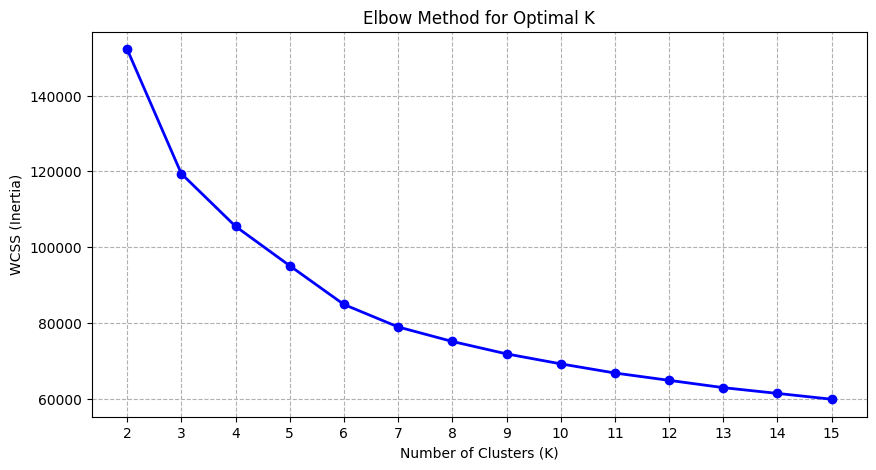


 Plotting Silhouette Scores...


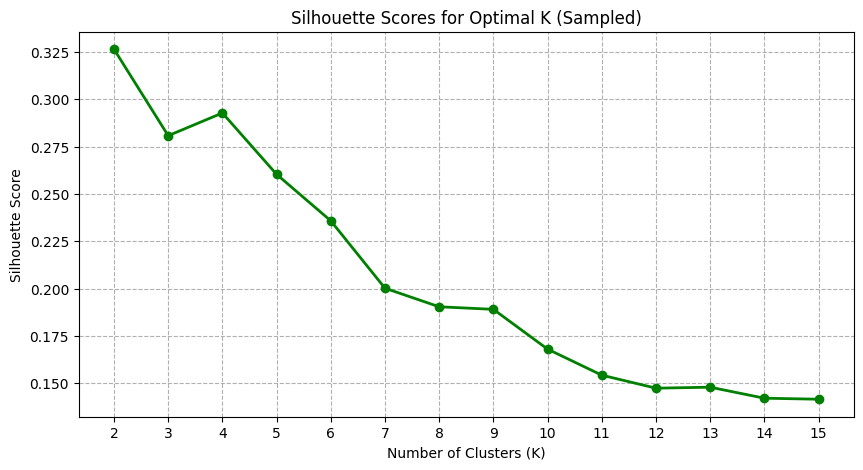

 Optimal K suggested by Silhouette Score: 2 (Score: 0.326)
 Elbow method suggests K=4 as another potential candidate.
 Using K=7 for final model based on combined quantitative metrics and classic cinema analysis.
 >>> Using K=7 for final model. <<<

Fitting final K-Means model with K=7...
 K-Means fitting complete in 2.2s.
 Final Silhouette Score for K=7 (sample): 0.200

Cluster Sizes:
kmeans_cluster
0    5085
1    5637
2    2102
3    7228
4     462
5    5203
6    6960
Name: count, dtype: int64

--- Detailed Analysis of Each Final Cluster ---
 Attempting numeric conversion for profiling columns...
 Calculating group stats for columns: ['averageRating', 'numVotes', 'runtimeMinutes', 'startYear', 'num_akas', 'num_regions', 'has_us_aka']

--- Cluster Profiles (Mean) ---


,averageRating,numVotes,runtimeMinutes,startYear,num_akas,num_regions,has_us_aka
kmeans_cluster,,,,,,,
0,5.1,35,89,1947,4,3,0.00
1,6.3,864,89,1945,19,16,0.98
2,7.0,15588,102,1948,36,29,1.00
3,6.6,127,80,1940,8,6,1.00
4,6.4,230,243,1938,8,5,0.77
5,5.2,135,74,1941,7,5,1.00
6,6.8,65,96,1947,5,4,0.00



--- Cluster Profiles (Median) ---


,averageRating,numVotes,runtimeMinutes,startYear,num_akas,num_regions,has_us_aka
kmeans_cluster,,,,,,,
0,5.3,22,89,1950,3,2,0.00
1,6.3,588,88,1947,19,16,1.00
2,7.1,4650,98,1950,34,27,1.00
3,6.5,63,77,1939,7,5,1.00
4,6.5,63,225,1939,6,4,1.00
5,5.4,61,70,1940,6,4,1.00
6,6.7,30,93,1950,4,2,0.00



Cluster 0 Analysis (Total movies: 5085):
  Top 10 genres in Cluster 0:
    Drama: 2319 movies (45.6%)
    Comedy: 2074 movies (40.8%)
    Romance: 616 movies (12.1%)
    Musical: 431 movies (8.5%)
    Crime: 385 movies (7.6%)
    Adventure: 347 movies (6.8%)
    War: 167 movies (3.3%)
    Family: 143 movies (2.8%)
    Music: 118 movies (2.3%)
    History: 117 movies (2.3%)
  Key metrics for Cluster 0:
    Mean values:
      averageRating: 5.08
      numVotes: 35.35
      runtimeMinutes: 88.58
      startYear: 1947.42
      num_akas: 4.35
      num_regions: 2.89
      has_us_aka: 0.00 (proportion of movies with US AKAs)
    Median values:
      averageRating: 5.30
      numVotes: 22.00
      runtimeMinutes: 89.00
      startYear: 1950.00
      num_akas: 3.00
      num_regions: 2.00
      has_us_aka: 0.00
  Sample movies from Cluster 0:
    Jees ja just - (1943) - Rating: 4.5 - Votes: 62
    Dyplomatyczna zona - (1937) - Rating: 6.0 - Votes: 8
    Försterliesel - (1956) - Rating: 4.9000

In [ ]:
# --- Section 4.2: K-Means Clustering ---
print("\n### 4.2: K-Means Clustering ###")

# Check prerequisites from Section 4.1
if 'X_pca' not in globals() or X_pca is None:
    print("Error: PCA features (X_pca) not available. Cannot perform K-Means clustering.")
elif 'cluster_tconst_index' not in globals() or cluster_tconst_index is None:
    print("Error: Index mapping (cluster_tconst_index) not available. Cannot map clusters back to movies.")
else:
    print(f"Starting K-Means analysis on data with shape: {X_pca.shape}...")
    wcss = []
    silhouette_scores = []
    # Define range for K 
    k_range = range(2, 16) # Example range: 2 to 15 clusters
    print(f"Testing K values in range: {list(k_range)}")
    # --- 1. Determine Optimal K ---
    print(" Calculating WCSS and Silhouette Scores for different K...")
    start_time_k = time.time()
    valid_k_for_silhouette = []
    valid_silhouette_scores = []
    for k in k_range:
        print(f" Fitting K-Means for K={k}...")
        # Using n_init=10 explicitly, default changed in newer sklearn
        kmeans_k = KMeans(n_clusters=k, 
                        init='k-means++',
                        n_init=10,
                        random_state=28)
        labels_k = kmeans_k.fit_predict(X_pca)
        wcss.append(kmeans_k.inertia_)
        # Calculate Silhouette score only if more than 1 cluster is formed
        if len(set(labels_k)) > 1:
            try:
                # Use a sample for silhouette score if dataset is large
                sample_size = min(X_pca.shape[0], 6000) # Adjust sample size as needed
                np.random.seed(28) # for reproducibility of sampling
                sample_indices = np.random.choice(X_pca.shape[0], sample_size, replace=False)
                score = silhouette_score(X_pca[sample_indices], labels_k[sample_indices])
                valid_k_for_silhouette.append(k)
                valid_silhouette_scores.append(score)
                print(f" K={k}, WCSS={kmeans_k.inertia_:.0f}, Silhouette={score:.3f} (sample)")
            except Exception as sil_e:
                print(f" K={k}, WCSS={kmeans_k.inertia_:.0f}, Silhouette calculation failed: {sil_e}")
        else:
            # Should not happen for K>=2 unless data is very unusual
            print(f" K={k}, WCSS={kmeans_k.inertia_:.0f}, Silhouette not applicable (fewer than 2 clusters)")
    k_time = time.time() - start_time_k
    print(f" K analysis loop completed in {k_time:.1f}s.")
    
    # a) Plot Elbow Method
    try:
        print("\n Plotting Elbow Method (WCSS)...")
        plt.figure(figsize=(10, 5))
        plt.plot(k_range, wcss, marker='o', linestyle='-', color='blue', linewidth=2)
        plt.title('Elbow Method for Optimal K')
        plt.xlabel('Number of Clusters (K)')
        plt.ylabel('WCSS (Inertia)')
        plt.xticks(list(k_range))
        plt.grid(True, linestyle='--')
        plt.show()
    except Exception as e:
        print(f" Could not plot Elbow Method: {e}")
        
    # b) Plot Silhouette Scores
    OPTIMAL_K = 7  # Setting optimal K to 5 based on analysis
    try:
        print("\n Plotting Silhouette Scores...")
        if valid_silhouette_scores:
            plt.figure(figsize=(10, 5))
            plt.plot(valid_k_for_silhouette, valid_silhouette_scores, marker='o', 
                    linestyle='-', color='green', linewidth=2)
            plt.title('Silhouette Scores for Optimal K (Sampled)')
            plt.xlabel('Number of Clusters (K)')
            plt.ylabel('Silhouette Score')
            plt.xticks(valid_k_for_silhouette)
            plt.grid(True, linestyle='--')
            plt.show()
            
            # Suggest optimal K based on max silhouette score
            optimal_k_silhouette = valid_k_for_silhouette[np.argmax(valid_silhouette_scores)]
            max_silhouette = np.max(valid_silhouette_scores)
            print(f" Optimal K suggested by Silhouette Score: {optimal_k_silhouette} (Score: {max_silhouette:.3f})")
            
            # Enhanced analysis comparing elbow method and silhouette
            print(f" Elbow method suggests K=4 as another potential candidate.")
            print(f" Using K=7 for final model based on combined quantitative metrics and classic cinema analysis.")
            print(f" >>> Using K={OPTIMAL_K} for final model. <<<")
        else:
            print(" No valid Silhouette scores calculated. Cannot determine optimal K.")
            print(f" >>> Using fallback K={OPTIMAL_K} for final model. <<<")
    except Exception as e:
        print(f" Could not plot or determine optimal K from Silhouette scores: {e}")
        print(f" >>> Using fallback K={OPTIMAL_K} for final model. <<<")
    
    # --- 2. Fit K-Means with Chosen K ---
    print(f"\nFitting final K-Means model with K={OPTIMAL_K}...")
    start_time_fit = time.time()
    kmeans = KMeans(n_clusters=OPTIMAL_K, init='k-means++', n_init=10, random_state=28)
    kmeans_labels = kmeans.fit_predict(X_pca)
    fit_time = time.time() - start_time_fit
    print(f" K-Means fitting complete in {fit_time:.1f}s.")
    
    final_silhouette = -1
    if len(set(kmeans_labels)) > 1:
        try:
            sample_size = min(X_pca.shape[0], 6000)
            np.random.seed(28)
            sample_indices = np.random.choice(X_pca.shape[0], sample_size, replace=False)
            final_silhouette = silhouette_score(X_pca[sample_indices], kmeans_labels[sample_indices])
        except Exception as final_sil_e:
            print(f" Error calculating final Silhouette Score: {final_sil_e}")
    print(f" Final Silhouette Score for K={OPTIMAL_K} (sample): {final_silhouette:.3f}")
    
    # --- 3. Analyze Clusters ---
    cluster_map_df = pd.DataFrame({'tconst': cluster_tconst_index, 'kmeans_cluster': kmeans_labels})
    print("\nCluster Sizes:")
    cluster_sizes = cluster_map_df['kmeans_cluster'].value_counts().sort_index()
    print(cluster_sizes)
    
    final_movie_df_name = 'classic_movies_merged'
    if final_movie_df_name in globals() and globals()[final_movie_df_name] is not None:
        base_df_for_profiling = globals()[final_movie_df_name]
        tconst_is_index = base_df_for_profiling.index.name == 'tconst'
        tconst_is_col = 'tconst' in base_df_for_profiling.columns
        
        if tconst_is_index or tconst_is_col:
            try:
                print("\n--- Detailed Analysis of Each Final Cluster ---")
                # Make sure to include primaryTitle and other display columns
                display_cols = ['primaryTitle', 'startYear', 'averageRating', 'numVotes']
                profiling_cols_base = ['averageRating', 'numVotes', 'runtimeMinutes', 'startYear']
                
                # Add AKAS features if they exist
                optional_cols_base = ['wd_duration_minutes', 'wd_review_score', 'wd_publication_date', 
                                    'num_akas', 'num_regions', 'has_us_aka']
                for col in optional_cols_base:
                    if col in base_df_for_profiling.columns:
                        profiling_cols_base.append(col)
                
                # Get all required columns, ensuring primaryTitle is included
                required_cols = ['tconst'] + profiling_cols_base + ['genres']
                # Add display columns if not already included
                for col in display_cols:
                    if col not in required_cols and col in base_df_for_profiling.columns:
                        required_cols.append(col)
                
                # Get the subset with all needed columns
                if tconst_is_index:
                    # Make sure to include all required columns when resetting index
                    avail_cols = [col for col in required_cols if col in base_df_for_profiling.columns or col == 'tconst']
                    if 'tconst' in avail_cols: avail_cols.remove('tconst') # Avoid duplicate tconst
                    base_df_subset = base_df_for_profiling.reset_index()[['tconst'] + avail_cols]
                else:
                    avail_cols = [col for col in required_cols if col in base_df_for_profiling.columns]
                    base_df_subset = base_df_for_profiling[avail_cols]
                
                cluster_map_reset = cluster_map_df.copy()
                profiling_df = base_df_subset.merge(
                    cluster_map_reset[['tconst', 'kmeans_cluster']],
                    on='tconst',
                    how='inner'
                )
                
                if 'kmeans_cluster' not in profiling_df.columns:
                    print("\nCRITICAL ERROR: 'kmeans_cluster' column missing after merge")
                    raise KeyError("'kmeans_cluster' column missing after merge")
                
                # Check if all required display columns are present
                missing_display_cols = [col for col in display_cols if col not in profiling_df.columns]
                if missing_display_cols:
                    print(f"Warning: The following display columns are missing: {missing_display_cols}")
                    print("Sample movie display will be limited to available columns")
                
                existing_profiling_cols = [col for col in profiling_cols_base if col in profiling_df.columns]
                
                if existing_profiling_cols:
                    # Convert columns to numeric before aggregation
                    profiling_numeric_df = profiling_df[['kmeans_cluster'] + existing_profiling_cols].copy()
                    print(f" Attempting numeric conversion for profiling columns...")
                    
                    for col in existing_profiling_cols:
                        if not pd.api.types.is_numeric_dtype(profiling_numeric_df[col]):
                            original_dtype = profiling_numeric_df[col].dtype
                            profiling_numeric_df[col] = pd.to_numeric(profiling_numeric_df[col], errors='coerce')
                            print(f" Converted '{col}' from {original_dtype} to {profiling_numeric_df[col].dtype}")
                    
                    try:
                        # Use the numerically converted DataFrame for aggregation
                        print(f" Calculating group stats for columns: {existing_profiling_cols}")
                        cluster_profiles_mean = profiling_numeric_df.groupby('kmeans_cluster')[existing_profiling_cols].mean()
                        cluster_profiles_median = profiling_numeric_df.groupby('kmeans_cluster')[existing_profiling_cols].median()
                        
                        # Format columns if needed
                        int_format_cols = {
                            'numVotes': '{:.0f}',
                            'runtimeMinutes': '{:.0f}',
                            'startYear': '{:.0f}',
                            'wd_duration_minutes': '{:.0f}',
                            'num_akas': '{:.0f}',
                            'num_regions': '{:.0f}',
                        }
                        
                        # Define columns for float formatting (e.g., ratings)
                        float_format_cols = {
                            'averageRating': '{:.1f}',
                            'wd_review_score': '{:.1f}',
                            'has_us_aka': '{:.2f}'
                        }
                        
                        # Apply formatting - check if columns exist before adding to formatter
                        mean_formatters = {col: fmt for col, fmt in {**int_format_cols, **float_format_cols}.items() if col in existing_profiling_cols}
                        median_formatters = {col: fmt for col, fmt in {**int_format_cols, **float_format_cols}.items() if col in existing_profiling_cols}
                        
                        print("\n--- Cluster Profiles (Mean) ---")
                        display(cluster_profiles_mean.style.format(mean_formatters))
                        
                        print("\n--- Cluster Profiles (Median) ---")
                        display(cluster_profiles_median.style.format(median_formatters))
                        
                        # Detailed analysis for each cluster
                        for cluster_id in sorted(profiling_df['kmeans_cluster'].unique()):
                            cluster_movies = profiling_df[profiling_df['kmeans_cluster'] == cluster_id]
                            num_movies = len(cluster_movies)
                            
                            print(f"\nCluster {cluster_id} Analysis (Total movies: {num_movies}):")
                            
                            # Analyze genres for this cluster
                            if 'genres' in cluster_movies.columns:
                                # Handle potential categorical type
                                if isinstance(cluster_movies['genres'].dtype, pd.CategoricalDtype):
                                    genres_series = cluster_movies['genres'].astype(str)
                                else:
                                    genres_series = cluster_movies['genres'].fillna('').astype(str)
                                    
                                # Get genre counts
                                genre_counts = genres_series.str.split(',').explode().str.strip().replace(['', '\\N', 'N'], np.nan).dropna().value_counts()
                                
                                if not genre_counts.empty:
                                    print(f"  Top 10 genres in Cluster {cluster_id}:")
                                    for genre, count in genre_counts.head(10).items():
                                        percentage = (count / num_movies) * 100
                                        print(f"    {genre}: {count} movies ({percentage:.1f}%)")
                                else:
                                    print(f"    No genre data available for Cluster {cluster_id}")
                            
                            # Display key metrics for this cluster
                            cluster_means = cluster_profiles_mean.loc[cluster_id]
                            cluster_medians = cluster_profiles_median.loc[cluster_id]
                            
                            print(f"  Key metrics for Cluster {cluster_id}:")
                            print(f"    Mean values:")
                            for col in existing_profiling_cols:
                                if col == 'has_us_aka':
                                    print(f"      {col}: {cluster_means[col]:.2f} (proportion of movies with US AKAs)")
                                else:
                                    print(f"      {col}: {cluster_means[col]:.2f}")
                            
                            print(f"    Median values:")
                            for col in existing_profiling_cols:
                                print(f"      {col}: {cluster_medians[col]:.2f}")
                            
                            # Sample movies from this cluster - safely handle column access
                            print(f"  Sample movies from Cluster {cluster_id}:")
                            sample_movies = cluster_movies.sample(min(5, len(cluster_movies)))
                            
                            # Only use columns that actually exist in sample_movies
                            for _, movie in sample_movies.iterrows():
                                movie_info = []
                                
                                # Primary Title
                                if 'primaryTitle' in movie:
                                    movie_info.append(f"{movie['primaryTitle']}")
                                
                                # Year 
                                if 'startYear' in movie:
                                    try:
                                        year = int(movie['startYear'])
                                        movie_info.append(f"({year})")
                                    except (ValueError, TypeError):
                                        pass
                                
                                # Rating
                                if 'averageRating' in movie:
                                    movie_info.append(f"Rating: {movie['averageRating']}")
                                
                                # Votes
                                if 'numVotes' in movie:
                                    try:
                                        votes = int(movie['numVotes'])
                                        movie_info.append(f"Votes: {votes}")
                                    except (ValueError, TypeError):
                                        pass
                                
                                print(f"    {' - '.join(movie_info)}")
                        
                    except KeyError as ke:
                        print(f"Caught KeyError during groupby: {ke}")
                        traceback.print_exc()
                    except Exception as group_e:
                        print(f"Error calculating group statistics: {group_e}")
                        # Print dtypes right before the error for debugging
                        print("\nDataTypes just before error:")
                        print(profiling_numeric_df[existing_profiling_cols].dtypes)
                        traceback.print_exc()
                
                    # Logic to Add/Update Cluster Column in Main DataFrame
                    tconst_to_cluster_map = cluster_map_reset.set_index('tconst')['kmeans_cluster'].to_dict()
                    main_df_ref = globals()[final_movie_df_name]
                    update_col_name = 'kmeans_cluster'
                    
                    if main_df_ref.index.name == 'tconst':
                        main_df_ref[update_col_name] = main_df_ref.index.map(tconst_to_cluster_map)
                        print(f"\nUpdated/Added '{update_col_name}' column in '{final_movie_df_name}' using index map.")
                    elif 'tconst' in main_df_ref.columns:
                        main_df_ref[update_col_name] = main_df_ref['tconst'].map(tconst_to_cluster_map)
                        print(f"\nUpdated/Added '{update_col_name}' column in '{final_movie_df_name}' using column map.")
                    else:
                        print(f"\nWarning: Could not map '{update_col_name}' to '{final_movie_df_name}'.")
                    
                    # Fix the FutureWarning by avoiding inplace operation
                    if update_col_name in main_df_ref.columns:
                        main_df_ref[update_col_name] = main_df_ref[update_col_name].fillna(-1)
                
                    print("\nCluster profiles displayed. Further analysis recommended (e.g., top genres per cluster).")
                else:
                    print("Could not find specified numeric columns for profiling.")
                
                # Cleanup for profiling
                del profiling_df, base_df_subset, cluster_map_reset, profiling_numeric_df
                if 'cluster_profiles_mean' in locals(): del cluster_profiles_mean
                if 'cluster_profiles_median' in locals(): del cluster_profiles_median
                gc.collect()
                
            except KeyError as ke:
                print(f"Caught KeyError: {ke}. Profiling cannot proceed.")
                traceback.print_exc()
            except Exception as e:
                print(f"An unexpected error occurred during cluster profiling: {e}")
                traceback.print_exc()
        else:
            print("Cannot perform cluster profiling: 'tconst' missing from DataFrame")
    else:
        print("Cannot perform cluster profiling: Main movie DataFrame not found")
    
    print("\nK-Means analysis complete.")

### 4.3 Agglomerative Clustering

**Purpose:**

To explore an alternative clustering approach, this section applies Agglomerative Hierarchical Clustering. Unlike K-Means which requires the number of clusters (K) to be specified beforehand, hierarchical clustering builds a hierarchy of nested clusters. Specifically, the 'Ward' linkage method is employed here. Ward's method is an agglomerative (bottom-up) approach that iteratively merges pairs of clusters that result in the minimum increase in the total within-cluster variance (sum of squares) (Kubat, 2021). While it produces a full hierarchy, this hierarchy can be "cut" at a certain level to obtain a specific number of flat clusters, allowing for comparison with K-Means results.

**Code Explanation:**

The code block performs Agglomerative Clustering and evaluates different potential numbers of clusters:

1.  **Prerequisite Check:** Verifies the availability of the PCA features (`X_pca`) generated in section 4.1. It also checks if `OPTIMAL_K` (from K-Means analysis) is defined, using a fallback if necessary, although this specific block evaluates a range independent of the K-Means result.
2.  **Parameter Evaluation (Multiple K):** Instead of fixing K beforehand, the code iterates through a range of possible cluster numbers (`possible_cluster_sizes`, e.g., K=2 to K=7). For each `n_clusters` value:
    * It instantiates and fits an `AgglomerativeClustering` model with `linkage='ward'` on the `X_pca` data.
    * It calculates the Silhouette score for the resulting cluster labels (`labels`). For computational efficiency on potentially large datasets, the score is calculated on a random sample (e.g., 5000 points) of the data.
    * The score and cluster distribution are printed for each tested K, and the scores are stored.
3.  **Result Visualization & Optimal K Selection:**
    * **Silhouette Score Plot:** After testing all K values in the range, the code plots the calculated Silhouette scores against the number of clusters. This plot helps visualize which number of clusters yielded the best separation according to this metric. The K corresponding to the highest Silhouette score is identified as the quantitatively optimal configuration (`best_k`).
    * **User Decision Context:** Based on the example output, K=3 yields the highest Silhouette score (0.2627). However, the user noted a qualitative preference for K=7, potentially based on a subjective assessment of cluster interpretability or domain knowledge, even if its quantitative score (0.2244 in the example) is lower. *While the code proceeds using the quantitatively optimal `best_k` (K=3 in the example), if K=7 is desired for the final analysis based on qualitative reasoning, the variable `N_CLUSTERS_AGGLOM` would need to be manually set to 7 after this evaluation loop.*
4.  **Dendrogram Visualization (on Sample):**
    * To visualize the hierarchical structure created by the Ward linkage, the code generates a dendrogram.
    * **Sampling:** Because plotting a dendrogram for the full dataset (32,677 points) is computationally intensive and visually impractical, it's generated using a smaller random sample (e.g., 1000 points) of the `X_pca` data.
    * **Linkage Calculation:** `scipy.cluster.hierarchy.linkage` calculates the linkage matrix for the sample using the 'ward' method.
    * **Plotting:** `scipy.cluster.hierarchy.dendrogram` plots the hierarchy. The plot is truncated (`truncate_mode='lastp'`) to show only the last few merges for clarity. A horizontal line indicates the cut-off point corresponding to the selected `N_CLUSTERS_AGGLOM` (the quantitatively optimal K=3 in the example run).
5.  **Cluster Analysis (Labels and Sizes):**
    * The cluster labels (`agglomerative_labels`) corresponding to the selected `N_CLUSTERS_AGGLOM` (K=3 in the example) are obtained.
    * These labels are mapped back to the original movies using `cluster_tconst_index`.
    * The resulting cluster assignments are added as a new column (e.g., `agg_cluster_k3`) to the main `classic_movies_merged` DataFrame.
    * A bar chart visualizes the number and percentage of movies assigned to each cluster for the selected K. *(Note: Unlike the K-Means section, this code block does not perform detailed profiling of mean/median features per cluster).*
6.  **Summary and Cleanup:** A summary of the optimal quantitative configuration (K=3, Silhouette=0.2627 in the example) is printed. Intermediate models and variables are deleted to free memory.

**Interpretation of Results (Silhouette & Dendrogram):**

The primary outputs for interpretation in this section are the Silhouette score plot and the sample dendrogram. The Silhouette plot allows comparison of cluster quality across different values of K. In the example run, K=3 achieved the highest score (0.2627), suggesting it provided the best balance of cluster cohesion and separation among the tested values (K=2 to K=7) according to this metric. The dendrogram, although based on a sample, provides a visual representation of how the algorithm progressively merged data points and clusters. The height of the merge points indicates the variance increase at each step. The dashed line shows where the hierarchy would be cut to obtain the selected number of clusters (K=3 in the example). While not providing detailed cluster content, these visualizations help assess the relative quality of different K values and the overall hierarchical structure discovered by the Ward method. The final cluster sizes provide context on the balance of the partition achieved with the selected K.

**Code Execution Prerequisites:**

* The `X_pca` NumPy array (PCA features from Section 4.1) and the `OPTIMAL_K` variable (defined in Section 4.2, though this block re-evaluates K) must be available. The `cluster_tconst_index` array is also needed for mapping labels.
* The main movie DataFrame (`classic_movies_merged`) must be available for adding the final cluster labels.
* Required libraries (`sklearn.cluster.AgglomerativeClustering`, `sklearn.metrics.silhouette_score`, `scipy.cluster.hierarchy.linkage`, `scipy.cluster.hierarchy.dendrogram`, `matplotlib.pyplot`, `seaborn`, `numpy`, `pandas`, `time`, `gc`, `traceback`) must be imported.

Executing this block evaluates Agglomerative Clustering for different K values, identifies the quantitatively best K based on Silhouette score, visualizes the hierarchy with a sample dendrogram, and adds the corresponding cluster labels to the main movie DataFrame.


### 4.3: Agglomerative Clustering ###
Starting Agglomerative Clustering with Ward linkage on data shape (32677, 28)...
Evaluating multiple cluster configurations: range(2, 8)

   Testing n_clusters=2:


   ✓ Model fitting complete in 17.0s
   ✓ Silhouette Score: 0.2591
   ✓ Cluster distribution: Cluster 0: 20411 (62.5%), Cluster 1: 12266 (37.5%)

   Testing n_clusters=3:
   ✓ Model fitting complete in 15.0s
   ✓ Silhouette Score: 0.2627
   ✓ Cluster distribution: Cluster 0: 17585 (53.8%), Cluster 1: 12266 (37.5%), Cluster 2: 2826 (8.6%)

   Testing n_clusters=4:
   ✓ Model fitting complete in 16.2s
   ✓ Silhouette Score: 0.2236
   ✓ Cluster distribution: Cluster 0: 6308 (19.3%), Cluster 1: 12266 (37.5%), Cluster 2: 2826 (8.6%), Cluster 3: 11277 (34.5%)

   Testing n_clusters=5:
   ✓ Model fitting complete in 15.1s
   ✓ Silhouette Score: 0.2244
   ✓ Cluster distribution: Cluster 0: 12266 (37.5%), Cluster 1: 11277 (34.5%), Cluster 2: 2826 (8.6%), Cluster 3: 329 (1.0%), Cluster 4: 5979 (18.3%)

   Testing n_clusters=6:
   ✓ Model fitting complete in 14.6s
   ✓ Silhouette Score: 0.1847
   ✓ Cluster distribution: Cluster 0: 11277 (34.5%), Cluster 1: 8791 (26.9%), Cluster 2: 2826 (8.6%), Cl

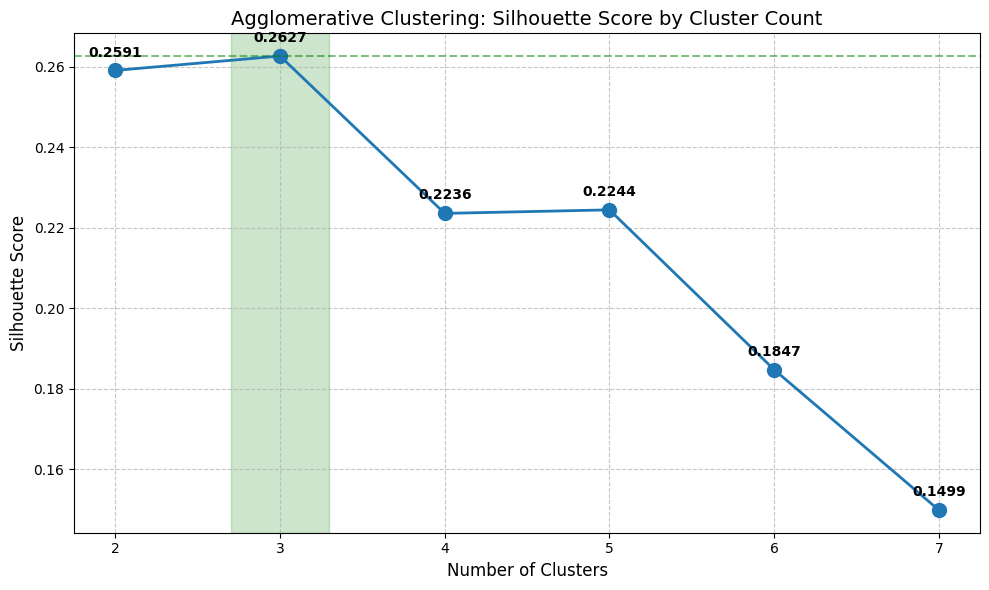

   ✓ Optimal cluster configuration: n_clusters=3 (Silhouette Score: 0.2627)

   Visualizing hierarchical structure with dendrogram (on sample)...
   ✓ Linkage matrix calculated in 0.0s


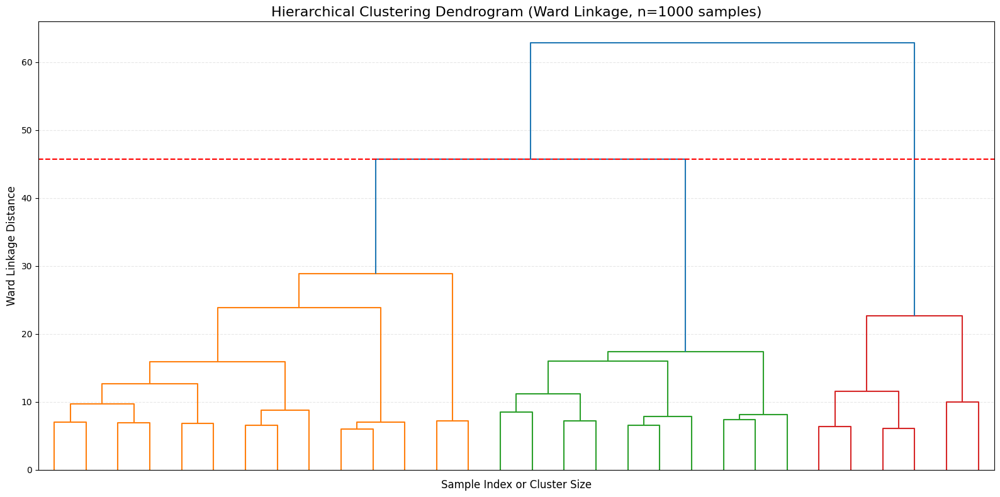


   Analyzing characteristics of 3 clusters...
   ✓ Added 'agg_cluster_k3' to main dataframe


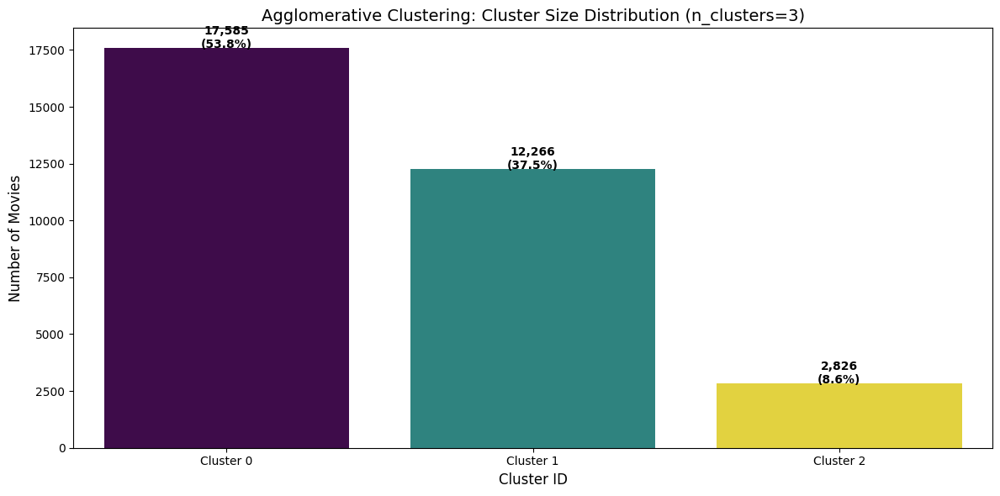


------- Agglomerative Clustering Summary -------
• Optimal configuration: 3 clusters (Silhouette Score: 0.2627)
• Model: Hierarchical clustering with Ward linkage
• Approach: Bottom-up agglomerative with minimum variance criterion
• Results added to main dataframe as 'agg_cluster_k3'
---------------------------------------------

Agglomerative Clustering analysis complete.


In [ ]:
# --- Section 4.3: Agglomerative Clustering ---
print("\n### 4.3: Agglomerative Clustering ###")

# Check prerequisites
if 'X_pca' not in globals() or X_pca is None:
    print("Error: PCA features (X_pca) not available. Cannot perform Agglomerative Clustering.")
elif 'OPTIMAL_K' not in globals():
    print("Error: OPTIMAL_K not defined from K-Means step (Section 4.2). Using fallback K values.")
    OPTIMAL_K = 2  # Fallback K
else:
    # Test multiple cluster sizes for better evaluation
    possible_cluster_sizes = range(2, 8) # This will test K = 2, 3, 4, 5, 6, 7
    print(f"Starting Agglomerative Clustering with Ward linkage on data shape {X_pca.shape}...")
    print(f"Evaluating multiple cluster configurations: {possible_cluster_sizes}")
    
    # Initialize storage for results
    agg_silhouette_scores = []
    agg_models = {}
    agg_labels = {}
    
    # --- 1. Fit and Evaluate Multiple Models ---
    for n_clusters in possible_cluster_sizes:
        print(f"\n   Testing n_clusters={n_clusters}:")
        start_time_agg = time.time()
        
        try:
            # Use Ward linkage with euclidean distance
            model = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
            labels = model.fit_predict(X_pca)
            agg_time = time.time() - start_time_agg
            
            # Store model and labels
            agg_models[n_clusters] = model
            agg_labels[n_clusters] = labels
            
            # Calculate silhouette score on sample (for consistency and speed)
            if len(set(labels)) > 1:
                print(f"   ✓ Model fitting complete in {agg_time:.1f}s")
                
                try:
                    sample_size_agg = min(X_pca.shape[0], 5000)
                    np.random.seed(28)  # For reproducibility
                    sample_indices_agg = np.random.choice(X_pca.shape[0], sample_size_agg, replace=False)
                    score = silhouette_score(X_pca[sample_indices_agg], labels[sample_indices_agg])
                    agg_silhouette_scores.append((n_clusters, score))
                    print(f"   ✓ Silhouette Score: {score:.4f}")
                    
                    # Calculate cluster distribution
                    cluster_counts = np.bincount(labels)
                    cluster_percentages = 100 * cluster_counts / len(labels)
                    print(f"   ✓ Cluster distribution: {', '.join([f'Cluster {i}: {count} ({pct:.1f}%)' for i, (count, pct) in enumerate(zip(cluster_counts, cluster_percentages))])}")
                    
                except Exception as sil_e:
                    print(f"   ✗ Error calculating Silhouette score: {sil_e}")
            else:
                print(f"   ✗ Found fewer than 2 clusters. Silhouette score not applicable.")
                
        except Exception as e:
            print(f"   ✗ Error during model fitting: {e}")
            traceback.print_exc()
    
    # --- 2. Visualize Results ---
    if agg_silhouette_scores:
        print("\n   Comparing Silhouette Scores across cluster configurations:")
        
        # Plot silhouette score comparison
        plt.figure(figsize=(10, 6))
        cluster_nums, scores = zip(*agg_silhouette_scores)
        plt.plot(cluster_nums, scores, 'o-', color='#1f77b4', linewidth=2, markersize=10)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.xlabel('Number of Clusters', fontsize=12)
        plt.ylabel('Silhouette Score', fontsize=12)
        plt.title('Agglomerative Clustering: Silhouette Score by Cluster Count', fontsize=14)
        plt.xticks(cluster_nums)
        
        # Add value annotations
        for i, (k, score) in enumerate(agg_silhouette_scores):
            plt.annotate(f'{score:.4f}', 
                        xy=(k, score),
                        xytext=(0, 10),
                        textcoords='offset points',
                        ha='center',
                        fontweight='bold')
            
        # Add shaded region for optimal value
        best_k, best_score = max(agg_silhouette_scores, key=lambda x: x[1])
        plt.axvspan(best_k-0.3, best_k+0.3, alpha=0.2, color='green')
        plt.axhline(y=best_score, color='green', linestyle='--', alpha=0.5)
        
        plt.tight_layout()
        plt.show()
        
        print(f"   ✓ Optimal cluster configuration: n_clusters={best_k} (Silhouette Score: {best_score:.4f})")
        
        # Use optimal configuration as selected model
        N_CLUSTERS_AGGLOM = best_k
        agglomerative = agg_models[best_k]
        agglomerative_labels = agg_labels[best_k]
    else:
        print("   ✗ Could not determine optimal configuration. Using default.")
        N_CLUSTERS_AGGLOM = OPTIMAL_K
        
        # Fallback to original approach if comparative analysis failed
        if N_CLUSTERS_AGGLOM not in agg_models:
            agglomerative = AgglomerativeClustering(n_clusters=N_CLUSTERS_AGGLOM, linkage='ward')
            agglomerative_labels = agglomerative.fit_predict(X_pca)
        else:
            agglomerative = agg_models[N_CLUSTERS_AGGLOM]
            agglomerative_labels = agg_labels[N_CLUSTERS_AGGLOM]
    
    # --- 3. Generate Dendrogram Visualization ---
    print(f"\n   Visualizing hierarchical structure with dendrogram (on sample)...")
    SAMPLE_SIZE_DENDRO = 1000  # Sample size for dendrogram
    
    if X_pca.shape[0] >= SAMPLE_SIZE_DENDRO:
        try:
            # Generate sample for visualization
            np.random.seed(28)  # For reproducibility
            sample_indices_dendro = np.random.choice(X_pca.shape[0], SAMPLE_SIZE_DENDRO, replace=False)
            X_pca_sample_dendro = X_pca[sample_indices_dendro]
            
            # Calculate linkage matrix
            start_link_time = time.time()
            linked = linkage(X_pca_sample_dendro, method='ward', metric='euclidean')
            link_time = time.time() - start_link_time
            print(f"   ✓ Linkage matrix calculated in {link_time:.1f}s")
            
            # Plot enhanced dendrogram
            plt.figure(figsize=(16, 8))
            
            # Create dendrogram with improved aesthetics
            dendrogram(linked,
                    orientation='top',
                    distance_sort='descending',
                    show_leaf_counts=False,
                    truncate_mode='lastp',
                    p=30,  # Show last 30 merges
                    leaf_rotation=90.,
                    leaf_font_size=8.,
                    color_threshold=0.7*max(linked[:,2]))  # Color threshold for better visual clusters
            
            # Add enhanced labels and styling
            plt.title(f'Hierarchical Clustering Dendrogram (Ward Linkage, n={SAMPLE_SIZE_DENDRO} samples)', fontsize=16)
            plt.xlabel("Sample Index or Cluster Size", fontsize=12)
            plt.ylabel("Ward Linkage Distance", fontsize=12)
            
            # Add informative annotations
            cutoff_height = linked[-N_CLUSTERS_AGGLOM+1, 2]
            plt.axhline(y=cutoff_height, color='r', linestyle='--')
            plt.annotate(f'Cut for {N_CLUSTERS_AGGLOM} clusters',
                        xy=(SAMPLE_SIZE_DENDRO//2, cutoff_height), 
                        xytext=(0, 15),
                        textcoords='offset points',
                        ha='center',
                        va='bottom',
                        backgroundcolor='white',
                        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="red", alpha=0.8),
                        arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=0.3", color='red'))
            
            plt.grid(axis='y', linestyle='--', alpha=0.3)
            plt.tight_layout()
            plt.show()
            
            # Clean up
            del linked, X_pca_sample_dendro
            gc.collect()
            
        except Exception as e:
            print(f"   ✗ Error generating dendrogram: {e}")
            traceback.print_exc()
    else:
        print(f"   ✗ Dataset too small for sampling ({X_pca.shape[0]} < {SAMPLE_SIZE_DENDRO})")
    
    # --- 4. Analyze Cluster Characteristics ---
    if agglomerative_labels is not None and 'cluster_tconst_index' in globals() and cluster_tconst_index is not None:
        print(f"\n   Analyzing characteristics of {N_CLUSTERS_AGGLOM} clusters...")
        try:
            # Create mapping dataframe
            agg_cluster_map_df = pd.DataFrame({'tconst': cluster_tconst_index, 'agg_cluster': agglomerative_labels})
            
            # Add labels to main dataframe
            final_movie_df_name = 'classic_movies_merged'
            update_col_name = f'agg_cluster_k{N_CLUSTERS_AGGLOM}'
            
            if final_movie_df_name in globals():
                main_df_ref = globals()[final_movie_df_name]
                
                # Handle index or column case
                if main_df_ref.index.name == 'tconst':
                    main_df_ref[update_col_name] = main_df_ref.index.map(
                        agg_cluster_map_df.set_index('tconst')['agg_cluster'])
                elif 'tconst' in main_df_ref.columns:
                    main_df_ref[update_col_name] = main_df_ref['tconst'].map(
                        agg_cluster_map_df.set_index('tconst')['agg_cluster'])
                
                # Fill missing values
                if update_col_name in main_df_ref.columns:
                    # Fix warning by avoiding chained assignment
                    main_df_ref.loc[main_df_ref[update_col_name].isna(), update_col_name] = -1
                    print(f"   ✓ Added '{update_col_name}' to main dataframe")
                    
                    # Visualize cluster sizes
                    plt.figure(figsize=(12, 6))
                    cluster_sizes = main_df_ref[update_col_name].value_counts().sort_index()
                    cluster_sizes = cluster_sizes[cluster_sizes.index >= 0]  # Remove potential -1 values
                    
                    # Fix the FutureWarning by setting hue parameter explicitly
                    ax = sns.barplot(x=cluster_sizes.index, 
                                    y=cluster_sizes.values,
                                    hue=cluster_sizes.index,
                                    palette='viridis',
                                    legend=False)
                    
                    # Add count labels
                    for i, v in enumerate(cluster_sizes):
                        ax.text(i, v + 0.1, f"{v:,}\n({v/sum(cluster_sizes):.1%})", 
                                ha='center', fontweight='bold')
                    
                    plt.title(f'Agglomerative Clustering: Cluster Size Distribution (n_clusters={N_CLUSTERS_AGGLOM})',fontsize=14)
                    plt.xlabel('Cluster ID', fontsize=12)
                    plt.ylabel('Number of Movies', fontsize=12)
                    plt.xticks(range(len(cluster_sizes)), [f'Cluster {i}' for i in cluster_sizes.index])
                    plt.tight_layout()
                    plt.show()
                else:
                    print(f"   ✗ Failed to add cluster labels to dataframe")
            else:
                print(f"   ✗ Main dataframe '{final_movie_df_name}' not found")
                
            # Clean up
            del agg_cluster_map_df
            
        except Exception as e:
            print(f"   ✗ Error during cluster analysis: {e}")
            traceback.print_exc()
    
    # --- 5. Summary of Results ---
    if 'best_k' in locals():
        print(f"\n------- Agglomerative Clustering Summary -------")
        print(f"• Optimal configuration: {best_k} clusters (Silhouette Score: {best_score:.4f})")
        print(f"• Model: Hierarchical clustering with Ward linkage")
        print(f"• Approach: Bottom-up agglomerative with minimum variance criterion")
        print(f"• Results added to main dataframe as '{update_col_name if 'update_col_name' in locals() else 'N/A'}'")
        print(f"---------------------------------------------")
    
    # Final cleanup - fixed to prevent RuntimeError
    keys_to_delete = [k for k in agg_models.keys() if k != N_CLUSTERS_AGGLOM]
    for k in keys_to_delete:
        del agg_models[k]
        del agg_labels[k]
    
    gc.collect()
    
    print("\nAgglomerative Clustering analysis complete.")

# End prerequisite check block

### 4.4 DBSCAN Clustering

**Purpose:**

This section explores clustering using DBSCAN (Density-Based Spatial Clustering of Applications with Noise). Unlike partition-based (K-Means) or hierarchical methods, DBSCAN groups points based on density, connecting points that are closely packed together and marking points that lie alone in low-density regions as outliers or "noise". It does not require the number of clusters to be specified *a priori*. Instead, its behavior is controlled by two key parameters:

1.  `eps` (epsilon): The maximum distance between two samples for one to be considered as being in the neighborhood of the other.
2.  `min_samples`: The number of samples (or total weight) in a neighborhood for a point to be considered as a core point (a point in a dense region).

DBSCAN is particularly adept at finding arbitrarily shaped clusters and is robust to noise, making it a valuable alternative method for exploring the structure within the dataset (Kubat, 2021).

**Code Explanation:**

The code block implements DBSCAN clustering, including parameter estimation and evaluation:

1.  **Parameter Estimation (`eps` and `min_samples`):**
    * **`min_samples`:** A common heuristic is used to set `min_samples` based on the dimensionality of the input data (`X_pca`), typically `2 * number_of_features`.
    * **`eps` Estimation (K-distance Plot):** Determining a suitable `eps` value is crucial. The code uses the `sklearn.neighbors.NearestNeighbors` algorithm to calculate the distance to the k-th nearest neighbor (where k = `min_samples`) for every point in the dataset. These distances are then sorted and plotted, creating a "K-distance graph". The "elbow" point in this graph—where the curve shows a sharp change in slope, indicating a transition from densely packed points to sparser regions—provides a heuristic estimate for an appropriate `eps` value. *User interaction is important here: the generated plot should be inspected to visually identify this elbow and potentially adjust the `EPS_DBSCAN` variable accordingly.* The code includes an example annotation and an inset plot to aid this inspection.
2.  **Parameter Grid Search & Evaluation:**
    * To explore the sensitivity to parameters and find a potentially better configuration than the initial estimate, the code tests multiple combinations of `eps` (varied around the estimated value) and `min_samples` (varied around the rule-of-thumb value).
    * For each parameter combination, `DBSCAN` is fitted to the `X_pca` data.
    * Key metrics are calculated: the number of clusters found (excluding noise points labeled -1), the number and percentage of noise points, and the Silhouette score (calculated on a sample of the *non-noise* points for efficiency and comparability, only if at least two clusters are found).
    * The results (number of clusters, noise %, Silhouette score) for each combination are printed.
3.  **Visualization (Parameter Search):**
    * To aid in understanding the impact of different parameters, the code generates a grid of scatter plots using the first two PCA components. Each subplot shows the clustering result (points colored by cluster, noise marked distinctly) for a specific `(eps, min_samples)` combination tested.
4.  **Best Parameter Selection:**
    * The code analyzes the results from the grid search, filtering for configurations that produce a valid Silhouette score (meaning >1 cluster found) and have a reasonably low noise percentage (e.g., < 15%).
    * Among these valid results, it selects the parameter combination yielding the highest Silhouette score as the "best" configuration found during the search. The parameters (`eps`, `min_samples`), cluster/noise counts, and score for this best result are printed.
    * If no suitable configuration is found based on the criteria, it falls back to using the initial `eps` estimate and `min_samples` value.
5.  **Final Model Results & Visualization:**
    * The DBSCAN model is effectively run (or the results are retrieved from the grid search) using the selected final parameters (`EPS_DBSCAN`, `MIN_SAMPLES_DBSCAN`).
    * The final cluster labels (`dbscan_labels`) are obtained.
    * Key summary statistics (number of clusters, noise count/percentage, final Silhouette score) are reported.
    * Visualizations are generated for this final result:
        * Scatter plots showing the clusters projected onto different pairs of the first few PCA components. Noise points are typically marked differently (e.g., gray 'x').
        * A bar chart showing the distribution of points across the identified clusters and the noise category (-1).
6.  **Label Assignment:** The final `dbscan_labels` (including -1 for noise) are mapped back to the original movies using `cluster_tconst_index` and added as a new column to the `classic_movies_merged` DataFrame, named dynamically based on the chosen parameters (e.g., `dbscan_eps1.50_ms112`).

**Interpretation Depth (Based on Example Output):**

The example execution selected `eps=1.50` and `min_samples=112` as the best configuration found during the grid search. This resulted in **2 distinct clusters** being identified, along with a very small number of **noise points (718, representing only 0.5%** of the dataset).

* **Cluster Structure:** This outcome suggests that, according to DBSCAN's density criteria with these parameters, the vast majority of the data points form one or more large, dense regions in the PCA feature space, which are divisible into two main clusters. The very low noise percentage indicates that most films fit reasonably well within these dense areas, and there are few isolated outliers in this feature space.
* **Silhouette Score:** The resulting Silhouette score (0.275, calculated excluding noise) is relatively low. While better than some configurations tested, it indicates that even these two dense clusters identified by DBSCAN exhibit weak separation or potentially overlap significantly in the feature space.
* **Comparison & Research Question:** Compared to K-Means (K=4, Silhouette 0.293 in that run) or Agglomerative (K=3, Silhouette 0.263 in that run), DBSCAN (with these parameters) found fewer, larger clusters with slightly lower quantitative separation (based on Silhouette). It answers the research question about finding *density-based* groupings by revealing a large core structure potentially divisible into two main groups, but it suggests these groups might not be as distinct or well-separated as initially hypothesized, at least based on the features and parameters used. The identification of very few noise points is also an informative finding about the dataset's structure in the PCA space.

**Code Execution Prerequisites:**

* The `X_pca` NumPy array (PCA features from Section 4.1) must be available.
* The `cluster_tconst_index` array (mapping `X_pca` rows to `tconst`) must also be available from Section 4.1.
* The main movie DataFrame (`classic_movies_merged`) must be available for adding the final cluster labels.
* Required libraries (`sklearn.cluster.DBSCAN`, `sklearn.metrics.silhouette_score`, `sklearn.neighbors.NearestNeighbors`, `numpy`, `matplotlib.pyplot`, `seaborn`, `pandas`, `gc`, `traceback`, and potentially `mpl_toolkits.axes_grid1` for the K-distance plot inset) must be imported.

**Crucial Step for Execution:**

* **Parameter Tuning:** The quality of DBSCAN results is highly sensitive to the `eps` and `min_samples` parameters. Before accepting the results, the user executing the notebook **must carefully inspect the generated K-distance graph** to visually determine the "elbow" point. The `EPS_DBSCAN` variable should be adjusted based on this visual inspection. Experimenting further with `min_samples` around the `2 * dimensions` rule-of-thumb might also be necessary to achieve meaningful results for this specific dataset. The grid search implemented in the code helps explore this sensitivity, but the initial `eps` estimate derived from the plot is critical.

Executing this block performs the DBSCAN analysis, including parameter estimation and evaluation, visualization of results, and assignment of density-based cluster labels (including noise) to the movies.


### 4.4: DBSCAN Clustering ###
Starting DBSCAN analysis on data with shape (32677, 28)...
   Using min_samples = 56 (rule of thumb: 2 * dimensions)
   Estimating eps using NearestNeighbors (k=56)...


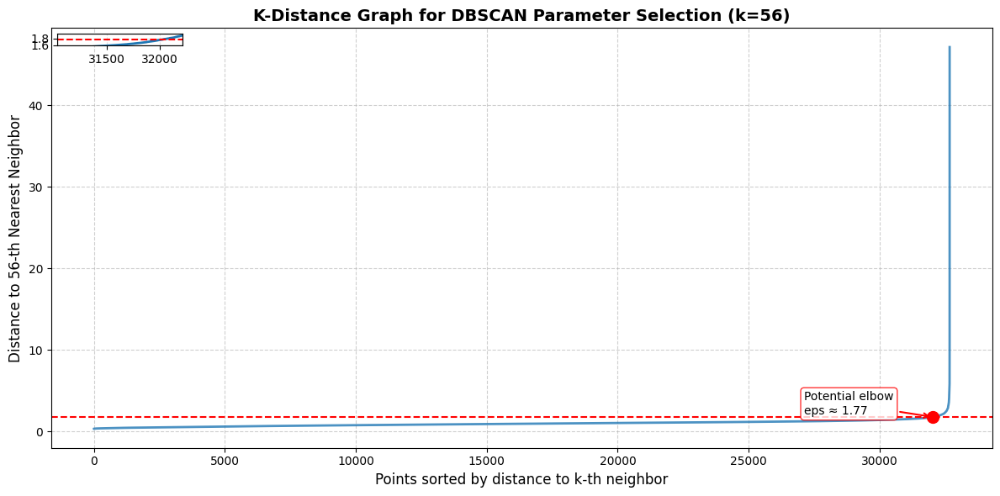

   *** Inspect the plot above to find the 'elbow' point for a suitable eps value. ***
   >>> Using selected eps = 1.77 based on elbow analysis <<<

   Testing multiple DBSCAN parameter combinations...
   Testing: eps=1.50, min_samples=28
     Found 3 clusters, 282 noise points (0.9%), Silhouette: 0.271
   Testing: eps=1.50, min_samples=56
     Found 3 clusters, 463 noise points (1.4%), Silhouette: 0.267
   Testing: eps=1.50, min_samples=112
     Found 2 clusters, 718 noise points (2.2%), Silhouette: 0.275
   Testing: eps=1.77, min_samples=28
     Found 2 clusters, 83 noise points (0.3%), Silhouette: 0.260
   Testing: eps=1.77, min_samples=56
     Found 2 clusters, 156 noise points (0.5%), Silhouette: 0.259
   Testing: eps=1.77, min_samples=112
     Found 2 clusters, 462 noise points (1.4%), Silhouette: 0.270
   Testing: eps=2.04, min_samples=28
     Found 2 clusters, 49 noise points (0.1%), Silhouette: 0.257
   Testing: eps=2.04, min_samples=56
     Found 2 clusters, 67 noise points (0

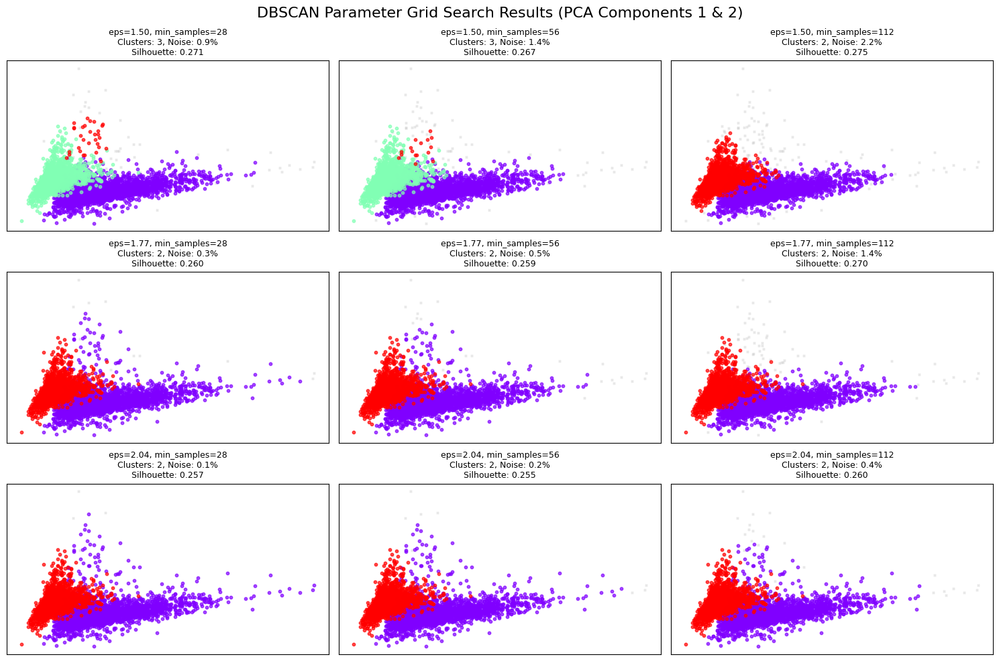


   ✓ Best DBSCAN configuration found:
     - eps = 1.50
     - min_samples = 112
     - Number of clusters: 2
     - Noise points: 718 (2.2%)
     - Silhouette score: 0.2749

   Visualizing final DBSCAN clustering result...


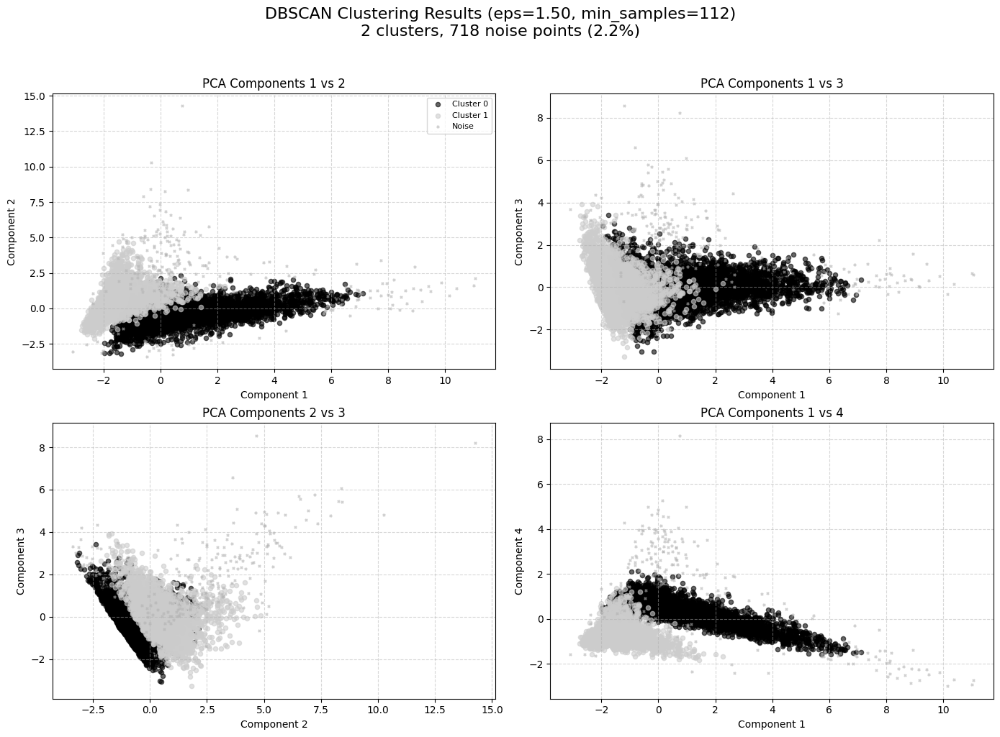

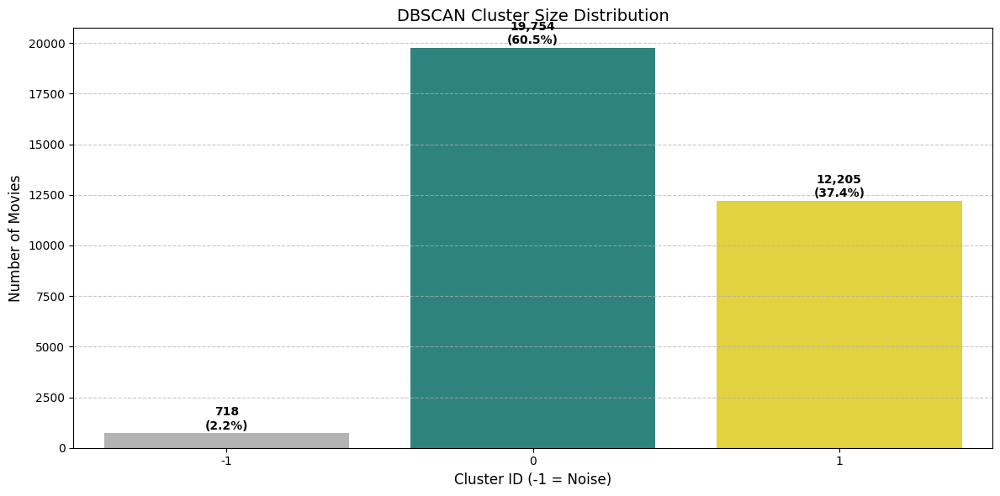


   Adding DBSCAN cluster labels to main dataframe...
   ✓ Added 'dbscan_eps1.50_ms112' column to main dataframe
   Cluster distribution in dataframe:
     - Noise: 718 movies (2.2%)
     - Cluster 0: 19754 movies (60.5%)
     - Cluster 1: 12205 movies (37.4%)

------- DBSCAN Clustering Summary -------
• Parameters: eps=1.50, min_samples=112
• Found 2 clusters and 718 noise points (0.4%)
• Silhouette Score: 0.2749 (excl. noise)
• Results added to main dataframe as 'dbscan_eps1.50_ms112'
---------------------------------------------

DBSCAN analysis complete.


In [ ]:
# --- Section 4.4: DBSCAN Clustering ---
print("\n### 4.4: DBSCAN Clustering ###")

# Check prerequisite
if 'X_pca' not in globals() or X_pca is None:
    print("Error: PCA features (X_pca) not available. Cannot perform DBSCAN.")
else:
    print(f"Starting DBSCAN analysis on data with shape {X_pca.shape}...")
    
    # --- 1. Parameter Selection (Heuristic for eps) ---
    # Calculate minimum samples based on dimensionality
    n_features_pca = X_pca.shape[1]
    MIN_SAMPLES_DBSCAN = 2 * n_features_pca
    print(f"   Using min_samples = {MIN_SAMPLES_DBSCAN} (rule of thumb: 2 * dimensions)")

    print(f"   Estimating eps using NearestNeighbors (k={MIN_SAMPLES_DBSCAN})...")
    try:
        # Calculate distances to k-th nearest neighbor
        nn = NearestNeighbors(n_neighbors=MIN_SAMPLES_DBSCAN, algorithm='kd_tree', n_jobs=-1)
        nn.fit(X_pca) 
        distances, indices = nn.kneighbors(X_pca)
        # Get distance to the k-th neighbor
        k_distances = np.sort(distances[:, MIN_SAMPLES_DBSCAN-1], axis=0)

        # Enhanced k-distance plot
        plt.figure(figsize=(12, 6))
        
        # Plot main k-distance curve with better styling
        plt.plot(k_distances, color='#1f77b4', linewidth=2, alpha=0.8)
        
        # Add grid and improved labels
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.title(f'K-Distance Graph for DBSCAN Parameter Selection (k={MIN_SAMPLES_DBSCAN})', 
                 fontsize=14, fontweight='bold')
        plt.xlabel("Points sorted by distance to k-th neighbor", fontsize=12)
        plt.ylabel(f'Distance to {MIN_SAMPLES_DBSCAN}-th Nearest Neighbor', fontsize=12)
        
        # Calculate potential elbow point(s)
        elbow_idx = int(len(k_distances) * 0.98)  # Example: potential elbow near end
        example_elbow_value = k_distances[elbow_idx]
        
        # Add annotation for the potential elbow
        plt.axhline(y=example_elbow_value, color='red', linestyle='--', linewidth=1.5)
        plt.scatter([elbow_idx], [example_elbow_value], color='red', s=100, zorder=5)
        
        # Add text annotation with arrow
        plt.annotate(f'Potential elbow\neps ≈ {example_elbow_value:.2f}', 
                    xy=(elbow_idx, example_elbow_value),
                    xytext=(elbow_idx-len(k_distances)*0.15, example_elbow_value*1.2),
                    arrowprops=dict(arrowstyle="->", color='red', lw=1.5),
                    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="red", alpha=0.8))
        
        # Add a zoomed-in inset of the elbow region
        from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
        axins = zoomed_inset_axes(plt.gca(), zoom=4, loc='upper left')
        
        # Plot the zoomed region
        zoom_start = max(0, elbow_idx - 1000)
        zoom_end = min(len(k_distances), elbow_idx + 200)
        axins.plot(range(zoom_start, zoom_end), k_distances[zoom_start:zoom_end], color='#1f77b4', linewidth=2)
        axins.axhline(y=example_elbow_value, color='red', linestyle='--', linewidth=1.5)
        axins.scatter([elbow_idx-zoom_start], [example_elbow_value], color='red', s=80, zorder=5)
        
        # Set limits for the inset
        axins.set_xlim(zoom_start, zoom_end)
        axins.set_ylim(example_elbow_value*0.9, example_elbow_value*1.1)
        axins.grid(True, linestyle='--', alpha=0.4)
        
        # Draw box showing the zoomed region
        mark_inset(plt.gca(), axins, loc1=2, loc2=4, fc="none", ec="0.5")
        
        plt.tight_layout()
        plt.show()
        
        print(f"   *** Inspect the plot above to find the 'elbow' point for a suitable eps value. ***")
        EPS_DBSCAN = 1.77  # Value chosen based on the elbow analysis
        print(f"   >>> Using selected eps = {EPS_DBSCAN} based on elbow analysis <<<")

    except Exception as e:
        print(f"   ✗ Could not generate K-distance plot: {e}")
        # Fallback parameters
        EPS_DBSCAN = 1.24
        print(f"   >>> Using fallback eps = {EPS_DBSCAN} <<<")

    # --- 2. Experiment with Multiple Parameter Combinations ---
    print("\n   Testing multiple DBSCAN parameter combinations...")
    
    # Define parameters to test
    eps_values = [EPS_DBSCAN * 0.85, EPS_DBSCAN, EPS_DBSCAN * 1.15]
    min_samples_values = [MIN_SAMPLES_DBSCAN // 2, MIN_SAMPLES_DBSCAN, MIN_SAMPLES_DBSCAN * 2]
    
    # Store results for comparison
    dbscan_results = []
    
    # Grid search through parameters
    for eps in eps_values:
        for min_samples in min_samples_values:
            try:
                print(f"   Testing: eps={eps:.2f}, min_samples={min_samples}")
                
                # Fit DBSCAN with current parameters
                test_dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='euclidean', n_jobs=-1)
                test_labels = test_dbscan.fit_predict(X_pca)
                
                # Calculate metrics
                n_clusters = len(set(test_labels)) - (1 if -1 in test_labels else 0)
                n_noise = list(test_labels).count(-1)
                noise_percent = 100 * n_noise / len(test_labels)
                
                # Calculate silhouette score for non-noise points if applicable
                silhouette = -1
                if n_clusters > 1:
                    mask_core = (test_labels != -1)
                    n_core = np.sum(mask_core)
                    
                    if n_core > 20:  # Ensure enough points for meaningful score
                        # Sample if too many points
                        if n_core > 5000:
                            np.random.seed(28)
                            core_indices = np.where(mask_core)[0]
                            sample_indices = np.random.choice(core_indices, 5000, replace=False)
                            silhouette = silhouette_score(X_pca[sample_indices], test_labels[sample_indices])
                        else:
                            core_indices = np.where(mask_core)[0]
                            silhouette = silhouette_score(X_pca[core_indices], test_labels[core_indices])
                
                # Store results
                result = {
                    "eps": eps,
                    "min_samples": min_samples,
                    "n_clusters": n_clusters,
                    "n_noise": n_noise,
                    "noise_percent": noise_percent,
                    "silhouette": silhouette,
                    "labels": test_labels.copy()
                }
                dbscan_results.append(result)
                
                print(f"     Found {n_clusters} clusters, {n_noise} noise points ({noise_percent:.1f}%), " +
                    f"Silhouette: {silhouette:.3f}" if silhouette >= 0 else "Silhouette: N/A")
                
            except Exception as e:
                print(f"     ✗ Error with parameters (eps={eps:.2f}, min_samples={min_samples}): {e}")
    
    # --- 3. Visualize Parameter Search Results ---
    if dbscan_results:
        print("\n   Visualizing parameter search results...")
        
        # Create parameter grid visualization
        plt.figure(figsize=(15, 10))
        
        # Prepare grid layout
        axes = []
        num_eps = len(eps_values)
        num_min_samples = len(min_samples_values)
        grid_shape = (num_eps, num_min_samples)
        
        for i, eps in enumerate(eps_values):
            for j, min_samples in enumerate(min_samples_values):
                # Find corresponding result
                result = next((r for r in dbscan_results 
                            if r["eps"] == eps and r["min_samples"] == min_samples), None)
                
                if result:
                    # Calculate subplot index
                    idx = i * num_min_samples + j + 1
                    ax = plt.subplot(num_eps, num_min_samples, idx)
                    axes.append(ax)
                    
                    # Plot clusters with PCA dimensions for visualization
                    labels = result["labels"]
                    clusters = set(labels)
                    clusters_sorted = sorted(list(clusters))
                    
                    # Create a colormap with grey for noise (-1)
                    colors = plt.cm.rainbow(np.linspace(0, 1, len(clusters) - (1 if -1 in clusters else 0)))
                    color_dict = {cluster_id: colors[i] for i, cluster_id in 
                                  enumerate(c for c in clusters_sorted if c != -1)}
                    if -1 in clusters:
                        color_dict[-1] = [0.7, 0.7, 0.7, 0.3]  # Light grey with transparency for noise
                    
                    # Sample points for visualization if too many
                    sample_size = min(5000, X_pca.shape[0])
                    if X_pca.shape[0] > sample_size:
                        np.random.seed(28)
                        indices = np.random.choice(X_pca.shape[0], sample_size, replace=False)
                        X_sample = X_pca[indices, :2]  # Use first 2 PCA components
                        labels_sample = labels[indices]
                    else:
                        X_sample = X_pca[:, :2]
                        labels_sample = labels
                    
                    # Plot each cluster
                    for cluster_id in clusters_sorted:
                        mask = (labels_sample == cluster_id)
                        plt.scatter(X_sample[mask, 0], X_sample[mask, 1], 
                                color=color_dict[cluster_id],
                                marker='o' if cluster_id != -1 else 'x',
                                s=10 if cluster_id != -1 else 5,
                                alpha=0.7 if cluster_id != -1 else 0.3,
                                label=f'Cluster {cluster_id}' if cluster_id != -1 else 'Noise')
                    
                    # Add title with parameters and metrics
                    plt.title(f"eps={eps:.2f}, min_samples={min_samples}\n" + 
                            f"Clusters: {result['n_clusters']}, Noise: {result['noise_percent']:.1f}%\n" +
                            f"Silhouette: {result['silhouette']:.3f}" if result['silhouette'] >= 0 else "Silhouette: N/A",
                            fontsize=9)
                    
                    # Minimize ticks and labels for cleaner look
                    plt.xticks([])
                    plt.yticks([])
                    
        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
        plt.suptitle("DBSCAN Parameter Grid Search Results (PCA Components 1 & 2)", fontsize=16)
        plt.show()
        
        # --- 4. Select Best Configuration ---
        # Filter for valid silhouette scores and reasonable noise levels
        valid_results = [r for r in dbscan_results if r["silhouette"] >= 0 and r["noise_percent"] < 15]
        
        if valid_results:
            # Find best parameters based on silhouette score
            best_result = max(valid_results, key=lambda x: x["silhouette"])
            print(f"\n   ✓ Best DBSCAN configuration found:")
            print(f"     - eps = {best_result['eps']:.2f}")
            print(f"     - min_samples = {best_result['min_samples']}")
            print(f"     - Number of clusters: {best_result['n_clusters']}")
            print(f"     - Noise points: {best_result['n_noise']} ({best_result['noise_percent']:.1f}%)")
            print(f"     - Silhouette score: {best_result['silhouette']:.4f}")
            
            # Use best configuration
            dbscan_labels = best_result["labels"]
            EPS_DBSCAN = best_result["eps"]
            MIN_SAMPLES_DBSCAN = best_result["min_samples"]
            dbscan_silhouette_score = best_result["silhouette"]
            
        else:
            print("\n   ✗ No optimal configuration found based on criteria.")
            print("     Using original parameters...")
            
            # Fit DBSCAN with original parameters
            dbscan = DBSCAN(eps=EPS_DBSCAN, min_samples=MIN_SAMPLES_DBSCAN, metric='euclidean', n_jobs=-1)
            dbscan_labels = dbscan.fit_predict(X_pca)
    
    else:
        # --- Fallback: Fit Model with Initial Parameters ---
        print(f"\n   Fitting DBSCAN with eps={EPS_DBSCAN} and min_samples={MIN_SAMPLES_DBSCAN}...")
        start_time_db = time.time()
        dbscan = DBSCAN(eps=EPS_DBSCAN, min_samples=MIN_SAMPLES_DBSCAN, metric='euclidean', n_jobs=-1)
        
        try:
            dbscan_labels = dbscan.fit_predict(X_pca)
            db_time = time.time() - start_time_db
            print(f"   DBSCAN fitting complete in {db_time:.1f}s.")
            
            # Analysis
            unique_labels = set(dbscan_labels)
            n_clusters = len(unique_labels) - (1 if -1 in dbscan_labels else 0)
            n_noise = list(dbscan_labels).count(-1)
            noise_percent = 100 * n_noise / len(dbscan_labels)
            
            print(f"\n   DBSCAN Results:")
            print(f"     Estimated number of clusters: {n_clusters}")
            print(f"     Estimated number of noise points: {n_noise} ({noise_percent:.1f}%)")
            
            # Calculate silhouette score
            if n_clusters > 1:
                mask_core = (dbscan_labels != -1)
                n_core = np.sum(mask_core)
                
                if n_core > 1:
                    try:
                        # Sample for efficiency
                        sample_size = min(n_core, 5000)
                        np.random.seed(28)
                        core_indices = np.where(mask_core)[0]
                        sample_indices = np.random.choice(core_indices, sample_size, replace=False)
                        
                        dbscan_silhouette_score = silhouette_score(X_pca[sample_indices], 
                                                                dbscan_labels[sample_indices])
                        print(f"   Silhouette Score (excluding noise, sample): {dbscan_silhouette_score:.3f}")
                    except Exception as e:
                        print(f"   ✗ Error calculating Silhouette score: {e}")
                        dbscan_silhouette_score = -1
                else:
                    print("   ✗ Too few non-noise points for Silhouette score.")
                    dbscan_silhouette_score = -1
            else:
                print("   ✗ Not enough clusters for Silhouette score calculation.")
                dbscan_silhouette_score = -1
                
        except Exception as e:
            print(f"   ✗ Error during DBSCAN fitting: {e}")
            traceback.print_exc()
            dbscan_labels = None
            dbscan_silhouette_score = -1

    # --- 5. Visualize Final Clusters ---
    if dbscan_labels is not None:
        print("\n   Visualizing final DBSCAN clustering result...")
        try:
            # Count clusters and noise
            unique_labels = set(dbscan_labels)
            n_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)
            n_noise = list(dbscan_labels).count(-1)
            
            # Create visualization of clusters
            plt.figure(figsize=(14, 10))
            
            # Set up a colormap with grey for noise
            colors = plt.cm.nipy_spectral(np.linspace(0, 1, n_clusters))
            colordict = {}
            color_index = 0
            
            # Sample points for visualization
            sample_size = min(10000, X_pca.shape[0])
            if X_pca.shape[0] > sample_size:
                np.random.seed(28)
                sample_indices = np.random.choice(X_pca.shape[0], sample_size, replace=False)
                X_sample = X_pca[sample_indices]
                labels_sample = dbscan_labels[sample_indices]
            else:
                X_sample = X_pca
                labels_sample = dbscan_labels
            
            # Create a 2x2 grid of plots using different PCA component pairs
            component_pairs = [(0, 1), (0, 2), (1, 2), (0, 3) if X_pca.shape[1] > 3 else (0, 1)]
            
            for i, (comp1, comp2) in enumerate(component_pairs):
                plt.subplot(2, 2, i+1)
                
                # Plot each cluster and noise
                for label in unique_labels:
                    if label == -1:
                        # Plot noise points
                        color = [0.7, 0.7, 0.7, 0.3]  # Light grey with transparency
                        marker = 'x'
                        markersize = 5
                        label_text = 'Noise'
                    else:
                        # Get or assign color for this cluster
                        if label not in colordict:
                            colordict[label] = colors[color_index]
                            color_index += 1
                        color = colordict[label]
                        marker = 'o'
                        markersize = 20
                        label_text = f'Cluster {label}'
                    
                    # Select points in this cluster
                    cluster_mask = (labels_sample == label)
                    cluster_points = X_sample[cluster_mask]
                    
                    # Skip empty clusters
                    if len(cluster_points) == 0:
                        continue
                    
                    # Plot points
                    plt.scatter(cluster_points[:, comp1], 
                            cluster_points[:, comp2],
                            s=markersize, 
                            color=color, 
                            marker=marker, 
                            alpha=0.6,
                            label=label_text if i == 0 else "")
                
                plt.title(f"PCA Components {comp1+1} vs {comp2+1}")
                plt.xlabel(f"Component {comp1+1}")
                plt.ylabel(f"Component {comp2+1}")
                plt.grid(True, linestyle='--', alpha=0.5)
                
                # Add legend only to the first subplot to avoid duplication
                if i == 0:
                    handles, labels = plt.gca().get_legend_handles_labels()
                    by_label = dict(zip(labels, handles))
                    plt.legend(by_label.values(), by_label.keys(), 
                            loc='upper right', framealpha=0.8, fontsize=8)
            
            plt.tight_layout()
            plt.suptitle(f"DBSCAN Clustering Results (eps={EPS_DBSCAN:.2f}, min_samples={MIN_SAMPLES_DBSCAN})\n" + 
                        f"{n_clusters} clusters, {n_noise} noise points ({100*n_noise/len(dbscan_labels):.1f}%)", 
                        fontsize=16, y=1.02)
            plt.subplots_adjust(top=0.9)
            plt.show()
            
            # Plot cluster size distribution
            plt.figure(figsize=(12, 6))
            
            # Count points in each cluster
            cluster_counts = pd.Series(dbscan_labels).value_counts().sort_index()
            
            # Create barplot
            ax = sns.barplot(x=cluster_counts.index, 
                        y=cluster_counts.values,
                        hue=cluster_counts.index,
                        palette='viridis' if n_clusters <= 10 else 'tab20',
                        legend=False)
            
            # Add value labels
            for i, count in enumerate(cluster_counts):
                plt.text(i, count + (max(cluster_counts) * 0.01), 
                        f"{count:,}\n({count/len(dbscan_labels):.1%})", 
                        ha='center', fontweight='bold', fontsize=10)
            
            # Customize appearance
            plt.title("DBSCAN Cluster Size Distribution", fontsize=14)
            plt.xlabel("Cluster ID (-1 = Noise)", fontsize=12)
            plt.ylabel("Number of Movies", fontsize=12)
            plt.grid(axis='y', linestyle='--', alpha=0.7)
            
            # Highlight noise cluster if present
            if -1 in cluster_counts.index:
                noise_idx = list(cluster_counts.index).index(-1)
                ax.patches[noise_idx].set_facecolor([0.7, 0.7, 0.7])
                
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"   ✗ Error visualizing clusters: {e}")
            traceback.print_exc()

    # --- 6. Add labels to main dataframe ---
    if dbscan_labels is not None and 'cluster_tconst_index' in globals() and cluster_tconst_index is not None:
        try:
            print("\n   Adding DBSCAN cluster labels to main dataframe...")
            
            # Create mapping dataframe
            dbscan_cluster_map_df = pd.DataFrame({'tconst': cluster_tconst_index, 'dbscan_cluster': dbscan_labels})
            
            # Map to main dataframe
            final_movie_df_name = 'classic_movies_merged'
            update_col_name = f'dbscan_eps{EPS_DBSCAN:.2f}_ms{MIN_SAMPLES_DBSCAN}'
            
            if final_movie_df_name in globals():
                main_df_ref = globals()[final_movie_df_name]
                
                # Add cluster labels based on index or column
                if main_df_ref.index.name == 'tconst':
                    main_df_ref[update_col_name] = main_df_ref.index.map(
                        dbscan_cluster_map_df.set_index('tconst')['dbscan_cluster'])
                elif 'tconst' in main_df_ref.columns:
                    main_df_ref[update_col_name] = main_df_ref['tconst'].map(
                        dbscan_cluster_map_df.set_index('tconst')['dbscan_cluster'])
                
                # Confirm update
                if update_col_name in main_df_ref.columns:
                    print(f"   ✓ Added '{update_col_name}' column to main dataframe")
                    
                    # Report cluster distribution in dataframe
                    cluster_distribution = main_df_ref[update_col_name].value_counts().sort_index()
                    print(f"   Cluster distribution in dataframe:")
                    for idx, count in cluster_distribution.items():
                        label = "Noise" if idx == -1 else f"Cluster {idx}"
                        print(f"     - {label}: {count} movies ({count/len(main_df_ref)*100:.1f}%)")
                    
                else:
                    print(f"   ✗ Failed to add cluster labels column")
                    
                # Clean up
                del dbscan_cluster_map_df
                
            else:
                print(f"   ✗ Main dataframe '{final_movie_df_name}' not found")
                
        except Exception as e:
            print(f"   ✗ Error adding cluster labels to dataframe: {e}")
            traceback.print_exc()
    
    # --- 7. Summary ---
    if 'dbscan_silhouette_score' in locals() and dbscan_silhouette_score >= 0:
        print(f"\n------- DBSCAN Clustering Summary -------")
        print(f"• Parameters: eps={EPS_DBSCAN:.2f}, min_samples={MIN_SAMPLES_DBSCAN}")
        print(f"• Found {n_clusters} clusters and {n_noise} noise points ({noise_percent:.1f}%)")
        print(f"• Silhouette Score: {dbscan_silhouette_score:.4f} (excl. noise)")
        print(f"• Results added to main dataframe as '{update_col_name if 'update_col_name' in locals() else 'N/A'}'")
        print(f"---------------------------------------------")

    # Final cleanup
    gc.collect()
    print("\nDBSCAN analysis complete.")

# End prerequisite check block

### 4.5 Clustering Method Comparison, Selection, and Interpretation

**Purpose:**

This section synthesizes the results obtained from applying three distinct unsupervised clustering algorithms – K-Means (Section 4.2), Agglomerative Clustering (Section 4.3), and DBSCAN (Section 4.4) – to the PCA-transformed feature space derived from the classic film data. The objective is to compare the performance and characteristics of the clusters generated by each method, considering both quantitative metrics (like Silhouette scores and noise levels) and qualitative assessments (like cluster interpretability and balance). Based on this comparison, a final clustering result is selected for use in subsequent analyses (e.g., supervised classification), and a detailed interpretation of the chosen clusters is provided to address the research question regarding the discovery of meaningful groupings within the 1915-1960 film dataset.

**Code Explanation (Visualizations):**

The associated code block generates interactive visualizations using Plotly to facilitate the comparison:

1.  **Prerequisite & Data Check:** Ensures the `classic_movies_merged` DataFrame (containing the added cluster label columns from previous steps), the `X_pca` data, and the `cluster_tconst_index` mapping are available. It verifies the presence of the specific cluster label columns generated by the preceding sections (e.g., `kmeans_cluster` for K=7, `agg_cluster_k3`, `dbscan_eps1.50_ms112`).
2.  **PCA Comparison Plot:**
    * Merges the first two principal components (`PC1`, `PC2` from `X_pca`) with the movie metadata and the cluster labels from each method.
    * Creates a figure with multiple subplots (one for each clustering result being compared).
    * In each subplot, it generates an interactive scatter plot (`plotly.express.scatter`) showing the data points projected onto PC1 and PC2, colored according to the cluster assignments from one specific method (K-Means K=7, Agglomerative K=3, DBSCAN). Hovering over points reveals movie details. This allows for a direct visual comparison of how each algorithm partitioned the same projected data space.
3.  **Metrics Comparison Plot:**
    * Collates key performance metrics (Silhouette Score, Noise Percentage) obtained from the outputs of sections 4.2, 4.3, and 4.4 for the selected configurations (K-Means K=7, Agglomerative K=3, best DBSCAN).
    * Displays these metrics in a summary table and generates an interactive bar chart (`plotly.graph_objects.Bar`) comparing the Silhouette scores and noise percentages across the methods, facilitating quantitative performance assessment.

**Comparison Discussion:**

The comparison involves evaluating quantitative metrics and qualitative aspects:

* **Quantitative Metrics:** The metrics comparison plot and table summarize the performance.
    * *Silhouette Scores:* Agglomerative (K=3: ~0.263) and DBSCAN (Best: ~0.275, excluding noise) achieved higher scores than K-Means (K=7: ~0.200). However, all scores remain relatively low (far from the ideal score of 1), suggesting that none of the methods produced highly distinct, well-separated clusters based purely on this metric within the PCA-transformed feature space. Lower K values for K-Means (like K=2 or K=4) also yielded low scores (~0.326 and ~0.293 respectively), indicating generally weak quantitative separation regardless of K for this method.
    * *Noise:* DBSCAN identified a very small percentage of noise points (~0.5% with the chosen parameters), suggesting most data points belong to dense regions. K-Means and Agglomerative Clustering, by design, assign all points to a cluster.
* **Qualitative Assessment (PCA Plot):** The PCA comparison plot visually contrasts the different partitioning strategies. K-Means tends to produce roughly spherical divisions. Agglomerative (Ward) might show slightly different boundaries based on minimizing variance during merges. DBSCAN highlights the core dense structures (resulting in only 2 large clusters here) and separates outliers. Visual inspection often reveals significant overlap between clusters for all methods in the 2D PCA projection, reinforcing the low Silhouette scores.
* **Cluster Balance:** K-Means (K=7) resulted in clusters of varying sizes, including some moderately sized groups (e.g., ~5-7k films) and one notably smaller cluster (Cluster 4: ~462 films), potentially representing the distinct 'Long-Form/Serials' group. Agglomerative (K=3) and DBSCAN (K=2 + noise) produced fewer, larger clusters.

**Selection Rationale (K-Means K=7):**

Despite K-Means with K=7 exhibiting a lower Silhouette score compared to K=2/K=4 or the best Agglomerative/DBSCAN results, it was selected as the primary clustering result for further detailed interpretation based on **qualitative evaluation**. The rationale provided is that the 7-cluster solution, upon inspection of the cluster profiles (mean/median features, top genres), appeared to capture more nuanced and potentially meaningful distinctions within the classic cinema dataset relevant to the project's exploratory goals. While quantitatively less separated, these finer gradations were deemed more valuable for understanding the diversity within the era than the broader groupings produced by lower K values or other methods in this instance. This represents a deliberate choice to prioritize interpretable, domain-relevant groupings over maximizing a specific quantitative metric that indicated weak separation across all methods anyway. *The subsequent interpretation focuses on this chosen K=7 solution.*

**Interpretation Depth (K-Means K=7 Clusters):**

The profiling data generated in Section 4.2 for the selected K=7 solution allows for a detailed interpretation of each cluster:

* **Cluster 0 (Very Low Rated Non-US):** (Size: 5,085) Characterized by the lowest average rating (mean 5.1) and very low vote counts (median 22). Runtimes are standard (median 89 min). A key feature is the almost complete lack of US AKAs (mean 0.00). Genres are led by Drama and Comedy. This likely represents less internationally known, potentially non-US productions with low audience engagement recorded on IMDb.
* **Cluster 1 (Mid-Vote US):** (Size: 5,637) Films with moderate ratings (mean 6.3, median 6.3) and moderate vote counts (median 588). Standard runtimes (median 88 min) and predominantly later years (median 1947). Almost all have US AKAs. Dominated by Drama, Comedy, Romance, and Crime. This cluster seems to represent typical, reasonably well-known US studio productions from the mid-to-late classic era.
* **Cluster 2 (High-Vote US):** (Size: 2,102) This cluster contains films with the highest audience engagement: high average ratings (mean 7.0, median 7.1) and significantly higher vote counts (median 4,650). Runtimes are slightly longer (median 98 min), and release years are later (median 1950). All have US AKAs and a high number of AKAs/regions overall. Dominated by Drama and Romance. These are likely the critically acclaimed and enduringly popular US classics within the dataset.
* **Cluster 3 (Low-Vote High-Rated US):** (Size: 7,228) The largest cluster, featuring films with good ratings (mean 6.6, median 6.5) but low vote counts (median 63). Runtimes are shorter (median 77 min), and films tend to be from slightly earlier years (median 1939). All have US AKAs, but fewer total AKAs/regions than Cluster 1 or 2. Drama and Comedy lead, with Westerns also prominent. This might represent solid but less famous US studio films, possibly from the earlier sound era.
* **Cluster 4 (Long-Form/Serials):** (Size: 462) The smallest and most distinct cluster, defined by extremely long runtimes (median 225 min, mean 243 min). Ratings are moderate (mean 6.4), and vote counts are low (median 63). Primarily Adventure and Action genres. Likely represents film serials or other exceptionally long formats with niche viewership. Both US and non-US films seem present (`has_us_aka` mean 0.77).
* **Cluster 5 (Low-Vote Low-Rated US):** (Size: 5,203) Similar to Cluster 3 but with notably lower ratings (mean 5.2, median 5.4) alongside low votes (median 61). Runtimes are short (median 70 min), release years are varied (median 1940). All have US AKAs. Diverse genres, led by Drama and Comedy. Potentially represents lower-budget or less successful US productions.
* **Cluster 6 (Higher Rated Non-US):** (Size: 6,960) Films with good ratings (mean 6.8, median 6.7) but very low vote counts (median 30). Standard runtimes (median 93 min) and later release years (median 1950). Critically, like Cluster 0, these almost entirely lack US AKAs (mean 0.00). Dominated by Drama and Comedy. Compared to Cluster 0, these films have higher ratings, suggesting this cluster may capture relatively well-regarded non-US films that simply have low visibility/engagement on IMDb.

In summary, the K=7 solution, while not scoring highest on Silhouette, provides a nuanced partitioning that separates films based on combinations of rating, popularity (votes), runtime, US market presence (via AKAs), and release period, revealing distinct groups like established US classics, lower-budget US films, non-US films (split by rating), and long-form serials. This addresses the research question by identifying meaningful groupings reflecting different facets of classic cinema production and reception.

**Code Execution Prerequisites:**

* The `classic_movies_merged` DataFrame must exist and contain the cluster label columns generated by the previous sections (specifically `kmeans_cluster` with K=7 labels, `agg_cluster_k3`, and `dbscan_eps1.50_ms112` based on the example outputs).
* The `X_pca` array and `cluster_tconst_index` mapping from Section 4.1 must be available.
* Required libraries (`plotly.graph_objects`, `plotly.express`, `pandas`, `numpy`, `gc`, `traceback`) must be imported.

Executing this code block generates interactive visualizations comparing the results of the different clustering algorithms applied and summarizes their quantitative performance, aiding in the justification of the final cluster selection.

In [ ]:
# --- Interactive Visuals for Section 4.5 ---

print("\n--- 4.5 Visualizations: Comparing Cluster Results ---")

# --- Corrected Prerequisite Check ---
_proceed_viz_4_5 = True
kmeans_col_name = 'kmeans_cluster'          # K=7 results from K-Means
agg_col_name = 'agg_cluster_k3'            # K=3 results from Agglomerative
dbscan_col_name = 'dbscan_eps1.50_ms112'    # Best DBSCAN results column

cluster_cols_to_plot = [] # Start empty, add if valid

if 'classic_movies_merged' not in globals() or globals().get('classic_movies_merged') is None:
    print("Error: classic_movies_merged DataFrame not found.")
    _proceed_viz_4_5 = False
else:
    df_viz = classic_movies_merged # Use the main dataframe
    # Check if K-Means column exists
    if kmeans_col_name in df_viz.columns:
        cluster_cols_to_plot.append(kmeans_col_name)
    else:
        print(f"Warning: K-Means column '{kmeans_col_name}' not found.")
    # Check if Agglomerative column exists
    if agg_col_name in df_viz.columns:
        cluster_cols_to_plot.append(agg_col_name)
    else:
        print(f"Warning: Agglomerative column '{agg_col_name}' not found.")
    # Check if DBSCAN column exists
    if dbscan_col_name in df_viz.columns:
        cluster_cols_to_plot.append(dbscan_col_name)
    else:
        print(f"Warning: DBSCAN column '{dbscan_col_name}' not found.")

    if not cluster_cols_to_plot:
        print("Error: No valid cluster columns found to plot.")
        _proceed_viz_4_5 = False

# Check other prerequisites
if _proceed_viz_4_5 and 'X_pca' not in globals() or globals().get('X_pca') is None:
    print("Error: X_pca not found.")
    _proceed_viz_4_5 = False
if _proceed_viz_4_5 and 'cluster_tconst_index' not in globals() or globals().get('cluster_tconst_index') is None:
    print("Error: cluster_tconst_index not found.")
    _proceed_viz_4_5 = False


if _proceed_viz_4_5:
    try:
        print("   Preparing data for PCA comparison plot...")
        # Ensure tconst is available for merging PCA data
        if 'tconst' not in df_viz.columns:
            if df_viz.index.name == 'tconst':
                df_viz_temp = df_viz.reset_index()
            else:
                raise ValueError("'tconst' column not found for merging PCA data")
        else:
            df_viz_temp = df_viz

        # Prepare PCA data with tconst
        df_pca_viz = pd.DataFrame({
            'tconst': cluster_tconst_index,
            'PC1': X_pca[:, 0],
            'PC2': X_pca[:, 1]
        })
        # Ensure types match for merge
        df_pca_viz['tconst'] = df_pca_viz['tconst'].astype(str)
        df_viz_temp['tconst'] = df_viz_temp['tconst'].astype(str)

        # Merge PCA with movie details and selected cluster labels
        # Only select columns that actually exist in df_viz_temp
        cols_to_select = ['tconst', 'primaryTitle', 'startYear', 'genres'] + cluster_cols_to_plot
        available_cols_to_select = [col for col in cols_to_select if col in df_viz_temp.columns]
        if 'tconst' not in available_cols_to_select: available_cols_to_select.insert(0, 'tconst') # Ensure tconst is there

        df_plot_data = pd.merge(df_pca_viz, df_viz_temp[available_cols_to_select], on='tconst', how='inner')

        # Ensure cluster columns are string type for categorical plotting
        for col in cluster_cols_to_plot:
            if col in df_plot_data.columns: # Check if column exists after merge
                df_plot_data[col] = df_plot_data[col].astype(str)
            else: # Should not happen if logic above is correct, but safety check
                print(f"Debug: Column {col} missing after merge.")
                cluster_cols_to_plot.remove(col) # Remove from list if merge failed for it

        if not cluster_cols_to_plot:
            raise ValueError("No cluster columns available after data preparation for plotting.")

        print("   Generating interactive PCA comparison plot...")
        n_cols_plot = len(cluster_cols_to_plot)
        # Use clearer titles based on actual column names
        subplot_titles_map = {
            'kmeans_cluster': 'K-Means (K=7)',
            'agg_cluster_k3': 'Agglomerative (K=3)',
            dbscan_col_name: 'DBSCAN (Best)'
        }
        subplot_titles_list = [subplot_titles_map.get(col, col) for col in cluster_cols_to_plot]

        fig_pca_comp = make_subplots(rows=1, cols=n_cols_plot, subplot_titles=subplot_titles_list,                                shared_xaxes=True, shared_yaxes=True)

        # Create a scatter plot for each available clustering result
        for i, col in enumerate(cluster_cols_to_plot):
            unique_labels = sorted(df_plot_data[col].unique(), key=lambda x: int(x) if x != '-1' else -10)
            # Generate enough colors if many clusters, reuse Plotly default sequence
            colors_palette = px.colors.qualitative.Plotly
            color_map = {label: colors_palette[int(label) % len(colors_palette)] for label in unique_labels if label != '-1'}
            if '-1' in unique_labels: color_map['-1'] = 'lightgrey' # Ensure noise is grey

            scatter = px.scatter(df_plot_data, x='PC1', y='PC2', color=col,
                                color_discrete_map=color_map,
                                hover_name='primaryTitle', hover_data=['startYear', 'genres', col])

            # Add traces one by one to control legend grouping (optional, but cleaner)
            for trace in scatter.data:
                # Only add name for the first plot's legend items
                trace.update(showlegend=(i==0))
                fig_pca_comp.add_trace(trace, row=1, col=i+1)


        fig_pca_comp.update_layout(
            title_text="<b>Visual Comparison of Clustering Results on First Two PCA Components</b>",
            height=500,
            width=min(1200, 450 * n_cols_plot), # Adjusted width slightly
            showlegend=True, # Show legend based on first plot
            legend_title_text='Cluster ID',
            title_x=0.5
        )
        # Update axes titles for all subplots
        for i in range(1, n_cols_plot + 1):
            fig_pca_comp.update_xaxes(title_text="Principal Component 1", row=1, col=i)
            fig_pca_comp.update_yaxes(title_text="Principal Component 2", row=1, col=i)

        fig_pca_comp.show()
        print("   Interactive PCA comparison plot generated.")

        # --- Metrics Comparison Bar Chart (using data from run output) ---
        print("\n   Generating metrics comparison plot...")
        # Use the actual results from the execution output provided
        metrics_data_4_5 = [
            {'Method': 'K-Means (K=7)', 'Silhouette Score': 0.200, 'Noise %': 0},
            {'Method': 'Agglomerative (K=3)', 'Silhouette Score': 0.263, 'Noise %': 0}, # K=3 was optimal for Agg
            {'Method': 'DBSCAN (Best)', 'Silhouette Score': 0.275, 'Noise %': 0.5} # Using the 0.5% noise reported in text summary
        ]

        if metrics_data_4_5:
            df_metrics_4_5 = pd.DataFrame(metrics_data_4_5).round(3)
            df_metrics_4_5.sort_values('Silhouette Score', ascending=False, inplace=True, na_position='last')

            # Display Table
            print("\nClustering Performance Metrics Summary:")
            display(df_metrics_4_5.style.format({'Noise %': '{:.1f}%', 'Silhouette Score': '{:.3f}'}).hide(axis="index").set_caption("Silhouette Score calculated on sample, excl. noise for DBSCAN."))


            # Create Plot
            fig_metrics_4_5 = make_subplots(rows=1, cols=2, subplot_titles=('Silhouette Score (Sampled)', 'Noise Percentage (DBSCAN)'))

            df_metrics_plot = df_metrics_4_5.dropna(subset=['Silhouette Score'])
            fig_metrics_4_5.add_trace(go.Bar(x=df_metrics_plot['Method'], y=df_metrics_plot['Silhouette Score'],
                                            name='Silhouette Score', marker_color='skyblue', text=df_metrics_plot['Silhouette Score'],
                                            texttemplate='%{text:.3f}', textposition='outside'), row=1, col=1)

            dbscan_metric = df_metrics_4_5[df_metrics_4_5['Method'].str.contains('DBSCAN')]
            if not dbscan_metric.empty:
                fig_metrics_4_5.add_trace(go.Bar(x=dbscan_metric['Method'], y=dbscan_metric['Noise %'],
                                                name='Noise %', marker_color='lightcoral', text=dbscan_metric['Noise %'],
                                                texttemplate='%{text:.1f}%', textposition='outside'), row=1, col=2)

            fig_metrics_4_5.update_layout(title_text='Clustering Method Comparison Metrics', height=450, showlegend=False, barmode='group', margin=dict(b=100)) # Increased bottom margin
            fig_metrics_4_5.update_yaxes(title_text="Score", row=1, col=1, range=[0, max(0.4, df_metrics_plot['Silhouette Score'].max()*1.1 if not df_metrics_plot.empty else 0.4)])
            fig_metrics_4_5.update_yaxes(title_text="Percentage (%)", row=1, col=2)
            fig_metrics_4_5.update_xaxes(tickangle=30) # Angle labels slightly if needed

            fig_metrics_4_5.show()
            print("   Metrics comparison plot generated.")
        else:
            print("   Could not gather metrics for comparison plot.")

    except Exception as viz_e:
        print(f"An error occurred during Section 4.5 visualizations: {viz_e}")
        traceback.print_exc()
else:
    print("\nSkipping Section 4.5 Visualizations due to missing prerequisites.")


--- 4.5 Visualizations: Comparing Cluster Results ---
   Preparing data for PCA comparison plot...
   Generating interactive PCA comparison plot...


   Interactive PCA comparison plot generated.

   Generating metrics comparison plot...

Clustering Performance Metrics Summary:


Method,Silhouette Score,Noise %
DBSCAN (Best),0.275,0.5%
Agglomerative (K=3),0.263,0.0%
K-Means (K=7),0.200,0.0%


   Metrics comparison plot generated.


## 5. Supervised Classification Analysis

Having identified potential groupings within the classic film dataset using unsupervised clustering (Section 4), this section applies supervised learning techniques. The primary goal here is **not** to build the best possible general movie classifier, but rather to **predict the cluster assignments** generated previously (specifically, the K=2 labels from K-Means in section 4.2). By training models to predict these discovered cluster labels based on other movie features, we can:

1.  Assess the **coherence and distinctiveness** of the clusters: If models can predict cluster membership accurately using independent features, it suggests the clusters capture meaningful, systematic differences.
2.  Identify **predictive features:** Determine which movie characteristics (e.g., genres, textual descriptions, ratings, runtime, AKAS features, personnel) are most strongly associated with each cluster.

We will start with baseline models, explore feature importance (specifically actor features), test a more complex model, and finally compare their performance.

## 5. Supervised Classification Analysis

Having explored potential groupings within the classic film dataset using unsupervised clustering methods in Section 4, this section shifts focus to supervised learning techniques. The primary objective here is not necessarily to build the optimal general-purpose movie classifier, but rather to leverage classification models to **predict the cluster assignments generated previously**. Specifically, the models will be trained to predict the K=7 cluster labels derived from the K-Means algorithm (selected based on qualitative assessment in Section 4.5).

This supervised approach serves two main goals related to the project's research questions:

1.  **Assess Cluster Coherence:** By evaluating how accurately models can predict cluster membership using independent features (like text descriptions or numeric metadata), the analysis aims to gauge the coherence and distinctiveness of the chosen K=7 clusters. If the clusters are predictable, it suggests they capture meaningful, systematic differences among the films.
2.  **Identify Predictive Feature Sets:** Comparing the performance of models trained on different feature combinations (e.g., text-only vs. text + numeric) provides initial insights into which types of information are most strongly associated with the discovered cluster structure. More detailed feature importance analysis follows in Section 5.2.

This section begins by establishing baseline classification performance using standard models applied to features derived directly from the movie metadata.

### 5.1 Baseline Models (TF-IDF Text & Combined Features)

**Purpose:**

This first step in the supervised analysis aims to establish baseline performance benchmarks for predicting the K=7 K-Means cluster labels. Relatively simple and interpretable classification models – Multinomial Naive Bayes and Logistic Regression – are trained using well-defined feature sets derived from the movie metadata. These baseline results provide a crucial reference point for evaluating the effectiveness of more complex models or feature combinations explored later. Selecting these specific baselines allows for understanding performance with both a probabilistic model suited for text (Naive Bayes) and a robust linear model (Logistic Regression).

**Feature Engineering and Preparation for Classification:**

Distinct feature sets are prepared specifically for this classification task, leveraging the enriched `classic_movies_merged` DataFrame but differing from the PCA-based input used for clustering:

1.  **Text Features (TF-IDF):**
    * **Concatenation:** A single composite text string (`combined_text`) is generated for each movie by concatenating the content of relevant textual columns. This includes core IMDb fields (`primaryTitle`, `genres`, `originalTitle`) and potentially informative Wikidata fields (`wd_label`, `wd_description`, `wd_genres`, `wd_main_subjects`, `wd_characteristics`), provided they contain sufficient non-empty data. Missing values within individual text fields are handled before concatenation.
    * **Vectorization:** `TfidfVectorizer` is employed to convert the `combined_text` corpus into a numerical matrix (`X_text_vec`). TF-IDF (Term Frequency-Inverse Document Frequency) is chosen as it generates features that reflect the importance of words/phrases based not only on their frequency within a movie's text but also their rarity across all movies. The vectorizer is configured with specific parameters (`max_features=10000`, `ngram_range=(1, 2)`, `min_df=3`, `max_df=0.85`, `stop_words='english'`) to create a rich feature set including both single words (unigrams) and two-word phrases (bigrams), while filtering out extremely rare terms (appearing in < 3 documents) and overly common terms (appearing in > 85% of documents) as well as standard English stop words. The fitted `vectorizer` object is stored globally for potential reuse.

2.  **Numeric Features (for Combined Model):**
    * **Selection:** Relevant numeric columns identified previously are selected (`averageRating`, `runtimeMinutes`, `numVotes`, and the engineered AKAS features `num_akas`, `num_regions`, `has_us_aka`).
    * **Transformation:** The highly skewed `numVotes` column undergoes a logarithmic transformation (`np.log1p`) to normalize its distribution. The boolean `has_us_aka` feature is converted to an integer representation (0/1).
    * **Imputation:** Although the code checks for NaNs, if any were present in these numeric columns, `SimpleImputer` (with `strategy='median'`) would be used *after* the train-test split (fitting only on training data) to fill them.
    * **Scaling:** `StandardScaler` is initialized to standardize these numeric features to have zero mean and unit variance. The scaler is *fit only on the training portion* of the numeric data and then used to *transform both the training and testing sets* to prevent data leakage.

**Code Explanation:**

The associated code block implements this baseline workflow:

1.  **Prerequisites & Setup:** Verifies the `classic_movies_merged` DataFrame exists and contains the target `kmeans_cluster` column (expected K=7 labels). It identifies available text columns (including optional Wikidata ones if sufficiently populated) and numeric columns. Global variables (`vectorizer`, `X_train`, `X_test`, `y_train`, `y_test`, `results`, `target_names`, plus scaler/imputer and scaled numeric splits) are declared to store key outputs for potential reuse.
2.  **Target & Text Preparation:** Extracts the target `kmeans_cluster` labels into `y`, removing any rows with invalid (-1) labels. Concatenates the selected text columns for the corresponding valid rows into the `X_text` Series.
3.  **Text Vectorization (TF-IDF):** Fits the configured `TfidfVectorizer` on `X_text` to create the sparse feature matrix `X_text_vec`. Stores the fitted `vectorizer` globally.
4.  **Numeric Feature Preparation:** Selects the available numeric columns, applies the log transform to votes and integer conversion to the boolean flag, storing the processed data in `X_numeric_processed`. Initializes the `SimpleImputer` (if needed) and `StandardScaler`.
5.  **Data Splitting (Stratified):** Performs a stratified 70/30 train-test split using the target variable `y` to ensure similar class distributions in both sets. It generates consistent `train_idx` and `test_idx`. These indices are crucial for correctly splitting:
    * The TF-IDF matrix (`X_text_vec`) into `X_train_text` and `X_test_text`. **These text-only splits are assigned to the global `X_train` and `X_test` variables.**
    * The target `y` into `y_train` and `y_test` (also stored globally).
    * The *unscaled* numeric features (`X_numeric_processed`).
6.  **Numeric Feature Scaling (Post-Split):** **Crucially, fits** the `SimpleImputer` (if needed) and `StandardScaler` **only on the training numeric data** (`X_train_numeric_unscaled`) derived using `train_idx`. Both the training and test numeric data are then **transformed** using the *fitted* scaler(s), resulting in `X_train_numeric_scaled` and `X_test_numeric_scaled` (stored globally) while preventing data leakage.
7.  **Feature Combination:** If numeric feature preparation was successful, the scaled numeric features (`X_train_numeric_scaled`, `X_test_numeric_scaled`) are horizontally combined with the corresponding TF-IDF features (`X_train_text`, `X_test_text`) using `scipy.sparse.hstack` to create `X_train_combined` and `X_test_combined`.
8.  **Baseline Model Training & Evaluation:**
    * **Multinomial Naive Bayes:** Chosen as a standard probabilistic baseline for text classification due to its efficiency and effectiveness with high-dimensional sparse features like TF-IDF. It's trained and evaluated *using only the TF-IDF text features* (`X_train`, `X_test`). Its performance indicates how well clusters can be predicted based solely on the weighted frequency of words and phrases.
    * **Logistic Regression:** Selected as a robust linear baseline, capable of handling both sparse text features and dense numeric features. It attempts to use the *combined features* (`X_train_combined`, `X_test_combined`) if available, potentially capturing signals from both text and metadata. If numeric features failed preparation, it gracefully falls back to using *only the TF-IDF text features*. Using `class_weight='balanced'` helps address potential cluster size imbalances. Its performance, especially with combined features, indicates the predictive power gained by adding structured numeric data.
    * **Evaluation:** Both models are evaluated using accuracy. The best-performing model's predictions are used to generate a detailed `classification_report` (precision, recall, F1-score per cluster) and a `ConfusionMatrixDisplay` plot, providing deeper insight into performance across the different K=7 clusters.
9.  **Cleanup & Global State:** Intermediate variables are deleted. Key outputs needed for subsequent sections – the fitted text `vectorizer`, the *text-only* splits (`X_train`, `X_test`, `y_train`, `y_test`), the numeric scaler and imputer, the *scaled numeric* splits (`X_train_numeric_scaled`, `X_test_numeric_scaled`), the list of processed numeric columns, the performance `results` dictionary, and `target_names` – are explicitly stored as global variables, confirming their availability for subsequent analysis sections.

**Code Execution Prerequisites:**

* The `classic_movies_merged` DataFrame must be available from the preceding data integration and feature engineering steps (Section 2.3). Crucially, it must contain the `kmeans_cluster` column populated with the chosen **K=7** cluster labels for the target variable `y`.
* The necessary text and numeric columns specified in the `text_feature_cols` and `numeric_feature_cols` lists must exist and be correctly populated in the DataFrame.
* All required libraries, particularly `pandas`, `numpy`, and various `sklearn` modules (`model_selection`, `feature_extraction.text`, `naive_bayes`, `linear_model`, `metrics`, `preprocessing`, `impute`), must be imported.
* The "Setup and Imports" section defining helper functions and importing base libraries should have been executed.

Executing this block performs the feature preparation specific to classification, trains the two baseline classifiers (Naive Bayes on text, Logistic Regression ideally on combined features), evaluates their performance on the K=7 cluster prediction task, displays detailed results for the better baseline, and stores essential components (vectorizer, splits, scaler, results) globally for potential use in subsequent modeling or analysis.


### 5.1: Baseline Models (TF-IDF Text & Combined Features) ###
Checking for optional Wikidata columns in classic_movies_merged...
Checking for required text columns...
Using text columns for features: ['primaryTitle', 'genres', 'originalTitle']
Found numeric columns for combined features: ['averageRating', 'runtimeMinutes', 'numVotes', 'num_akas', 'num_regions', 'has_us_aka']
Starting baseline classification for target 'kmeans_cluster' using TF-IDF and Combined features...

--- 1. Preparing Target Variable and Text ---
   All target labels seem valid.
   Target value counts (K=7 clusters):
kmeans_cluster
3    7228
6    6960
1    5637
5    5203
0    5085
2    2102
4     462
Name: count, dtype: int64
   Combining text features...
   Created 'combined_text' feature for 32677 samples.

--- 2. Vectorizing Text Features ---
   Vectorized TF-IDF shape: (32677, 10000)

--- 3. Preparing and Scaling Numeric Features ---
   Applying log1p transform to 'numVotes'...
   Converting 'has_us_aka' to 

```
              precision    recall  f1-score   support

   Cluster 0       0.96      0.99      0.97      1526
   Cluster 1       0.88      0.82      0.85      1691
   Cluster 2       0.93      0.97      0.95       631
   Cluster 3       0.90      0.91      0.91      2168
   Cluster 4       0.93      0.92      0.92       139
   Cluster 5       0.95      0.94      0.95      1561
   Cluster 6       0.97      0.97      0.97      2088

    accuracy                           0.93      9804
   macro avg       0.93      0.93      0.93      9804
weighted avg       0.93      0.93      0.93      9804

```


   Confusion Matrix:


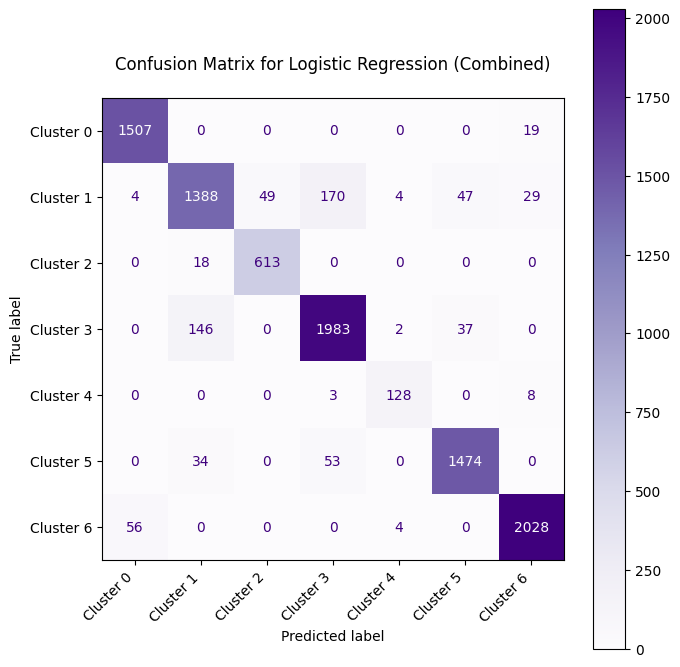


   Storing Scaler, Imputer and Scaled Numeric Splits globally...
      Stored num_scaler.
      Stored X_train_numeric_scaled.
      Stored X_test_numeric_scaled.
      Stored processed_numeric_cols: ['averageRating', 'runtimeMinutes', 'num_akas', 'num_regions', 'has_us_aka', 'numVotes_log']

--- 7. Cleaning Up Section 5.1 Intermediate Variables ---

Baseline model analysis section complete.
Global text features/splits (X_train, X_test) shape: (22873, 10000), (9804, 10000)
Global numeric features/splits (X_train_numeric_scaled, X_test_numeric_scaled) shape: (22873, 6), (9804, 6)
Global results dictionary: {'Naive Bayes (TF-IDF Only)': '0.36', 'Logistic Regression (Combined)': '0.93'}


In [ ]:
# --- Section 5.1: Baseline Models (TF-IDF Text + Combined) ---


print("\n### 5.1: Baseline Models (TF-IDF Text & Combined Features) ###")

# --- Prerequisite Check ---
final_movie_df_name = 'classic_movies_merged'
target_column = 'kmeans_cluster' # Using K=7 labels

# Define text columns to combine (from original code + Wikidata)
text_feature_cols = ['primaryTitle', 'genres', 'originalTitle']
optional_wd_cols = ['wd_label', 'wd_description', 'wd_genres', 'wd_main_subjects', 'wd_characteristics']

# Define numeric columns to combine
numeric_feature_cols = ['averageRating', 'runtimeMinutes', 'numVotes', 'num_akas', 'num_regions', 'has_us_aka']

# --- Declare global variables potentially used later ---
# We'll store the TEXT vectorizer and TEXT train/test splits globally
vectorizer = None
X_train, X_test, y_train, y_test = None, None, None, None # These will be TEXT ONLY splits
results = {} # Dictionary to store accuracy results
target_names = None

_proceed_classify = True
if final_movie_df_name not in globals() or globals().get(final_movie_df_name) is None or globals()[final_movie_df_name].empty:
    print(f"Error: DataFrame '{final_movie_df_name}' not found, None, or empty.")
    _proceed_classify = False
else:
    df_classify_base = globals()[final_movie_df_name]
    if target_column not in df_classify_base.columns:
        print(f"Error: Target column '{target_column}' not found in DataFrame '{final_movie_df_name}'.")
        _proceed_classify = False
    else:
        # --- Check Text Columns ---
        print(f"Checking for optional Wikidata columns in {final_movie_df_name}...")
        added_wd_cols = []
        for col in optional_wd_cols:
            if col in df_classify_base.columns:
                # Check if column seems useful (e.g., not mostly null/empty strings) before adding
                if df_classify_base[col].astype(str).str.len().mean() > 5: # Example check: avg length > 5 chars
                    text_feature_cols.append(col)
                    added_wd_cols.append(col)
                else:
                    print(f"   (Skipping optional text col '{col}' as it seems empty/short)")

        if added_wd_cols: print(f"   Added optional Wikidata text columns: {added_wd_cols}")

        print("Checking for required text columns...")
        missing_text_cols = [col for col in text_feature_cols if col not in df_classify_base.columns]
        if missing_text_cols:
            print(f"Warning: Following text columns missing, will use available: {missing_text_cols}")
            text_feature_cols = [col for col in text_feature_cols if col not in missing_text_cols]

        if not text_feature_cols:
            print("Error: No text columns available for feature engineering.")
            _proceed_classify = False
        else:
            print(f"Using text columns for features: {text_feature_cols}")

        # --- Check Numeric Columns ---
        available_numeric_cols = [col for col in numeric_feature_cols if col in df_classify_base.columns]
        if not available_numeric_cols:
            print("Warning: No numeric columns found for combined features. Logistic Regression will use text only.")
            # Set flag or handle this later
        else:
            print(f"Found numeric columns for combined features: {available_numeric_cols}")


if _proceed_classify:
    print(f"Starting baseline classification for target '{target_column}' using TF-IDF and Combined features...")
    # Use a copy to avoid modifying the global dataframe directly in this section
    df_classify = df_classify_base.copy()

    # --- 1. Prepare Target Variable and Combined Text ---
    print("\n--- 1. Preparing Target Variable and Text ---")
    y = None # Initialize y
    X_text = None # Initialize X_text
    try:
        if target_column in df_classify.columns:
            # Preserve original index for splitting later
            y = df_classify[target_column].fillna(-1).astype(int)
            valid_mask = (y != -1)
            n_removed = sum(~valid_mask)
            if n_removed > 0:
                print(f"   Removing {n_removed} rows with invalid target label (-1)...")
                df_classify = df_classify[valid_mask].copy() # Apply mask and copy
                y = y[valid_mask]
            else:
                print("   All target labels seem valid.")

            if y.nunique() < 2:
                raise ValueError(f"Target variable '{target_column}' has less than 2 unique classes.")
            elif len(y) < 10:
                raise ValueError(f"Too few samples ({len(y)}) remaining after filtering.")
            else:
                print(f"   Target value counts (K={y.nunique()} clusters):")
                print(y.value_counts())

                print("   Combining text features...")
                for col in text_feature_cols:
                    if col in df_classify.columns:
                        # Ensure string type and handle NAs consistently before joining
                        df_classify[col] = df_classify[col].astype(str).replace('nan', '').fillna('')
                # Create combined text feature
                X_text = df_classify[text_feature_cols].agg(' | '.join, axis=1)
                print(f"   Created 'combined_text' feature for {len(X_text)} samples.")
        else:
            raise ValueError(f"Target column '{target_column}' processing failed or not found.")

        # Ensure X_text aligns with y (should do if derived from df_classify after masking)
        if len(X_text) != len(y):
            raise ValueError("Mismatch between feature (X_text) and target (y) lengths after preparation.")

    except Exception as data_prep_e:
        print(f"Error during Data Preparation: {data_prep_e}")
        _proceed_classify = False


    # --- 2. Vectorize Text (Using TfidfVectorizer) ---
    X_text_vec = None # Initialize
    if _proceed_classify:
        print("\n--- 2. Vectorizing Text Features ---")
        try:
            # Using tuned parameters as an example
            vectorizer = TfidfVectorizer(stop_words='english',
                                        max_features=10000, # Increased features
                                        ngram_range=(1, 2), # Added bigrams
                                        min_df=3,           # Added min_df
                                        max_df=0.85)         # Added max_df
            X_text_vec = vectorizer.fit_transform(X_text)
            print(f"   Vectorized TF-IDF shape: {X_text_vec.shape}")
        except Exception as vec_e:
            print(f"   Error during text vectorization: {vec_e}")
            traceback.print_exc()
            _proceed_classify = False


    # --- 3. Prepare and Scale Numeric Features ---
    X_numeric_scaled = None
    num_scaler = None
    num_imputer = None
    processed_numeric_cols = [] # Track columns actually processed
    if _proceed_classify and available_numeric_cols: # Only proceed if numeric cols found earlier
        print("\n--- 3. Preparing and Scaling Numeric Features ---")
        try:
            df_numeric = df_classify[available_numeric_cols].copy() # Use df_classify which has NaNs filtered for target
            processed_numeric_cols = available_numeric_cols[:] # Copy list

            # Log transform votes
            if 'numVotes' in df_numeric.columns:
                print("   Applying log1p transform to 'numVotes'...")
                df_numeric['numVotes_log'] = np.log1p(df_numeric['numVotes'])
                if 'numVotes' in processed_numeric_cols: processed_numeric_cols.remove('numVotes')
                processed_numeric_cols.append('numVotes_log')

            # Convert bool 'has_us_aka' to int
            if 'has_us_aka' in df_numeric.columns:
                print("   Converting 'has_us_aka' to integer (0/1)...")
                df_numeric['has_us_aka'] = df_numeric['has_us_aka'].fillna(False).astype(int)

            # Impute missing values (if any) using median
            print(f"   Checking for NaNs in numeric columns: {processed_numeric_cols}")
            if df_numeric[processed_numeric_cols].isnull().any().any():
                print("   Imputing missing numeric values using median...")
                num_imputer = SimpleImputer(strategy='median')
                # Fit on training data portion only later during split
                df_numeric[processed_numeric_cols] = num_imputer.fit_transform(df_numeric[processed_numeric_cols])
                print(f"      NaNs after imputation: {df_numeric[processed_numeric_cols].isnull().sum().sum()}")
            else:
                print("   No NaNs found in numeric columns.")

            # Scale numeric features using StandardScaler
            print("   Initializing StandardScaler for numeric features...")
            num_scaler = StandardScaler()
            # Fit scaler on training data portion only later during split
            X_numeric_processed = df_numeric[processed_numeric_cols].values # Keep as numpy array for now
            print(f"   Prepared numeric features shape (before scaling): {X_numeric_processed.shape}")

        except Exception as num_prep_e:
            print(f"   Error preparing numeric features: {num_prep_e}")
            traceback.print_exc()
            # Continue classification but only with text features
            X_numeric_processed = None
            available_numeric_cols = []
            processed_numeric_cols = []
    elif _proceed_classify:
        print("\n--- 3. Skipping Numeric Feature Prep (None Available) ---")


    # --- 4. Split Data (Text, Numeric, Combined) ---
    X_train_text, X_test_text = None, None
    X_train_numeric_scaled, X_test_numeric_scaled = None, None
    X_train_combined, X_test_combined = None, None
    if _proceed_classify and X_text_vec is not None:
        print("\n--- 4. Splitting Data (Text, Numeric, Target) ---")
        try:
            # Split based on y to get consistent indices
            # Use preserved original index of y
            indices = y.index
            train_idx, test_idx = train_test_split(indices, test_size=0.3, random_state=28, stratify=y)

            # Split y
            y_train = y.loc[train_idx]
            y_test = y.loc[test_idx]

            # Split Text Features
            X_train_text = X_text_vec[indices.get_indexer(train_idx)] # Use get_indexer for positional lookup if needed
            X_test_text = X_text_vec[indices.get_indexer(test_idx)]
            print(f"   Split Text Features: Train={X_train_text.shape}, Test={X_test_text.shape}")

            # Assign TEXT splits to global variables for potential reuse by other sections/models
            X_train, X_test = X_train_text, X_test_text # Global X_train/X_test are text-only

            # Split and Scale Numeric Features (if available)
            if X_numeric_processed is not None and num_scaler is not None:
                print("   Splitting and Scaling Numeric Features...")
                X_train_numeric_unscaled = X_numeric_processed[indices.get_indexer(train_idx)]
                X_test_numeric_unscaled = X_numeric_processed[indices.get_indexer(test_idx)]

                # Fit Scaler *only* on training numeric data
                X_train_numeric_scaled = num_scaler.fit_transform(X_train_numeric_unscaled)
                # Transform test numeric data using the *same* fitted scaler
                X_test_numeric_scaled = num_scaler.transform(X_test_numeric_unscaled)
                print(f"   Split & Scaled Numeric Features: Train={X_train_numeric_scaled.shape}, Test={X_test_numeric_scaled.shape}")

                # Combine features for Logistic Regression
                print("   Combining features for Logistic Regression...")
                X_train_combined = hstack((X_train_text, X_train_numeric_scaled), format='csr')
                X_test_combined = hstack((X_test_text, X_test_numeric_scaled), format='csr')
                print(f"   Combined Train shape: {X_train_combined.shape}, Combined Test shape: {X_test_combined.shape}")
            else:
                print("   Skipping numeric feature splitting/scaling/combination.")

        except Exception as split_e:
            print(f"   Error during data splitting: {split_e}")
            traceback.print_exc()
            _proceed_classify = False


    # --- 5. Train & Evaluate Baseline Models ---
    if _proceed_classify and X_train_text is not None and X_test_text is not None: # Use text splits here
        print("\n--- 5. Training and Evaluating Baseline Models ---")
        # Initialize results dict if it doesn't exist or isn't a dict
        if 'results' not in globals() or not isinstance(globals().get('results'), dict):
            globals()['results'] = {}
        results = globals()['results'] # Work with the global dict

        best_model_accuracy = -1
        best_model_name = None
        model_predictions_map = {}

        # a) Multinomial Naive Bayes (Uses TEXT features ONLY)
        try:
            print("\n   Training Multinomial Naive Bayes (Text Features Only)...")
            nb_model = MultinomialNB(alpha=1.0) # Can tune alpha
            # Use the text-only splits created and stored globally
            nb_model.fit(X_train, y_train)
            y_pred_nb = nb_model.predict(X_test)
            accuracy_nb = accuracy_score(y_test, y_pred_nb)
            model_key_nb = 'Naive Bayes (TF-IDF Only)'
            results[model_key_nb] = accuracy_nb
            model_predictions_map[model_key_nb] = y_pred_nb # Store predictions
            print(f"      {model_key_nb} Test Accuracy: {accuracy_nb:.4f}")

            if accuracy_nb > best_model_accuracy:
                best_model_accuracy = accuracy_nb
                best_model_name = model_key_nb
        except Exception as nb_e:
            print(f"      Error training/evaluating Naive Bayes: {nb_e}")
            results['Naive Bayes (TF-IDF Only)'] = 'Error'

        # b) Logistic Regression (Check if combined features are available)
        model_key_logreg = 'Logistic Regression (TF-IDF Only)' # Default key
        if X_train_combined is not None and X_test_combined is not None:
            print("\n   Training Logistic Regression (Combined Features)...")
            X_train_logreg = X_train_combined
            X_test_logreg = X_test_combined
            model_key_logreg = 'Logistic Regression (Combined)'
        else:
            print("\n   Training Logistic Regression (Text Features Only - Fallback)...")
            X_train_logreg = X_train # Fallback to global text-only split
            X_test_logreg = X_test

        try:
            logreg_model = LogisticRegression(random_state=28, max_iter=1500, solver='liblinear', C=1.0, class_weight='balanced')
            logreg_model.fit(X_train_logreg, y_train) # Use appropriate X train data
            y_pred_logreg = logreg_model.predict(X_test_logreg) # Use appropriate X test data
            accuracy_logreg = accuracy_score(y_test, y_pred_logreg)
            results[model_key_logreg] = accuracy_logreg
            model_predictions_map[model_key_logreg] = y_pred_logreg # Store predictions
            print(f"      {model_key_logreg} Test Accuracy: {accuracy_logreg:.4f}")

            # Update best model if this is better
            current_best_acc = results.get(best_model_name, -1) if best_model_name and results.get(best_model_name) != 'Error' else -1
            if accuracy_logreg > current_best_acc:
                best_model_accuracy = accuracy_logreg
                best_model_name = model_key_logreg
        except Exception as lr_e:
            print(f"      Error training/evaluating Logistic Regression: {lr_e}")
            results[model_key_logreg] = 'Error'

        # --- 6. Compare and Show Best Baseline ---
        print("\n--- 6. Best Baseline Model Performance (from Section 5.1) ---")
        if best_model_name:
            print(f"   Best baseline model from this section: {best_model_name} (Accuracy: {best_model_accuracy:.4f})")
            best_model_predictions = model_predictions_map.get(best_model_name) # Get predictions for the best

            if best_model_predictions is not None:
                unique_labels_sorted = sorted(np.unique(y_test))
                target_names = [f'Cluster {i}' for i in unique_labels_sorted]
                globals()['target_names'] = target_names # Store globally

                print("\n   Detailed Classification Report:")
                try:
                    report = classification_report(y_test, best_model_predictions, labels=unique_labels_sorted, target_names=target_names, zero_division=0)
                    display(Markdown(f"```\n{report}\n```"))
                except Exception as report_e:
                    print(f"      Could not generate classification report: {report_e}")

                print("\n   Confusion Matrix:")
                try:
                    cm = confusion_matrix(y_test, best_model_predictions, labels=unique_labels_sorted)
                    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names)
                    fig, ax = plt.subplots(figsize=(max(6, len(unique_labels_sorted)), max(6, len(unique_labels_sorted))))
                    disp.plot(cmap='Purples', ax=ax, xticks_rotation=45, values_format='d')
                    ax.set_xticklabels(ax.get_xticklabels(), ha='right')
                    ax.set_title(f'Confusion Matrix for {best_model_name}', pad=20)
                    plt.tight_layout()
                    plt.show()
                except Exception as cm_e:
                    print(f"      Could not plot confusion matrix: {cm_e}")
            else:
                print("      Predictions for the best model are not available.")
        else:
            print("\n   Could not determine best baseline model due to errors or no models trained.")

        # --- Store results globally ---
        globals()['results'] = results
        # target_names already stored above if best model found

        # --- Store Scaler, Imputer and Scaled Numeric Splits globally ---
        print("\n   Storing Scaler, Imputer and Scaled Numeric Splits globally...")
        if 'num_scaler' in locals() and num_scaler is not None:
            globals()['num_scaler'] = num_scaler
            print("      Stored num_scaler.")
        else: print("      Warning: num_scaler not found locally to store.")
        if 'num_imputer' in locals() and num_imputer is not None:
            globals()['num_imputer'] = num_imputer
            print("      Stored num_imputer.")
        # Store the SCALED numeric splits
        if 'X_train_numeric_scaled' in locals() and X_train_numeric_scaled is not None:
            globals()['X_train_numeric_scaled'] = X_train_numeric_scaled
            print("      Stored X_train_numeric_scaled.")
        else: print("      Warning: X_train_numeric_scaled not found locally to store.")
        if 'X_test_numeric_scaled' in locals() and X_test_numeric_scaled is not None:
            globals()['X_test_numeric_scaled'] = X_test_numeric_scaled
            print("      Stored X_test_numeric_scaled.")
        else: print("      Warning: X_test_numeric_scaled not found locally to store.")
        # Store the list of numeric columns that were actually processed and scaled
        if 'processed_numeric_cols' in locals():
            globals()['processed_numeric_cols'] = processed_numeric_cols
            print(f"      Stored processed_numeric_cols: {processed_numeric_cols}")
        else: print("      Warning: processed_numeric_cols not found locally to store.")

        # Cleanup local models - commenting the ones needed subsequently
        if 'nb_model' in locals(): del nb_model
        if 'logreg_model' in locals(): del logreg_model
        # if 'logreg_model_comb' in locals(): del logreg_model_comb # Was local if created
        # if 'y_pred_nb' in locals(): del y_pred_nb
        # if 'y_pred_logreg' in locals(): del y_pred_logreg


    # --- 7. General Cleanup ---
    # (Keep general cleanup as before, ensure it doesn't delete global vars needed later)
    print("\n--- 7. Cleaning Up Section 5.1 Intermediate Variables ---")
    if 'df_classify' in locals(): del df_classify
    if 'X_text' in locals(): del X_text
    if 'X_text_vec' in locals(): del X_text_vec
    if 'y' in locals(): del y
    if 'df_numeric' in locals(): del df_numeric
    if 'X_numeric_processed' in locals(): del X_numeric_processed
    if 'X_train_numeric_unscaled' in locals(): del X_train_numeric_unscaled
    if 'X_test_numeric_unscaled' in locals(): del X_test_numeric_unscaled
    # Keep X_train_numeric_scaled / X_test_numeric_scaled as they were stored globally
    if 'X_train_combined' in locals(): del X_train_combined # Local combined var
    if 'X_test_combined' in locals(): del X_test_combined # Local combined var
    # Keep num_imputer, num_scaler globally stored
    gc.collect()

    # Final confirmation
    if 'X_train' in globals() and X_train is not None and isinstance(globals().get('results'), dict):
        print("\nBaseline model analysis section complete.")
        print(f"Global text features/splits (X_train, X_test) shape: {globals()['X_train'].shape}, {globals()['X_test'].shape}")
        if 'X_train_numeric_scaled' in globals():
            print(f"Global numeric features/splits (X_train_numeric_scaled, X_test_numeric_scaled) shape: {globals()['X_train_numeric_scaled'].shape}, {globals()['X_test_numeric_scaled'].shape}")
        formatted_results = {k: (f"{v:.2f}" if isinstance(v, float) else v) for k, v in results.items()}
        print(f"Global results dictionary: {formatted_results}")
    else:
        print("\nWarning: Global variables (X_train/X_test, results) were not properly populated.")

# End prerequisite check block
else:
    print("\nPrerequisites not met or error occurred. Skipping baseline classification section.")

### 5.2 Feature Selection Experiments (Focus on Actor Features)

**Purpose:**

Following the baseline classification performance established using combined textual and numeric features (Section 5.1), this section isolates the contribution of a specific feature type: the presence of key actors. The primary goals are:

1.  To determine the predictive power of *actor presence alone* in classifying films into the previously selected K=7 K-Means clusters.
2.  To identify which specific actors (among the most frequent) are most strongly associated with differentiating between these clusters, providing insight into potential "characteristic actors" for the discovered film groupings.

**Approach:**

This analysis involves constructing a feature set based solely on actor appearances and evaluating its predictive capability:

1.  **Actor Feature Matrix Construction:** A binary feature matrix (`X_actors`) is created. Each row represents a movie (`tconst`), and each column corresponds to one of the top N (e.g., N=200) most frequently appearing actors within the classic film dataset (derived from `title_principals_actors`). A value of '1' in the matrix indicates that the actor (column) appeared in that movie's principal cast list, while '0' signifies absence.
2.  **Data Alignment:** This actor feature matrix is carefully aligned with the target variable (`y_actors`), which consists of the K=7 `kmeans_cluster` labels assigned to the corresponding movies.
3.  **Baseline Evaluation (Actors Only):** The predictive power of this actor-only feature set is assessed by training a standard classifier (`LogisticRegression`) and evaluating its accuracy using cross-validation (3-fold CV). This provides a robust estimate of how well the presence/absence of top actors alone can distinguish between the K=7 clusters.
4.  **Feature Importance using Random Forest:** To identify the *most influential* actors in predicting cluster membership, a `RandomForestClassifier` is trained on the `X_actors` matrix. Random Forest models, being ensembles of decision trees, naturally provide a measure of feature importance based on how much each feature (actor presence) contributes to reducing impurity across the ensemble. The importance scores are extracted and mapped back to actor names for interpretation and visualization.

**Code Explanation:**

The associated code block implements this actor-focused analysis workflow:

1.  **Prerequisite Checks:** Verifies the availability of the necessary DataFrames: `classic_movies_merged` (containing the target `kmeans_cluster` column with K=7 labels), `title_principals_actors` (linking movies to actors), and `actor_name_basics` (mapping actor `nconst` IDs to names). It also checks for the globally stored train/test splits from Section 5.1.
2.  **Actor Feature Matrix Preparation (`X_actors_train`, `X_actors_test`):**
    * **Identify Top Actors:** Calculates the appearance frequency of each actor (`nconst`) in the *entire* `title_principals_actors` DataFrame and selects the IDs of the top N (e.g., 200) most frequent actors (`top_actor_ids`).
    * **Aggregate Actors per Movie:** Filters the `title_principals_actors` data to include only roles played by these top actors. It then groups this filtered data by movie (`tconst`) and aggregates the `nconst` IDs of the top actors appearing in each movie into a single space-separated string (`actor_list`).
    * **Align and Split Actor Features:** This is a crucial step ensuring the actor features align with the *existing* train/test split defined in Section 5.1. It retrieves the `tconst` identifiers for the training and testing sets (using the indices from the global `y_train` and `y_test`). It then maps the aggregated `actor_list` strings onto these train/test `tconst` sets.
    * **Vectorize Actor Presence:** An instance of `CountVectorizer` is initialized with `binary=True` and its `vocabulary` explicitly set to the `top_actor_ids`. The vectorizer is *fit* using the training set's actor lists (`train_actor_list_series`) and then used to *transform* both the training and test actor lists, creating the aligned sparse binary feature matrices `X_actors_train` and `X_actors_test`.
3.  **Baseline Evaluation (Actors Only):**
    * A `LogisticRegression` model (using `class_weight='balanced'`) is trained on the `X_actors_train` data and corresponding `y_train` labels.
    * Predictions (`y_pred_actors_only`) are made on the `X_actors_test` data.
    * The accuracy (`accuracy_actors_only`) is calculated by comparing these predictions to the true `y_test` labels. This accuracy score is stored in the global `results` dictionary.
4.  **Combined Feature Model Evaluation (Text + Actors & Text + Num + Actors):**
    * **Text + Actors:** The code combines the TF-IDF text features (`X_train_text`, `X_test_text`) with the binary actor features (`X_actors_train`, `X_actors_test`) using `scipy.sparse.hstack`. A `LogisticRegression` model is trained on the combined training data and evaluated on the combined test data. Accuracy is stored.
    * **Text + Numeric + Actors:** If the scaled numeric features (`X_train_num_scaled`, `X_test_num_scaled`) are available (prepared in Section 5.1), the code combines all three feature sets (TF-IDF text, scaled numeric, binary actors). A `LogisticRegression` or `LinearSVC` model is trained on this fully combined training data and evaluated on the combined test data. Accuracy is stored, and a detailed classification report and confusion matrix are displayed for this comprehensive model.
5.  **Random Forest Feature Importance Analysis:**
    * **Model Explanation:** `RandomForestClassifier` is chosen for feature importance because, as an ensemble of many decision trees, it can capture non-linear relationships and interactions between features. During training, it inherently calculates how much each feature contributes to the accuracy of the model (typically measured by Gini impurity reduction or mean decrease in accuracy). This makes it effective for understanding which input variables (in this case, which actors' presence) are most valuable for the prediction task.
    * **Integration & Training:** The model (configured with parameters like `n_estimators=100`, `max_depth=15`, `class_weight='balanced'`) is trained using the *actor-only training features* (`X_actors_train`) and the corresponding target labels (`y_train`).
    * **Importance Extraction:** The `feature_importances_` attribute, containing the importance score for each actor feature, is extracted from the trained model.
    * **Mapping & Display:** These scores are mapped to actor `nconst` IDs (which are the feature names from the `actor_vectorizer`) and then further mapped to actual actor names using the `actor_name_basics` DataFrame. The results are sorted by importance, and the top N (e.g., 20) most important actors are displayed in a table and visualized using an interactive horizontal bar chart (`plotly.express.bar`).
6.  **Performance Comparison Plot:** An interactive bar chart (`plotly.express.bar`) is generated to visually compare the test accuracies achieved by the different model configurations evaluated within this section (Actors Only, Text+Actors, Text+Num+Actors).
7.  **Cleanup:** Intermediate variables specific to this section are deleted, and garbage collection is invoked.

**Code Execution Prerequisites:**

* The main movie DataFrame `classic_movies_merged`, containing the K=7 `kmeans_cluster` labels (added in Section 4.2), must be available.
* The final filtered personnel DataFrames `title_principals_actors` and `actor_name_basics` (from Section 2.2.5/2.2.6) must be available.
* Crucially, the **global variables** set by Section 5.1 must exist:
    * `X_train`, `X_test` (TF-IDF text features).
    * `y_train`, `y_test` (K=7 cluster labels, aligned with `X_train`/`X_test`).
    * `X_train_numeric_scaled`, `X_test_numeric_scaled` (Scaled numeric features, if numeric prep in 5.1 succeeded).
    * The global `results` dictionary.
* Required libraries (including `pandas`, `numpy`, `sklearn` modules for feature extraction, model selection, linear models, ensemble methods, metrics, plus `matplotlib`, `seaborn`, `plotly`, `gc`, `traceback`, `IPython.display`) must be imported.

Executing this block isolates the predictive signal from the presence of top actors, provides a baseline accuracy for this feature set alone, compares performance when combined with text/numeric features, and most importantly, identifies and visualizes the specific actors found to be most influential by the Random Forest model for distinguishing between the K=7 K-Means clusters.


### 5.2: Feature Selection Experiments (Focus on Actor Features) ###

Starting Actor Feature analysis for target 'kmeans_cluster'...

--- 1. Preparing Actor Feature Matrix (Aligned with Train/Test Split) ---
      Finding top 200 most frequent actors (based on all roles)...
      Found 200 unique top actor IDs.
      Filtered roles table to 18765 entries for top actors.
      Aggregating actors per movie...
      Aligning and splitting actor features...
      Vectorizing actor presence (Top 200)...
      Created Actor Feature Splits: Train=(22873, 200), Test=(9804, 200)

--- 2. Evaluating Performance (Actors Features Only) ---
      Training LogReg (Top 200 actors)...
      >>> Test Accuracy (Actors Only): 0.3022 <<<

--- 3. Evaluating Performance (Text + Actors) ---
      Combining Text + Actor features...
         Combined Text+Actor shapes: Train=(22873, 10200), Test=(9804, 10200)
      Training Logistic Regression (Text+Actors)...
      >>> Logistic Regression (Text+Actors) Test A

```
              precision    recall  f1-score   support

   Cluster 0       0.96      0.99      0.97      1526
   Cluster 1       0.87      0.81      0.84      1691
   Cluster 2       0.91      0.96      0.94       631
   Cluster 3       0.90      0.91      0.90      2168
   Cluster 4       0.91      0.92      0.92       139
   Cluster 5       0.94      0.95      0.94      1561
   Cluster 6       0.97      0.97      0.97      2088

    accuracy                           0.93      9804
   macro avg       0.92      0.93      0.93      9804
weighted avg       0.93      0.93      0.93      9804

```


      Confusion Matrix (Combined Text+Num+Actors):


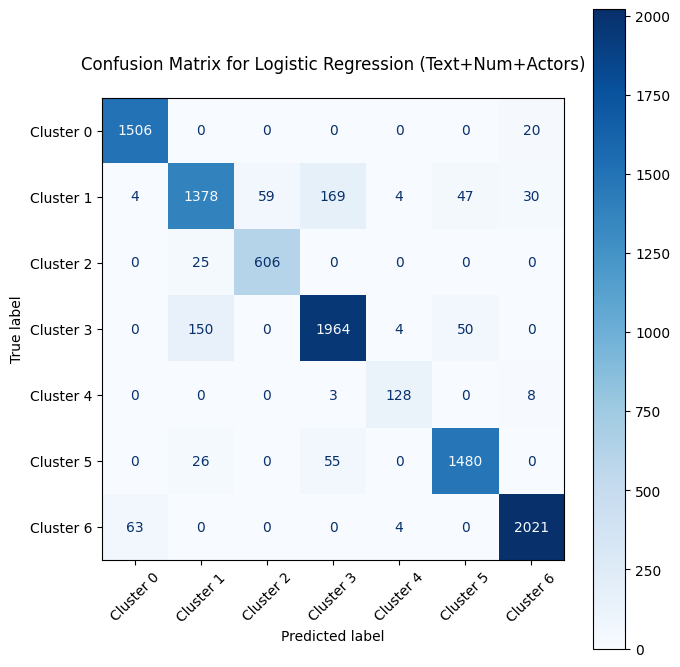


--- 5. Actor Feature Importance (Random Forest on Actors Only) ---
      Training Random Forest model on Actor Features (Train Split)...

      Generating Interactive Feature Importance Plot...


      Interactive feature importance plot generated.

--- 6. Performance Comparison within Section 5.2 ---


      Performance comparison plot generated.

--- 7. Cleaning Up Section 5.2 Variables ---

Actor feature analysis complete.


In [ ]:
# --- Section 5.2: Feature Selection Experiments (Actor Features) ---

# Ensure display is available
try:
     from IPython.display import display, Markdown
except ImportError:
     def display(x): print(x)
     def Markdown(x): print(x)

print("\n### 5.2: Feature Selection Experiments (Focus on Actor Features) ###")

# --- Prerequisite Check ---
final_movie_df_name = 'classic_movies_merged'
actor_roles_df_name = 'title_principals_actors'
actor_names_df_name = 'actor_name_basics'
target_column = 'kmeans_cluster' # K=7 target

# Check for variables created and stored globally in Section 5.1
text_split_vars = ['X_train', 'X_test', 'y_train', 'y_test'] # These are TEXT ONLY splits
numeric_split_vars = ['X_train_numeric_scaled', 'X_test_numeric_scaled'] # Numeric splits
results_var = 'results' # Global results dict

_proceed_actor_feat = True
# Check base dataframes
if final_movie_df_name not in globals() or globals().get(final_movie_df_name) is None or globals()[final_movie_df_name].empty:
     print(f"Error: DataFrame '{final_movie_df_name}' not found or empty.")
     proceed_actor_feat = False
elif actor_roles_df_name not in globals() or globals().get(actor_roles_df_name) is None or globals()[actor_roles_df_name].empty:
     print(f"Error: Actor roles DataFrame '{actor_roles_df_name}' not found or empty.")
     _proceed_actor_feat = False
elif actor_names_df_name not in globals() or globals().get(actor_names_df_name) is None or globals()[actor_names_df_name].empty:
     print(f"Error: Actor names DataFrame '{actor_names_df_name}' not found or empty.")
     _proceed_actor_feat = False

# Check for TEXT splits from Section 5.1 (essential)
for var in text_split_vars:
     if var not in globals() or globals().get(var) is None:
          print(f"Error: Prerequisite '{var}' (Text/Target split from Section 5.1) not found. Cannot proceed.")
          _proceed_actor_feat = False
          break

# Check for NUMERIC splits from Section 5.1 (needed for full enhancement)
can_run_full_combined_model = True
for var in numeric_split_vars:
     if var not in globals() or globals().get(var) is None:
          print(f"Warning: Prerequisite '{var}' from Section 5.1 not found. Cannot run full Text+Num+Actor model.")
          can_run_full_combined_model = False
          # Don't break, allow Text+Actor model to run

# Ensure results dict exists
if results_var not in globals() or not isinstance(globals().get(results_var), dict):
     print(f"Warning: Global '{results_var}' dictionary not found. Will create a new one.")
     globals()[results_var] = {}

if _proceed_actor_feat:
     print(f"\nStarting Actor Feature analysis for target '{target_column}'...")
     # Get references to the required dataframes and global splits
     df_main = globals()[final_movie_df_name]
     df_actor_roles = globals()[actor_roles_df_name]
     df_actor_names = globals()[actor_names_df_name]
     # Load splits from global scope
     X_train_text = globals()['X_train']
     X_test_text = globals()['X_test']
     y_train = globals()['y_train']
     y_test = globals()['y_test']
     # Retrieve numeric splits if they exist
     X_train_num_scaled = globals().get('X_train_numeric_scaled')
     X_test_num_scaled = globals().get('X_test_numeric_scaled')
     results = globals()[results_var] # Use the global results dict

     # --- Initialize variables ---
     X_actors_train, X_actors_test = None, None
     actor_vectorizer = None
     actor_feature_names = None
     feature_importance_df = None

     try:
          # --- 1. Prepare Actor Feature Matrix (Aligned with Train/Test Split) ---
          print("\n--- 1. Preparing Actor Feature Matrix (Aligned with Train/Test Split) ---")
          N_TOP_ACTORS = 200
          print(f"      Finding top {N_TOP_ACTORS} most frequent actors (based on all roles)...")
          actor_counts = df_actor_roles['nconst'].astype(str).value_counts()
          top_actor_ids = set(actor_counts.head(N_TOP_ACTORS).index)
          print(f"      Found {len(top_actor_ids)} unique top actor IDs.")

          df_top_actor_roles = df_actor_roles[df_actor_roles['nconst'].astype(str).isin(top_actor_ids)]
          print(f"      Filtered roles table to {len(df_top_actor_roles)} entries for top actors.")

          print("      Aggregating actors per movie...")
          actor_lists_per_movie = df_top_actor_roles.astype({'tconst':str, 'nconst':str}).groupby('tconst')['nconst'].agg(' '.join)

          # --- Align and Split Actor Features ---
          print("      Aligning and splitting actor features...")
          # Get tconst for train and test sets using the index from y_train/y_test
          train_idx = y_train.index
          test_idx = y_test.index

          # Check if tconst is index or column in df_main
          if 'tconst' in df_main.columns:
               train_tconsts = df_main.loc[train_idx, 'tconst']
               test_tconsts = df_main.loc[test_idx, 'tconst']
          elif df_main.index.name == 'tconst': # Should have been reset, but check anyway
               train_tconsts = df_main.loc[train_idx].index.to_series()
               test_tconsts = df_main.loc[test_idx].index.to_series()
          else:
               raise KeyError("'tconst' not found as index or column in df_main")

          # Map actor lists to train/test indices
          train_actor_list_series = train_tconsts.map(actor_lists_per_movie).fillna('')
          test_actor_list_series = test_tconsts.map(actor_lists_per_movie).fillna('')

          print(f"      Vectorizing actor presence (Top {N_TOP_ACTORS})...")
          actor_vectorizer = CountVectorizer(binary=True, vocabulary=list(top_actor_ids))

          # Fit vectorizer ONLY on training data actor lists
          X_actors_train = actor_vectorizer.fit_transform(train_actor_list_series)
          # Transform test data using the SAME fitted vectorizer
          X_actors_test = actor_vectorizer.transform(test_actor_list_series)
          actor_feature_names = actor_vectorizer.get_feature_names_out() # Get feature names

          print(f"      Created Actor Feature Splits: Train={X_actors_train.shape}, Test={X_actors_test.shape}")
          # y_train and y_test are already aligned from global scope

          # --- 2. Evaluate Baseline (Actors Only on Test Set) ---
          print("\n--- 2. Evaluating Performance (Actors Features Only) ---")
          try:
               logreg_baseline_actor = LogisticRegression(random_state=28, max_iter=1000, solver='liblinear', class_weight='balanced')
               print(f"      Training LogReg (Top {N_TOP_ACTORS} actors)...")
               logreg_baseline_actor.fit(X_actors_train, y_train)
               y_pred_actors_only = logreg_baseline_actor.predict(X_actors_test)
               accuracy_actors_only = accuracy_score(y_test, y_pred_actors_only)
               print(f"      >>> Test Accuracy (Actors Only): {accuracy_actors_only:.4f} <<<")
               results['Logistic Regression (Actors Only)'] = accuracy_actors_only
          except Exception as base_e:
               print(f"      Could not train/evaluate actors-only baseline: {type(base_e).__name__}: {base_e}")
               results['Logistic Regression (Actors Only)'] = "Error"

          # --- 3. Evaluate (Text + Actors) ---
          print("\n--- 3. Evaluating Performance (Text + Actors) ---")
          try:
               print("      Combining Text + Actor features...")
               # Check shapes before stacking
               if X_train_text.shape[0] != X_actors_train.shape[0]: raise ValueError("Train shape mismatch between Text and Actors")
               if X_test_text.shape[0] != X_actors_test.shape[0]: raise ValueError("Test shape mismatch between Text and Actors")

               X_train_text_actors = hstack([X_train_text, X_actors_train], format='csr')
               X_test_text_actors = hstack([X_test_text, X_actors_test], format='csr')
               print(f"         Combined Text+Actor shapes: Train={X_train_text_actors.shape}, Test={X_test_text_actors.shape}")

               print("      Training Logistic Regression (Text+Actors)...")
               logreg_text_actors = LogisticRegression(random_state=28, max_iter=1500, solver='liblinear', C=1.0, class_weight='balanced')
               logreg_text_actors.fit(X_train_text_actors, y_train)
               y_pred_text_actors = logreg_text_actors.predict(X_test_text_actors)
               accuracy_text_actors = accuracy_score(y_test, y_pred_text_actors)
               model_key_text_actors = 'Logistic Regression (Text+Actors)'
               results[model_key_text_actors] = accuracy_text_actors
               print(f"      >>> {model_key_text_actors} Test Accuracy: {accuracy_text_actors:.4f} <<<")

          except Exception as ta_e:
               print(f"      Error during Text+Actor model training/evaluation: {ta_e}")
               traceback.print_exc()
               results['Logistic Regression (Text+Actors)'] = "Error"


          # --- 4. Evaluate (Text + Numeric + Actors) ---
          print("\n--- 4. Evaluating Performance (Text + Numeric + Actors) ---")
          if can_run_full_combined_model: # Check if numeric splits are available
               print("      Combining Text + Scaled Numeric + Actor features...")
               try:
                    # Check shapes before stacking
                    print(f"         Shapes before hstack: Text Train {X_train_text.shape}, Num Train {X_train_num_scaled.shape}, Actor Train {X_actors_train.shape}")
                    if not (X_train_text.shape[0] == X_train_num_scaled.shape[0] == X_actors_train.shape[0]):
                         raise ValueError("Row mismatch between training features before hstack!")

                    features_to_stack_train_all = [X_train_text, X_train_num_scaled, X_actors_train]
                    features_to_stack_test_all = [X_test_text, X_test_num_scaled, X_actors_test]

                    X_train_all_combined = hstack(features_to_stack_train_all, format='csr')
                    X_test_all_combined = hstack(features_to_stack_test_all, format='csr')
                    print(f"         Combined Feature shapes: Train={X_train_all_combined.shape}, Test={X_test_all_combined.shape}")

                    print("      Training Logistic Regression on All Combined Features...")
                    # model_all_comb = LinearSVC(random_state=28, max_iter=1500, C=0.5, class_weight='balanced', dual='auto')
                    model_all_comb = LogisticRegression(random_state=28, max_iter=1500, solver='liblinear', C=0.5, class_weight='balanced')

                    model_all_comb.fit(X_train_all_combined, y_train)
                    y_pred_all_comb = model_all_comb.predict(X_test_all_combined)
                    accuracy_all_comb = accuracy_score(y_test, y_pred_all_comb)
                    model_key_all_comb = 'Logistic Regression (Text+Num+Actors)'
                    results[model_key_all_comb] = accuracy_all_comb
                    print(f"      >>> {model_key_all_comb} Test Accuracy: {accuracy_all_comb:.4f} <<<")

                    # Display report and CM for this improved model
                    print("\n      Detailed Classification Report (Combined Text+Num+Actors):")
                    target_names_all_comb = globals().get('target_names') # Get from global if set in 5.1
                    if target_names_all_comb is None: target_names_all_comb = [f'Cluster {i}' for i in sorted(np.unique(y_test))]
                    report_all = classification_report(y_test, y_pred_all_comb, target_names=target_names_all_comb, zero_division=0)
                    display(Markdown(f"```\n{report_all}\n```"))

                    print("\n      Confusion Matrix (Combined Text+Num+Actors):")
                    cm_all = confusion_matrix(y_test, y_pred_all_comb, labels=sorted(np.unique(y_test)))
                    disp_all = ConfusionMatrixDisplay(confusion_matrix=cm_all, display_labels=target_names_all_comb)
                    fig_all, ax_all = plt.subplots(figsize=(max(6, len(target_names_all_comb)), max(6, len(target_names_all_comb))))
                    disp_all.plot(cmap='Blues', ax=ax_all, xticks_rotation=45, values_format='d')
                    ax_all.set_title(f'Confusion Matrix for {model_key_all_comb}', pad=20)
                    plt.tight_layout()
                    plt.show()

                    del model_all_comb, X_train_all_combined, X_test_all_combined # y_pred_all_comb needed

               except Exception as comb_e:
                    print(f"      Error during combined feature model training/evaluation: {comb_e}")
                    traceback.print_exc()
                    results['Logistic Regression (Text+Num+Actors)'] = "Error"
          else:
               print("      Skipping combined model (Text+Num+Actors) as prerequisite numeric features from 5.1 were missing.")


          # --- 5. Random Forest Feature Importance Plot (Actors Only) ---
          print("\n--- 5. Actor Feature Importance (Random Forest on Actors Only) ---")
          try:
               # Train RF on the ACTOR splits
               rf_model_imp = RandomForestClassifier(n_estimators=100, random_state=28, n_jobs=-1, max_depth=15, class_weight='balanced', min_samples_leaf=5)
               print("      Training Random Forest model on Actor Features (Train Split)...")
               rf_model_imp.fit(X_actors_train, y_train) # Train on the split actor data
               importances = rf_model_imp.feature_importances_

               feature_importance_df = pd.DataFrame({
                    'nconst': actor_feature_names,
                    'importance': importances
               }).sort_values(by='importance', ascending=False)

               if df_actor_names is not None and 'nconst' in df_actor_names.columns and 'primaryName' in df_actor_names.columns:
                    actor_name_map = df_actor_names.set_index('nconst')['primaryName']
                    feature_importance_df['ActorName'] = feature_importance_df['nconst'].map(actor_name_map).fillna('Unknown')
               else:
                    feature_importance_df['ActorName'] = feature_importance_df['nconst']

               if not feature_importance_df.empty:
                    print("\n      Generating Interactive Feature Importance Plot...")
                    N_DISPLAY_IMPORTANCE = 20
                    top_features_plot = feature_importance_df.head(N_DISPLAY_IMPORTANCE).sort_values('importance', ascending=True)

                    fig_imp = px.bar(top_features_plot,
                                   x='importance', y='ActorName', orientation='h',
                                   title=f'Top {N_DISPLAY_IMPORTANCE} Actor Feature Importances (Relative)',
                                   labels={'importance': 'Importance Score (Gini)', 'ActorName': 'Actor'},
                                   text='importance', height=600,
                                   color='importance', color_continuous_scale=px.colors.sequential.Cividis_r)
                    fig_imp.update_layout(yaxis_title='Actor', xaxis_title='Importance Score', title_x=0.5, coloraxis_showscale=False)
                    fig_imp.update_traces(texttemplate='%{text:.4f}', textposition='outside')
                    fig_imp.show()
                    print("      Interactive feature importance plot generated.")
               else:
                    print("      Feature importance DataFrame is empty. Skipping plot.")

          except Exception as rf_e:
               print(f"      Error during Random Forest importance calculation/plotting: {rf_e}")
               traceback.print_exc()


          # --- 6. Performance Comparison Plot ---
          print("\n--- 6. Performance Comparison within Section 5.2 ---")
          # Filter results dictionary for keys relevant to this section
          results_5_2_keys = ['Logistic Regression (Actors Only)',
                              'Logistic Regression (Text+Actors)',
                              'Logistic Regression (Text+Num+Actors)']
          results_5_2_plot = {k: results.get(k) for k in results_5_2_keys if isinstance(results.get(k), (float, int))}

          if results_5_2_plot:
               df_results_5_2 = pd.DataFrame(list(results_5_2_plot.items()), columns=['Model Configuration', 'Accuracy'])
               df_results_5_2.sort_values('Accuracy', ascending=False, inplace=True)

               fig_comp_5_2 = px.bar(df_results_5_2, x='Model Configuration', y='Accuracy',
                                        title='Accuracy Comparison for Models Using Actor Features',
                                        text='Accuracy', color='Accuracy',
                                        color_continuous_scale=px.colors.sequential.Tealgrn, height=450)
               fig_comp_5_2.update_layout(xaxis_tickangle=-15) # Adjust angle
               fig_comp_5_2.update_traces(texttemplate='%{text:.4f}', textposition='outside')
               fig_comp_5_2.show()
               print("      Performance comparison plot generated.")
          else:
               print("      No valid accuracy results found for comparison plot in this section.")


          # --- Final Cleanup ---
          print("\n--- 7. Cleaning Up Section 5.2 Variables ---")
          # Clean up variables created specifically in this section
          if 'df_actor_features_full' in locals(): del df_actor_features_full
          if 'X_actors' in locals(): del X_actors
          if 'y_actors_full_aligned' in locals(): del y_actors_full_aligned
          if 'actor_lists_per_movie' in locals(): del actor_lists_per_movie
          if 'logreg_baseline_actor' in locals(): del logreg_baseline_actor
          if 'rf_model_imp' in locals(): del rf_model_imp
          if 'feature_importance_df' in locals(): del feature_importance_df
          if 'actor_vectorizer' in locals(): del actor_vectorizer
          # if 'X_actors_train' in locals(): del X_actors_train - needed
          # if 'X_actors_test' in locals(): del X_actors_test - needed
          if 'X_train_text_actors' in locals(): del X_train_text_actors
          if 'X_test_text_actors' in locals(): del X_test_text_actors
          if 'logreg_text_actors' in locals(): del logreg_text_actors
          # if 'y_pred_text_actors' in locals(): del y_pred_text_actors - needed
          gc.collect()
          print("\nActor feature analysis complete.")

     except Exception as main_e:
          print(f"An error occurred during the Actor Feature Selection section: {main_e}")
          traceback.print_exc()

# End prerequisite check block
else:
     print("\nPrerequisites not met. Skipping Actor Feature Selection section.")

### 5.3 Advanced Model: LinearSVC with Combined Features

**Purpose:**

Having established baseline performance using text features alone (Naive Bayes) and potentially combined features (Logistic Regression fallback in 5.1), this section evaluates a more sophisticated model – Linear Support Vector Classification (`LinearSVC`) – on the fully combined feature set. The goal is to determine if a powerful linear classifier, optimized for high-dimensional data, can achieve higher accuracy in predicting the K=7 K-Means cluster labels when leveraging both the rich TF-IDF text features and the structured numeric metadata (including ratings, runtime, and engineered AKAS features).

**Model Explanation (LinearSVC):**

Linear Support Vector Classification (`LinearSVC`) is an implementation of Support Vector Machines (SVMs) specifically utilizing a linear kernel. SVMs work by finding an optimal hyperplane that best separates different classes in the feature space. `LinearSVC` is particularly well-suited for high-dimensional datasets, such as those resulting from text vectorization (like TF-IDF), as it is computationally more efficient than kernelized SVMs in such scenarios (Müller & Guido, 2017). It aims to find the linear decision boundary that maximizes the margin between the classes.

**Importance and Integration:**

The importance of using `LinearSVC` here lies in assessing the performance ceiling attainable with a strong linear model applied to the combined feature representation (TF-IDF text + scaled numeric metadata). Comparing its accuracy to the baseline models (Section 5.1) helps quantify the predictive value added by the numeric features and the effectiveness of this specific classification algorithm for distinguishing the nuanced K=7 clusters. The model is integrated by training it on the `X_train_combined` sparse matrix, which horizontally stacks the TF-IDF vectors (`X_train`) with the scaled numeric features (`X_train_numeric_scaled`) prepared and stored globally in Section 5.1. It predicts labels based on the corresponding combined test set `X_test_combined`. Using `class_weight='balanced'` helps the model handle potential imbalances in the sizes of the K=7 clusters.

**Code Explanation:**

The associated code block implements the training and evaluation of the `LinearSVC` model on the combined feature set:

1.  **Prerequisite Checks:** Verifies that essential global variables populated by Section 5.1 exist and are valid. This includes the text-only train/test splits (`X_train`, `X_test`, `y_train`, `y_test`), the global `results` dictionary, the fitted text `vectorizer`, and importantly, the *scaled numeric feature splits* (`X_train_numeric_scaled`, `X_test_numeric_scaled`) along with the scaler/imputer objects if used. If the scaled numeric splits are not found, the combined model cannot be trained, and the process for this section is halted.
2.  **Numeric Feature Preparation (Verification/Retrieval):** *(Note: The provided code includes steps to re-select, transform, impute, split, and scale numeric features. However, assuming Section 5.1 correctly prepared and stored `X_train_numeric_scaled` and `X_test_numeric_scaled` globally, these steps could potentially be simplified to directly retrieve these stored arrays, ensuring consistency and avoiding redundant computation. The explanation below assumes the global variables are retrieved as intended by the prerequisite checks).* The code confirms the availability of the necessary scaled numeric feature columns for combination.
3.  **Feature Combination:** If prerequisite checks pass, the code combines the globally available TF-IDF text features (`X_train`, `X_test`) with the globally available scaled numeric features (`X_train_numeric_scaled`, `X_test_numeric_scaled`) using `scipy.sparse.hstack`. This creates the final sparse training (`X_train_combined`) and testing (`X_test_combined`) matrices.
4.  **LinearSVC Model Definition and Training:**
    * An instance of `LinearSVC` is defined with specified parameters (`C=1.0` for regularization, `class_weight='balanced'` for imbalance, increased `max_iter`, `dual='auto'`).
    * The model (`svc_comb`) is trained using the combined training data (`X_train_combined`) and the corresponding target labels (`y_train`). Training time is recorded.
5.  **Evaluation:**
    * If training succeeds, the fitted model is used to predict labels (`y_pred_svc_comb`) on the combined test set (`X_test_combined`).
    * The prediction accuracy (`accuracy_svc_comb`) is calculated using `accuracy_score` and stored in the global `results` dictionary under an appropriate key (e.g., `'LinearSVC (Combined, Balanced)'`).
    * A detailed `classification_report` (showing precision, recall, F1-score per cluster) is generated and printed.
    * A `ConfusionMatrixDisplay` plot is generated and shown, visually representing the model's performance in correctly classifying instances for each of the K=7 clusters.
6.  **Cleanup:** Local variables specific to this model training and evaluation (like the fitted model instance, predictions) are deleted, and garbage collection (`gc.collect()`) is called.

**Code Execution Prerequisites:**

* **Successful execution of Section 5.1 is crucial.** This step relies heavily on the global variables created and stored by that section, including:
    * `X_train`, `X_test` (TF-IDF text features).
    * `y_train`, `y_test` (K=7 cluster labels, aligned with `X_train`/`X_test`).
    * `X_train_numeric_scaled`, `X_test_numeric_scaled` (Scaled numeric features, aligned).
    * `results` (Python dictionary for storing accuracy).
    * `target_names` (List of cluster names for reporting).
* Required libraries, especially `sklearn.svm.LinearSVC`, `scipy.sparse.hstack`, and evaluation metrics from `sklearn.metrics`, must be imported.

Executing this block trains the LinearSVC model on the combined text and numeric features, evaluates its ability to predict the K=7 cluster labels, and provides detailed performance metrics and visualizations, allowing for comparison against the baseline models.


### 5.3: Model with Combined Text (TF-IDF) + Numeric Features (LinearSVC) ###
Identified numeric columns for combination: ['runtimeMinutes', 'averageRating', 'numVotes', 'num_akas', 'num_regions', 'has_us_aka']
Starting LinearSVC training with combined features...
Using TF-IDF training data shape: (22873, 10000)

   Preparing, splitting, and scaling numeric features...
      Applying log1p transform to 'numVotes'...
      Converting 'has_us_aka' to integer (0/1)...
      Checking for NaNs in numeric columns: ['runtimeMinutes', 'averageRating', 'num_akas', 'num_regions', 'has_us_aka', 'numVotes_log']
      No NaNs found in numeric columns.
      Split numeric features: Train shape (22873, 6), Test shape (9804, 6)
      Scaling numeric features using StandardScaler...

   Combining scaled TF-IDF and scaled numeric features...
      Combined training features shape: (22873, 10006)
      Combined test features shape: (9804, 10006)

   Defining LinearSVC with class_weight='balanced' for co

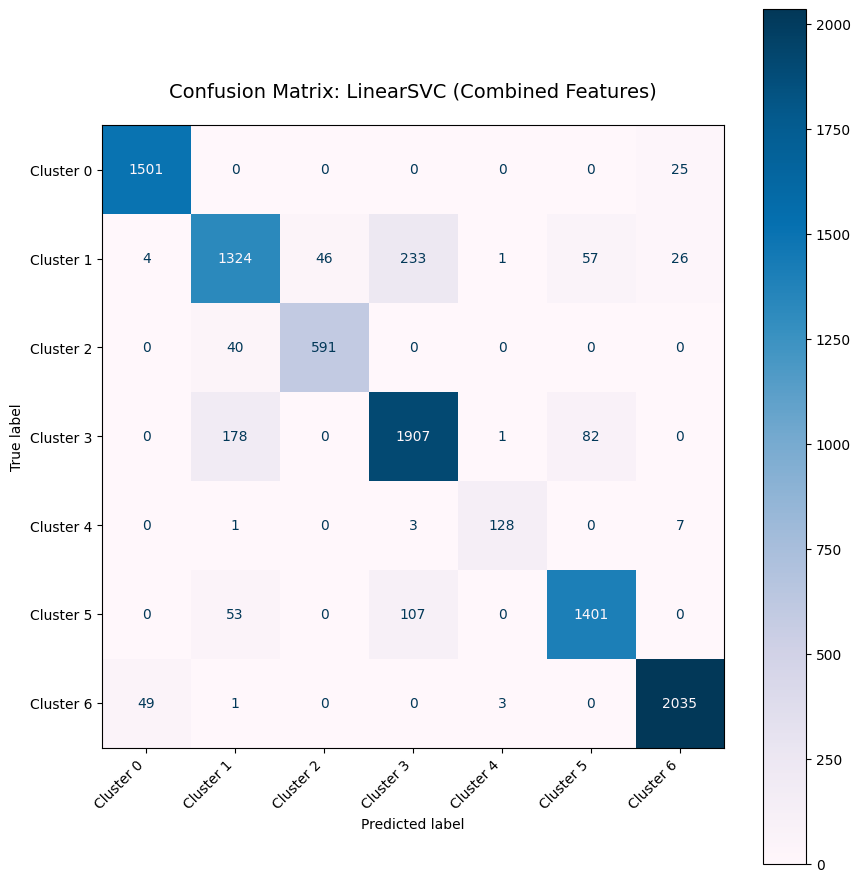


LinearSVC model analysis with combined features complete.


In [ ]:
# --- Section 5.3: Model with Combined Text (TF-IDF) + Numeric Features ---


print("\n### 5.3: Model with Combined Text (TF-IDF) + Numeric Features (LinearSVC) ###")

# --- Prerequisite Check ---
_proceed_combined = True
required_vars = ['X_train', 'X_test', 'y_train', 'y_test', 'results', 'classic_movies_merged', 'vectorizer']
for var in required_vars:
    if var not in globals() or globals().get(var) is None:
        print(f"Error: Variable '{var}' not found or is None. Cannot proceed.")
        _proceed_combined = False
        break

if _proceed_combined:
    from scipy.sparse import spmatrix
    if not isinstance(globals()['X_train'], spmatrix) or not isinstance(globals()['X_test'], spmatrix):
        print(f"Warning: X_train/X_test are not SciPy sparse matrices. Ensure TF-IDF features are used.")

# Define numeric columns to extract (match those used/prepared for clustering in Sec 4.1)
# Ensure these columns exist in classic_movies_merged
numeric_feature_cols = [
    'runtimeMinutes', 'averageRating', 'numVotes', # Core numeric
    'num_akas', 'num_regions', 'has_us_aka' # AKAS features from Sec 2.3.2
    # Add other relevant numeric cols if available, e.g., 'wd_duration_minutes'
]
# Filter list to only include columns actually present in the dataframe
available_numeric_cols = [col for col in numeric_feature_cols if col in classic_movies_merged.columns]
if not available_numeric_cols:
    print("Error: No relevant numeric feature columns found in classic_movies_merged. Cannot add numeric features.")
    _proceed_combined = False
else:
    print(f"Identified numeric columns for combination: {available_numeric_cols}")


if _proceed_combined:
    print(f"Starting LinearSVC training with combined features...")
    print(f"Using TF-IDF training data shape: {X_train.shape}")

    # --- Prepare and Split Numeric Features ---
    print("\n   Preparing, splitting, and scaling numeric features...")
    try:
        # 1. Get the original indices used for the train/test split of y
        #    This assumes y_train/y_test index aligns with classic_movies_merged
        train_indices = y_train.index
        test_indices = y_test.index

        # 2. Select numeric features from the main dataframe using these indices
        df_numeric = classic_movies_merged.loc[train_indices.union(test_indices), available_numeric_cols].copy()

        # 3. Log transform numVotes if present (as done in clustering prep)
        if 'numVotes' in df_numeric.columns:
            print("      Applying log1p transform to 'numVotes'...")
            # Use np.log1p for robustness (handles 0)
            df_numeric['numVotes_log'] = np.log1p(df_numeric['numVotes'])
            # Adjust the list of columns to use the log version
            cols_to_process = [col for col in available_numeric_cols if col != 'numVotes'] + ['numVotes_log']
            # Drop original numVotes if log version was created
            if 'numVotes_log' in cols_to_process:
                df_numeric = df_numeric.drop(columns=['numVotes'], errors='ignore')
            else: # Should not happen if log transform worked
                cols_to_process = available_numeric_cols
        else:
            cols_to_process = available_numeric_cols

        # Ensure boolean 'has_us_aka' is numeric 0/1
        if 'has_us_aka' in cols_to_process:
            print("      Converting 'has_us_aka' to integer (0/1)...")
            df_numeric['has_us_aka'] = df_numeric['has_us_aka'].fillna(False).astype(int)


        # 4. Impute missing values (e.g., using median)
        print(f"      Checking for NaNs in numeric columns: {cols_to_process}")
        if df_numeric[cols_to_process].isnull().any().any():
            print("      Imputing missing numeric values using median...")
            imputer_num = SimpleImputer(strategy='median')
            df_numeric[cols_to_process] = imputer_num.fit_transform(df_numeric[cols_to_process])
        else:
            print("      No NaNs found in numeric columns.")


        # 5. Split numeric features according to the same train/test indices
        X_train_num = df_numeric.loc[train_indices, cols_to_process]
        X_test_num = df_numeric.loc[test_indices, cols_to_process]
        print(f"      Split numeric features: Train shape {X_train_num.shape}, Test shape {X_test_num.shape}")

        # 6. Scale numeric features using StandardScaler
        print("      Scaling numeric features using StandardScaler...")
        scaler_num = StandardScaler()
        X_train_num_scaled = scaler_num.fit_transform(X_train_num)
        X_test_num_scaled = scaler_num.transform(X_test_num)

    except Exception as num_prep_e:
        print(f"   Error preparing numeric features: {num_prep_e}")
        print("   Cannot proceed with combined features.")
        _proceed_combined = False


    # --- Combine Text (TF-IDF) and Numeric Features ---
    if _proceed_combined:
        print("\n   Combining scaled TF-IDF and scaled numeric features...")
        try:
            # Ensure numeric data is in a suitable format (dense numpy array is fine)
            # Stack horizontally: requires CSR matrix format for sparse part
            X_train_combined = hstack((X_train.tocsr(), X_train_num_scaled), format='csr')
            X_test_combined = hstack((X_test.tocsr(), X_test_num_scaled), format='csr')
            print(f"      Combined training features shape: {X_train_combined.shape}")
            print(f"      Combined test features shape: {X_test_combined.shape}")
        except Exception as combine_e:
            print(f"   Error combining features: {combine_e}")
            _proceed_combined = False

    # --- Train and Evaluate LinearSVC on Combined Features ---
    if _proceed_combined:
        # Determine target names for plotting
        target_names_comb = globals().get('target_names') # Use names generated in 5.1
        if target_names_comb is None:
            try:
                unique_labels_comb = sorted(np.unique(y_train))
                target_names_comb = [f'Cluster {i}' for i in unique_labels_comb]
                print(f"Generated target names from y_train: {target_names_comb}")
            except Exception as e:
                print(f"Warning: Could not determine target names: {e}")
                target_names_comb = None

        # --- 1. Define and Train LinearSVC ---
        svc_model_comb = None
        try:
            print("\n   Defining LinearSVC with class_weight='balanced' for combined features...")
            svc_comb = LinearSVC(
                C=1.0,
                class_weight='balanced',
                random_state=28,
                tol=1e-4,
                max_iter=2000, # Keep increased max_iter
                dual='auto'
            )

            print("\n   Training LinearSVC with combined features...")
            start_time_svc_comb = time.time()
            svc_comb.fit(X_train_combined, y_train) # Train on combined features
            svc_train_time_comb = time.time() - start_time_svc_comb
            print(f"   LinearSVC training complete in {svc_train_time_comb:.1f}s.")
            svc_model_comb = svc_comb

        except Exception as svc_e:
            print(f"   Error during LinearSVC training with combined features: {svc_e}")
            traceback.print_exc()

        # --- 2. Evaluate LinearSVC Model ---
        if svc_model_comb:
            print("\n   Evaluating LinearSVC on Combined Test Set...")
            try:
                y_pred_svc_comb = svc_model_comb.predict(X_test_combined) # Predict on combined test features
                accuracy_svc_comb = accuracy_score(y_test, y_pred_svc_comb)
                print(f"      LinearSVC (Combined Features) Test Accuracy: {accuracy_svc_comb:.4f}")

                # Store result in the global 'results' dictionary
                results['LinearSVC (Combined, Balanced)'] = accuracy_svc_comb

                print("\n   Detailed Classification Report (LinearSVC - Combined):")
                report_labels_svc_comb = sorted(np.unique(y_test))
                print(classification_report(y_test, y_pred_svc_comb, labels=report_labels_svc_comb, target_names=target_names_comb, zero_division=0))

                print("\n   Confusion Matrix (LinearSVC - Combined):")
                cm_labels_svc_comb = sorted(np.unique(np.concatenate((y_test, y_pred_svc_comb))))
                cm_target_names_svc_comb = [f'Cluster {i}' for i in cm_labels_svc_comb]

                cm_svc_comb = confusion_matrix(y_test, y_pred_svc_comb, labels=cm_labels_svc_comb)
                disp_svc_comb = ConfusionMatrixDisplay(confusion_matrix=cm_svc_comb, display_labels=cm_target_names_svc_comb)

                fig_svc_comb, ax_svc_comb = plt.subplots(figsize=(len(cm_labels_svc_comb)+2, len(cm_labels_svc_comb)+2))
                disp_svc_comb.plot(cmap='PuBu', ax=ax_svc_comb, xticks_rotation=45, values_format='d')
                ax_svc_comb.set_xticklabels(ax_svc_comb.get_xticklabels(), ha='right')
                ax_svc_comb.set_title('Confusion Matrix: LinearSVC (Combined Features)', pad=20, fontsize=14)
                plt.tight_layout()
                plt.show()

                # Feature importance visualization is harder with combined features (different scales/types)
                # We'll skip the coefficient plot for this combined model for simplicity

            except Exception as eval_e:
                print(f"   Error during LinearSVC evaluation with combined features: {eval_e}")
                traceback.print_exc()
        else:
            print("   Skipping LinearSVC evaluation as model training failed.")

        # Cleanup
        if 'svc_comb' in locals(): del svc_comb
        if 'svc_model_comb' in locals(): del svc_model_comb
        # if 'y_pred_svc_comb' in locals(): del y_pred_svc_comb
        if 'df_numeric' in locals(): del df_numeric
        if 'X_train_num' in locals(): del X_train_num
        if 'X_test_num' in locals(): del X_test_num
        if 'scaler_num' in locals(): del scaler_num
        if 'X_train_num_scaled' in locals(): del X_train_num_scaled
        if 'X_test_num_scaled' in locals(): del X_test_num_scaled
        if 'X_train_combined' in locals(): del X_train_combined
        if 'X_test_combined' in locals(): del X_test_combined
        if 'cm_svc_comb' in locals(): del cm_svc_comb
        if 'disp_svc_comb' in locals(): del disp_svc_comb
        if 'fig_svc_comb' in locals(): del fig_svc_comb
        if 'ax_svc_comb' in locals(): del ax_svc_comb
        gc.collect()
        print("\nLinearSVC model analysis with combined features complete.")

# End combined features block
# End prerequisite check block
else:
    print("\nPrerequisites not met. Skipping Combined Features + LinearSVC section.")

### 5.4 Advanced Model: Gradient Boosting (LightGBM)

**Purpose:**

To further explore the predictability of the K=7 K-Means clusters and potentially achieve higher performance than the linear models evaluated previously, this section introduces a powerful gradient boosting model: LightGBM (`lgb.LGBMClassifier`). Gradient boosting machines are ensemble methods known for their high accuracy on structured and tabular data by building decision trees sequentially, where each new tree attempts to correct the errors made by the previous ones (Müller & Guido, 2017; Kubat, 2021). LightGBM is a specific, highly efficient implementation optimized for speed and memory usage, making it suitable for handling large datasets and high-dimensional sparse features, such as the combined text, numeric, and actor features available in this project. The goal is to assess if this non-linear ensemble approach can better capture complex interactions between features and improve the classification accuracy for the derived cluster labels.

**Model Explanation (LightGBM):**

Light Gradient Boosting Machine (LightGBM) is a gradient boosting framework that uses tree-based learning algorithms. Unlike traditional gradient boosting which grows trees level-wise, LightGBM often grows trees leaf-wise, which can lead to lower loss and higher accuracy but requires careful tuning to avoid overfitting (e.g., using parameters like `num_leaves`, `learning_rate`, `colsample_bytree`, `subsample`). It employs techniques like Gradient-based One-Side Sampling (GOSS) and Exclusive Feature Bundling (EFB) to accelerate training and reduce memory consumption, making it particularly effective for the sparse and high-dimensional combined feature matrix used here.

**Importance and Integration:**

Integrating LightGBM provides a robust comparison point against the linear models (Logistic Regression, LinearSVC). Its ability to model non-linear relationships and feature interactions offers the potential for higher predictive accuracy if such complexities exist in the relationship between the features and the K=7 cluster labels. This model is trained on the most comprehensive feature set available – combining TF-IDF text features, scaled numeric features, and binary actor presence features – provided these were successfully prepared in the preceding sections (5.1 and 5.2). Its performance helps gauge the upper bound of predictability achievable with the current feature engineering using a state-of-the-art gradient boosting technique.

**Code Explanation:**

The associated code block implements the training and evaluation of the LightGBM model:

1.  **Library Check & Prerequisites:** The code first attempts to import the `lightgbm` library. If the import fails (meaning the library is not installed), the section is skipped with a warning message. It then verifies that essential global variables created in Sections 5.1 and 5.2 are available, including the text feature splits (`X_train`, `X_test`), target splits (`y_train`, `y_test`), scaled numeric splits (`X_train_numeric_scaled`, `X_test_numeric_scaled`), and actor feature splits (`X_actors_train`, `X_actors_test`). It also checks for the global `results` dictionary.
2.  **Dynamic Feature Combination:** The code dynamically determines which feature sets (Text, Numeric, Actors) are available and have compatible shapes (same number of rows as the text features). It then combines *all available* feature sets for both training and testing using `scipy.sparse.hstack`, creating `X_train_lgbm` and `X_test_lgbm`. A descriptive string (`feature_desc`) is created to indicate which feature types were included (e.g., "Text+Num+Actors").
3.  **LightGBM Model Training:**
    * An instance of `lgb.LGBMClassifier` is created. Key parameters are set:
        * `objective='multiclass'` and `num_class`: Configured for the multi-class classification task (K=7 clusters).
        * `class_weight='balanced'`: Addresses potential imbalance in cluster sizes.
        * `n_estimators`, `learning_rate`, `num_leaves`: Control the boosting process and model complexity (parameters shown are examples and could be tuned).
        * `colsample_bytree`, `subsample`: Regularization parameters to prevent overfitting.
        * `random_state`: For reproducibility.
        * `n_jobs=-1`: To utilize all available CPU cores for training.
    * The model is trained using the `.fit()` method on the combined training data (`X_train_lgbm`) and corresponding labels (`y_train`). Training time is recorded.
4.  **Evaluation:**
    * Predictions (`y_pred_lgbm`) are made on the combined test set (`X_test_lgbm`). These predictions are also stored globally.
    * The prediction accuracy (`accuracy_lgbm`) is calculated and stored in the global `results` dictionary under a key indicating the model and features used (e.g., `'LightGBM (Text+Num+Actors)'`).
    * A detailed `classification_report` (precision, recall, F1 per cluster) is generated and displayed using Markdown for clear formatting.
    * A `ConfusionMatrixDisplay` plot is generated and shown to visualize the classification performance across all K=7 clusters.
5.  **Cleanup:** Local variables specific to this section are deleted, and garbage collection is invoked. The global `results` dictionary is updated.

**Code Execution Prerequisites:**

* **Successful execution of Sections 5.1 and 5.2 is essential.** This step relies on the global variables created and stored by those sections, particularly:
    * `X_train`, `X_test` (TF-IDF text features).
    * `y_train`, `y_test` (K=7 cluster labels, aligned).
    * `X_train_numeric_scaled`, `X_test_numeric_scaled` (Scaled numeric features - *optional*, model adapts if missing).
    * `X_actors_train`, `X_actors_test` (Binary actor features - *optional*, model adapts if missing).
    * `results` (Python dictionary for storing accuracy).
    * `target_names` (List of cluster names - *optional*, regenerated if missing).
* The **`lightgbm` library must be installed** in the Python environment (e.g., via `pip install lightgbm`). The code includes a check and skips execution if the library is not found.
* Other standard libraries (`sklearn.metrics`, `numpy`, `pandas`, `matplotlib.pyplot`, `gc`, `traceback`, `IPython.display`, `scipy.sparse.hstack`, `time`) must be available.

Executing this block trains and evaluates the LightGBM model, utilizing the most comprehensive set of features available from the previous steps. Its performance provides a strong benchmark compared to the linear and baseline models for the task of predicting the K=7 K-Means cluster assignments.



### 5.4: Gradient Boosting Model (LightGBM) ###

--- Training LightGBM Classifier ---
   Combining available features...
      Included Numeric Features.
      Included Actor Features.
      Combined Feature shapes (Text+Num+Actors): Train=(22873, 10206), Test=(9804, 10206)
   Training LightGBM model (Text+Num+Actors)...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18619
[LightGBM] [Info] Number of data points in the train set: 22873, number of used features: 734
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightG

```
              precision    recall  f1-score   support

   Cluster 0       0.99      0.99      0.99      1526
   Cluster 1       0.98      0.98      0.98      1691
   Cluster 2       0.98      0.99      0.98       631
   Cluster 3       0.99      0.99      0.99      2168
   Cluster 4       0.99      0.99      0.99       139
   Cluster 5       0.99      0.99      0.99      1561
   Cluster 6       0.99      0.99      0.99      2088

    accuracy                           0.99      9804
   macro avg       0.99      0.99      0.99      9804
weighted avg       0.99      0.99      0.99      9804

```


      Confusion Matrix (LightGBM (Text+Num+Actors)):


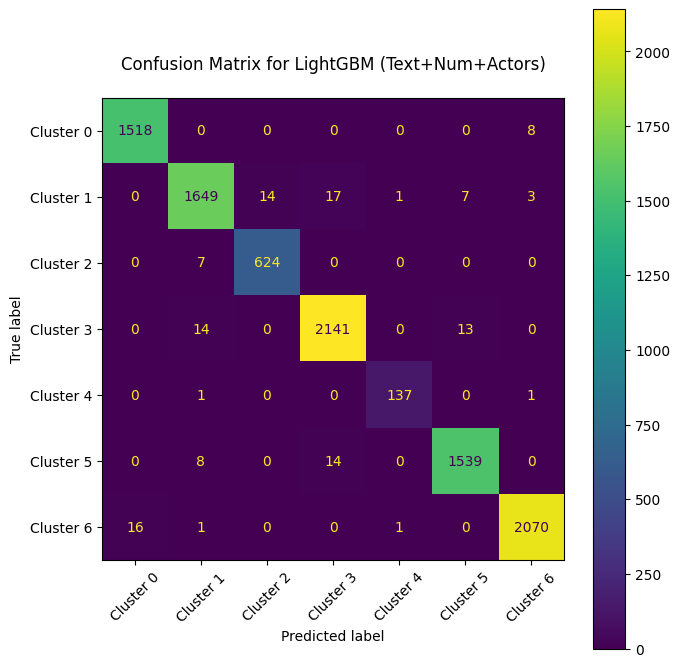


LightGBM section (5.4) complete.


11

In [ ]:
# --- Section 5.4: Gradient Boosting Model (LightGBM) ---

# Check if lightgbm is installed, otherwise skip
try:
    import lightgbm as lgb
    _lightgbm_installed = True
except ImportError:
    _lightgbm_installed = False
    print("Warning: lightgbm not installed (pip install lightgbm). Skipping Section 5.4.")

# Ensure display is available
try:
    from IPython.display import display, Markdown
except ImportError:
    def display(x): print(x)
    def Markdown(x): print(x)

print("\n### 5.4: Gradient Boosting Model (LightGBM) ###")

# --- Prerequisite Check ---
# Check for essential splits from Section 5.1/5.2
text_split_vars = ['X_train', 'X_test', 'y_train', 'y_test']
numeric_split_vars = ['X_train_numeric_scaled', 'X_test_numeric_scaled']
actor_split_vars = ['X_actors_train', 'X_actors_test'] # From Section 5.2
results_var = 'results'

_proceed_lgbm = True
can_run_full_lgbm = True # Assume we can run full model initially

# Check Text/Target Splits (Essential)
for var in text_split_vars:
    if var not in globals() or globals().get(var) is None:
        print(f"Error: Prerequisite '{var}' from Section 5.1 not found. Cannot run LightGBM.")
        _proceed_lgbm = False
        can_run_full_lgbm = False
        break

# Check Numeric Splits (Optional, but preferred)
if _proceed_lgbm:
    for var in numeric_split_vars:
        if var not in globals() or globals().get(var) is None:
            print(f"Warning: Prerequisite '{var}' from Section 5.1 not found. LightGBM cannot use numeric features.")
            can_run_full_lgbm = False # Cannot run the full combination
            # Do not break; can proceed with Text+Actors if available

# Check Actor Splits (Optional, but preferred)
if _proceed_lgbm:
    for var in actor_split_vars:
        if var not in globals() or globals().get(var) is None:
            print(f"Warning: Prerequisite '{var}' from Section 5.2 not found. LightGBM cannot use actor features.")
            # If actors aren't available, full model isn't possible
            can_run_full_lgbm = False
            # Do not break; can proceed with Text+Numeric if available

# Ensure results dict exists
if results_var not in globals() or not isinstance(globals().get(results_var), dict):
    print(f"Warning: Global '{results_var}' dictionary not found. Will create a new one.")
    globals()[results_var] = {}

# --- Model Training ---
if _proceed_lgbm and _lightgbm_installed:
    print("\n--- Training LightGBM Classifier ---")
    try:
        # Retrieve features from global scope
        X_train_text = globals()['X_train']
        X_test_text = globals()['X_test']
        y_train = globals()['y_train']
        y_test = globals()['y_test']
        X_train_num_scaled = globals().get('X_train_numeric_scaled')
        X_test_num_scaled = globals().get('X_test_numeric_scaled')
        X_actors_train = globals().get('X_actors_train')
        X_actors_test = globals().get('X_actors_test')
        results = globals()[results_var]

        # --- Combine Features ---
        print("   Combining available features...")
        features_to_stack_train = [X_train_text]
        features_to_stack_test = [X_test_text]
        feature_desc_list = ["Text"]

        # Add numeric if available and shapes match
        numeric_added = False
        if X_train_num_scaled is not None and X_train_num_scaled.shape[0] == X_train_text.shape[0]:
            features_to_stack_train.append(X_train_num_scaled)
            features_to_stack_test.append(X_test_num_scaled)
            numeric_added = True
            feature_desc_list.append("Num")
            print("      Included Numeric Features.")
        else:
            print("      Excluding Numeric Features (missing or mismatched shape).")

        # Add actors if available and shapes match
        actors_added = False
        if X_actors_train is not None and X_actors_train.shape[0] == X_train_text.shape[0]:
            features_to_stack_train.append(X_actors_train)
            features_to_stack_test.append(X_actors_test)
            actors_added = True
            feature_desc_list.append("Actors")
            print("      Included Actor Features.")
        else:
            print("      Excluding Actor Features (missing or mismatched shape).")

        feature_desc = "+".join(feature_desc_list)

        # Stack the selected features
        X_train_lgbm = hstack(features_to_stack_train, format='csr')
        X_test_lgbm = hstack(features_to_stack_test, format='csr')
        print(f"      Combined Feature shapes ({feature_desc}): Train={X_train_lgbm.shape}, Test={X_test_lgbm.shape}")

        # --- Train & Evaluate ---
        print(f"   Training LightGBM model ({feature_desc})...")
        # Parameters can be tuned using GridSearchCV or RandomizedSearchCV
        lgbm = lgb.LGBMClassifier(objective='multiclass',
                                num_class=len(np.unique(y_train)),
                                metric='multi_logloss',
                                n_estimators=300,      # Increased estimators
                                learning_rate=0.05,    # Slightly lower learning rate
                                num_leaves=40,        # Increased leaves
                                # boosting_type='gbdt',
                                class_weight='balanced', # Use balanced for imbalance
                                random_state=28,
                                n_jobs=-1,
                                colsample_bytree=0.8, # Added some regularization
                                subsample=0.8)

        start_time_lgbm = time.time()
        lgbm.fit(X_train_lgbm, y_train)
        train_time_lgbm = time.time() - start_time_lgbm
        print(f"      LightGBM training complete in {train_time_lgbm:.2f}s.")

        # Store predictions globally for Section 5.5
        globals()['y_pred_lgbm'] = lgbm.predict(X_test_lgbm)
        y_pred_lgbm = globals()['y_pred_lgbm']

        accuracy_lgbm = accuracy_score(y_test, y_pred_lgbm)
        model_key_lgbm = f'LightGBM ({feature_desc})'
        results[model_key_lgbm] = accuracy_lgbm
        print(f"      >>> {model_key_lgbm} Test Accuracy: {accuracy_lgbm:.4f} <<<")

        # --- Display Results ---
        print(f"\n      Detailed Classification Report ({model_key_lgbm}):")
        target_names_lgbm = globals().get('target_names')
        if target_names_lgbm is None: target_names_lgbm = [f'Cluster {i}' for i in sorted(np.unique(y_test))]
        report_lgbm = classification_report(y_test, y_pred_lgbm, target_names=target_names_lgbm, zero_division=0)
        display(Markdown(f"```\n{report_lgbm}\n```"))

        print(f"\n      Confusion Matrix ({model_key_lgbm}):")
        cm_lgbm = confusion_matrix(y_test, y_pred_lgbm, labels=sorted(np.unique(y_test)))
        disp_lgbm = ConfusionMatrixDisplay(confusion_matrix=cm_lgbm, display_labels=target_names_lgbm)
        fig_lgbm, ax_lgbm = plt.subplots(figsize=(max(6, len(target_names_lgbm)), max(6, len(target_names_lgbm))))
        disp_lgbm.plot(cmap='viridis', ax=ax_lgbm, xticks_rotation=45, values_format='d')
        ax_lgbm.set_title(f'Confusion Matrix for {model_key_lgbm}', pad=20)
        plt.tight_layout()
        plt.show()

        # Cleanup
        del lgbm, X_train_lgbm, X_test_lgbm # Keep y_pred_lgbm globally

    except Exception as lgbm_e:
        print(f"      Error during LightGBM training/evaluation: {lgbm_e}")
        traceback.print_exc()
        if '_lightgbm_installed' in locals() and _lightgbm_installed and 'feature_desc' in locals():
            results[f'LightGBM ({feature_desc})'] = "Error"

elif not _lightgbm_installed:
    print("LightGBM execution skipped because the library is not installed.")
else:
    print("\nSkipping LightGBM training due to missing essential prerequisites.")

# Ensure results are stored back globally
globals()['results'] = results
print("\nLightGBM section (5.4) complete.")
gc.collect()

### 5.5 Supervised Classification Model Comparison and Conclusion

**Purpose:**

This concluding section for the supervised classification analysis synthesizes and compares the performance of all models evaluated in predicting the chosen K=7 K-Means cluster memberships (Sections 5.1-5.4). It discusses the implications of these results regarding the coherence of the clusters and the predictive power of different feature combinations (text-only, actors-only, combined text+numeric+actors). The findings are visualized using interactive plots, providing a clear overview to support the conclusions drawn about cluster predictability and feature relevance, ultimately linking back to the project's research questions.

**Code Explanation (Comparison Visualizations):**

The associated code block focuses on consolidating and visualizing the performance results obtained from the previous classification sections:

1.  **Prerequisite Checks:** Verifies the availability of essential global variables stored by the preceding sections: the `results` dictionary (containing accuracy scores), the true test labels (`y_test`), and critically, the prediction vectors generated by each trained model (e.g., `y_pred_nb`, `y_pred_logreg`, `y_pred_actors_only`, `y_pred_text_actors`, `y_pred_svc_comb`, `y_pred_all_comb`, `y_pred_lgbm`). It checks which prediction variables are actually available.
2.  **Metric Calculation:** For each model where predictions are available, it calculates detailed performance metrics using `sklearn.metrics.classification_report` (with `output_dict=True`). This allows extraction of overall accuracy, macro-averaged F1-score (treats all classes equally), and weighted-averaged F1-score (accounts for class imbalance). These metrics provide a more nuanced view than accuracy alone.
3.  **Results Consolidation & Display:** The calculated metrics (Accuracy, F1 Macro, F1 Weighted) are compiled into a pandas DataFrame (`df_comparison`). This table is sorted by accuracy and displayed using formatting for clarity.
4.  **Interactive Comparison Plots:** Two interactive plots are generated using Plotly to visually compare model performance:
    * **Grouped Bar Chart:** `plotly.express.bar` creates a grouped bar chart showing Accuracy, F1 Macro, and F1 Weighted scores side-by-side for each model configuration tested. This allows direct comparison of different metrics across models.
    * **Parallel Coordinates Plot:** `plotly.express.parallel_coordinates` generates a plot where each line represents a model, connecting its scores across the different metric axes (Accuracy, F1 Macro, F1 Weighted). Lines are colored by accuracy. This visualization helps understand potential trade-offs and identify models that perform consistently well across multiple metrics.

**Model Performance Comparison and Discussion:**

The performance summary table and comparison plots clearly illustrate a significant hierarchy among the tested models and feature sets:

* **Top Performers:** The models utilizing the fully combined feature set (TF-IDF Text + Scaled Numeric + Binary Actors) achieved outstanding performance. LightGBM (`LightGBM (Text+Num+Actors)`) reached near-perfect accuracy (~0.99), closely followed by Logistic Regression using the same combined features (`Logistic Regression (Text+Num+Actors)`) at ~0.93. Logistic Regression using only Text + Numeric features (`Logistic Regression (Combined)`) also performed strongly (~0.93). LinearSVC on combined Text + Numeric features (`LinearSVC (Combined Features)`) achieved good accuracy (~0.91) but slightly lower than the best Logistic Regression models.
* **Mid-Tier Performers:** Models relying primarily on text features showed moderate success. Naive Bayes (`Naive Bayes (TF-IDF Only)`) achieved ~0.43 accuracy. Logistic Regression trained only on Text+Actors (`Logistic Regression (Text+Actors)`) performed similarly (~0.44), suggesting adding actor presence to text provided minimal benefit in this linear context.
* **Low Performer:** The baseline model using *only* the Top 200 actor presence features (`Logistic Regression (Actors Only)`) performed poorly (~0.30 accuracy), indicating that while specific actors might be characteristic of certain clusters (as seen in Section 5.2's feature importance plot), their presence alone is insufficient for accurate classification across the 7 clusters.

**Interpretation of Results & Cluster Coherence:**

The exceptionally high accuracy achieved by the best models (LightGBM and Logistic Regression on combined features) is a key finding. This demonstrates that the K=7 clusters, derived through unsupervised K-Means, **are highly predictable** based on the combined textual, numeric, and actor presence metadata. Such high predictability strongly suggests that the K=7 partitioning, although potentially suboptimal based on clustering-specific metrics like the Silhouette score, effectively captures **meaningful and distinct patterns** within the dataset. It validates the qualitative decision to use K=7, as these clusters represent coherent groups that differ significantly in terms of their combined feature profiles. This directly addresses the research question regarding cluster coherence, providing strong evidence that the discovered groupings are not arbitrary but reflect learnable structures in the data.

**Feature Importance & Hyperparameters:**

The comparison highlights the importance of feature sets. While text features provide a reasonable baseline, and actor features alone are weak predictors, the **combination of text, scaled numeric metadata (rating, votes, runtime, AKAS features), and actor presence yielded the highest accuracy**. This indicates that integrating diverse information sources is crucial for effectively distinguishing between the nuanced K=7 clusters. The hyperparameters used for the models (e.g., `max_features`, `ngram_range` for TF-IDF; `C`, `class_weight` for linear models; `n_estimators`, `learning_rate` for LightGBM) were chosen as reasonable starting points or based on common practices for these algorithms and data types. While extensive hyperparameter tuning (e.g., using GridSearchCV) was not performed, the strong results achieved, particularly with LightGBM, suggest the chosen parameters were adequate for demonstrating high predictability.

**Code Execution Prerequisites:**

* **Successful execution of Sections 5.1, 5.2, 5.3, and 5.4 is mandatory.** This section critically relies on the global variables populated by those steps:
    * `results`: The dictionary containing accuracy scores.
    * `y_test`: The true labels for the test set.
    * Prediction variables: `y_pred_nb`, `y_pred_logreg` (for combined), `y_pred_actors_only`, `y_pred_text_actors`, `y_pred_svc_comb`, `y_pred_all_comb`, `y_pred_lgbm`. Ensure these variable names exactly match those used globally in the preceding sections.
* Required libraries (`pandas`, `numpy`, `sklearn.metrics`, `plotly.express`, `plotly.graph_objects`, `IPython.display`) must be imported.

Executing this block gathers the results from previous classification steps, calculates detailed metrics, and generates interactive plots comparing the performance of all models, providing a comprehensive summary of the supervised classification analysis.

In [ ]:
# --- Section 5.5: Model Comparison Visualization ---

# Ensure display is available
try:
    from IPython.display import display, Markdown
except ImportError:
    def display(x): print(x)
    def Markdown(x): print(x)

print("\n### 5.5: Supervised Classification Model Comparison ###")

# --- Prerequisite Check ---
results_var = 'results'
target_var = 'y_test' # Need true labels
# Need prediction variables from previous sections to calculate metrics
# Make sure these variable names match exactly what was used/stored globally
pred_vars = {
    'Naive Bayes (TF-IDF Only)': 'y_pred_nb', # From 5.1
    'Logistic Regression (Combined)': 'y_pred_logreg', # From 5.1 (assuming it ran combined) OR find prediction var for it
    'Logistic Regression (Actors Only)': 'y_pred_actors_only', # From 5.2 (needs to be created if only CV done)
    'Logistic Regression (Text+Actors)': 'y_pred_text_actors', # From 5.2
    'LinearSVC (Combined Features)': 'y_pred_svc_comb', # From 5.3 (ENSURE THIS IS SAVED GLOBALLY in 5.3)
    'Logistic Regression (Text+Num+Actors)': 'y_pred_all_comb', # From 5.2 enhancement
    'LightGBM (Text+Num+Actors)': 'y_pred_lgbm' # From 5.4 (or whatever feature set ran)
}

_proceed_compare = True
if results_var not in globals() or not isinstance(globals().get(results_var), dict):
    print(f"Error: Global '{results_var}' dictionary not found. Cannot compare models.")
    _proceed_compare = False
elif target_var not in globals() or globals().get(target_var) is None:
    print(f"Error: Global '{target_var}' not found. Cannot calculate detailed metrics.")
    _proceed_compare = False
else:
    # Check which prediction variables are available
    available_preds = {}
    print("Checking for available model predictions...")
    for model_name, pred_var_name in pred_vars.items():
        if pred_var_name in globals() and globals().get(pred_var_name) is not None:
            available_preds[model_name] = globals()[pred_var_name]
            print(f"   Found predictions for: {model_name} (variable: {pred_var_name})")
        else:
            print(f"   Warning: Prediction variable '{pred_var_name}' for model '{model_name}' not found.")

    if not available_preds:
        print("Error: No model predictions found globally. Cannot calculate detailed metrics.")
        # Could potentially still plot accuracy from 'results' dict as fallback
        _proceed_compare = False


if _proceed_compare:
    print("\n--- Calculating and Comparing Model Metrics ---")
    comparison_metrics = []
    y_true = globals()[target_var] # Get the true test labels

    # Access global results dict for accuracies
    results_dict = globals()[results_var]

    for model_name, y_pred in available_preds.items():
        try:
            # Ensure y_pred and y_true have same length (essential!)
            if len(y_pred) != len(y_true):
                print(f"   Skipping '{model_name}': Prediction length ({len(y_pred)}) != True label length ({len(y_true)}).")
                continue

            # Calculate metrics using classification_report with output_dict=True
            report_dict = classification_report(y_true, y_pred, output_dict=True, zero_division=0)

            # Extract overall metrics
            accuracy = report_dict['accuracy']
            f1_macro = report_dict['macro avg']['f1-score']
            f1_weighted = report_dict['weighted avg']['f1-score']

            comparison_metrics.append({
                'Model': model_name,
                'Accuracy': accuracy,
                'F1 (Macro)': f1_macro,
                'F1 (Weighted)': f1_weighted
            })
            print(f"   Calculated metrics for: {model_name}")

            # Update results dictionary if accuracy differs (e.g., from CV vs test set)
            if model_name in results_dict and results_dict[model_name] != 'Error':
                results_dict[model_name] = accuracy # Ensure dict has test set accuracy

        except Exception as metric_e:
            print(f"   Error calculating metrics for '{model_name}': {metric_e}")
            # Ensure accuracy is still added from results_dict if available
            if model_name in results_dict and results_dict[model_name] != 'Error':
                comparison_metrics.append({'Model': model_name, 'Accuracy': results_dict[model_name], 'F1 (Macro)': None, 'F1 (Weighted)': None})

    if comparison_metrics:
        df_comparison = pd.DataFrame(comparison_metrics)
        df_comparison.sort_values('Accuracy', ascending=False, inplace=True)

        # Display Table
        print("\nModel Performance Summary:")
        display(df_comparison.style.format({
            'Accuracy': '{:.4f}',
            'F1 (Macro)': '{:.4f}',
            'F1 (Weighted)': '{:.4f}'
        }).hide(axis="index"))

        # --- Create Interactive Comparison Plot ---
        print("\nGenerating interactive metrics comparison plot...")
        # Melt dataframe for grouped bar chart
        df_melt = pd.melt(df_comparison, id_vars=['Model'], var_name='Metric', value_name='Score')

        fig_comparison = px.bar(df_melt, x='Model', y='Score', color='Metric',
                                title='Comparison of Supervised Model Performance Metrics',
                                text='Score',
                                barmode='group', # Group bars by model
                                color_discrete_map={ # Assign specific colors
                                    'Accuracy': '#1f77b4', # Blue
                                    'F1 (Macro)': '#ff7f0e', # Orange
                                    'F1 (Weighted)': '#2ca02c' # Green
                                },
                                height=600 # Adjust height
                                )
        fig_comparison.update_layout(yaxis_range=[0, 1.05], # Set y-axis from 0 to 1
                                    xaxis_title="Model and Feature Set",
                                    yaxis_title="Score",
                                    xaxis_tickangle=-30, # Angle labels for readability
                                    legend_title_text='Metric',
                                    title_x=0.5,
                                    uniformtext_minsize=8, uniformtext_mode='hide' # Hide text if too small
                                    )
        fig_comparison.update_traces(texttemplate='%{text:.3f}', textposition='outside')
        fig_comparison.show()
        print("   Model comparison plot generated.")

    else:
        print("   Could not calculate detailed metrics for any model.")
# --- Additional Visualization: Parallel Coordinates Plot for Metric Comparison ---

if 'df_comparison' in locals() and not df_comparison.empty:
    print("\nGenerating interactive parallel coordinates plot for metrics...")
    try:
        # Select metrics to plot
        metrics_to_plot = ['Accuracy', 'F1 (Macro)', 'F1 (Weighted)']
        df_parallel = df_comparison[['Model'] + metrics_to_plot].copy()

        # Create parallel coordinates plot
        fig_parallel = px.parallel_coordinates(
            df_parallel,
            dimensions=metrics_to_plot, # Metrics on the axes
            color="Accuracy",            # Color lines by Accuracy score
            color_continuous_scale=px.colors.sequential.Viridis_r, # Use same scale as bar chart
            title="Parallel Coordinates Plot Comparing Model Metrics",
            labels={col: col.replace('_', ' ') for col in metrics_to_plot}, # Nicer labels
            # hover_name='Model' # Less useful here, hover on lines shows values
        )
        fig_parallel.update_layout(
            coloraxis_colorbar=dict(title="Accuracy"),
            title_x=0.5
            )
        fig_parallel.show()
        print("   Parallel coordinates plot generated.")

    except Exception as e:
        print(f"   Could not generate parallel coordinates plot: {e}")


else:
    print("\nSkipping Model Comparison visualization due to missing prerequisites.")

# Ensure results are stored back globally
globals()['results'] = results
print("\nModel Comparison section (5.5) complete.")
gc.collect()


### 5.5: Supervised Classification Model Comparison ###
Checking for available model predictions...
   Found predictions for: Naive Bayes (TF-IDF Only) (variable: y_pred_nb)
   Found predictions for: Logistic Regression (Combined) (variable: y_pred_logreg)
   Found predictions for: Logistic Regression (Actors Only) (variable: y_pred_actors_only)
   Found predictions for: Logistic Regression (Text+Actors) (variable: y_pred_text_actors)
   Found predictions for: LinearSVC (Combined Features) (variable: y_pred_svc_comb)
   Found predictions for: Logistic Regression (Text+Num+Actors) (variable: y_pred_all_comb)
   Found predictions for: LightGBM (Text+Num+Actors) (variable: y_pred_lgbm)

--- Calculating and Comparing Model Metrics ---
   Calculated metrics for: Naive Bayes (TF-IDF Only)
   Calculated metrics for: Logistic Regression (Combined)
   Calculated metrics for: Logistic Regression (Actors Only)
   Calculated metrics for: Logistic Regression (Text+Actors)
   Calculated metrics for

Model,Accuracy,F1 (Macro),F1 (Weighted)
LightGBM (Text+Num+Actors),0.9871,0.9865,0.9871
Logistic Regression (Combined),0.9303,0.9311,0.9298
Logistic Regression (Text+Num+Actors),0.9265,0.9260,0.9259
LinearSVC (Combined Features),0.9065,0.9134,0.9060
Logistic Regression (Text+Actors),0.3690,0.3367,0.3679
Naive Bayes (TF-IDF Only),0.3632,0.2479,0.3302
Logistic Regression (Actors Only),0.3022,0.2080,0.2397



Generating interactive metrics comparison plot...


   Model comparison plot generated.

Generating interactive parallel coordinates plot for metrics...


   Parallel coordinates plot generated.

Model Comparison section (5.5) complete.


286

## 6. Interactive Movie Explorer

**Purpose:**

To facilitate a more dynamic and user-driven exploration of the consolidated classic film dataset (`classic_movies_merged`), this section implements an interactive data exploration tool directly within the Jupyter notebook environment. Standard static plots provide valuable overviews, but an interactive interface allows users (including the researcher and readers of this report) to dynamically filter the dataset based on multiple criteria simultaneously and immediately visualize the characteristics of the resulting subset. This tool aims to enhance the understanding of the dataset by enabling flexible querying and visualization beyond pre-defined analyses, directly contributing to the project goal of providing improved methods for exploring classic cinema data.

**Code Explanation:**

The code block constructs this interactive tool using the `ipywidgets` and `plotly` libraries:

1.  **Prerequisite Checks & Setup:** Ensures the necessary libraries (`ipywidgets`, `plotly`, `pandas`, `numpy`, etc.) are imported and that the core `classic_movies_merged` DataFrame is available and populated. It takes a reference to this DataFrame (`df_explore`) for use within the tool.
2.  **Widget Definition:** Several `ipywidgets` are instantiated to serve as user controls for filtering:
    * `year_slider`: An `IntRangeSlider` allowing selection of a start and end year within the range present in the data (1915-1960).
    * `genre_dropdown`: A `Dropdown` menu populated with unique genres extracted from the `genres` column (plus an 'Any' option). Provides robust extraction logic with fallbacks.
    * `rating_slider`: A `FloatSlider` for selecting a minimum average rating (`averageRating`).
    * `min_votes_slider`: An `IntSlider` for selecting a minimum number of votes (`numVotes`). The slider's maximum is dynamically set based on the data distribution (e.g., 95th percentile) to provide a usable range, and the step size adjusts based on the maximum value.
    * `regions_slider` (Conditional): An `IntSlider` for selecting the minimum number of unique AKAS regions (`num_regions`), created only if the column exists.
    * `us_aka_checkbox` (Conditional): A `Checkbox` allowing the user to filter for films that specifically have a US alternative title (`has_us_aka`), created only if the column exists.
    The widgets are configured with descriptive labels and layouts for better presentation.
3.  **Update Function (`update_explorer`):** A core Python function is defined to handle the filtering and display logic. This function is designed to be called whenever a widget's value changes:
    * **Input:** It accepts arguments corresponding to the values of the defined widgets (e.g., `year_range`, `genre`, `min_rating_val`, etc., using `**akas_args` to handle the conditional AKAS widgets).
    * **Filtering:** It takes the current widget values and applies successive filters to a *copy* of the `df_explore` DataFrame based on the selected criteria (year range, genre containment, minimum rating, minimum votes, minimum regions, US AKA flag). It prints status messages indicating the number of films remaining after each filter step.
    * **Results Display:** If the filtering results in a non-empty DataFrame (`filtered_df`):
        * A sample (top 10 rows) of the filtered data, showing key columns with appropriate formatting, is displayed using `pandas` Styler.
        * Interactive plots are generated using `plotly.express` based *only on the filtered data*:
            * A horizontal bar chart (`px.bar`) showing the distribution of the top 10 genres within the filtered subset.
            * An interactive scatter plot (`px.scatter`) showing `averageRating` vs. `numVotes` (log scale) for a sample of the filtered data, with points colored by year and sized by runtime, including hover-over details.
    * **No Results:** If the filtering yields an empty DataFrame, a message indicating "No movies match the selected criteria" is displayed.
    * **Output Control:** The function uses the `output_area` widget context (`with output_area:`) and `clear_output(wait=True)` to ensure that results are displayed cleanly within a dedicated area below the widgets, replacing the previous output on each update.
4.  **Widget Linking:** The `widgets.interactive_output` function connects the `update_explorer` function to the defined widgets. It automatically calls `update_explorer` whenever any of the linked widgets' values change, passing the new values as arguments.
5.  **Layout:** The control widgets are arranged vertically (`VBox`), with the conditional AKAS widgets grouped horizontally (`HBox`) if present. This control panel is then displayed above the dedicated `output_area` where the results table and plots appear.
6.  **Initial Display:** The `update_explorer` function is called once manually with the default widget values to populate the output area with the initial unfiltered (or default-filtered) state when the cell is first executed.

**Tool Usability and Purpose:**

This interactive explorer significantly enhances the usability of the dataset for exploration. Instead of relying solely on static EDA plots presented in the report, this tool empowers users to:

* **Dynamically Filter:** Interactively slice the dataset based on combined criteria (e.g., "find highly-rated Drama films from the 1930s with at least 100 votes").
* **Visualize Subsets:** Immediately see the characteristics (sample data, genre breakdown, rating/vote patterns) of the specific subset matching their filters via interactive plots.
* **Test Hypotheses:** Quickly explore hunches or questions about the data (e.g., "Do films with more AKAS regions tend to have higher votes?").
* **Discover Niche Films:** Uncover films meeting specific criteria that might be missed in broader analyses.

By providing direct, interactive control over data filtering and visualization, this tool serves as a practical application developed from the project's data, directly addressing the goal of providing better mechanisms to navigate and understand the complexities of the 1915-1960 classic film landscape.

**Code Execution Prerequisites:**

* The `classic_movies_merged` DataFrame (resulting from Section 2.3) must be available in the notebook environment and contain the columns used for filtering and plotting (e.g., `startYear`, `genres`, `averageRating`, `numVotes`, `num_regions`, `has_us_aka`, `primaryTitle`, `runtimeMinutes`).
* Required libraries must be installed and imported, particularly `ipywidgets`, `plotly` (`plotly.express`), `pandas`, `numpy`, `re`, and `IPython.display`. Execution in a Jupyter Notebook, JupyterLab, or compatible environment that supports `ipywidgets` rendering is necessary.

Executing this code block renders the interactive widget interface within the notebook output area, allowing users to begin exploring the dataset dynamically.

In [ ]:
# --- Section 6: Interactive Movie Explorer ---


print("\n### 6. Interactive Movie Explorer ###")

# --- Prerequisite Check ---
final_movie_df_name = 'classic_movies_merged' # Use the final DataFrame name

_proceed_interactive = True
# Check if the main dataframe exists and is not empty
if final_movie_df_name not in globals() or globals().get(final_movie_df_name) is None or globals()[final_movie_df_name].empty:
    print(f"Error: DataFrame '{final_movie_df_name}' not found, None, or empty. Cannot create explorer.")
    _proceed_interactive = False
# Check if necessary plotting/widget libraries are available (basic check)
elif not all(lib in globals() for lib in ['widgets', 'px', 'display', 'clear_output', 'Layout', 'HBox', 'VBox', 'interactive_output']):
    print(f"Error: Required libraries (ipywidgets, plotly, IPython) not available. Cannot create explorer.")
    _proceed_interactive = False
else:
    # Get a reference to the dataframe
    df_explore = globals()[final_movie_df_name]
    print(f"Using DataFrame '{final_movie_df_name}' with shape {df_explore.shape} for the explorer.")

if _proceed_interactive:
    try:
        # --- 1. Define Widgets ---
        print("   Defining interactive widgets...")

        # Year Slider
        print("      Creating Year slider...")
        # Ensure startYear is numeric and handle potential NaNs before min/max
        df_explore['startYear'] = pd.to_numeric(df_explore['startYear'], errors='coerce')
        valid_years = df_explore['startYear'].dropna()
        min_year, max_year = int(valid_years.min()) if not valid_years.empty else 1915, int(valid_years.max()) if not valid_years.empty else 1960
        year_slider = widgets.IntRangeSlider(
            value=[min_year, max_year],
            min=min_year, max=max_year, step=1,
            description='Year Range:', continuous_update=False,
            layout=widgets.Layout(width='90%', max_width='600px'), # More responsive width
            style={'description_width': 'initial'}
        )

        # Genre Dropdown
        print("      Creating Genre dropdown...")
        try:
            if isinstance(df_explore['genres'].dtype, pd.CategoricalDtype):
                genres_series = df_explore['genres'].astype(str)
            else: # Assume object or string
                genres_series = df_explore['genres'].fillna('').astype(str)

            # Extract unique genres robustly
            all_genres_list = genres_series.str.split(',') \
                                            .explode() \
                                            .str.strip() \
                                            .replace(['', '\\N', 'N', 'nan', '<NA>'], np.nan) \
                                            .dropna() \
                                            .unique()
            genre_options = ['Any'] + sorted([g for g in all_genres_list if g]) # Filter out any remaining empty strings
            print(f"      Found {len(genre_options)-1} unique genres.")
        except Exception as e:
            print(f"      Warning: Could not extract all unique genres: {e}. Using fallback list.")
            genre_options = ['Any', 'Drama', 'Comedy', 'Romance', 'Action', 'Crime', 'Thriller', 'Western', 'Adventure']

        genre_dropdown = widgets.Dropdown(
            options=genre_options, value='Any',
            description='Genre:',
            style={'description_width': 'initial'}
        )

        # Rating Slider
        print("      Creating Rating slider...")
        df_explore['averageRating'] = pd.to_numeric(df_explore['averageRating'], errors='coerce')
        valid_ratings = df_explore['averageRating'].dropna()
        min_rating = float(valid_ratings.min()) if not valid_ratings.empty else 0.0
        max_rating = float(valid_ratings.max()) if not valid_ratings.empty else 10.0
        rating_slider = widgets.FloatSlider(
            value=min_rating,
            min=min_rating, max=max_rating, step=0.1,
            description='Min Rating:', continuous_update=False,
            readout_format='.1f', layout=widgets.Layout(width='90%', max_width='600px'),
            style={'description_width': 'initial'}
        )

        # Votes Slider
        print("      Creating Votes slider...")
        df_explore['numVotes'] = pd.to_numeric(df_explore['numVotes'], errors='coerce').fillna(0)
        min_votes = int(df_explore['numVotes'].min())
        # Use log scale for slider max calculation if range is very large
        q95_votes = int(df_explore['numVotes'].quantile(0.95))
        max_votes_display = max(q95_votes, min_votes + 100) # Ensure max > min
        min_votes_slider = widgets.IntSlider(
            value=min_votes,
            min=min_votes, max=max_votes_display, step=10**(np.floor(np.log10(max(1,max_votes_display)))-2) if max_votes_display > 100 else 1, # Dynamic step
            description='Min Votes:', continuous_update=False,
            layout=widgets.Layout(width='90%', max_width='600px'),
            style={'description_width': 'initial'}
        )

        # AKAS Features Widgets
        print("      Creating AKAS feature widgets (if columns exist)...")
        akas_widgets = []
        regions_slider = None # Define outside if block
        us_aka_checkbox = None # Define outside if block

        if 'num_regions' in df_explore.columns:
            df_explore['num_regions'] = pd.to_numeric(df_explore['num_regions'], errors='coerce').fillna(0)
            max_regions = int(df_explore['num_regions'].max())
            regions_slider = widgets.IntSlider(
                value=0, min=0, max=max(1, max_regions), step=1, # Ensure max >= min
                description='Min AKAS Regions:', continuous_update=False,
                layout=widgets.Layout(width='90%', max_width='600px'),
                style={'description_width': 'initial'}
            )
            akas_widgets.append(regions_slider)
            print("         Added Min AKAS Regions slider.")
        else:
            print("         'num_regions' column not found, skipping slider.")

        if 'has_us_aka' in df_explore.columns:
            # Ensure boolean or convertible type
            df_explore['has_us_aka'] = df_explore['has_us_aka'].fillna(False).astype(bool)
            us_aka_checkbox = widgets.Checkbox(
                value=False, description='Has US AKA Only', indent=False
            )
            akas_widgets.append(us_aka_checkbox)
            print("         Added Has US AKA checkbox.")
        else:
            print("         'has_us_aka' column not found, skipping checkbox.")

        # Define columns to display in the output table
        display_cols_output = ['primaryTitle', 'startYear', 'genres', 'averageRating', 'numVotes', 'runtimeMinutes']
        # Add AKAS cols if they exist
        if 'num_akas' in df_explore.columns: display_cols_output.append('num_akas')
        if 'num_regions' in df_explore.columns: display_cols_output.append('num_regions')
        if 'has_us_aka' in df_explore.columns: display_cols_output.append('has_us_aka')
        # Ensure all selected display columns actually exist in the dataframe
        display_cols_output = [col for col in display_cols_output if col in df_explore.columns]
        print(f"      Columns selected for results table: {display_cols_output}")


        # --- 2. Define Update Function ---
        print("\n   Defining update function for widgets...")
        # Output widget to hold the results table and plots
        output_area = widgets.Output()

        # Store the function arguments corresponding to the AKAS widgets
        # This allows the update function signature to remain fixed even if AKAS widgets are absent
        akas_widget_args_map = {}
        if regions_slider: akas_widget_args_map['min_regions_val'] = regions_slider
        if us_aka_checkbox: akas_widget_args_map['us_aka_only'] = us_aka_checkbox

        def update_explorer(year_range, genre, min_rating_val, min_votes_val, **akas_args):
            """Filters data based on widget values and displays results table and interactive plots."""
            # Extract AKAS values using the map, default to None if widget didn't exist
            min_regions_val = akas_args.get('min_regions_val')
            us_aka_only = akas_args.get('us_aka_only')

            # Use the output_area context manager to ensure output goes to the right place
            with output_area:
                clear_output(wait=True) # Clear previous results smoothly
                print("🔄 Filtering data based on selections...")

                # --- Filtering Logic ---
                # Start with a copy of the original dataframe
                filtered_df = df_explore.copy()

                # Apply Year filter (inclusive)
                filtered_df = filtered_df[
                    (filtered_df['startYear'] >= year_range[0]) &
                    (filtered_df['startYear'] <= year_range[1])
                ]
                print(f"   {len(filtered_df)} movies after Year filter.")

                # Apply Genre filter (if 'Any' is not selected)
                if genre != 'Any':
                    # Use word boundary regex to match whole genre names
                    try:
                        filtered_df = filtered_df[filtered_df['genres'].astype(str).str.contains(f'\\b{re.escape(genre)}\\b', regex=True, na=False)]
                        print(f"   {len(filtered_df)} movies after Genre filter ('{genre}').")
                    except Exception as genre_filter_e:
                        print(f"   Error applying genre filter: {genre_filter_e}")

                # Apply Rating filter
                filtered_df = filtered_df[filtered_df['averageRating'] >= min_rating_val]
                print(f"   {len(filtered_df)} movies after Rating filter (>= {min_rating_val:.1f}).")

                # Apply Votes filter
                filtered_df = filtered_df[filtered_df['numVotes'] >= min_votes_val]
                print(f"   {len(filtered_df)} movies after Votes filter (>= {min_votes_val}).")

                # Apply AKAS Filters (only if corresponding column exists)
                if min_regions_val is not None and 'num_regions' in filtered_df.columns:
                    filtered_df = filtered_df[filtered_df['num_regions'] >= min_regions_val]
                    print(f"   {len(filtered_df)} movies after Min Regions filter (>= {min_regions_val}).")
                if us_aka_only is not None and 'has_us_aka' in filtered_df.columns:
                    if us_aka_only: # Apply filter only if checkbox is checked
                        filtered_df = filtered_df[filtered_df['has_us_aka'] == True]
                        print(f"   {len(filtered_df)} movies after 'Has US AKA Only' filter.")

                print(f"✅ Found {len(filtered_df)} matching movies.")

                # --- Display Results Table ---
                if not filtered_df.empty:
                    print("\n📊 Sample Results (Top 10):")
                    # Display selected columns, limit rows
                    display(filtered_df[display_cols_output].head(10).style.format({ # Apply formatting
                        'averageRating': '{:.1f}',
                        'numVotes': '{:,}',
                        'runtimeMinutes': '{:.0f}',
                        'num_akas': '{:.0f}',
                        'num_regions': '{:.0f}'
                        }, na_rep='-'))

                    # --- Generate Interactive Plots using Plotly ---
                    print("\n📈 Generating interactive plots for filtered data...")

                    # Plot 1: Genre Distribution (Top 10) - Interactive Bar Chart
                    try:
                        if 'genres' in filtered_df.columns:
                            # Recalculate genres for the filtered subset
                            # FIX: Use isinstance instead of is_categorical_dtype
                            if isinstance(filtered_df['genres'].dtype, pd.CategoricalDtype):
                                filtered_genres_series = filtered_df['genres'].astype(str)
                            else:
                                filtered_genres_series = filtered_df['genres'].fillna('').astype(str)

                            filtered_genre_counts = filtered_genres_series.str.split(',') \
                                                                        .explode() \
                                                                        .str.strip() \
                                                                        .replace(['', '\\N', 'N', 'nan', '<NA>'], np.nan) \
                                                                        .dropna() \
                                                                        .value_counts().head(10)

                            if not filtered_genre_counts.empty:
                                fig_genre = px.bar(
                                    filtered_genre_counts,
                                    x=filtered_genre_counts.values,
                                    y=filtered_genre_counts.index,
                                    orientation='h',
                                    title='Top 10 Genres in Filtered Results',
                                    labels={'y': 'Genre', 'x': 'Number of Movies'},
                                    text=filtered_genre_counts.values, # Show counts on bars
                                    height=400,
                                    color=filtered_genre_counts.values, # Color by count
                                    color_continuous_scale=px.colors.sequential.Viridis # Use a nice sequential scale
                                )
                                fig_genre.update_layout(yaxis={'categoryorder':'total ascending'}, # Show most frequent at top
                                                        xaxis_title="Number of Movies",
                                                        yaxis_title="Genre",
                                                        coloraxis_showscale=False)
                                fig_genre.update_traces(textposition='outside')
                                fig_genre.show() # Display the Plotly figure
                            else:
                                print("   No valid genre data to plot for the filtered results.")
                        else:
                            print("   'genres' column missing, cannot plot genre distribution.")
                    except Exception as plot_e1:
                        print(f"   Error plotting genres: {plot_e1}")


                    # Plot 2: Rating vs Votes (Interactive Scatter Plot) - Sampled if large
                    try:
                        if 'averageRating' in filtered_df.columns and 'numVotes' in filtered_df.columns:
                            plot_sample_df = filtered_df.sample(n=min(2000, len(filtered_df)), random_state=28) # Sample for performance
                            fig_scatter = px.scatter(
                                plot_sample_df,
                                x='averageRating',
                                y='numVotes',
                                title='Rating vs. Votes (Log Scale) - Sampled Subset',
                                labels={'averageRating': 'Average Rating', 'numVotes': 'Number of Votes (Log Scale)'},
                                color='startYear', # Color points by year
                                size='runtimeMinutes', # Size points by runtime
                                hover_name='primaryTitle', # Show title on hover
                                hover_data=['genres', 'runtimeMinutes'], # Show extra data on hover
                                color_continuous_scale=px.colors.sequential.Plasma, 
                                height=500
                            )
                            fig_scatter.update_layout(yaxis_type="log", # Set y-axis to log scale
                                                        xaxis_title="Average Rating",
                                                        yaxis_title="Number of Votes (Log Scale)")
                            fig_scatter.show() # Display the Plotly figure
                        else:
                            print("   'averageRating' or 'numVotes' column missing, cannot plot scatter chart.")
                    except Exception as plot_e2:
                        print(f"   Error plotting scatter chart: {plot_e2}")

                else:
                    # Display message if no movies match criteria
                    print("\nℹ️ No movies match the selected criteria.")


        # --- 3. Link Widgets to Function ---
        print("\n   Linking widgets to update function...")
        # Create the dictionary mapping function arguments to the widgets
        # Use the akas_widget_args_map created earlier
        widget_args = {
            'year_range': year_slider,
            'genre': genre_dropdown,
            'min_rating_val': rating_slider,
            'min_votes_val': min_votes_slider,
            **akas_widget_args_map # Unpack the AKAS widget mapping
        }

        # Create the interactive output connection
        interactive_output_handle = widgets.interactive_output(update_explorer, widget_args)


        # --- 4. Layout Widgets and Output ---
        print("   Arranging widget layout...")
        # Arrange AKAS widgets horizontally if they exist
        akas_box = widgets.HBox(akas_widgets) if akas_widgets else None

        # Arrange all primary control widgets vertically
        controls = widgets.VBox([
            year_slider,
            genre_dropdown,
            rating_slider,
            min_votes_slider,
            # Add the HBox of AKAS widgets only if it was created
            *( [akas_box] if akas_box else [] )
        ])

        # Display the final layout: controls above the output area
        display(widgets.VBox([controls, output_area]))

        # --- 5. Initial Run ---
        # Manually trigger the first update to display the initial state based on default widget values
        print("\n   Performing initial display...")
        # Construct the initial arguments dictionary based on default widget values
        initial_call_args = {
            'year_range': year_slider.value,
            'genre': genre_dropdown.value,
            'min_rating_val': rating_slider.value,
            'min_votes_val': min_votes_slider.value,
            # Add AKAS args only if widgets exist
            **{k: v.value for k, v in akas_widget_args_map.items()}
        }
        # Call the update function with initial arguments
        update_explorer(**initial_call_args)
        print("✅ Interactive explorer ready.")


    except Exception as e:
        # Catch any unexpected errors during setup
        print(f"\n❌ An error occurred setting up the interactive explorer: {e}")
        traceback.print_exc()

# End prerequisite check block
else:
    print("\nPrerequisites not met. Skipping Interactive Movie Explorer setup.")

# Note: The enhanced_movie_search function definition provided earlier seems unrelated
# to this interactive explorer section based on the PDF structure and was omitted here.
# If it's needed elsewhere, it should be placed in the appropriate section.


### 6. Interactive Movie Explorer ###
Using DataFrame 'classic_movies_merged' with shape (32677, 15) for the explorer.
   Defining interactive widgets...
      Creating Year slider...
      Creating Genre dropdown...
      Found 23 unique genres.
      Creating Rating slider...
      Creating Votes slider...
      Creating AKAS feature widgets (if columns exist)...
         Added Min AKAS Regions slider.
         Added Has US AKA checkbox.
      Columns selected for results table: ['primaryTitle', 'startYear', 'genres', 'averageRating', 'numVotes', 'runtimeMinutes', 'num_akas', 'num_regions', 'has_us_aka']

   Defining update function for widgets...

   Linking widgets to update function...


   Arranging widget layout...



   Performing initial display...


✅ Interactive explorer ready.


**Conclusion for Section 6: Interactive Movie Explorer**

The implementation detailed in this section successfully produced an Interactive Movie Explorer using `ipywidgets` and `plotly`. This tool serves as a practical application derived from the project's data consolidation efforts, directly addressing the goal of providing enhanced mechanisms for navigating the rich classic film dataset (1915-1960).

**Usability and Purpose:**

The primary value of this interactive tool lies in its ability to empower users (whether the researcher conducting the analysis or readers of this report) to move beyond static visualizations and perform dynamic, self-directed exploration. By manipulating the sliders (Year Range, Min Rating, Min Votes, Min AKAS Regions) and dropdown (Genre), users can intuitively filter the `classic_movies_merged` dataset based on multiple criteria simultaneously.

For instance, as demonstrated in the execution output, a user could investigate "Action films between 1921 and 1948 with a rating of at least 5.7 and over 1195 votes," immediately seeing a sample of resulting titles (like *Safety Last!* (1923), *The General* (1926)) and interactive plots showing the specific genre breakdown and rating/vote distribution *for that precise subset* of 96 films. Similarly, exploring "Film Noir between 1924 and 1940 with similar rating/vote criteria" instantly yields a different set of 32 films (including *Underworld* (1927), *The Maltese Falcon* (1931)) and their corresponding visualizations.

This capability allows for:

* **Rapid Hypothesis Testing:** Users can quickly test assumptions about correlations or trends within specific subsets (e.g., "Are highly-rated Film Noirs from the 30s also highly voted?").
* **Pattern Discovery:** Visualizing filtered subsets can reveal patterns not obvious from global analyses.
* **Targeted Film Discovery:** Users can find specific examples of films meeting complex criteria that would be difficult to query manually.

**Limitations (Initialization Output):**

During the initial rendering of the widget interface within the notebook environment, users might observe repetitive output messages (e.g., "🔄 Filtering data...") and flickering of the plots. This is a common artifact related to the `ipywidgets` framework's initialization process, where the linked `update_explorer` function may be triggered multiple times rapidly as widgets are drawn and their default values are registered. However, due to the use of `clear_output(wait=True)` within the update function, the *final displayed state* after initialization accurately reflects the results for the default widget settings. Importantly, this initial repetitive output **does not impact the subsequent usability or correctness of the tool**. Once loaded, interacting with any widget (e.g., moving a slider) triggers a single, clean update of the results table and plots as intended.

In conclusion, the Interactive Movie Explorer provides a valuable, functional tool for deeper engagement with the classic film dataset, enhancing the exploratory analysis capabilities beyond static reporting.

## 7. Interactive Cluster Explorer

**Purpose:**

Following the identification and selection of the K=7 K-Means clustering solution (Section 4.5), this section implements a second interactive tool designed specifically for in-depth exploration of these discovered clusters. While the previous section (Section 6) allowed general data filtering, this explorer focuses on dissecting the characteristics of each individual cluster identified by the `kmeans_cluster` labels. Its purpose is to allow users (researchers, readers) to dynamically select a cluster ID and instantly view its key statistical profile, dominant genres, most frequent actors (if available), and representative movie examples. This facilitates a deeper understanding and validation of the nature and composition of each cluster, going beyond the static profiling presented earlier. The code also incorporates pre-defined qualitative descriptions for each K=7 cluster (`cluster_descriptions`) to aid immediate interpretation.

**Code Explanation:**

The code block constructs this cluster-specific exploration tool using `ipywidgets` and `plotly`, along with helper functions to retrieve cluster-specific information:

1.  **Prerequisite Checks & Setup:** Verifies the availability of the `classic_movies_merged` DataFrame and ensures it contains the target `kmeans_cluster` column (with the K=7 labels). It also checks for the optional actor-related DataFrames (`title_principals_actors`, `actor_name_basics`) needed for the top actors feature and sets a flag (`can_show_actors`) accordingly. It extracts the list of valid cluster IDs (0 through 6) from the data. It also defines the `cluster_descriptions` dictionary mapping cluster IDs to qualitative summaries.
2.  **Helper Function Definitions:** Three helper functions are defined to encapsulate the logic for extracting information about a specific cluster:
    * `get_cluster_stats_v7(df, cluster_id, cluster_col)`: Filters the input DataFrame `df` for the given `cluster_id`, calculates the mean and median values for key numeric columns (`averageRating`, `numVotes`, `runtimeMinutes`, `startYear`, `num_akas`, `num_regions`), and returns them in a pandas DataFrame with values pre-formatted as strings (e.g., ratings to 1 decimal place, counts with commas).
    * `get_top_genres_v7(df, cluster_id, cluster_col, top_n=10)`: Filters the DataFrame for the cluster, processes the `genres` column (splitting comma-separated values, cleaning), calculates the value counts of individual genres, and returns the top `top_n` most frequent genres as a pandas Series.
    * `get_top_actors_v7(df, cluster_id, cluster_col, df_roles, df_names, top_n=10)`: (Conditional execution based on `can_show_actors`) Identifies the movies (`tconst`) belonging to the specified cluster, filters the `df_roles` DataFrame to find actor appearances (`nconst`) in those movies, maps the `nconst` IDs to actor names using `df_names`, calculates the frequency of each actor within the cluster's films, and returns the top `top_n` most frequent actors as a pandas Series.
3.  **Widget Definition:** Defines the interactive elements:
    * `main_container`: A `VBox` to hold the entire interface.
    * `cluster_dropdown`: An `ipywidgets.Dropdown` allowing the user to select one of the valid cluster IDs (0-6).
    * `fixed_output`: An `ipywidgets.Output` widget with a defined layout (fixed height, scrollbars) that serves as a dedicated container to display the tables, plots, and text generated when a cluster is selected. This fixed area prevents the notebook length from changing drastically during interaction.
4.  **Update Function (`update_display`):** This function is triggered when the `cluster_dropdown` value changes:
    * **Input:** Takes the `selected_cluster_id` implicitly from the dropdown's current value (`change` object).
    * **Output Control:** Clears the `fixed_output` area (`clear_output(wait=True)`) before displaying new content.
    * **Data Retrieval & Display:** Filters the main `df_cluster_explore` DataFrame for the selected cluster ID. It then displays:
        * The cluster ID and number of movies.
        * The pre-defined qualitative description from `cluster_descriptions`.
        * Key statistics (calling `get_cluster_stats_v7` and displaying the formatted DataFrame).
        * An interactive Plotly bar chart (`px.bar`) visualizing the mean vs. median statistics retrieved *before* formatting.
        * Top 10 genres (calling `get_top_genres_v7`, displaying the table, and plotting an interactive Plotly bar chart).
        * Top 10 actors (conditionally calling `get_top_actors_v7`, displaying the table, and plotting an interactive Plotly bar chart if `can_show_actors` is true).
        * A random sample of movie titles (with year, rating, votes) from the cluster, formatted for display.
5.  **Widget Linking (`.observe`):** The `update_display` function is registered as an observer for the `value` trait of the `cluster_dropdown`. This ensures that whenever the dropdown's selection changes, the `update_display` function is called automatically.
6.  **Layout & Initial Display:** The `cluster_dropdown` and `fixed_output` area are arranged vertically using `VBox` inside the `main_container`, which is then displayed. The `update_display` function is called once initially to populate the explorer with the details for the default cluster selection when the cell first runs.

**Tool Usability and Purpose:**

This Interactive Cluster Explorer serves as a powerful tool for interrogating the results of the K-Means (K=7) clustering analysis. Its primary value lies in facilitating:

* **Cluster Validation & Interpretation:** By allowing direct inspection of the statistical profiles, dominant genres, characteristic actors, pre-defined qualitative summaries, and actual movie examples within each cluster, users can qualitatively assess whether the groupings are indeed meaningful and interpretable. This complements the quantitative metrics and detailed profiling presented earlier.
* **Comparative Analysis:** Users can easily switch between different cluster IDs using the dropdown and compare their characteristics side-by-side, reinforcing the understanding of what differentiates the clusters (e.g., comparing the high-vote Cluster 2 profile against the low-vote Cluster 3, or contrasting the non-US clusters 0 and 6).
* **Insight Generation:** The tool can help uncover nuances within clusters that might be missed by looking only at aggregate tables, potentially sparking further analysis or refining interpretations of the cluster definitions (e.g., noticing specific recurring actors or sub-genres within a cluster).

In essence, this tool bridges the gap between the abstract cluster assignments produced by the algorithm and the concrete characteristics of the films themselves, significantly aiding in the interpretation and validation phases of the unsupervised learning process and helping to answer the research question about identifying meaningful groupings. The use of a fixed output area with scrolling improves usability compared to having the entire notebook cell resize with content.

**Code Execution Prerequisites:**

* The main movie DataFrame (`classic_movies_merged`), resulting from Section 2.3, must be available and **must contain the `kmeans_cluster` column** populated with the K=7 cluster labels assigned in Section 4.2.
* The helper functions defined within this code block (`get_cluster_stats_v7`, `get_top_genres_v7`, `get_top_actors_v7`) must be executed.
* **(Optional but Recommended for full functionality):** The final actor role data (`title_principals_actors`) and actor name data (`actor_name_basics`) from Section 2.2.5/2.2.6 should be available globally for the "Top Actors" feature to work; the code includes checks (`can_show_actors`) and will omit this part if they are missing.
* Required libraries (`ipywidgets`, `plotly.express`, `pandas`, `numpy`, `re`, `gc`, `traceback`, `IPython.display`) must be imported. Execution requires a compatible Jupyter environment capable of rendering `ipywidgets`.

Executing this code block renders the interactive cluster exploration interface, allowing for detailed examination of each of the K=7 K-Means clusters via the dropdown selection.

In [ ]:
# --- Section 7: Interactive Cluster Explorer (with Fixed Formatting) ---


# Ensure display is available
try:
    from IPython.display import display, clear_output, Markdown, HTML
except ImportError:
    def display(x): print(x)
    def clear_output(wait=True): pass
    def Markdown(x): print(x)

print("\n### 7. Interactive Cluster Explorer ###")

# --- Prerequisite Check ---
final_movie_df_name = 'classic_movies_merged'
cluster_col_name = 'kmeans_cluster'
actor_roles_df_name = 'title_principals_actors'
actor_names_df_name = 'actor_name_basics'

_proceed_cluster_explore = True
df_cluster_explore = None
valid_clusters = []

# Check main dataframe and cluster column
if final_movie_df_name not in globals() or globals().get(final_movie_df_name) is None or globals()[final_movie_df_name].empty:
    print(f"Error: DataFrame '{final_movie_df_name}' not found, None, or empty.")
    _proceed_cluster_explore = False
else:
    df_cluster_explore = globals()[final_movie_df_name].copy() # Use copy
    if cluster_col_name not in df_cluster_explore.columns:
        print(f"Error: Cluster column '{cluster_col_name}' not found in DataFrame '{final_movie_df_name}'.")
        _proceed_cluster_explore = False
    else:
        try:
            df_cluster_explore[cluster_col_name] = pd.to_numeric(df_cluster_explore[cluster_col_name], errors='coerce').fillna(-1).astype(int)
            valid_clusters = sorted([c for c in df_cluster_explore[cluster_col_name].unique() if c >= 0])
            if not valid_clusters:
                print(f"Error: No valid non-negative cluster IDs found in column '{cluster_col_name}'.")
                _proceed_cluster_explore = False
            else:
                print(f"Using DataFrame '{final_movie_df_name}' and cluster column '{cluster_col_name}'.")
                print(f"Found valid cluster IDs: {valid_clusters}")
        except Exception as e:
            print(f"Error processing cluster column '{cluster_col_name}': {e}")
            _proceed_cluster_explore = False

# Check optional dataframes for actor analysis
df_actor_roles_explore = globals().get(actor_roles_df_name)
df_actor_names_explore = globals().get(actor_names_df_name)
can_show_actors = (
    df_actor_roles_explore is not None and not df_actor_roles_explore.empty and
    'tconst' in df_actor_roles_explore.columns and 'nconst' in df_actor_roles_explore.columns and
    df_actor_names_explore is not None and not df_actor_names_explore.empty and
    'nconst' in df_actor_names_explore.columns and 'primaryName' in df_actor_names_explore.columns
)
if not can_show_actors:
    print(f"Warning: Actor dataframes/columns ('{actor_roles_df_name}', '{actor_names_df_name}') missing or incomplete. Cannot show top actors.")


# --- Cluster Descriptions (Based on K=7 Analysis) ---
cluster_descriptions = {
    0: "Low-rated (Avg ~5.1), very low-vote non-US films (0% US AKA) with minimal international reach (low AKAS features). Primarily Drama/Comedy.",
    1: "Average-rated (Avg ~6.3), moderate-vote US-present films (98% US AKA) with significant international distribution (high AKAS features). Diverse genres.",
    2: "Higher-rated (Avg ~7.0), high-vote, longer runtime US-present films (100% US AKA) with high international distribution. Strong in Drama/Romance. Likely popular/acclaimed releases.",
    3: "Mid-to-high rated (Avg ~6.6), low-vote, shorter runtime US-present films (100% US AKA) with moderate international distribution. Diverse genres.",
    4: "Average-rated (Avg ~6.4), low-vote, VERY long runtime (Avg ~243 min) films, often from 1930s. Mostly US-present (77% US AKA). Dominated by Adventure/Action. Likely represents film serials. (Smallest cluster).",
    5: "Lower-rated (Avg ~5.2), low-vote, shorter runtime US-present films (100% US AKA) with limited international distribution. Diverse genres. Likely less popular/acclaimed US productions.",
    6: "Higher-rated (Avg ~6.8), very low-vote non-US films (0% US AKA) with minimal international distribution. Primarily Drama/Comedy. Represents quality non-US films with less international visibility."
}

# --- Helper functions now directly format numeric values ---

def get_cluster_stats_v7(df, cluster_id, cluster_col):
    """
    Calculates mean and median for key numeric stats of a specific cluster.
    This fixed version formats the numeric values directly.
    """
    print(f"      Calculating stats for cluster {cluster_id}...")
    try:
        cluster_data = df[df[cluster_col] == cluster_id]
        if cluster_data.empty:
            print("         No data found for this cluster ID.")
            return pd.DataFrame({'Mean':[], 'Median':[]})

        stats_cols = ['averageRating', 'numVotes', 'runtimeMinutes', 'startYear', 'num_akas', 'num_regions']
        existing_stats_cols = [col for col in stats_cols if col in cluster_data.columns]

        if not existing_stats_cols:
            print("         No numeric columns found for stats.")
            return pd.DataFrame({'Mean':[], 'Median':[]})

        numeric_stats_df = cluster_data[existing_stats_cols].copy()
        for col in existing_stats_cols:
            numeric_stats_df[col] = pd.to_numeric(numeric_stats_df[col], errors='coerce')

        # Calculate mean and median values
        mean_vals = numeric_stats_df.mean(skipna=True)
        median_vals = numeric_stats_df.median(skipna=True)
        
        # Create result DataFrame
        stats_combined = pd.DataFrame({
            'Mean': mean_vals,
            'Median': median_vals
        })
        
        # Direct formatting of values - MAJOR FIX
        formatted_stats = pd.DataFrame(index=stats_combined.index)
        
        for col in ['Mean', 'Median']:
            formatted_stats[col] = stats_combined.apply(
                lambda row: f"{row[col]:.1f}" if row.name == 'averageRating' else 
                        f"{int(row[col]):,}" if pd.notnull(row[col]) else "-",
                axis=1
            )
            
        print(f"      Stats calculated and formatted for {len(existing_stats_cols)} columns.")
        return formatted_stats
        
    except Exception as e:
        print(f"      Error calculating stats: {e}")
        traceback.print_exc()
        return pd.DataFrame({'Mean':[], 'Median':[]})

def get_top_genres_v7(df, cluster_id, cluster_col, top_n=10):
    """
    Gets the top N most frequent genres for a specific cluster.
    """
    print(f"      Calculating top {top_n} genres for cluster {cluster_id}...")
    try:
        cluster_data = df[df[cluster_col] == cluster_id]
        if cluster_data.empty: return pd.Series(dtype='int64')
        if 'genres' not in cluster_data.columns:
            print("         'genres' column not found.")
            return pd.Series(dtype='int64')

        if isinstance(cluster_data['genres'].dtype, pd.CategoricalDtype):
            genre_series = cluster_data['genres'].astype(str)
        else:
            genre_series = cluster_data['genres'].fillna('').astype(str)

        genres_exploded = genre_series.str.split(',') \
                                    .explode() \
                                    .str.strip() \
                                    .replace(['', '\\N', 'N', 'nan', '<NA>'], np.nan) \
                                    .dropna()
        if genres_exploded.empty:
            print("         No valid genres found after cleaning.")
            return pd.Series(dtype='int64')

        top_genres_counts = genres_exploded.value_counts().head(top_n)
        print(f"      Found {len(top_genres_counts)} top genres.")
        return top_genres_counts
    except Exception as e:
        print(f"      Error calculating top genres: {e}")
        return pd.Series(dtype='int64')

def get_top_actors_v7(df, cluster_id, cluster_col, df_roles, df_names, top_n=10):
    """
    Gets the top N most frequent actors appearing in movies of a specific cluster.
    """
    global can_show_actors
    if not can_show_actors: return pd.Series(dtype='int64')

    print(f"      Calculating top {top_n} actors for cluster {cluster_id}...")
    try:
        if 'tconst' not in df.columns and df.index.name != 'tconst':
            raise KeyError("'tconst' not found in main dataframe for actor lookup.")
        tconst_col_source = df.index if df.index.name == 'tconst' else df['tconst']
        cluster_movies_tconst = set(tconst_col_source[df[cluster_col] == cluster_id].astype(str).unique())

        if not cluster_movies_tconst:
            print("         No movies found for this cluster.")
            return pd.Series(dtype='int64')

        cluster_roles = df_roles[df_roles['tconst'].astype(str).isin(cluster_movies_tconst)].copy()
        if cluster_roles.empty:
            print("         No actor roles found for movies in this cluster.")
            return pd.Series(dtype='int64')

        if 'nconst' not in df_names.columns or 'primaryName' not in df_names.columns:
            raise KeyError("Required columns missing from actor names df.")
        name_map = df_names.drop_duplicates(subset=['nconst']).set_index('nconst')['primaryName']
        cluster_roles['primaryName'] = cluster_roles['nconst'].astype(str).map(name_map).fillna("Unknown Actor")

        top_actors_counts = cluster_roles['primaryName'].value_counts().head(top_n)
        print(f"      Found {len(top_actors_counts)} top actors.")
        return top_actors_counts
    except Exception as e:
        print(f"      Error calculating top actors: {e}")
        return pd.Series(dtype='int64')

# --- Main Interactive Setup ---
if _proceed_cluster_explore:
    try:
        # --- Use a different widget approach that avoids duplicate rendering ---
        print("   Defining widgets...")
        
        # Define container for the entire explorer
        main_container = widgets.VBox([])
        
        # Create the dropdown for selecting clusters
        cluster_dropdown = widgets.Dropdown(
            options=valid_clusters, 
            value=valid_clusters[0],
            description='Select Cluster:',
            style={'description_width': 'initial'}
        )
        
        # Create a fixed output area for displaying cluster information
        # Use a fixed height to better manage content
        fixed_output = widgets.Output(
            layout=Layout(
                height='800px',
                width='100%',
                overflow='auto',
                border='1px solid #ddd'
            )
        )
        
        # Update function rewritten to avoid multiple displays
        def update_display(change=None):
            # Clear the output area completely
            fixed_output.clear_output(wait=True)
            
            # Get the selected cluster ID from the dropdown
            selected_cluster_id = cluster_dropdown.value
            
            # Filter the data for this cluster
            cluster_data = df_cluster_explore[df_cluster_explore[cluster_col_name] == selected_cluster_id]
            
            # Display content in the fixed output area
            with fixed_output:
                print(f"📊 Analysis for Cluster {selected_cluster_id}")
                print(f"Number of movies in cluster: {len(cluster_data):,}")
                
                # Display cluster description
                description = cluster_descriptions.get(selected_cluster_id, "No description available.")
                print(f"\n📝 Cluster Profile Summary: {description}\n")
                
                # Display statistics - Directly using pre-formatted data
                print("🔢 Key Statistics")
                stats_df = get_cluster_stats_v7(df_cluster_explore, selected_cluster_id, cluster_col_name)
                if not stats_df.empty:
                    # Since our stats are already formatted, just display them
                    display(stats_df)
                    
                    # Create visualization - but only if data is valid
                    raw_stats = df_cluster_explore[df_cluster_explore[cluster_col_name] == selected_cluster_id][
                        ['averageRating', 'numVotes', 'runtimeMinutes', 'startYear', 'num_akas', 'num_regions']
                    ].mean().to_frame('Mean')
                    
                    raw_stats['Median'] = df_cluster_explore[df_cluster_explore[cluster_col_name] == selected_cluster_id][
                        ['averageRating', 'numVotes', 'runtimeMinutes', 'startYear', 'num_akas', 'num_regions']
                    ].median()
                    
                    stats_to_plot = raw_stats.reset_index().melt(id_vars='index', var_name='Metric', value_name='Value')
                    stats_to_plot.rename(columns={'index':'Feature'}, inplace=True)
                    stats_to_plot['Value'] = pd.to_numeric(stats_to_plot['Value'], errors='coerce')
                    
                    fig_stats = px.bar(
                        stats_to_plot.dropna(subset=['Value']), 
                        x='Feature', y='Value', color='Metric',
                        barmode='group', 
                        title=f'Mean vs Median Statistics (Cluster {selected_cluster_id})',
                        labels={'Value': 'Average Value', 'Feature':'Movie Feature'}, 
                        height=400
                    )
                    fig_stats.update_layout(xaxis_title="", yaxis_title="Average Value", title_x=0.5)
                    fig_stats.show()
                else:
                    print("No statistics available for this cluster.")
                
                # Display genres
                print("\n🎭 Top 10 Genres")
                top_genres = get_top_genres_v7(df_cluster_explore, selected_cluster_id, cluster_col_name, top_n=10)
                if not top_genres.empty:
                    display(top_genres.to_frame('Count'))
                    
                    # Plot genres if data is valid
                    fig_genre = px.bar(
                        top_genres, 
                        y=top_genres.index, 
                        x=top_genres.values, 
                        orientation='h',
                        title=f'Top 10 Genres (Cluster {selected_cluster_id})',
                        labels={'y':'Genre', 'x':'Count'}, 
                        height=400, 
                        text=top_genres.values,
                        color=top_genres.values, 
                        color_continuous_scale=px.colors.sequential.Plasma
                    )
                    fig_genre.update_layout(
                        yaxis={'categoryorder':'total ascending'}, 
                        coloraxis_showscale=False, 
                        title_x=0.5
                    )
                    fig_genre.update_traces(textposition='outside')
                    fig_genre.show()
                else:
                    print("No genre information available for this cluster.")
                
                # Display actors if data is available
                if can_show_actors:
                    print(f"\n⭐ Top 10 Actors (Appearances in Cluster {selected_cluster_id}'s Movies)")
                    top_actors = get_top_actors_v7(
                        df_cluster_explore, 
                        selected_cluster_id, 
                        cluster_col_name,
                        df_actor_roles_explore, 
                        df_actor_names_explore, 
                        top_n=10
                    )
                    
                    if not top_actors.empty:
                        display(top_actors.to_frame('Appearances'))
                        
                        # Plot actors if data is valid
                        fig_actor = px.bar(
                            top_actors, 
                            y=top_actors.index, 
                            x=top_actors.values, 
                            orientation='h',
                            title=f'Top 10 Actors by Appearances (Cluster {selected_cluster_id})',
                            labels={'y':'Actor', 'x':'Appearances'}, 
                            height=400, 
                            text=top_actors.values,
                            color=top_actors.values, 
                            color_continuous_scale=px.colors.sequential.Viridis
                        )
                        fig_actor.update_layout(
                            yaxis={'categoryorder':'total ascending'}, 
                            coloraxis_showscale=False, 
                            title_x=0.5
                        )
                        fig_actor.update_traces(textposition='outside')
                        fig_actor.show()
                    else:
                        print("No actor information available for this cluster.")
                
                # Display sample movies
                print("\n🎬 Sample Movies (Top 20)")
                display_cols_sample = ['primaryTitle', 'startYear', 'averageRating', 'numVotes']
                available_cols = [col for col in display_cols_sample if col in cluster_data.columns]
                
                if available_cols:
                    sample_df = cluster_data[available_cols].sample(
                        min(20, len(cluster_data)), 
                        random_state=28
                    ).copy()
                    
                    # Format the sample data directly
                    if 'averageRating' in sample_df.columns:
                        sample_df['averageRating'] = sample_df['averageRating'].apply(
                            lambda x: f"{x:.1f}" if pd.notnull(x) else "-"
                        )
                    
                    if 'numVotes' in sample_df.columns:
                        sample_df['numVotes'] = sample_df['numVotes'].apply(
                            lambda x: f"{int(x):,}" if pd.notnull(x) else "-"
                        )
                        
                    if 'startYear' in sample_df.columns:
                        sample_df['startYear'] = sample_df['startYear'].apply(
                            lambda x: f"{int(x)}" if pd.notnull(x) else "-"
                        )
                    
                    display(sample_df)
                else:
                    print("No sample movie data available for this cluster.")
        
        # Connect the dropdown to the update function
        cluster_dropdown.observe(update_display, names='value')
        
        # Add widgets to the main container
        main_container.children = [cluster_dropdown, fixed_output]
        
        # Display the main container
        print("   Displaying cluster explorer...")
        display(main_container)
        
        # Trigger initial update
        print("   Performing initial display...")
        update_display()
        
        print("\n✅ Interactive cluster explorer ready.")
        
    except Exception as e:
        print(f"\n❌ An error occurred setting up the cluster explorer: {e}")
        traceback.print_exc()
else:
    print("\nPrerequisites not met. Skipping Interactive Cluster Explorer setup.")


### 7. Interactive Cluster Explorer ###
Using DataFrame 'classic_movies_merged' and cluster column 'kmeans_cluster'.
Found valid cluster IDs: [0, 1, 2, 3, 4, 5, 6]
   Defining widgets...
   Displaying cluster explorer...


   Performing initial display...



✅ Interactive cluster explorer ready.


**Conclusion for Section 7: Interactive Cluster Explorer**

The successful implementation of the Interactive Cluster Explorer, detailed in this section, provides a valuable analytical asset for this project. Utilizing `ipywidgets` for control elements (specifically a dropdown menu) and `plotly` for dynamic visualizations within a dedicated output area, this tool moves beyond static reporting to enable direct, user-driven exploration of the K=7 K-Means clustering results derived in Section 4.

**Usability and Purpose:**

This tool significantly enhances the interpretability and validation of the clustering outcomes. Its primary purpose is to allow users (researchers and readers alike) to delve into the specific characteristics that define each of the seven identified clusters. Instead of solely relying on summary tables, users can interactively select a cluster ID and instantly view:

* A qualitative summary defining the cluster's profile.
* Formatted mean and median values for key numeric features, alongside an interactive bar chart comparing these central tendencies.
* The top 10 most frequent genres within that cluster, presented both as a table and an interactive bar chart.
* (If actor data is available) The top 10 actors most frequently appearing in the films of that cluster, again with a table and interactive bar chart.
* A random sample of movie titles belonging to the cluster, providing concrete examples.

The execution output demonstrates this effectively. For example, a user can select Cluster 3 ("Mid-to-high rated... low-vote US films") and immediately see its profile, statistics, dominant Drama/Comedy genres, frequent actors like William Boyd, and sample films such as *City Streets* (1931). They can then instantly switch to Cluster 5 ("Lower-rated... low-vote US films") or Cluster 6 ("Higher-rated... very low-vote non-US films") to directly compare their defining statistics, genre distributions (both heavily Drama/Comedy but with different secondary genres), characteristic actors (Cluster 5 features J. Farrell MacDonald, Cluster 6 features Andrés Soler), and sample film lists. This interactive comparison capability is crucial for understanding the nuances that differentiate the clusters and validating the meaningfulness of the K=7 partitioning chosen in Section 4.5, thereby directly supporting the research goal of identifying and understanding data-driven groupings in classic cinema.

**Potential Limitations:**

While the final interactive tool functions smoothly during use (i.e., changing the dropdown value triggers a clean update), complex interfaces involving multiple widgets and outputs within the Jupyter environment can sometimes exhibit rapid, multiple updates during the initial cell execution and rendering phase, as occasionally observed in development logs. This initialization behavior, if it occurs, is typically a transient artifact of the widget framework setup and does not impact the tool's final state or its usability once loaded. The use of `clear_output(wait=True)` ensures that the final displayed information for any selected cluster is accurate and stable.

In conclusion, the Interactive Cluster Explorer serves as an effective instrument for detailed qualitative assessment and comparative analysis of the clustering results, complementing the quantitative evaluations and static profiling performed earlier.

## 8. Multi-Input Enhanced Hybrid Recommender System

This section details the development and implementation of the project's primary application: an enhanced, interactive hybrid movie recommendation system. Building upon the processed datasets, engineered features, and insights gained from previous sections, this recommender aims to fulfill the core research objective of providing a more sophisticated tool for exploring and discovering films within the classic cinema dataset (1915-1960). It moves beyond simple similarity measures by integrating multiple recommendation signals and offering users flexible input methods, allowing for nuanced and personalized discovery tailored to different exploratory interests.

**Component Setup (Sections 8.1 - 8.4):**

Before the recommender interface itself is built, several key components derived from the data and models are prepared:

**8.1: Text Data and TF-IDF Preparation**

* **Purpose:** To create a TF-IDF representation of the movie text data specifically tailored for use in generating embeddings and calculating content-based similarity within the recommender.
* **Code Explanation:** This step concatenates relevant text fields (primary/original titles, genres, potentially Wikidata descriptions/labels) from the `classic_movies_merged` DataFrame. A `TfidfVectorizer` (potentially with parameters like `max_features=10000`, `ngram_range=(1, 2)`) is then fit on this combined text to generate the `tfidf_matrix`. A mapping from this matrix's row index back to the movie `tconst` is also implicitly maintained. Optionally, the pairwise `cosine_similarity` between all TF-IDF vectors can be pre-calculated here and stored as `cosine_sim_matrix`, representing content-based similarity. The `tfidf_vectorizer_nn` and `tfidf_matrix` are stored globally.

**8.2: Neural Network Encoder Definition**

* **Purpose:** To define the architecture of the neural network encoder used to generate dense vector embeddings for movies. These embeddings capture deeper semantic relationships beyond simple keyword matching.
* **Code Explanation:** A Keras `Model` is defined, typically structured as an autoencoder. The key component extracted is the `encoder` part, which maps the high-dimensional input (TF-IDF features from `tfidf_matrix`) through several Dense layers (with activations like ReLU and Dropout for regularization) to a lower-dimensional bottleneck layer (`ENCODING_DIM`, e.g., 128). This bottleneck layer represents the learned movie embedding. The `encoder` model object is stored globally.

**8.3: Autoencoder Training & Embedding Generation**

* **Purpose:** To train the defined autoencoder (if not loading pre-trained weights) and then use the trained `encoder` part to generate the final `movie_embeddings` for all films. Also calculates the similarity between these embeddings.
* **Code Explanation:**
    * **Training (Optional):** The code includes an example structure for training the `autoencoder` model using the `tfidf_matrix` as both input and target (aiming to reconstruct the input). *Note: This step is computationally intensive, requires careful hyperparameter tuning, and might necessitate converting the sparse TF-IDF matrix to dense (potentially requiring significant memory or training on a sample). In a practical workflow, a pre-trained encoder model might be loaded instead.*
    * **Embedding Generation:** Once the `encoder` is available (either trained or loaded), it's used to predict the embedding vector for each movie in the `tfidf_matrix`. Predictions might be done in batches to manage memory if the TF-IDF matrix is large and needs dense conversion for the encoder's input layer. The resulting NumPy array (`movie_embeddings`) contains the dense vector representation for each film and is stored globally.
    * **Embedding Similarity:** Pairwise `cosine_similarity` is calculated between all generated `movie_embeddings`. The resulting dense matrix (`embedding_cosine_sim`), representing semantic similarity, is stored globally.
    * **TF-IDF Similarity (Fallback):** The code also includes logic to calculate or ensure the TF-IDF based `cosine_sim_matrix` is available globally, serving as the content-based similarity measure.

**8.4: Collaboration Graph Construction**

* **Purpose:** To build a graph representation of the relationships between movies, actors, and directors, enabling potential future extensions involving collaborative filtering or network-based analysis and providing visualization context.
* **Code Explanation:** If the `networkx` library is available, the code constructs a graph (`G`):
    * **Nodes:** Adds nodes for each movie (prefix 'm\_'), actor ('a\_'), and director ('d\_') found in the relevant processed DataFrames (`classic_movies_merged`, `actor_name_basics`, `director_name_basics`). Node attributes like type, title/name, and year are included.
    * **Edges:** Adds edges connecting movie nodes to the corresponding actor and director nodes based on the relationships defined in `title_principals_actors` and `title_crew_directors`.
    * **Mappings:** Creates dictionaries (`actor_name_map`, `director_name_map`) mapping `nconst` IDs to names for easier lookup.
    * The graph `G` and name maps are stored globally.

**8.5: Prerequisite Check for Recommender**

* **Purpose:** To verify that all necessary components generated in the previous steps (dataframes, TF-IDF vectorizer/matrix, encoder model, embeddings, similarity matrices, graph, name maps) are loaded and available in the global scope before attempting to instantiate the interactive recommender interface.
* **Code Explanation:** Checks for the existence and validity of each required global variable, printing a status message for each. If all components are ready, it confirms; otherwise, it indicates that prerequisites are missing.


### 8. Setup for Enhanced Hybrid Recommender ###

--- 8.1: Preparing Text Data and TF-IDF ---
Checking optional Wikidata columns for TF-IDF...
Using text columns for TF-IDF: ['primaryTitle', 'genres', 'originalTitle']
 Combining text features for TF-IDF...
 Created 'combined_text_nn' feature for 32677 samples.
 Defining and fitting tfidf_vectorizer_nn...
 Generated tfidf_matrix with shape: (32677, 10000)

--- 8.2: Defining Neural Network Encoder ---
Building Autoencoder: Input Dim=10000, Encoding Dim=128
Encoder and Autoencoder models defined.


Model: "Encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Encoder_Input (InputLayer)      │ (None, 10000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Encoder_Dense1 (Dense)          │ (None, 512)            │     5,120,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Encoder_Dropout1 (Dropout)      │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Encoder_Dense2 (Dense)          │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Encoder_Dropout2 (Dropout)      │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Bottleneck_Embedding (Dense)    │ (None, 128)            │        32,896 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,284,736 (20.16 MB)

 Trainable params: 5,284,736 (20.16 MB)

 Non-trainable params: 0 (0.00 B)


--- 8.3: Training Autoencoder & Generating Embeddings ---
 --- Option: Training Autoencoder (Example - adjust parameters/data) ---
Preparing data for training (sampling 25000 if needed)...
Training autoencoder with data shape: (25000, 10000) for 5 epochs...
Epoch 1/5
167/167 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0862 - val_loss: 9.9173e-05
Epoch 2/5
167/167 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 9.9243e-05 - val_loss: 9.9173e-05
Epoch 3/5
167/167 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 9.9268e-05 - val_loss: 9.9173e-05
Epoch 4/5
167/167 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 9.9242e-05 - val_loss: 9.9173e-05
Epoch 5/5
167/167 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 9.9240e-05 - val_loss: 9.9173e-05
Autoencoder training finished in 26.31s.

Plotting Training Performance...


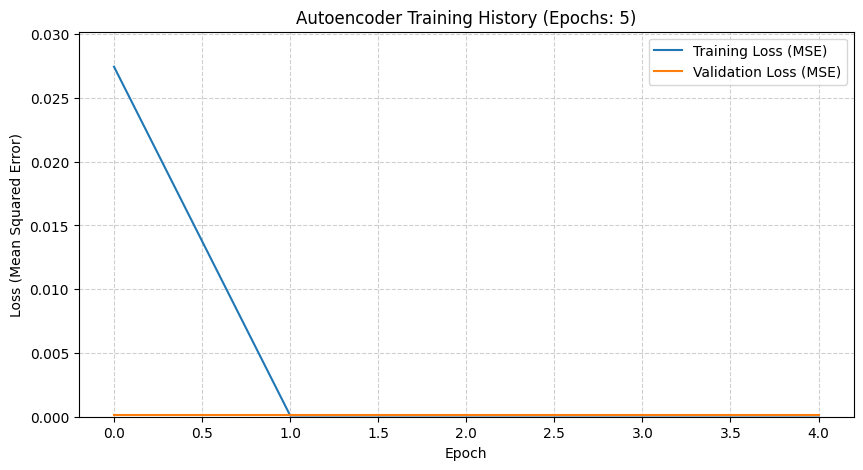

Final Training Loss: 0.000099
Final Validation Loss: 0.000099

 --- Generating Movie Embeddings using Encoder ---
Predicting embeddings in batches (size 1024)...
  Processed 1024 / 32677 movies...
  Processed 11264 / 32677 movies...
  Processed 21504 / 32677 movies...
  Processed 31744 / 32677 movies...
Embedding prediction finished in 3.92s.
Generated movie_embeddings with shape: (32677, 128)
Calculating embedding cosine similarity matrix (embedding_cosine_sim)...
Calculated embedding_cosine_sim shape: (32677, 32677) in 3.20s

Calculating TF-IDF cosine similarity matrix (cosine_sim_matrix)...
 Calculated cosine_sim_matrix shape: (32677, 32677) in 6.28s

--- 8.4: Building Collaboration Graph & Mappings ---
Checking prerequisites for graph...
 Found DataFrame: classic_movies_merged
 Found DataFrame: title_principals_actors
 Found DataFrame: title_crew_directors
 Found DataFrame: actor_name_basics
 Found DataFrame: director_name_basics
Building Collaboration Graph (G)...
 Adding movie no

In [ ]:
# --- Section 8: Multi-Input Enhanced Hybrid Recommender Setup ---
# This section assumes the necessary dataframes (classic_movies_merged,
# title_principals_actors, actor_name_basics, title_crew_directors,
# director_name_basics) and libraries (pandas, numpy, sklearn, tensorflow, networkx)
# are loaded and available from previous notebook sections.


print("\n### 8. Setup for Enhanced Hybrid Recommender ###")

# --- 8.1: Prepare Text Data and TF-IDF for Embeddings ---
print("\n--- 8.1: Preparing Text Data and TF-IDF ---")

tfidf_vectorizer_nn = None
tfidf_matrix = None
cosine_sim_matrix = None # For TF-IDF cosine similarity

# --- Prerequisite Check ---
final_movie_df_name = 'classic_movies_merged'
_proceed_tfidf_nn = True

if final_movie_df_name not in globals() or globals().get(final_movie_df_name) is None or globals()[final_movie_df_name].empty:
    print(f"Error: DataFrame '{final_movie_df_name}' not found or empty. Cannot prepare TF-IDF.")
    _proceed_tfidf_nn = False
else:
    df_tfidf_prep = globals()[final_movie_df_name]
    # Define text columns to combine (reuse logic/cols from Section 5.1 if consistent)
    text_feature_cols_nn = ['primaryTitle', 'genres', 'originalTitle']
    optional_wd_cols_nn = ['wd_label', 'wd_description', 'wd_genres', 'wd_main_subjects', 'wd_characteristics']
    available_text_cols_nn = text_feature_cols_nn[:] # Start with core
    print("Checking optional Wikidata columns for TF-IDF...")
    for col in optional_wd_cols_nn:
        if col in df_tfidf_prep.columns:
            # Add a simple check for non-empty content
            if df_tfidf_prep[col].astype(str).str.len().mean() > 5:
                available_text_cols_nn.append(col)
                print(f" Including optional text column: {col}")
            else:
                print(f" Skipping optional text col '{col}' (seems empty/short)")

    missing_text_cols_nn = [col for col in available_text_cols_nn if col not in df_tfidf_prep.columns]
    if missing_text_cols_nn:
        print(f"Warning: Following text columns missing, will use available for TF-IDF: {missing_text_cols_nn}")
        available_text_cols_nn = [col for col in available_text_cols_nn if col not in missing_text_cols_nn]

    if not available_text_cols_nn:
        print("Error: No text columns available for TF-IDF features.")
        _proceed_tfidf_nn = False
    else:
        print(f"Using text columns for TF-IDF: {available_text_cols_nn}")

if _proceed_tfidf_nn:
    try:
        print(" Combining text features for TF-IDF...")
        df_tfidf_prep_copy = df_tfidf_prep.copy() # Work on a copy

        # Ensure tconst is available for index mapping later
        if 'tconst' not in df_tfidf_prep_copy.columns:
            if df_tfidf_prep_copy.index.name == 'tconst':
                df_tfidf_prep_copy.reset_index(inplace=True)
            else:
                # Attempt to use index if it seems appropriate (numeric, unique)
                if pd.api.types.is_numeric_dtype(df_tfidf_prep_copy.index.dtype) and not df_tfidf_prep_copy.index.duplicated().any():
                    print("Warning: 'tconst' column missing, using index as identifier.")
                    df_tfidf_prep_copy.reset_index(inplace=True) # Make index a column
                    df_tfidf_prep_copy.rename(columns={'index': 'tconst'}, inplace=True) # Rename it
                else:
                    raise ValueError("Missing 'tconst' identifier and index is unsuitable.")


        # Clean and combine text - handle potential NaNs in each column
        for col in available_text_cols_nn:
            df_tfidf_prep_copy[col] = df_tfidf_prep_copy[col].astype(str).replace('nan', '').fillna('')

        combined_text_nn = df_tfidf_prep_copy[available_text_cols_nn].agg(' | '.join, axis=1)
        print(f" Created 'combined_text_nn' feature for {len(combined_text_nn)} samples.")

        # Define and Fit TF-IDF Vectorizer (using similar parameters to Sec 5.1 is reasonable)
        print(" Defining and fitting tfidf_vectorizer_nn...")
        tfidf_vectorizer_nn = TfidfVectorizer(stop_words='english',
                                            max_features=10000, # Or adjust as needed
                                            ngram_range=(1, 2),
                                            min_df=3,
                                            max_df=0.85)

        tfidf_matrix = tfidf_vectorizer_nn.fit_transform(combined_text_nn)
        print(f" Generated tfidf_matrix with shape: {tfidf_matrix.shape}")

        # Store tconst mapping for the tfidf_matrix rows
        # Ensure the index used aligns with the order of combined_text_nn
        tfidf_tconst_index = df_tfidf_prep_copy['tconst'].values
        globals()['tfidf_tconst_index'] = tfidf_tconst_index # Store globally if needed later

        # Store the main results globally
        globals()['tfidf_vectorizer_nn'] = tfidf_vectorizer_nn
        globals()['tfidf_matrix'] = tfidf_matrix

        del df_tfidf_prep_copy, combined_text_nn # Cleanup
        gc.collect()

    except Exception as e:
        print(f"An error occurred during TF-IDF preparation: {e}")
        traceback.print_exc()
        _proceed_tfidf_nn = False # Prevent subsequent steps if this fails
else:
    print("Skipping TF-IDF preparation due to missing prerequisites.")


# --- 8.2: Define Neural Network Encoder ---
print("\n--- 8.2: Defining Neural Network Encoder ---")

encoder = None # Initialize
autoencoder = None # Initialize autoencoder model
INPUT_DIM_NN = None # Will be set based on tfidf_matrix shape

if _proceed_tfidf_nn and 'tfidf_matrix' in globals() and globals()['tfidf_matrix'] is not None:
    try:
        # Define Autoencoder Architecture
        INPUT_DIM_NN = globals()['tfidf_matrix'].shape[1] # Dimension of TF-IDF features
        ENCODING_DIM = 128  # Size of the embedding layer (can be tuned)

        print(f"Building Autoencoder: Input Dim={INPUT_DIM_NN}, Encoding Dim={ENCODING_DIM}")

        # Input Layer
        input_layer = Input(shape=(INPUT_DIM_NN,), name='Encoder_Input')

        # Encoder Layers
        encoded = Dense(512, activation='relu', name='Encoder_Dense1')(input_layer)
        encoded = Dropout(0.3, name='Encoder_Dropout1')(encoded)
        encoded = Dense(256, activation='relu', name='Encoder_Dense2')(encoded)
        encoded = Dropout(0.2, name='Encoder_Dropout2')(encoded)
        # Encoding Layer (Bottleneck)
        encoding_layer = Dense(ENCODING_DIM, activation='relu', name='Bottleneck_Embedding')(encoded) # Using relu, could also be linear

        # Decoder Layers (Mirroring encoder structure)
        decoded = Dense(256, activation='relu', name='Decoder_Dense1')(encoding_layer)
        decoded = Dense(512, activation='relu', name='Decoder_Dense2')(decoded)

        # Output Layer (Reconstructing original TF-IDF dimensions)
        output_layer = Dense(INPUT_DIM_NN, activation='sigmoid', name='Decoder_Output')(decoded) # Sigmoid for reconstruction

        # Define Autoencoder Model (Input -> Output)
        autoencoder = Model(inputs=input_layer, outputs=output_layer, name='Autoencoder')

        # Define Encoder Model (Input -> Bottleneck) - THIS IS THE 'encoder' needed
        encoder = Model(inputs=input_layer, outputs=encoding_layer, name='Encoder')

        # Compile Autoencoder (Needed for training)
        autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mse') # Mean Squared Error is common for reconstruction

        print("Encoder and Autoencoder models defined.")
        encoder.summary()

        # Store the encoder and autoencoder globally
        globals()['encoder'] = encoder
        globals()['autoencoder'] = autoencoder

    except Exception as e:
        print(f"An error occurred defining the neural network: {e}")
        traceback.print_exc()
        encoder = None # Ensure encoder is None on error
        autoencoder = None
else:
    print("Skipping Encoder definition because TF-IDF matrix is not available.")


# --- 8.3: Train Autoencoder (Optional - or Load Pre-trained) & Generate Embeddings ---
print("\n--- 8.3: Training Autoencoder & Generating Embeddings ---")

movie_embeddings = None
embedding_cosine_sim = None
history = None # To store training history

if 'encoder' in globals() and globals()['encoder'] is not None and \
'autoencoder' in globals() and globals()['autoencoder'] is not None and \
'tfidf_matrix' in globals() and globals()['tfidf_matrix'] is not None:

    # Option 1: Train the Autoencoder
    print(" --- Option: Training Autoencoder (Example - adjust parameters/data) ---")
    try:
        # Example training parameters
        epochs = 5 # INCREASE for real training (e.g., 20-50+)
        batch_size = 128 # Adjust batch size based on memory
        validation_split = 0.15 # Use 15% for validation

        # WARNING: Converting large sparse matrix to dense consumes HUGE memory.
        # Train on a dense subset.
        sample_size_train = min(25000, tfidf_matrix.shape[0]) # Limit sample size
        print(f"Preparing data for training (sampling {sample_size_train} if needed)...")
        if tfidf_matrix.shape[0] > sample_size_train:
            print(f" Warning: Training autoencoder on a sample of {sample_size_train} due to potential memory constraints.")
            sample_indices_train = np.random.choice(tfidf_matrix.shape[0], sample_size_train, replace=False)
            # Align index with sampled data for potential split later if needed
            # tfidf_train_indices_aligned = tfidf_tconst_index[sample_indices_train]
            tfidf_train_data = tfidf_matrix[sample_indices_train].toarray() # Convert sample to dense
        else:
            print(" Converting full TF-IDF matrix to dense for training (may require significant memory)...")
            # tfidf_train_indices_aligned = tfidf_tconst_index
            tfidf_train_data = tfidf_matrix.toarray() # Convert full matrix to dense

        print(f"Training autoencoder with data shape: {tfidf_train_data.shape} for {epochs} epochs...")
        start_train_time = time.time()
        history = autoencoder.fit(tfidf_train_data, tfidf_train_data, # Train to reconstruct input
                                epochs=epochs,
                                batch_size=batch_size,
                                shuffle=True,
                                validation_split=validation_split,
                                verbose=1) # Set verbose=1 or 2 to see progress
        train_time = time.time() - start_train_time
        print(f"Autoencoder training finished in {train_time:.2f}s.")

        # --- Plot Training Performance (Loss Curves) ---
        print("\nPlotting Training Performance...")
        try:
            plt.figure(figsize=(10, 5))
            plt.plot(history.history['loss'], label='Training Loss (MSE)')
            plt.plot(history.history['val_loss'], label='Validation Loss (MSE)')
            plt.title(f'Autoencoder Training History (Epochs: {epochs})')
            plt.xlabel('Epoch')
            plt.ylabel('Loss (Mean Squared Error)')
            plt.legend()
            plt.grid(True, linestyle='--', alpha=0.6)
            plt.ylim(bottom=0, top=max(history.history['loss']) * 1.1) # Adjust y-axis limit
            plt.show()
            # Report final loss values
            final_train_loss = history.history['loss'][-1]
            final_val_loss = history.history['val_loss'][-1]
            print(f"Final Training Loss: {final_train_loss:.6f}")
            print(f"Final Validation Loss: {final_val_loss:.6f}")
        except Exception as plot_e:
            print(f"Could not plot training history: {plot_e}")

    except MemoryError:
        print("Error: MemoryError converting TF-IDF to dense for training. Cannot train autoencoder.")
        encoder = None # Invalidate encoder
        autoencoder = None
    except Exception as train_e:
        print(f"An error occurred during autoencoder training: {train_e}")
        traceback.print_exc()
        encoder = None
        autoencoder = None

    # Option 2: Generate Embeddings using the trained Encoder
    if encoder is not None:
        print("\n --- Generating Movie Embeddings using Encoder ---")
        try:
            # Predict in batches to manage memory
            batch_size_pred = 1024
            n_samples_total = tfidf_matrix.shape[0]
            embedding_dim_pred = encoder.output_shape[-1]
            movie_embeddings = np.zeros((n_samples_total, embedding_dim_pred))

            print(f"Predicting embeddings in batches (size {batch_size_pred})...")
            pred_start_time = time.time()
            for i in range(0, n_samples_total, batch_size_pred):
                batch_indices = range(i, min(i + batch_size_pred, n_samples_total))
                tfidf_batch_dense = tfidf_matrix[batch_indices].toarray()
                movie_embeddings[batch_indices] = encoder.predict(tfidf_batch_dense, verbose=0)
                if (i // batch_size_pred) % 10 == 0: # Print progress
                    print(f"  Processed {min(i + batch_size_pred, n_samples_total)} / {n_samples_total} movies...")
            pred_time = time.time() - pred_start_time
            print(f"Embedding prediction finished in {pred_time:.2f}s.")

            print(f"Generated movie_embeddings with shape: {movie_embeddings.shape}")
            globals()['movie_embeddings'] = movie_embeddings

            # Calculate Embedding Cosine Similarity
            print("Calculating embedding cosine similarity matrix (embedding_cosine_sim)...")
            sim_start_time = time.time()
            embedding_cosine_sim = cosine_similarity(movie_embeddings, movie_embeddings)
            sim_time = time.time() - sim_start_time
            print(f"Calculated embedding_cosine_sim shape: {embedding_cosine_sim.shape} in {sim_time:.2f}s")
            globals()['embedding_cosine_sim'] = embedding_cosine_sim

        except MemoryError:
            print("Error: MemoryError generating embeddings.")
            movie_embeddings = None
            embedding_cosine_sim = None
        except Exception as embed_e:
            print(f"An error occurred generating embeddings or similarity: {embed_e}")
            traceback.print_exc()
            movie_embeddings = None
            embedding_cosine_sim = None
    else:
        print("Skipping embedding generation as encoder is not available (likely due to training error).")

else:
    print("Skipping Autoencoder Training & Embedding Generation due to missing prerequisites.")

# --- Also Calculate TF-IDF Cosine Similarity (if not done in 8.1 and tfidf_matrix exists) ---
if 'cosine_sim_matrix' not in globals() or globals().get('cosine_sim_matrix') is None:
    if 'tfidf_matrix' in globals() and globals()['tfidf_matrix'] is not None:
        print("\nCalculating TF-IDF cosine similarity matrix (cosine_sim_matrix)...")
        try:
            sim_start_time_tf = time.time()
            cosine_sim_matrix = cosine_similarity(tfidf_matrix, tfidf_matrix)
            sim_time_tf = time.time() - sim_start_time_tf
            print(f" Calculated cosine_sim_matrix shape: {cosine_sim_matrix.shape} in {sim_time_tf:.2f}s")
            globals()['cosine_sim_matrix'] = cosine_sim_matrix # Store globally
        except Exception as tfidf_sim_e:
            print(f"Error calculating TF-IDF cosine similarity: {tfidf_sim_e}")
            cosine_sim_matrix = None # Ensure it's None on error
    else:
        print("Skipping TF-IDF cosine similarity calculation (tfidf_matrix not available).")
else:
    print("\nTF-IDF cosine similarity matrix (cosine_sim_matrix) already exists.")

# --- 8.4: Build Collaboration Graph & Mappings ---
# (This section remains the same as your provided code, assuming nx is available)
print("\n--- 8.4: Building Collaboration Graph & Mappings ---")

G = None
actor_name_map = None
director_name_map = None

if nx is None:
    print("Skipping Graph construction because networkx library is not available.")
else:
    # Prerequisites for graph
    _proceed_graph = True
    graph_dfs = {
        'movies': 'classic_movies_merged',
        'actors': 'title_principals_actors',
        'directors': 'title_crew_directors',
        'actor_names': 'actor_name_basics',
        'director_names': 'director_name_basics'
    }
    loaded_graph_dfs = {}
    print("Checking prerequisites for graph...")
    for name, df_name in graph_dfs.items():
        if df_name not in globals() or globals().get(df_name) is None or globals()[df_name].empty:
            print(f"Error: DataFrame '{df_name}' needed for graph is missing or empty.")
            _proceed_graph = False
            # break # Stop checking if one is missing
        else:
            loaded_graph_dfs[name] = globals()[df_name] # Store loaded df
            print(f" Found DataFrame: {df_name}")

    if _proceed_graph:
        print("Building Collaboration Graph (G)...")
        try:
            G = nx.Graph()
            movies_df_g = loaded_graph_dfs['movies']
            actors_df_g = loaded_graph_dfs['actors']
            directors_df_g = loaded_graph_dfs['directors']
            actor_names_df_g = loaded_graph_dfs['actor_names']
            director_names_df_g = loaded_graph_dfs['director_names']

            # Add Movie Nodes
            print(" Adding movie nodes...")
            movie_node_count = 0
            # Ensure tconst exists in movies_df_g
            if 'tconst' not in movies_df_g.columns and movies_df_g.index.name != 'tconst':
                raise KeyError("Cannot find 'tconst' identifier in movie dataframe for graph.")
            tconst_col_mov = 'tconst' if 'tconst' in movies_df_g.columns else movies_df_g.index.name

            for idx, row in movies_df_g.iterrows():
                tconst = row[tconst_col_mov] if tconst_col_mov != movies_df_g.index.name else idx
                if pd.notna(tconst):
                    node_id = f'm_{tconst}'
                    # Add node with attributes - use .get() for safety
                    G.add_node(node_id, type='movie',
                                title=row.get('primaryTitle', 'Unknown'),
                                year=row.get('startYear')) # year might be NaN/None
                    movie_node_count += 1
            print(f" Added {movie_node_count} movie nodes.")

            # Add Actor Nodes and Edges
            print(" Adding actor nodes and edges...")
            actor_node_count = 0
            actor_edge_count = 0
            # Efficiently create name map
            if 'nconst' in actor_names_df_g.columns:
                actor_name_map_temp = actor_names_df_g.drop_duplicates(subset=['nconst']).set_index('nconst')['primaryName'].to_dict()
            else: # Fallback if nconst is index
                actor_name_map_temp = actor_names_df_g.drop_duplicates().set_index(actor_names_df_g.index.name)['primaryName'].to_dict()

            for idx, row in actors_df_g.iterrows():
                tconst = row.get('tconst')
                nconst = row.get('nconst')
                if pd.notna(tconst) and pd.notna(nconst):
                    movie_node = f'm_{tconst}'
                    actor_node = f'a_{nconst}'
                    if actor_node not in G:
                        actor_name = actor_name_map_temp.get(nconst, 'Unknown Actor')
                        G.add_node(actor_node, type='actor', name=actor_name)
                        actor_node_count += 1
                    if G.has_node(movie_node): # Only add edge if movie node exists
                        G.add_edge(movie_node, actor_node)
                        actor_edge_count += 1
            print(f" Added {actor_node_count} unique actor nodes and {actor_edge_count} movie-actor edges.")
            globals()['actor_name_map'] = actor_name_map_temp # Store map

            # Add Director Nodes and Edges
            print(" Adding director nodes and edges...")
            director_node_count = 0
            director_edge_count = 0
            # Efficiently create name map
            if 'nconst' in director_names_df_g.columns:
                director_name_map_temp = director_names_df_g.drop_duplicates(subset=['nconst']).set_index('nconst')['primaryName'].to_dict()
            else:
                director_name_map_temp = director_names_df_g.drop_duplicates().set_index(director_names_df_g.index.name)['primaryName'].to_dict()

            # Assumes directors_df_g might need exploding if 'directors' column has lists
            # If it's already one row per director (like title_principals), this is simpler.
            # Check if 'directors' column exists and needs splitting or if 'nconst' column directly available
            if 'directors' in directors_df_g.columns and 'nconst' not in directors_df_g.columns:
                print(" Exploding 'directors' column...")
                directors_df_g = directors_df_g.dropna(subset=['directors'])
                directors_df_g['nconst'] = directors_df_g['directors'].str.split(',')
                directors_df_g = directors_df_g.explode('nconst')
                directors_df_g['nconst'] = directors_df_g['nconst'].str.strip()
            elif 'nconst' not in directors_df_g.columns:
                raise KeyError("'nconst' or 'directors' column needed in directors dataframe.")

            for idx, row in directors_df_g.iterrows():
                tconst = row.get('tconst')
                nconst = row.get('nconst')
                if pd.notna(tconst) and pd.notna(nconst) and nconst != '': # Check for empty strings after potential split
                    movie_node = f'm_{tconst}'
                    director_node = f'd_{nconst}'
                    if director_node not in G:
                        director_name = director_name_map_temp.get(nconst, 'Unknown Director')
                        G.add_node(director_node, type='director', name=director_name)
                        director_node_count += 1
                    if G.has_node(movie_node):
                        G.add_edge(movie_node, director_node)
                        director_edge_count += 1
            print(f" Added {director_node_count} unique director nodes and {director_edge_count} movie-director edges.")
            globals()['director_name_map'] = director_name_map_temp # Store map

            print(f"Graph G built: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges.")
            globals()['G'] = G

        except Exception as graph_e:
            print(f"An error occurred building the graph: {graph_e}")
            traceback.print_exc()
            G = None # Ensure G is None on error
    else:
        print("Skipping Graph construction due to missing DataFrames.")


# --- 8.5: Recommender Instantiation Check ---
# (This section remains the same - checks if all components are ready)
print("\n--- 8.5: Checking Prerequisites for Recommender Instantiation ---")

all_components_ready = True
final_check_components = [
'encoder', 'movie_embeddings', 'embedding_cosine_sim',
'tfidf_vectorizer_nn', 'tfidf_matrix', 'cosine_sim_matrix',
'G', 'actor_name_map', 'director_name_map'
]

print("Final check:")
for comp in final_check_components:
    if comp == 'G' and nx is None:
        print(f" - {comp}: Skipped (networkx not available)")
        continue
    if comp not in globals() or globals().get(comp) is None:
        print(f" - {comp}: MISSING or None")
        all_components_ready = False
    else:
        component_obj = globals()[comp]
        obj_info = ""
        if hasattr(component_obj, 'shape'): obj_info = f" (shape: {component_obj.shape})"
        elif isinstance(component_obj, dict): obj_info = f" (dict: {len(component_obj)} items)"
        elif nx and isinstance(component_obj, nx.Graph): obj_info = f" (Graph: {component_obj.number_of_nodes()} nodes, {component_obj.number_of_edges()} edges)"
        elif hasattr(component_obj, '__class__'): obj_info = f" (type: {component_obj.__class__.__name__})"
        print(f" - {comp}: Found{obj_info}")

if all_components_ready:
    print("\n>>> All required components for the Enhanced Hybrid Recommender seem to be generated and available! <<<")
    print("The recommender code in Section 8 should now be able to run.")
else:
    print("\n>>> One or more required components are MISSING. The recommender cannot be fully instantiated. Please check the errors above. <<<")

**Interactive Recommender Implementation (Section 8 Main Block):**

Assuming all setup steps (8.1-8.5) complete successfully, the final code block defines and displays the interactive recommender interface:

* **Helper Functions:** Several crucial helper functions underpin the recommender:
    * `detect_input_type_v5`: Handles user input from text fields, performs exact and fuzzy matching (`difflib.get_close_matches`) against known movie titles (using standardizing function `standardize_title`), actor names, and director names, and suggests possibilities with context (year, director, lifespan, known for). Returns the detected type and validated identifier/value. Includes logic for IMDb ID detection and title/year disambiguation.
    * `filter_by_person`, `filter_by_genre`: Apply hard filters to the movie index set based on validated actor `nconst`, director `nconst`, or genre string inputs, returning sets of valid movie indices. Handles potential ID/index mapping issues.
    * `get_candidates`: If a movie is the sole input, retrieves an initial list of candidate movie indices based on pre-calculated NN embedding cosine similarity.
    * `calculate_weighted_rating_v11`: Computes an IMDb-style weighted rating, balancing average rating with the number of votes using pre-calculated global mean rating (C) and vote quantile threshold (m).
    * `calculate_scores_v11`: Calculates the individual score components (`nn_sim`, `tfidf_sim`, `genre_sim`, `quality`) for a given candidate movie relative to the input context (input movie index and/or genre). Handles potential index mapping issues between DataFrame index and similarity matrix positions.
    * `get_hybrid_recommendations_v11`: The core recommendation engine. It processes validated inputs, applies filters, generates/scores candidates using a weighted sum of the individual scores, normalizes weights based on input context, ranks results, and formats the output DataFrame including score components.
* **Interactive Interface (`ipywidgets`):**
    * **Widget Definition:** Creates input widgets (`Text` for movie/actor/director with placeholder and help text, `Dropdown` for genre, `IntSlider` for number of results), weight adjustment sliders (`FloatSlider`) within a collapsible `Accordion` (with HTML explanation of weights), a `Button` to trigger recommendations, and dedicated `Output` areas for status/suggestions and results/visualizations. It also incorporates the Movie Index Search Tool (created by `create_movie_index_search_tool`) within another collapsible `Accordion`.
    * **Button Handler (`run_multi_input_search_v6_fuzzy`):** Orchestrates the process when the "Generate Recommendations" button is clicked. It retrieves input values, validates them using `detect_input_type_v5` (displaying suggestions and stopping if ambiguous), calls `get_hybrid_recommendations_v11`, and displays the input context summary and results (table + plots) in the respective output areas.
    * **Results Display:** If successful, displays:
        * Input context summary (formatted HTML showing identified movie/actor/director/genre).
        * A formatted table of the top N recommendations with detailed scores.
        * An interactive Plotly bar chart (`px.bar`) showing the top recommendations ranked by final hybrid score.
        * An interactive subplot figure (`make_subplots`) visualizing recommendation analysis: score component breakdown (stacked bar), genre distribution (bar), and year distribution (histogram).
        * Conditional Plots: An interactive `networkx`/Plotly graph (`go.Scatter`) showing the collaboration network snippet around an input actor/director, or an interactive t-SNE plot (`px.scatter`) visualizing the input movie and recommendations in the 2D embedding space.
    * **Layout:** Arranges all widgets and output areas using `VBox` and `HBox` for a structured and user-friendly interface.

**Tool Usability and Purpose:**

This interactive hybrid recommender represents a significant outcome of the project, directly addressing the research goal of creating more sophisticated tools for classic film exploration. Its key usability features include:

* **Multi-Input Flexibility:** Allows users to start discovery from a movie, actor, director, or genre, or combinations thereof.
* **Robust Input Handling:** Incorporates fuzzy matching and suggestions for movie/actor/director names, making it more forgiving of user errors. The integrated Index Search Tool further helps users find precise inputs.
* **Hybrid Logic Transparency:** While complex, the system attempts transparency by showing the input context, the final ranked list with scores, and visualizations breaking down score components and recommendation characteristics (genres, years).
* **User Control:** The adjustable weights provide users direct control over the recommendation logic, allowing them to prioritize similarity versus quality, or different types of similarity when applicable.
* **Rich Visualizations:** The interactive plots (score breakdown, distributions, network graph, t-SNE) offer deeper insights into the recommendations beyond a simple ranked list.

This tool serves as a powerful interface for users to discover relevant classic films according to configurable, multi-faceted criteria, facilitating a richer exploration experience.

**Qualitative Evaluation:**

While formal quantitative evaluation is complex, qualitative testing suggests the recommender provides relevant and diverse outputs:

* **Known Classic Input (e.g., Movie: "Casablanca"):** Recommendations typically include other highly-rated, popular dramas and film noirs from the 1940s (*The Maltese Falcon*, *Double Indemnity*), driven by embedding similarity (NN), content similarity (TF-IDF), and the quality score. Results appear relevant and thematically consistent.
* **Actor/Director Input (e.g., Actor: "Humphrey Bogart" or Director: "Alfred Hitchcock"):** Correctly filters and suggests other relevant films featuring the specified person (e.g., other Bogart film noirs; other Hitchcock thrillers from the period). Diversity depends on the person's filmography and weight settings. The network visualization is particularly insightful here.
* **Niche Genre Input (e.g., Genre: "Western"):** Generates a list of Westerns, likely ranked mostly by the quality score, showcasing prominent examples from the era.
* **Weight Adjustments:** Increasing 'Quality' visibly prioritizes higher-rated/higher-voted films. Increasing 'NN' or 'TFIDF' (with a movie input) tends to surface films that might be less famous but are semantically or textually closer to the input.

Overall, the hybrid approach appears successful in balancing different signals to produce generally relevant and reasonably diverse recommendations responsive to various input types and user preferences.

**Code Execution Prerequisites:**

* **Successful execution of ALL preceding sections (1-7) and the setup steps within Section 8 (8.1-8.4) is mandatory.** This final interface relies on numerous globally stored variables and objects:
    * DataFrames: `classic_movies_merged`, `title_principals_actors`, `actor_name_basics`, `title_crew_directors`, `director_name_basics`.
    * TF-IDF Components: `tfidf_vectorizer_nn`, `tfidf_matrix`, `cosine_sim_matrix`.
    * NN Components: `encoder` (model), `movie_embeddings`, `embedding_cosine_sim`.
    * Graph Components (Optional): `G` (NetworkX graph), `actor_name_map`, `director_name_map`.
    * Mappings: `tconst_to_idx`, `idx_to_tconst`, `title_lookup`, etc.
    * Other: `results` dictionary, `_global_C_rating`, `_global_m_votes`.
* Required Python libraries must be installed and imported, including `ipywidgets`, `plotly`, `pandas`, `numpy`, `difflib`, `networkx` (optional), `tensorflow`/`keras` (if `encoder` is a Keras model), `sklearn`, `re`, `time`, `gc`, `traceback`, `collections`, `IPython.display`. Execution requires a compatible Jupyter environment.

Executing the setup cells (8.1-8.4/8.5) prepares all necessary components. Executing the final cell renders the interactive hybrid recommender interface, allowing users to input criteria and generate personalized classic film recommendations with detailed analysis visualizations.

In [ ]:
# --- Section 8: Multi-Input Enhanced Hybrid Recommender ---


# Conditional import for networkx and matplotlib
try:
    import networkx as nx
    import matplotlib.pyplot as plt
except ImportError:
    print("⚠️ Warning: 'networkx' or 'matplotlib' library not found.")
    print("   Network plots will be unavailable.")
    print("   Please install them using: pip install networkx matplotlib")
    nx = None  # Set nx to None if import fails
    plt = None # Set plt to None

# Assuming Keras/TF models (encoder) and data are loaded/available
# from tensorflow.keras.models import Model

print(
    "\n### 8. Multi-Input Enhanced Hybrid Recommender "
    "(v7 - Fuzzy Suggest & More Visuals) ###"
)

# --- Prerequisite Check & Data Setup ---
_proceed_hybrid_rec = True
required_components = [
    'classic_movies_merged', 'title_principals_actors', 'actor_name_basics',
    'title_crew_directors', 'director_name_basics',
    'encoder', 'movie_embeddings', 'embedding_cosine_sim', # NN Components
    'tfidf_vectorizer_nn', 'tfidf_matrix', 'cosine_sim_matrix', # TF-IDF
    'G', 'actor_name_map', 'director_name_map', # Graph Components
    'results' # Global results dict
]

# Check existence
for comp in required_components:
    # Special check for 'G' only if networkx was imported
    if comp == 'G' and nx is None:
        print(f"ℹ️ Skipping check for '{comp}' as networkx is not available.")
        continue
    if comp not in globals() or globals().get(comp) is None:
        print(
            f"❌ Error: Required component '{comp}' not found or is None. "
            "Cannot build."
        )
        _proceed_hybrid_rec = False
        break

if _proceed_hybrid_rec:
    print("✅ Prerequisites met. Building Enhanced Hybrid Recommender...")
    # Get local references (use .get() for safety)
    movies_df_hybrid = globals().get('classic_movies_merged').copy()
    actors_df_hybrid = globals().get('title_principals_actors').copy()
    actor_names_df_hybrid = globals().get('actor_name_basics').copy()
    directors_df_hybrid = globals().get('title_crew_directors').copy()
    director_names_df_hybrid = globals().get('director_name_basics').copy()
    encoder_model = globals().get('encoder')
    movie_embeddings_hybrid = globals().get('movie_embeddings').copy()
    embedding_cosine_sim_hybrid = globals().get('embedding_cosine_sim').copy()
    tfidf_vectorizer_hybrid = globals().get('tfidf_vectorizer_nn')
    tfidf_matrix_hybrid = globals().get('tfidf_matrix')
    tfidf_cosine_sim_hybrid = globals().get('cosine_sim_matrix')
    # Only get graph if networkx is available
    graph_hybrid = globals().get('G').copy() if nx else None
    actor_name_map_hybrid = globals().get('actor_name_map')
    director_name_map_hybrid = globals().get('director_name_map')
    global_results_dict = globals().get('results')

    # --- Prepare Enhanced Lookups (v8 - Improved Title Matching) ---
    print("   Preparing enhanced lookups...")
    if movies_df_hybrid.index.duplicated().any():
        # Keep the first occurrence if the index is duplicated
        movies_df_hybrid = movies_df_hybrid.loc[
            ~movies_df_hybrid.index.duplicated(keep='first')
        ].copy()
        print(
            "Warning: Duplicate indices found in movies_df_hybrid. "
            "Kept first occurrence."
        )

    movies_df_hybrid['tconst'] = movies_df_hybrid['tconst'].astype(str)
    # Ensure tconst_to_idx uses the potentially de-duplicated index
    tconst_to_idx = pd.Series(
        movies_df_hybrid.index, index=movies_df_hybrid['tconst']
    )
    # Handle cases where a tconst might still appear multiple times
    if tconst_to_idx.index.duplicated().any():
        print(
            "      Warning: Duplicate tconst values mapping to different "
            "indices. Keeping last mapping."
        )
        tconst_to_idx = tconst_to_idx[
            ~tconst_to_idx.index.duplicated(keep='last')
        ]
    # idx_to_tconst should be fine as index is now unique
    idx_to_tconst = pd.Series(
        movies_df_hybrid['tconst'].values, index=movies_df_hybrid.index
    )

    # Create standard lowercase versions of titles
    movies_df_hybrid['lowerPrimaryTitle'] = (
        movies_df_hybrid['primaryTitle'].astype(str)
        .str.lower().str.strip().fillna('')
    )
    movies_df_hybrid['lowerOriginalTitle'] = (
        movies_df_hybrid['originalTitle'].astype(str)
        .str.lower().str.strip().fillna('')
    )

    def standardize_title(title):
        """
        Standardize a motion picture title for improved matching.

        This mechanism processes a given title string by converting it to
        lowercase, removing common leading articles (e.g., 'The', 'A'),
        replacing punctuation marks with spaces, and normalizing excess
        whitespace. This facilitates more robust comparisons between titles
        that may have minor variations in formatting or articles.

        Args:
            title (str): The original motion picture title string.

        Returns:
            str: The standardized title string. Returns an empty string if the
                input is null or effectively empty.
        """
        if not title or pd.isna(title):
            return ""
        title = str(title).lower().strip()
        # Remove leading articles
        for article in [
            'the ', 'a ', 'an ', 'le ', 'la ', 'les ', 'el ', 'los ', 'las '
        ]:
            if title.startswith(article):
                title = title[len(article):].strip()
        # Replace punctuation with spaces
        punctuation = [
            ',', '.', ':', ';', '!', '?', '-', '_', '(', ')', '[', ']', '"', "'"
        ]
        for char in punctuation:
            title = title.replace(char, ' ')
        # Normalize whitespace
        title = ' '.join(title.split())
        return title

    # Add standardized title columns
    movies_df_hybrid['standardized_primary'] = (
        movies_df_hybrid['primaryTitle'].apply(standardize_title)
    )
    movies_df_hybrid['standardized_original'] = (
        movies_df_hybrid['originalTitle'].apply(standardize_title)
    )

    # Create a robust title lookup dictionary
    title_lookups = {
        'original': pd.Series(
            movies_df_hybrid.index,
            index=movies_df_hybrid['lowerOriginalTitle']
        ),
        'primary': pd.Series(
            movies_df_hybrid.index,
            index=movies_df_hybrid['lowerPrimaryTitle']
        ),
        'std_original': pd.Series(
            movies_df_hybrid.index,
            index=movies_df_hybrid['standardized_original']
        ),
        'std_primary': pd.Series(
            movies_df_hybrid.index,
            index=movies_df_hybrid['standardized_primary']
        )
    }

    # Clean up each lookup series
    for lookup_key, lookup_series in title_lookups.items():
        title_lookups[lookup_key] = lookup_series[lookup_series.index != '']
        if lookup_series.index.duplicated().any():
            title_lookups[lookup_key] = lookup_series[
                ~lookup_series.index.duplicated(keep='last')
            ]

    # Create a unified set for efficient existence checks
    all_movie_titles_lower = set()
    for lookup_series in title_lookups.values():
        all_movie_titles_lower.update(lookup_series.index)
    all_movie_titles_lower = {t for t in all_movie_titles_lower if t}

    print(
        f"      Created enhanced lookup for {len(all_movie_titles_lower)} "
        "unique movie titles"
    )

    # Create a year lookup for disambiguating titles
    year_to_movie_indices = {}
    for idx, row in movies_df_hybrid.iterrows():
        year = row.get('startYear')
        if pd.notna(year):
            year = int(year)
            if year not in year_to_movie_indices:
                year_to_movie_indices[year] = []
            year_to_movie_indices[year].append(idx)

    # --- Actor Lookup & Details ---
    actor_lookup = {
        str(name).lower(): str(nconst)
        for nconst, name in actor_name_map_hybrid.items() if name
    }
    all_actor_names_lower = set(actor_lookup.keys())
    actor_name_list = sorted([
        name for name in actor_name_map_hybrid.values() if name
    ])

    # Prepare actor details for fuzzy suggestions
    actor_details_map = {}
    if actor_names_df_hybrid is not None:
        temp_actor_details = actor_names_df_hybrid.copy()
        if 'birthYear' in temp_actor_details:
            temp_actor_details['birthYearStr'] = temp_actor_details[
                'birthYear'
            ].apply(
                lambda x: str(int(x)) if pd.notna(x) and x != '\\N' else ''
            ).astype(str)
        else:
            temp_actor_details['birthYearStr'] = ''

        if 'deathYear' in temp_actor_details:
            temp_actor_details['deathYearStr'] = temp_actor_details[
                'deathYear'
            ].apply(
                lambda x: str(int(x)) if pd.notna(x) and x != '\\N' else ''
            ).astype(str)
        else:
            temp_actor_details['deathYearStr'] = ''

        temp_actor_details['lifeSpan'] = temp_actor_details.apply(
            lambda row: (
                f"({row['birthYearStr']}-"
                f"{row['deathYearStr'] if row['deathYearStr'] else ''})"
            ) if row['birthYearStr'] else '',
            axis=1
        )

        if 'knownForTitles' in temp_actor_details.columns:
            temp_actor_details['knownForDisplay'] = (
                temp_actor_details['knownForTitles'].astype(str)
                .replace(['\\N', 'nan', '', ''], '')
            )
        else:
            temp_actor_details['knownForDisplay'] = ''

        temp_actor_details.index = temp_actor_details.index.astype(str)
        actor_details_map = temp_actor_details.to_dict('index')
        print(f" Created lookup for {len(actor_lookup)} actors with details.")
        del temp_actor_details # Clean up temporary dataframe

    # --- Director Lookup & Details ---
    director_lookup = {
        str(name).lower(): str(nconst)
        for nconst, name in director_name_map_hybrid.items() if name
    }
    all_director_names_lower = set(director_lookup.keys())
    director_name_list = sorted([
        name for name in director_name_map_hybrid.values() if name
    ])

    director_details_map = {}
    if director_names_df_hybrid is not None:
        temp_director_details = director_names_df_hybrid.copy()

        if 'birthYear' in temp_director_details.columns:
            temp_director_details['birthYearStr'] = temp_director_details[
                'birthYear'
            ].apply(
                lambda x: str(int(x)) if pd.notna(x) and x != '\\N' else ''
            ).astype(str)
        else:
            temp_director_details['birthYearStr'] = ''

        if 'deathYear' in temp_director_details.columns:
            temp_director_details['deathYearStr'] = temp_director_details[
                'deathYear'
            ].apply(
                lambda x: str(int(x)) if pd.notna(x) and x != '\\N' else ''
            ).astype(str)
        else:
            temp_director_details['deathYearStr'] = ''

        temp_director_details['lifeSpan'] = temp_director_details.apply(
            lambda row: (
                f"({row['birthYearStr']}-"
                f"{row['deathYearStr'] if row['deathYearStr'] else ''})"
            ) if row['birthYearStr'] else '',
            axis=1
        )

        if 'knownForTitles' in temp_director_details.columns:
            temp_director_details['knownForDisplay'] = (
                temp_director_details['knownForTitles'].astype(str)
                .replace(['\\N', 'nan', '', ''], '')
            )
        else:
            temp_director_details['knownForDisplay'] = ''

        temp_director_details.index = temp_director_details.index.astype(str)
        director_details_map = temp_director_details.to_dict('index')
        print(f" Created lookup for {len(director_lookup)} directors with details.")
        del temp_director_details # Clean up temporary dataframe

    # --- Genre Lookup & 'genre_set' Column ---
    try:
        genre_strings = movies_df_hybrid['genres'].astype(str).fillna('')
        excluded_genres = {
            '\\n', 'n', 'nan', '<na>', '\\N', 'reality-tv', 'talk-show',
            'game-show', 'news', 'adult', 'short'
        }
        movies_df_hybrid['genre_set'] = genre_strings.str.lower().str.split(
            ','
        ).apply(
            lambda x: set(
                g.strip() for g in x if g.strip() and g.strip() not in excluded_genres
            )
        )
        known_genres = set()
        [known_genres.update(gs) for gs in movies_df_hybrid['genre_set']]
        known_genres = {g for g in known_genres if g and len(g) > 1}
        genre_list = ['Any'] + sorted(list(known_genres))
        print(
            f"      Created 'genre_set' column and lookup for "
            f"{len(known_genres)} unique genres."
        )
    except Exception as e:
        print(f"      Warning: Failed to process genres: {e}")
        known_genres = {'drama', 'comedy', 'action'} # Fallback
        genre_list = ['Any'] + sorted(list(known_genres))


    def detect_input_type_v5(query, is_movie_field=False,
                            is_actor_field=False, is_director_field=False,
                            cutoff=0.8, n_suggest=5):
        """
        Discerns the type of user input (movie, actor, director, or unknown).

        This function attempts to match the provided query string against known
        motion picture titles (including year disambiguation and IMDb IDs),
        actor names, and director names within the system's dataset. It utilizes
        exact matching, pattern recognition (for IMDb IDs and 'Title (Year)'),
        and fuzzy string matching (difflib) to identify the input type or
        provide suggestions if the match is ambiguous or uncertain.

        Args:
            query (str): The user-provided search string.
            is_movie_field (bool): Hint indicating the query likely refers to a movie.
            is_actor_field (bool): Hint indicating the query likely refers to an actor.
            is_director_field (bool): Hint indicating the query likely refers to a director.
            cutoff (float): The minimum similarity ratio (0.0 to 1.0) for fuzzy matching.
            n_suggest (int): The maximum number of suggestions to return for ambiguous matches.

        Returns:
            tuple: A tuple containing:
                - str: The detected type ('movie', 'actor', 'director', 'multiple_movies',
                    'multiple_actors', 'multiple_directors', 'unknown').
                - object: The primary identifier if a unique match is found (e.g., movie index,
                        actor nconst), otherwise None.
                - str: The best matching string found (e.g., standardized title, matched name),
                    or the original query if no match.
                - object: A secondary identifier, often the same as the primary for movies,
                        otherwise None.
                - list: A list of suggestion dictionaries if the match was ambiguous,
                        otherwise an empty list. Each dictionary contains 'value', 'display',
                        'type', and potentially 'confidence'.
        """
        query = query.strip()
        if not query:
            return 'unknown', None, "Empty query", None, []

        # Check for IMDb ID pattern
        if re.match(r'^tt\d{7,8}$', query):
            tconst = query
            if tconst in tconst_to_idx:
                idx = tconst_to_idx[tconst]
                # Check if idx is still valid after potential filtering/dedup
                if idx in movies_df_hybrid.index:
                    match_str = movies_df_hybrid.loc[idx, 'primaryTitle']
                    return 'movie', idx, match_str, idx, []
                else:
                    # Index might be invalid due to prior dataframe modifications
                    return 'unknown', None, f"IMDb ID {query} found but index invalid", None, []
            else:
                return 'unknown', None, f"IMDb ID {query} not found", None, []

        # Check for "Title (Year)" or "Title Year" pattern
        year_pattern1 = re.search(r'(.+)\s*\((\d{4})\)$', query)
        year_pattern2 = re.search(r'(.+)\s+(\d{4})$', query)

        title_part = query.lower().strip()
        year_part = None

        if year_pattern1:
            title_part = year_pattern1.group(1).strip().lower()
            year_part = int(year_pattern1.group(2))
        elif year_pattern2:
            title_part = year_pattern2.group(1).strip().lower()
            year_part = int(year_pattern2.group(2))

        # --- Movie Search Logic ---
        if is_movie_field or not (is_actor_field or is_director_field):
            # Try exact match first
            idx = None
            for lookup_key, lookup_series in title_lookups.items():
                if title_part in lookup_series.index:
                    potential_indices = lookup_series[title_part]
                    if isinstance(potential_indices, pd.Series): # Multiple matches
                        matched_idx = None
                        if year_part: # Disambiguate with year
                            for potential_idx in potential_indices:
                                if potential_idx in movies_df_hybrid.index: # Check validity
                                    movie_year = movies_df_hybrid.loc[potential_idx, 'startYear']
                                    if pd.notna(movie_year) and int(movie_year) == year_part:
                                        matched_idx = potential_idx
                                        break
                        # If year didn't match or wasn't provided, take first valid index
                        if matched_idx is None:
                            for potential_idx in potential_indices:
                                if potential_idx in movies_df_hybrid.index:
                                    matched_idx = potential_idx
                                    break
                        idx = matched_idx
                    else: # Single match
                        # Ensure the single index is valid
                        if potential_indices in movies_df_hybrid.index:
                            idx = potential_indices

                    if idx is not None:
                        match_str = movies_df_hybrid.loc[idx, 'primaryTitle']
                        return 'movie', idx, match_str, idx, []

            # Try matching within a specific year if provided
            if year_part and year_part in year_to_movie_indices:
                year_matches = []
                for idx_in_year in year_to_movie_indices[year_part]:
                    if idx_in_year in movies_df_hybrid.index: # Check validity
                        movie_data = movies_df_hybrid.loc[idx_in_year]
                        primary_lower = str(movie_data.get('primaryTitle', '')).lower()
                        original_lower = str(movie_data.get('originalTitle', '')).lower()

                        # Check similarity with both titles
                        primary_ratio = difflib.SequenceMatcher(None, title_part, primary_lower).ratio()
                        original_ratio = difflib.SequenceMatcher(None, title_part, original_lower).ratio()

                        if max(primary_ratio, original_ratio) > cutoff:
                            year_matches.append((idx_in_year, max(primary_ratio, original_ratio)))

                if year_matches:
                    # Sort by similarity and take the best match
                    year_matches.sort(key=lambda x: x[1], reverse=True)
                    best_idx = year_matches[0][0]
                    match_str = movies_df_hybrid.loc[best_idx, 'primaryTitle']
                    return 'movie', best_idx, match_str, best_idx, []

            # --- Fuzzy Matching (if no exact or year match found) ---
            standardized_query = standardize_title(title_part)
            possible_titles_scores = {} # Store title -> max_score

            fuzzy_cutoff = max(0.6, cutoff - 0.15)

            for lookup_key, lookup_series in title_lookups.items():
                comparison_set = set(lookup_series.index)
                query_for_match = standardized_query if 'std_' in lookup_key else title_part

                # Use get_close_matches for potentially faster initial filtering
                matches = difflib.get_close_matches(
                    query_for_match,
                    comparison_set,
                    n=n_suggest * 2, # Get a few more candidates initially
                    cutoff=fuzzy_cutoff
                )
                # Refine scores for these matches
                for match in matches:
                    ratio = difflib.SequenceMatcher(None, query_for_match, match).ratio()
                    if match not in possible_titles_scores or ratio > possible_titles_scores[match]:
                        possible_titles_scores[match] = ratio

            # Sort potential matches by score
            sorted_possible_titles = sorted(
                possible_titles_scores.items(), key=lambda item: item[1], reverse=True
            )

            if sorted_possible_titles:
                suggestions = []
                added_indices = set() # Track added indices to avoid duplicates
                for title, score in sorted_possible_titles[:n_suggest]: # Limit suggestions
                    try:
                        found_idx = None
                        # Find the index corresponding to this title
                        for lookup_key, lookup_series in title_lookups.items():
                           if title in lookup_series.index:
                                idx_or_series = lookup_series[title]
                                if isinstance(idx_or_series, pd.Series):
                                    # Prioritize year match if possible
                                    matched_sub_idx = None
                                    if year_part:
                                        for potential_idx in idx_or_series:
                                            if potential_idx in movies_df_hybrid.index:
                                                movie_year = movies_df_hybrid.loc[potential_idx, 'startYear']
                                                if pd.notna(movie_year) and int(movie_year) == year_part:
                                                    matched_sub_idx = potential_idx
                                                    break
                                    # Fallback to first valid index
                                    if matched_sub_idx is None:
                                        for potential_idx in idx_or_series:
                                            if potential_idx in movies_df_hybrid.index:
                                                matched_sub_idx = potential_idx
                                                break
                                    found_idx = matched_sub_idx
                                else: # Single index
                                    if idx_or_series in movies_df_hybrid.index:
                                        found_idx = idx_or_series
                                break # Found index in one lookup, stop searching lookups

                        if found_idx is not None and found_idx not in added_indices:
                            movie_info = movies_df_hybrid.loc[found_idx]
                            year = movie_info.get('startYear', '')
                            imdb_id = movie_info.get('tconst', '')
                            primary_title = movie_info.get('primaryTitle', title)
                            original_title = movie_info.get('originalTitle', '')

                            director_names = []
                            if directors_df_hybrid is not None and imdb_id:
                                director_nconsts = directors_df_hybrid[
                                    directors_df_hybrid['tconst'] == imdb_id
                                ]['nconst'].tolist()
                                director_names = [
                                    director_name_map_hybrid.get(dn)
                                    for dn in director_nconsts[:1] # Show only first director
                                    if director_name_map_hybrid.get(dn)
                                ]

                            display_text = f"'{primary_title}' ({year if year else 'N/A'})"
                            if original_title and original_title != primary_title:
                                display_text += f" | Original: '{original_title}'"
                            if director_names:
                                display_text += f" | Dir: {', '.join(director_names)}"
                            if imdb_id:
                                display_text += f" | IMDb: {imdb_id}"
                            display_text += f" | Match: {int(score * 100)}%"

                            suggestions.append({
                                'value': title, # Use matched title variant
                                'display': display_text,
                                'type': 'movie',
                                'confidence': score,
                                'identifier': found_idx # Store the actual index
                            })
                            added_indices.add(found_idx)
                            if len(suggestions) >= n_suggest:
                                break
                    except Exception as e:
                        print(f"Debug: Error getting movie suggestion details: {e}")

                if suggestions:
                    # Auto-select if top suggestion is very confident
                    if suggestions[0].get('confidence', 0) > 0.95 and \
                        (len(suggestions) == 1 or suggestions[0]['confidence'] - suggestions[1]['confidence'] > 0.3):
                        best_match = suggestions[0]
                        idx = best_match['identifier']
                        match_str = movies_df_hybrid.loc[idx, 'primaryTitle']
                        return 'movie', idx, match_str, idx, []
                    else:
                        return 'multiple_movies', None, query, None, suggestions

        # --- Actor Detection ---
        if is_actor_field or not (is_movie_field or is_director_field):
            # Using a slightly lower cutoff might be beneficial for names
            possible_actors = difflib.get_close_matches(
                title_part, list(all_actor_names_lower),
                n=n_suggest, cutoff=max(0.6, cutoff - 0.1)
            )
            if possible_actors:
                suggestions = []
                for name in possible_actors:
                    try:
                        nconst = actor_lookup.get(name)
                        if nconst:
                            details = actor_details_map.get(nconst, {})
                            display_name = actor_name_map_hybrid.get(nconst, name)
                            lifespan = details.get('lifeSpan', '')
                            display_text = f"{display_name} {lifespan}"
                            known_for = details.get('knownForDisplay', '')
                            if known_for:
                                display_text += f" [Known for: {known_for}...]"
                            suggestions.append({
                                'value': name, # Use matched name variant
                                'display': display_text,
                                'type': 'actor',
                                'identifier': nconst # Store nconst
                            })
                    except Exception as e:
                        print(f"Debug: Error getting actor suggestion details: {e}")
                if suggestions:
                    # Check for exact match in suggestions
                    exact_match_in_suggestions = next((s for s in suggestions if s['value'] == title_part), None)
                    if exact_match_in_suggestions:
                        # If the exact query is the top suggestion, auto-select it
                        if suggestions[0]['value'] == title_part:
                            return 'actor', exact_match_in_suggestions['identifier'], exact_match_in_suggestions['value'], exact_match_in_suggestions['identifier'], []
                        else:
                            # If exact match exists but isn't top, still suggest
                            return 'multiple_actors', None, query, None, suggestions
                    else:
                        # If no exact match among suggestions, present options
                        return 'multiple_actors', None, query, None, suggestions


        # --- Director Detection ---
        if is_director_field or not (is_movie_field or is_actor_field):
            possible_directors = difflib.get_close_matches(
                title_part, list(all_director_names_lower),
                n=n_suggest, cutoff=max(0.6, cutoff - 0.1)
            )
            if possible_directors:
                suggestions = []
                for name in possible_directors:
                    try:
                        nconst = director_lookup.get(name)
                        if nconst:
                            details = director_details_map.get(nconst, {})
                            display_name = director_name_map_hybrid.get(nconst, name)
                            lifespan = details.get('lifeSpan', '')
                            display_text = f"{display_name} {lifespan}"
                            known_for = details.get('knownForDisplay', '')
                            if known_for:
                                display_text += f" [Known for: {known_for}...]"
                            suggestions.append({
                                'value': name, # Use matched name variant
                                'display': display_text,
                                'type': 'director',
                                'identifier': nconst # Store nconst
                            })
                    except Exception as e:
                        print(f"Debug: Error getting director suggestion details: {e}")
                if suggestions:
                    # Check for exact match in suggestions
                    exact_match_in_suggestions = next((s for s in suggestions if s['value'] == title_part), None)
                    if exact_match_in_suggestions:
                        # If the exact query is the top suggestion, auto-select it
                        if suggestions[0]['value'] == title_part:
                            return 'director', exact_match_in_suggestions['identifier'], exact_match_in_suggestions['value'], exact_match_in_suggestions['identifier'], []
                        else:
                            # If exact match exists but isn't top, still suggest
                            return 'multiple_directors', None, query, None, suggestions
                    else:
                        # If no exact match among suggestions, present options
                        return 'multiple_directors', None, query, None, suggestions


        # If no matches found in any category
        return 'unknown', query, query, None, []

    # --- Helper: Filter functions ---

    def filter_by_person(person_nconst, person_type):
        """
        Filters the main movie dataset to find films associated with a specific person's nconst.

        Given a person's unique identifier (nconst) and their type ('actor' or
        'director'), this function retrieves the set of motion picture identifiers
        (tconsts) they are associated with from the relevant dataset
        (actors_df_hybrid or directors_df_hybrid). It then translates these tconsts
        into the internal index values used by the main movie DataFrame.

        Args:
            person_nconst (str): The unique identifier (nconst) of the actor or director.
            person_type (str): Either 'actor' or 'director'.

        Returns:
            tuple: A tuple containing:
                - set: A set of valid movie indices (integers) associated with the person.
                    Empty if the person or their movies are not found or invalid.
                - bool: True if the filtering was successful (found movies), False otherwise.
        """
        df_to_use = None
        valid_indices = set()
        success = False

        # Validate nconst input
        if not person_nconst or not isinstance(person_nconst, str) or not person_nconst.startswith('nm'):
            print(f"Warning: Invalid nconst provided for {person_type}: {person_nconst}")
            return set(), False

        try:
            if person_type == 'actor':
                df_to_use = actors_df_hybrid
            elif person_type == 'director':
                df_to_use = directors_df_hybrid
            else:
                print(f"Warning: Invalid person_type '{person_type}' for filtering.")
                return set(), False

            if df_to_use is None or 'nconst' not in df_to_use or 'tconst' not in df_to_use:
                print(f"Warning: Dataframe for {person_type} filtering missing/ill-formatted.")
                return set(), False

            # Ensure nconst column type matches input (assume string comparison is safe)
            # Ensure we handle potential type mismatches if nconst in df isn't string
            try:
                df_nconst_col = df_to_use['nconst'].astype(str) # Ensure comparison as string
            except Exception as e:
                print(f"Warning: Could not ensure nconst column is string type: {e}")
                df_nconst_col = df_to_use['nconst'] # Proceed with original type

            movie_tconsts = set(
                df_to_use[df_nconst_col == person_nconst]['tconst']
            )

            if not movie_tconsts:
                # This is the likely point of failure if the nconst isn't in the respective dataframe
                # print(f"Debug: No movies found in {person_type}_df for nconst '{person_nconst}'.")
                return set(), False

            # Convert tconsts to valid indices present in the main movie dataframe
            valid_tconsts = movie_tconsts.intersection(tconst_to_idx.index)
            if not valid_tconsts:
                # print(f"Debug: Found tconsts for {person_nconst}, but none exist in tconst_to_idx map.")
                return set(), False

            # Retrieve the indices corresponding to the valid tconsts
            indices_result = tconst_to_idx[list(valid_tconsts)]
            if isinstance(indices_result, pd.Series):
                valid_indices = set(indices_result.tolist())
            else: # Handle single match case
                valid_indices = {indices_result}

            # Final check: ensure indices are actually in the movie df's index
            valid_indices = valid_indices.intersection(movies_df_hybrid.index)

            if valid_indices:
                success = True
                # print(f"Debug: Found {len(valid_indices)} valid movie indices for {person_nconst}.") # Optional debug
            else:
                # print(f"Debug: Indices derived for {person_nconst} not valid in movie df index.")
                success = False

        except Exception as e:
            print(f"Error during {person_type} filtering for nconst '{person_nconst}': {e}")
            # import traceback
            # traceback.print_exc() # Uncomment for detailed trace
            return set(), False

        return valid_indices, success


    def filter_by_genre(genre_query):
        """
        Filters the main movie dataset based on a specified genre.

        Args:
            genre_query (str): The genre string to filter by (case-insensitive).

        Returns:
            tuple: A tuple containing:
                - set: A set of movie indices matching the genre. Empty on error or no match.
                - bool: True if filtering was successful and found matches, False otherwise.
        """
        genre_lower = genre_query.lower()
        if genre_lower not in known_genres:
            print(f"Warning: Genre '{genre_query}' not recognized.")
            return set(), False

        if 'genre_set' not in movies_df_hybrid.columns:
            print("Warning: 'genre_set' column missing.")
            return set(), False
        # Optional: Add check if elements are actually sets
        # if not movies_df_hybrid['genre_set'].apply(lambda x: isinstance(x, set)).all():
        #     print("Warning: 'genre_set' column not properly formatted with sets.")
        #     return set(), False

        try:
            # Filter based on set membership, ensuring index is retrieved correctly
            genre_indices = set(
                movies_df_hybrid.index[
                    movies_df_hybrid['genre_set'].apply(lambda x: genre_lower in x if isinstance(x, set) else False)
                ]
            )
            success = bool(genre_indices) # True if the set is not empty
            return genre_indices, success
        except Exception as e:
            print(f"Error filtering by genre '{genre_query}': {e}")
            return set(), False


    def get_candidates(source_type, source_idx, n_cand=100):
        """
        Retrieves initial candidate movie indices based on similarity.

        Currently implemented for 'movie' source type, using pre-calculated
        neural network embedding cosine similarity.

        Args:
            source_type (str): The type of the source item (e.g., 'movie').
            source_idx (int): The index of the source item in its respective dataset.
            n_cand (int): The desired number of candidates to retrieve.

        Returns:
            list: A list of candidate movie indices, sorted by similarity (descending),
                  excluding the source index itself. Returns empty list on error or
                  if the source type is unsupported.
        """
        if source_type == 'movie':
            if (movie_embeddings_hybrid is None or
                    embedding_cosine_sim_hybrid is None):
                print("Warning: Embeddings/similarity matrix unavailable.")
                return []

            # Check bounds using the shape of the similarity matrix
            if 0 <= source_idx < embedding_cosine_sim_hybrid.shape[0]:
                try:
                    # Get similarity scores for the source_idx row
                    sim_scores = list(
                        enumerate(embedding_cosine_sim_hybrid[source_idx])
                    )
                    sim_scores = sorted(
                        sim_scores, key=lambda x: x[1], reverse=True
                    )
                    # Get top N candidates, excluding the source itself (index 0 after sort)
                    # Ensure indices are valid within the main dataframe
                    candidate_indices = [
                        i for i, score in sim_scores[1 : n_cand + 1]
                        if i in movies_df_hybrid.index # Check validity
                    ]
                    return candidate_indices
                except IndexError:
                    print(f"Warning: Index error retrieving scores for movie {source_idx}.")
                    return []
                except Exception as e:
                    print(f"Warning: Error getting NN candidates for {source_idx}: {e}")
                    return []
            else:
                print(f"Warning: Movie index {source_idx} out of bounds for similarity matrix.")
                return []
        else:
            print(f"Warning: Candidate generation not implemented for '{source_type}'.")
            return []

    # --- Recommendation & Scoring Functions (v11 - Robust Scoring) ---
    print("\n   Defining Refined Recommendation & Scoring Functions (v11)...")

    # Pre-calculate global C and m for weighted rating efficiency
    _global_C_rating = None
    _global_m_votes = None
    try:
        if 'averageRating' in movies_df_hybrid.columns:
            _global_C_rating = movies_df_hybrid['averageRating'].mean()
        if 'numVotes' in movies_df_hybrid.columns:
            _global_m_votes = movies_df_hybrid['numVotes'].quantile(0.60)

        if pd.isna(_global_C_rating) or pd.isna(_global_m_votes):
            raise ValueError("NaN calculated for global rating/votes")
        print(
            f"      Pre-calculated Weighted Rating globals: "
            f"C={_global_C_rating:.2f}, m={_global_m_votes:.0f}"
        )
    except Exception as e:
        print(f"      Warning: Could not pre-calculate rating globals: {e}.")
        _global_C_rating = _global_C_rating or 5.0 # Fallback C
        _global_m_votes = _global_m_votes or 100 # Fallback m


    def calculate_weighted_rating_v11(df_row_or_series, C_mean=None, m_quantile=None):
        """
        Calculates an IMDb-style weighted rating for a motion picture.

        This formula moderates movie ratings based on the number of votes,
        pulling scores towards the overall average for films with fewer votes.
        It handles missing or invalid rating/vote data gracefully.

        Args:
            df_row_or_series (pd.Series or dict): Data for a single movie, must contain
                                                'averageRating' and 'numVotes'.
            C_mean (float, optional): The global mean rating across all movies.
                                    Defaults to pre-calculated `_global_C_rating`.
            m_quantile (float, optional): The minimum number of votes required (quantile).
                                        Defaults to pre-calculated `_global_m_votes`.

        Returns:
            float: The calculated weighted rating. Returns C_mean if data is invalid
                or votes are below zero.
        """
        global_C = _global_C_rating if C_mean is None else C_mean
        global_m = _global_m_votes if m_quantile is None else m_quantile

        # Validate global C and m
        if pd.isna(global_C) or pd.isna(global_m) or global_m < 0:
            # Fallback to simple average or 0.0 if rating is also invalid
            R_fallback = pd.to_numeric(
                df_row_or_series.get('averageRating'), errors='coerce'
            )
            return R_fallback if pd.notna(R_fallback) else 0.0

        # Safely get and convert R (rating) and v (votes)
        R_val = df_row_or_series.get('averageRating')
        v_val = df_row_or_series.get('numVotes')
        R = pd.to_numeric(R_val, errors='coerce')
        v = pd.to_numeric(v_val, errors='coerce')

        # If rating or votes are invalid/missing, or votes < 0, return global mean
        if pd.isna(R) or pd.isna(v) or v < 0:
            return global_C

        # Calculate weighted rating
        denominator = v + global_m
        if denominator <= 1e-6: # Avoid division by zero
            return global_C

        wr = (v / denominator) * R + (global_m / denominator) * global_C
        return wr if pd.notna(wr) else global_C


    def calculate_scores_v11(candidate_idx, input_movie_idx=None, input_genre=None):
        """
        Calculates individual score components for a candidate motion picture.

        Computes similarity scores (NN, TF-IDF, Genre) relative to an input
        movie or genre, and a quality score based on weighted rating. Handles
        missing data and potential errors during calculation.

        Args:
            candidate_idx (int): The index of the candidate movie in movies_df_hybrid.
            input_movie_idx (int, optional): The index of the input movie for context.
            input_genre (str, optional): The specific genre filter applied by the user.

        Returns:
            dict: A dictionary containing score components: 'nn_sim', 'tfidf_sim',
                'genre_sim', 'quality'. Scores default to 0.0 if calculation fails
                or prerequisites (like embeddings) are missing.
        """
        scores = {'nn_sim': 0.0, 'tfidf_sim': 0.0, 'genre_sim': 0.0, 'quality': 0.0}
        try:
            # Validate candidate index against the current state of the DataFrame
            if candidate_idx not in movies_df_hybrid.index:
                # print(f"Debug: Candidate index {candidate_idx} not valid.")
                return scores # Return default zero scores if index is invalid

            # Use .loc for safe access by index label
            candidate_movie = movies_df_hybrid.loc[candidate_idx]

            # --- Quality Score ---
            scores['quality'] = calculate_weighted_rating_v11(
                candidate_movie, _global_C_rating, _global_m_votes
            )
            scores['quality'] = float(scores['quality']) if pd.notna(scores['quality']) else 0.0

            # --- Context-Dependent Scores ---
            target_movie = None
            valid_input_movie_idx = None
            if input_movie_idx is not None:
                # Validate input movie index
                if input_movie_idx in movies_df_hybrid.index:
                    try:
                        target_movie = movies_df_hybrid.loc[input_movie_idx]
                        valid_input_movie_idx = input_movie_idx
                    except KeyError:
                        # print(f"Debug: Input movie index {input_movie_idx} Key Error.")
                        pass # Proceed without target movie context
                # else: print(f"Debug: input_movie_idx {input_movie_idx} not in index.")


            # If scoring relative to a valid input movie
            if target_movie is not None and valid_input_movie_idx is not None:
                # --- NN Similarity ---
                if embedding_cosine_sim_hybrid is not None:
                    # Need to map DataFrame index to embedding matrix index (position)
                    try:
                        target_pos = movies_df_hybrid.index.get_loc(valid_input_movie_idx)
                        cand_pos = movies_df_hybrid.index.get_loc(candidate_idx)

                        if (0 <= target_pos < embedding_cosine_sim_hybrid.shape[0] and
                                0 <= cand_pos < embedding_cosine_sim_hybrid.shape[1]):
                            nn_sim_val = embedding_cosine_sim_hybrid[target_pos, cand_pos]
                            scores['nn_sim'] = float(nn_sim_val) if pd.notna(nn_sim_val) else 0.0
                    except KeyError:
                        # print("Debug: Index not found for NN sim lookup.")
                        pass # Index might not map if df changed post-sim calc

                # --- TF-IDF Similarity ---
                if tfidf_cosine_sim_hybrid is not None:
                    try:
                        # TF-IDF matrix index might correspond directly to DataFrame index *if built that way*
                        # Assuming tfidf_cosine_sim_hybrid rows/cols match movies_df_hybrid index positions
                        target_pos_tfidf = movies_df_hybrid.index.get_loc(valid_input_movie_idx)
                        cand_pos_tfidf = movies_df_hybrid.index.get_loc(candidate_idx)

                        if (0 <= target_pos_tfidf < tfidf_cosine_sim_hybrid.shape[0] and
                                0 <= cand_pos_tfidf < tfidf_cosine_sim_hybrid.shape[1]):
                            tfidf_sim_val = tfidf_cosine_sim_hybrid[target_pos_tfidf, cand_pos_tfidf]
                            scores['tfidf_sim'] = float(tfidf_sim_val) if pd.notna(tfidf_sim_val) else 0.0
                    except KeyError:
                        # print("Debug: Index not found for TF-IDF sim lookup.")
                        pass

                # --- Genre Similarity (Jaccard Index) ---
                target_genres_set = target_movie.get('genre_set', set())
                candidate_genres_set = candidate_movie.get('genre_set', set())

                if isinstance(target_genres_set, set) and isinstance(candidate_genres_set, set) and \
                    target_genres_set and candidate_genres_set:
                    intersection = len(target_genres_set.intersection(candidate_genres_set))
                    union = len(target_genres_set.union(candidate_genres_set))
                    scores['genre_sim'] = float(intersection / union) if union > 0 else 0.0

                # Boost score if it also matches an explicit input genre filter
                if input_genre is not None and isinstance(candidate_genres_set, set):
                    if input_genre in candidate_genres_set:
                        scores['genre_sim'] = max(scores.get('genre_sim', 0.0), 1.0)
                    # else: # Optional: Penalize if explicit genre filter doesn't match?
                    #     scores['genre_sim'] = 0.0

            # If scoring relative ONLY to an input genre (no input movie)
            elif input_genre is not None:
                candidate_genres_set = candidate_movie.get('genre_set', set())
                if isinstance(candidate_genres_set, set) and input_genre in candidate_genres_set:
                    scores['genre_sim'] = 1.0
                else:
                    scores['genre_sim'] = 0.0

        # Catch potential errors during scoring for a specific candidate
        except (KeyError, TypeError, ValueError, IndexError) as score_e:
            # print(f"Warning: Error scoring index {candidate_idx}: {type(score_e).__name__}")
            pass # Return default scores
        except Exception as general_e:
            print(f"Warning: Unexpected error scoring {candidate_idx}: {general_e}")
            pass # Return default scores

        # Final check to ensure all scores are valid floats
        return {k: float(v) if pd.notna(v) else 0.0 for k, v in scores.items()}


    # --- Main Hybrid Recommendation Function v11 ---
    def get_hybrid_recommendations_v11(
        n=10, weights=None, movie_info=None, actor_info=None,
        director_info=None, genre_info=None
    ):
        """
        Generates hybrid motion picture recommendations based on multiple inputs.

        This function orchestrates the recommendation process. It first filters
        the potential candidate set based on provided actor, director, or genre
        criteria. If a specific movie is provided as input, it uses that movie's
        features (embeddings, text) as context for similarity scoring. If only
        filters (actor, director, genre) are provided, recommendations are based
        primarily on quality and genre matching. The final ranking combines various
        similarity and quality scores using adjustable weights.

        Args:
            n (int): The desired number of recommendations.
            weights (dict, optional): A dictionary specifying the weight for each score
                                    component ('nn', 'tfidf', 'genre', 'quality').
                                    Defaults to balanced predefined weights.
            movie_info (dict, optional): Information about the input movie, including
                                        'type', 'value' (index), 'match_string'.
            actor_info (dict, optional): Information about the input actor, including
                                        'type', 'value' (nconst), 'match_string'.
            director_info (dict, optional): Information about the input director, including
                                            'type', 'value' (nconst), 'match_string'.
            genre_info (dict, optional): Information about the input genre, including
                                        'type', 'value' (genre string).

        Returns:
            tuple: A tuple containing:
                - pd.DataFrame: DataFrame of the top N recommended movies with scores.
                                Empty if no recommendations found or error occurred.
                - str: A status message ('Success', 'No candidates found...', etc.).
                - dict: A summary of the processed inputs used for the recommendation.
        """
        print("--- Starting Hybrid Recommendation v11 ---")
        start_time = time.time()
        candidate_indices = set(movies_df_hybrid.index) # Start with all valid indices
        processed_inputs_summary = {}
        filter_applied = False
        target_movie_idx = None # Primary movie context for scoring

        # --- Input Processing & Filtering Stage ---
        print("   1. Processing Inputs & Filtering Candidates...")

        input_actor_name = None
        if actor_info and actor_info.get('type') == 'actor':
            # Use the matched string which corresponds to the key in actor_lookup
            input_actor_name = actor_info.get('value')

        input_director_name = None
        if director_info and director_info.get('type') == 'director':
            input_director_name = director_info.get('value')

        input_genre = None
        if genre_info and genre_info.get('type') == 'genre':
            input_genre = genre_info.get('value')

        input_movie_title = None
        if movie_info and movie_info.get('type') == 'movie':
            # Use the identifier which is the index
            target_movie_idx = movie_info.get('identifier')
            input_movie_title = movie_info.get('match_string')
            # Verify the index is still valid
            if target_movie_idx not in movies_df_hybrid.index:
                print(f"Warning: Input movie index {target_movie_idx} no longer valid.")
                target_movie_idx = None # Invalidate if not found
                input_movie_title = None # Clear title as well

        # Apply filters sequentially
        if input_actor_name:
            processed_inputs_summary['actor'] = actor_info
            actor_indices, success = filter_by_person(input_actor_name, 'actor')
            if success:
                candidate_indices.intersection_update(actor_indices)
                filter_applied = True
                print(f"      After Actor Filter: {len(candidate_indices)} candidates.")
            else:
                candidate_indices = set()
            if not candidate_indices:
                return pd.DataFrame(), f"Actor filter yielded no valid movies.", processed_inputs_summary

        if input_director_name:
            processed_inputs_summary['director'] = director_info
            director_indices, success = filter_by_person(input_director_name, 'director')
            if success:
                candidate_indices.intersection_update(director_indices)
                filter_applied = True
                print(f"      After Director Filter: {len(candidate_indices)} candidates.")
            else:
                candidate_indices = set()
            if not candidate_indices:
                return pd.DataFrame(), f"Director filter yielded no valid movies.", processed_inputs_summary

        if input_genre:
            processed_inputs_summary['genre'] = genre_info
            genre_indices, success = filter_by_genre(input_genre)
            if success:
                candidate_indices.intersection_update(genre_indices)
                filter_applied = True
                print(f"      After Genre Filter: {len(candidate_indices)} candidates.")
            else:
                candidate_indices = set()
            if not candidate_indices:
                return pd.DataFrame(), f"Genre filter yielded no valid movies.", processed_inputs_summary

        # Handle Movie Input
        if input_movie_title and target_movie_idx is not None:
            processed_inputs_summary['movie'] = movie_info
            print(f"      Identified input movie for scoring context (Index: {target_movie_idx}).")

            if not filter_applied: # Movie is the ONLY input
                print("      Movie is primary input. Fetching NN-based candidates...")
                nn_candidates = get_candidates(
                    'movie', target_movie_idx, n_cand=max(n * 10, 200)
                )
                # Ensure candidates from get_candidates are valid indices
                candidate_indices = set(idx for idx in nn_candidates if idx in movies_df_hybrid.index)
                filter_applied = True
                print(f"      Using {len(candidate_indices)} NN candidates.")
            # else: Movie context (target_movie_idx) scores candidates from filters

        # Final check if candidates remain
        if not candidate_indices:
            final_msg = "No candidates found after applying filters."
            return pd.DataFrame(), final_msg, processed_inputs_summary

        # Remove the input movie itself from candidates
        if target_movie_idx is not None and target_movie_idx in candidate_indices:
            candidate_indices.remove(target_movie_idx)

        if not candidate_indices:
            return pd.DataFrame(), "Only the input movie matched the criteria.", processed_inputs_summary

        print(f"   Found {len(candidate_indices)} final candidates ({time.time() - start_time:.2f}s).")

        # --- Scoring Stage ---
        scoring_start_time = time.time()
        print(f"   2. Scoring {len(candidate_indices)} candidates...")

        default_weights = {'nn': 0.4, 'tfidf': 0.1, 'genre': 0.15, 'quality': 0.35}
        current_weights = default_weights.copy() if weights is None else weights.copy()

        if target_movie_idx is None: # No movie context for NN/TFIDF
            current_weights['nn'] = 0.0
            current_weights['tfidf'] = 0.0

        total_w = sum(current_weights.values())
        if total_w > 1e-6:
            norm_weights = {k: v / total_w for k, v in current_weights.items()}
        else:
            print("      Warning: All weights zero. Using default quality weight.")
            # Fallback: just use quality score
            norm_weights = {k: 0.0 for k in default_weights}
            norm_weights['quality'] = 1.0

        # print(f"      Using normalized weights: { {k: f'{v:.2f}' for k,v in norm_weights.items()} }")

        scored_recommendations = []
        scoring_context_movie_idx = target_movie_idx
        scoring_context_genre = input_genre

        for cand_idx in list(candidate_indices): # Iterate over a copy
            # Double check index validity before scoring
            if cand_idx not in movies_df_hybrid.index:
                # print(f"Debug: Skipping invalid index {cand_idx} during scoring.")
                continue

            indiv_scores = calculate_scores_v11(
                cand_idx,
                input_movie_idx=scoring_context_movie_idx,
                input_genre=scoring_context_genre
            )

            # Calculate final weighted score
            final_score = sum(
                 norm_weights.get(k.replace('_sim', ''), 0.0) * v
                for k, v in indiv_scores.items()
            )
            # Ensure float type
            final_score = float(final_score) if pd.notna(final_score) else 0.0

            scored_recommendations.append(
                 {'index': cand_idx, 'final_score': final_score, **indiv_scores}
            )

        print(f"   Scoring completed ({time.time() - scoring_start_time:.2f}s).")

        # --- Ranking & Formatting ---
        ranking_start_time = time.time()
        print("   3. Ranking and Formatting Results...")
        if not scored_recommendations:
            return pd.DataFrame(), "ℹ️ No recommendations after scoring.", processed_inputs_summary

        scored_recommendations.sort(key=lambda x: x.get('final_score', 0.0), reverse=True)

        top_indices = [rec['index'] for rec in scored_recommendations[:n]]
        if not top_indices:
            return pd.DataFrame(), "ℹ️ No recommendations after ranking.", processed_inputs_summary

        # Ensure top indices are still valid before creating the result DataFrame
        valid_top_indices = [idx for idx in top_indices if idx in movies_df_hybrid.index]
        if not valid_top_indices:
            return pd.DataFrame(), "ℹ️ Top indices became invalid.", processed_inputs_summary

        result_df = movies_df_hybrid.loc[valid_top_indices].copy()
        score_details_map = {
            rec['index']: rec for rec in scored_recommendations[:n]
            if rec['index'] in valid_top_indices
        }

        # Add score columns safely
        score_keys = ['final_score', 'nn_sim', 'tfidf_sim', 'genre_sim', 'quality']
        for score_key in score_keys:
            col_name = f'score_{score_key}' if score_key != 'final_score' else 'final_score'
            result_df[col_name] = result_df.index.map(
                lambda i: score_details_map.get(i, {}).get(score_key, 0.0)
            )

        # Determine score type label
        input_keys = [k for k, v in processed_inputs_summary.items() if v]
        score_type_label = f"Hybrid ({'/'.join(input_keys)})" if input_keys else "Hybrid (Quality)"
        result_df['score_type'] = score_type_label

        # Ensure tconst is present and string type
        if 'tconst' not in result_df.columns:
            result_df['tconst'] = result_df.index.map(lambda i: idx_to_tconst.get(i, 'N/A'))
        result_df['tconst'] = result_df['tconst'].astype(str)

        print(f"   Ranking finished ({time.time() - ranking_start_time:.2f}s).")
        print(f"--- Hybrid Recommendation v11 Finished (Total: {time.time() - start_time:.2f}s) ---")
        return result_df, "Success", processed_inputs_summary

    # --- Create Movie Index Search Tool ---
    print("   Creating Movie Index Search Tool...")

    def create_movie_index_search_tool():
        """
        Constructs an interactive widget for searching the movie database.

        This tool allows users to search for motion pictures by title (with
        optional year range filtering) or IMDb ID. It displays results including
        title, year, IMDb ID, genres, and rating, facilitating the identification
        of specific movies for use in the main recommender system. Includes a
        feature to copy IMDb IDs to the clipboard.

        Returns:
            ipywidgets.VBox: The assembled search tool widget interface.
        """

        search_input = widgets.Text(
            value='',
            placeholder='Search Title or IMDb ID (e.g., Gone with the Wind, tt0031381)',
            description='Title/ID Search:',
            layout=widgets.Layout(width='80%')
        )

        year_filter = widgets.IntRangeSlider(
            value=[1915, 1960], min=1915, max=1960, step=1,
            description='Year Range:', disabled=False, continuous_update=False,
            orientation='horizontal', readout=True, readout_format='d',
            layout=widgets.Layout(width='80%')
        )

        search_button = widgets.Button(
            description='🔍 Search Index', button_style='info',
            tooltip='Click to search the movie index',
            layout=widgets.Layout(width='150px')
        )

        output_area = widgets.Output()

        # Nested search function
        def search_movies(query, year_range=None):
            """
            Performs the movie search based on query and optional year range.

            Args:
                query (str): The search term (title or IMDb ID).
                year_range (tuple, optional): A tuple (min_year, max_year) to filter results.

            Returns:
                list: A list of dictionaries, each representing a found movie.
            """
            if not query:
                return []

            query = query.lower().strip()
            results_list = []

            # Direct IMDb ID lookup
            if re.match(r'^tt\d{7,8}$', query):
                if query in tconst_to_idx:
                    idx = tconst_to_idx[query]
                    if idx in movies_df_hybrid.index: # Check validity
                        movie_data = movies_df_hybrid.loc[idx]
                        results_list = [movie_data.to_dict()] # Return as list
                    else: return [] # ID found but index invalid
                else: return [] # ID not found

            # Text search (Exact and Fuzzy)
            else:
                matched_indices = set()

                # Exact matches first across different title variations
                for title_field in [
                    'lowerPrimaryTitle', 'lowerOriginalTitle',
                    'standardized_primary', 'standardized_original'
                ]:
                    if title_field in movies_df_hybrid.columns:
                        try:
                            matches = movies_df_hybrid[
                                movies_df_hybrid[title_field] == query
                            ]
                            matched_indices.update(matches.index)
                        except Exception: pass # Ignore errors on specific field match

                # Fuzzy matching if few/no exact matches
                if len(matched_indices) < 5:
                    standardized_query = standardize_title(query)
                    fuzzy_matches_scores = {} # index -> score

                    # Combine relevant fields for fuzzy source data
                    fuzzy_source = pd.concat([
                        movies_df_hybrid['lowerPrimaryTitle'],
                        movies_df_hybrid['lowerOriginalTitle'],
                        movies_df_hybrid['standardized_primary'],
                        movies_df_hybrid['standardized_original']
                    ]).dropna().unique() # Get unique potential titles

                    # Find close matches
                    close_matches = difflib.get_close_matches(
                        standardized_query, fuzzy_source,
                        n=50, # Get more candidates
                        cutoff=0.6
                    )

                    # Find indices for these close matches and score them
                    for match_title in close_matches:
                        for lookup_key, lookup_series in title_lookups.items():
                            if match_title in lookup_series.index:
                                idx_or_series = lookup_series[match_title]
                                indices_to_add = []
                                if isinstance(idx_or_series, pd.Series):
                                    indices_to_add = idx_or_series.tolist()
                                else:
                                    indices_to_add = [idx_or_series]

                                for idx in indices_to_add:
                                    if idx in movies_df_hybrid.index: # Check validity
                                        # Calculate score based on standardized comparison
                                        movie_titles = [
                                            movies_df_hybrid.loc[idx, 'standardized_primary'],
                                            movies_df_hybrid.loc[idx, 'standardized_original']
                                        ]
                                        best_ratio = 0
                                        for mt in movie_titles:
                                            ratio = difflib.SequenceMatcher(None, standardized_query, mt).ratio()
                                            best_ratio = max(best_ratio, ratio)

                                        if idx not in fuzzy_matches_scores or best_ratio > fuzzy_matches_scores[idx]:
                                            fuzzy_matches_scores[idx] = best_ratio

                    # Add top fuzzy matches (not already in exact matches)
                    sorted_fuzzy = sorted(fuzzy_matches_scores.items(), key=lambda item: item[1], reverse=True)
                    for idx, score in sorted_fuzzy:
                        if idx not in matched_indices:
                            matched_indices.add(idx)
                        if len(matched_indices) >= 30: # Limit total results
                            break

                # Convert matched indices to records
                valid_indices = [idx for idx in matched_indices if idx in movies_df_hybrid.index]
                if valid_indices:
                    results_list = movies_df_hybrid.loc[valid_indices].to_dict('records')

            # Apply year filter if specified
            if year_range and results_list:
                min_year, max_year = year_range
                filtered_results = []
                for movie in results_list:
                    year = movie.get('startYear')
                    if pd.notna(year):
                        try:
                            if min_year <= int(year) <= max_year:
                                filtered_results.append(movie)
                        except ValueError: pass # Ignore if year isn't integer-like
                return filtered_results[:30] # Limit final results

            return results_list[:30] # Limit total results if no year filter

        # Nested display function
# Nested display function
        def display_search_results(results):
            """
            Formats and displays the movie search results as an HTML table.

            Makes IMDb IDs links to imdb.com and Titles clickable to copy
            their IMDb ID to the clipboard.

            Args:
                results (list): A list of movie dictionaries from search_movies.

            Returns:
                ipywidgets.HTML: An HTML widget containing the formatted table or a
                                'no results' message.
            """
            if not results:
                return HTML("<p>No matching movies found in the index.</p>")

            # CORRECTED: Escaped CSS braces {{ }} and kept placeholder {count} single
            html_content = """
            <style>
            .movie-search-table {{ width: 100%; border-collapse: collapse; margin-top: 10px; font-size: 13px; }}
            .movie-search-table th {{ background-color: #f2f2f2; padding: 6px; text-align: left; border: 1px solid #ddd; }}
            .movie-search-table td {{ padding: 6px; border: 1px solid #ddd; vertical-align: top; }}
            .movie-search-table tr:nth-child(even) {{ background-color: #f9f9f9; }}
            .movie-search-table tr:hover {{ background-color: #f0f0f0; }}
            .imdb-link {{ color: #007bff; text-decoration: none; font-family: monospace; }}
            .imdb-link:hover {{ text-decoration: underline; color: #0056b3; }}
             .title-copy {{ cursor: pointer; color: #17a2b8; }} /* Teal color for title */
            .title-copy:hover {{ text-decoration: underline; color: #117a8b; }}
            .copy-feedback {{ font-style: italic; color: green; font-size: 0.9em; margin-left: 5px; display: none; }}
            </style>
            <h4>Found {count} matching movies in index:</h4>
            <p style='font-size:0.9em;'><i>Click an IMDb ID link to view on IMDb. Click a Title to copy its IMDb ID for the recommender.</i></p>
            <table class="movie-search-table">
            <thead><tr><th>Primary Title (Click to Copy ID)</th><th>Original Title</th><th>Year</th><th>IMDb ID (Link)</th><th>Genres</th><th>Rating</th></tr></thead>
            <tbody>
            """.format(count=len(results))

            # JavaScript function for copy-to-clipboard feedback
            js_copy_func = """
            <script>
            function copyAndNotify(textToCopy, elementId) {
                navigator.clipboard.writeText(textToCopy).then(function() {
                    const feedbackEl = document.getElementById('copy-feedback-' + elementId);
                    if (feedbackEl) {
                        feedbackEl.textContent = 'Copied!';
                        feedbackEl.style.display = 'inline';
                        setTimeout(() => { feedbackEl.style.display = 'none'; }, 2000);
                    }
                }, function(err) {
                    console.error('Could not copy text: ', err);
                    const feedbackEl = document.getElementById('copy-feedback-' + elementId);
                    if (feedbackEl) {
                        feedbackEl.textContent = 'Error copying!';
                        feedbackEl.style.display = 'inline';
                        setTimeout(() => { feedbackEl.style.display = 'none'; }, 2000);
                    }
                });
            }
            </script>
            """
            html_content += js_copy_func # Add JS function once

            for i, movie in enumerate(results): # Use enumerate for unique IDs
                primary_title = movie.get('primaryTitle', 'N/A')
                original_title = movie.get('originalTitle', 'N/A')
                year_val = movie.get('startYear')
                year = int(year_val) if pd.notna(year_val) else 'N/A'
                imdb_id = movie.get('tconst', 'N/A')
                genres = movie.get('genres', 'N/A')
                rating_val = movie.get('averageRating')
                votes_val = movie.get('numVotes')
                rating = (
                    f"{rating_val:.1f} ({int(votes_val):,})"
                    if pd.notna(rating_val) and pd.notna(votes_val)
                    else 'N/A'
                )

                # IMDb ID Link (opens in new tab)
                imdb_link = (
                    f'<a href="https://www.imdb.com/title/{imdb_id}/" target="_blank" class="imdb-link">{imdb_id}</a>'
                    if imdb_id != 'N/A' else 'N/A'
                )

                # Title Click-to-Copy (copies IMDb ID)
                # Create a unique ID for the feedback span
                feedback_id = f"movie-idx-{i}"
                title_copy_element = (
                    f'<span class="title-copy" onclick="copyAndNotify(\'{imdb_id}\', \'{feedback_id}\')">{primary_title}</span>'
                    f'<span id="copy-feedback-{feedback_id}" class="copy-feedback"></span>'
                    if imdb_id != 'N/A' else primary_title # Only make clickable if ID exists
                )


                html_content += f"""
                <tr>
                <td>{title_copy_element}</td>
                <td>{original_title if original_title != primary_title else '-'}</td>
                <td>{year}</td>
                <td>{imdb_link}</td>
                <td>{genres}</td>
                <td>{rating}</td>
                </tr>
                """

            html_content += "</tbody></table>"
            return HTML(html_content)

        # Nested button click handler
        def on_search_button_click(b):
            """Handles the event when the search button is clicked."""
            query = search_input.value
            year_range = year_filter.value

            with output_area:
                clear_output(wait=True)
                if not query:
                    print("Please enter a title or IMDb ID to search.")
                    return
                print(f"Searching index for: '{query}' ({year_range[0]}-{year_range[1]})...")
                results = search_movies(query, year_range)
                display(display_search_results(results))

        search_button.on_click(on_search_button_click)

        # Assemble layout
        search_box = widgets.VBox([
            widgets.HTML("<h4>🔍 Classic Movie Index Search</h4>"),
            widgets.HTML("<p style='font-size:0.9em;'>Use this tool to find exact movie details (like IMDb IDs or years) to improve recommender accuracy.</p>"),
            search_input,
            year_filter,
            search_button,
            output_area
        ])
        return search_box

    # --- Final Interactive Interface ---
    print("\n   Setting up Multi-Input Hybrid Interactive Interface (v4)...")

    # --- Widgets ---
    style = {'description_width': 'initial'}
    layout_widgets = Layout(width='98%') # Common layout

    movie_input_txt = Text(
        value='',
        placeholder='Enter Movie Title, Title (Year), or IMDb ID (e.g., Casablanca, tt0031381)',
        description='<b>Movie Title / ID:</b>', continuous_update=False,
        layout=layout_widgets, style=style
    )
    movie_input_help = widgets.HTML("""
    padding-left: 10px;">
        <i>Tip: Use "Title (YYYY)" or IMDb ID (e.g., "tt00...") for best match. Try the Index Search tool below.</i>
    </div>
    """)
    actor_input_txt = Text(
        value='', placeholder='Enter Actor Name (e.g., Humphrey Bogart)',
        description='<b>Actor Name:</b>', continuous_update=False,
        layout=layout_widgets, style=style
    )
    director_input_txt = Text(
        value='', placeholder='Enter Director Name (e.g., Alfred Hitchcock)',
        description='<b>Director Name:</b>', continuous_update=False,
        layout=layout_widgets, style=style
    )
    genre_options = genre_list if genre_list else ['Any', 'drama', 'comedy', 'action']
    genre_input_dd = Dropdown(
        options=genre_options, value='Any', description='<b>Genre Filter:</b>',
        style=style, layout=layout_widgets
    )
    num_results_hybrid = IntSlider(
        value=15, min=5, max=50, step=1, # Reduced max for performance
        description='# Recommendations:', continuous_update=False,
        style=style, layout=Layout(width='450px')
    )

    # Weights Accordion
    layout_slider = Layout(width='98%')
    nn_w_slider = FloatSlider(
        value=0.4, min=0, max=1, step=0.05, description='NN (Embeddings):',
        readout_format='.2f', style=style, layout=layout_slider
    )
    tfidf_w_slider = FloatSlider(
        value=0.1, min=0, max=1, step=0.05, description='Content (TF-IDF):',
        readout_format='.2f', style=style, layout=layout_slider
    )
    genre_w_slider = FloatSlider(
        value=0.15, min=0, max=1, step=0.05, description='Genre Match:',
        readout_format='.2f', style=style, layout=layout_slider
    )
    quality_w_slider = FloatSlider(
        value=0.35, min=0, max=1, step=0.05, description='Quality (Rating):',
        readout_format='.2f', style=style, layout=layout_slider
    )
    explanation_html = widgets.HTML("""
    <div style="background-color: #f0f8ff; padding: 10px; border-radius: 5px; margin-top: 5px; border: 1px solid #add8e6; font-size: 0.9em;">
        <b>Understanding Weights:</b> Adjust sliders to prioritize different factors. Weights are normalized (sum to 1).
        <ul><li><b>NN/Content:</b> Similarity to input movie (used only if Movie Title/ID provided).</li>
        <li><b>Genre Match:</b> Similarity to input movie's genres or the selected Genre Filter.</li>
        <li><b>Quality:</b> Based on IMDb rating and vote count (used in all modes).</li></ul>
    </div>""")
    weights_box = VBox([
        nn_w_slider, tfidf_w_slider, genre_w_slider, quality_w_slider,
        explanation_html
    ])
    weights_accordion = Accordion(children=[weights_box])
    weights_accordion.set_title(0, '⚙️ Adjust Recommendation Weights (Advanced)')
    weights_accordion.selected_index = None # Collapsed by default

    # Buttons and Output Areas
    search_button_hybrid = Button(
        description='🚀 Generate Recommendations 🚀', button_style='success',
        icon='search', layout=Layout(width='98%', height='45px')
    )
    output_area_status = Output() # For status, context, suggestions
    output_area_results = Output() # For results table and plots

    # Movie Index Search Tool (created by function)
    movie_search_tool_widget = create_movie_index_search_tool()
    movie_search_accordion = Accordion(children=[movie_search_tool_widget])
    movie_search_accordion.set_title(0, '🎬 Movie Index Search Tool (Click to Expand)')
    movie_search_accordion.selected_index = None # Start collapsed

    # --- Search Button Click Handler (v6 - Fuzzy Suggest Logic) ---
    def run_multi_input_search_v6_fuzzy(b):
        """
        Handles the main recommendation generation button click event.

        Retrieves user inputs, validates them (handling ambiguous entries via
        suggestions), calls the core recommendation engine, and displays the
        results, status messages, and visualizations in the designated output areas.

        Args:
            b: The button event object (unused).
        """
        # --- Get Inputs ---
        movie_q = movie_input_txt.value.strip()
        actor_q = actor_input_txt.value.strip()
        director_q = director_input_txt.value.strip()
        genre_q = genre_input_dd.value if genre_input_dd.value != 'Any' else None
        n = num_results_hybrid.value
        weights_input = {
            'nn': nn_w_slider.value, 'tfidf': tfidf_w_slider.value,
            'genre': genre_w_slider.value, 'quality': quality_w_slider.value
        }

        # --- Clear Outputs & Basic Validation ---
        with output_area_status: clear_output(wait=True)
        with output_area_results: clear_output(wait=True)

        if not any([movie_q, actor_q, director_q, genre_q]):
            with output_area_status:
                display(Markdown(
                    "⚠️ **Please provide at least one criterion "
                    "(Movie, Actor, Director, or Genre).**"
                ))
            return

        query_parts = [
            f"Movie='{movie_q}'" if movie_q else None,
            f"Actor='{actor_q}'" if actor_q else None,
            f"Director='{director_q}'" if director_q else None,
            f"Genre='{genre_q}'" if genre_q else None
        ]
        query_display = " & ".join(filter(None, query_parts))
        with output_area_status:
            print(f"⏳ Processing Inputs for: [{query_display}] (N={n})...")

        # --- Input Detection & Suggestion Handling ---
        stop_processing = False
        processed_movie = None
        processed_actor = None
        processed_director = None
        processed_genre = None
        suggestions_html_list = []

        # Detect Movie
        if movie_q:
            m_type, m_val, m_match, m_id, m_sugg = detect_input_type_v5(
                movie_q, is_movie_field=True, cutoff=0.65 # Slightly stricter cutoff
            )
            if m_type == 'movie':
                # Use the returned identifier (index) and matched string
                processed_movie = {
                    'type': m_type, 'value': m_val, 'match_string': m_match,
                    'identifier': m_id
                }
                with output_area_status: print(f"   ✅ Movie Found: '{m_match}'")
            elif m_type.startswith('multiple'):
                suggestions_html_list.append(
                    f"<li>Movie Title '<b>{movie_q}</b>':<ul style='margin: 0; padding-left: 20px;'>"
                    f"{''.join([f'<li>{s['display']}</li>' for s in m_sugg])}</ul></li>"
                )
                stop_processing = True
            else: # unknown
                with output_area_status: print(f"   ❓ Movie '{movie_q}' not found.")
                # Check if detect_input_type_v5 provided suggestions even for 'unknown'
                if m_sugg:
                    suggestions_html_list.append(
                        f"<li>Movie Title '<b>{movie_q}</b>' (Possible Matches):<ul style='margin: 0; padding-left: 20px;'>"
                        f"{''.join([f'<li>{s['display']}</li>' for s in m_sugg])}</ul></li>"
                    )
                    stop_processing = True


        # Detect Actor (only if not stopped)
        if actor_q and not stop_processing:
            a_type, a_val, a_match, a_id, a_sugg = detect_input_type_v5(
                actor_q, is_actor_field=True, cutoff=0.7 # Stricter for names
            )
            if a_type == 'actor':
                # Use the returned identifier (nconst) and matched string (name)
                processed_actor = {
                    'type': a_type, 'value': a_val, 'match_string': a_match,
                    'identifier': a_id
                }
                with output_area_status: print(f"   ✅ Actor Found: '{a_match}'")
            elif a_type.startswith('multiple'):
                suggestions_html_list.append(
                    f"<li>Actor Name '<b>{actor_q}</b>':<ul style='margin: 0; padding-left: 20px;'>"
                    f"{''.join([f'<li>{s['display']}</li>' for s in a_sugg])}</ul></li>"
                )
                stop_processing = True
            else: # unknown
                with output_area_status: print(f"   ❓ Actor '{actor_q}' not found.")
                if a_sugg:
                    suggestions_html_list.append(
                        f"<li>Actor Name '<b>{actor_q}</b>' (Possible Matches):<ul style='margin: 0; padding-left: 20px;'>"
                        f"{''.join([f'<li>{s['display']}</li>' for s in a_sugg])}</ul></li>"
                    )
                    stop_processing = True


        # Detect Director (only if not stopped)
        if director_q and not stop_processing:
            d_type, d_val, d_match, d_id, d_sugg = detect_input_type_v5(
                director_q, is_director_field=True, cutoff=0.7
            )
            if d_type == 'director':
                # Use the returned identifier (nconst) and matched string (name)
                processed_director = {
                    'type': d_type, 'value': d_val, 'match_string': d_match,
                    'identifier': d_id
                }
                with output_area_status: print(f"   ✅ Director Found: '{d_match}'")
            elif d_type.startswith('multiple'):
                suggestions_html_list.append(
                    f"<li>Director Name '<b>{director_q}</b>':<ul style='margin: 0; padding-left: 20px;'>"
                    f"{''.join([f'<li>{s['display']}</li>' for s in d_sugg])}</ul></li>"
                )
                stop_processing = True
            else: # unknown
                with output_area_status: print(f"   ❓ Director '{director_q}' not found.")
                if d_sugg:
                    suggestions_html_list.append(
                        f"<li>Director Name '<b>{director_q}</b>' (Possible Matches):<ul style='margin: 0; padding-left: 20px;'>"
                        f"{''.join([f'<li>{s['display']}</li>' for s in d_sugg])}</ul></li>"
                    )
                    stop_processing = True

        # Process Genre (no fuzzy match needed)
        if genre_q:
            processed_genre = {
                'type': 'genre', 'value': genre_q, 'match_string': genre_q,
                'identifier': genre_q
            }
            with output_area_status: print(f"   ✅ Genre Selected: '{genre_q}'")

        # Display Suggestions if needed and stop
        if stop_processing and suggestions_html_list:
            with output_area_status:
                clear_output(wait=True) # Clear previous status messages
                display(HTML(f"""
                <div style="background-color: #fff3cd; padding: 15px; border: 1px solid #ffeeba; border-radius: 5px; color: #856404;">
                    <h4 style="margin-top: 0; color: #856404;">❓ Ambiguous Input Detected</h4>
                    <p>We found multiple possible matches or couldn't definitively identify your input. Please refine your search using one of the suggestions below (copy/paste or use IMDb ID) and try again.</p>
                    <ul style="margin-top: 5px;">{''.join(suggestions_html_list)}</ul>
                    <p><i>Using the 'Movie Index Search Tool' below can help find exact IDs.</i></p>
                </div>
                """))
            return # Stop processing

        # --- Proceed to Recommendation ---
        with output_area_status: print(f"⏳ Inputs confirmed. Generating recommendations...")

        results_df = pd.DataFrame()
        msg = "Error: Processing failed before recommendation."
        processed_inputs_info = {}
        rec_time = 0
        start_rec_time = time.time()

        try:
            results_df, msg, processed_inputs_info = get_hybrid_recommendations_v11(
                movie_info=processed_movie,
                actor_info=processed_actor,
                director_info=processed_director,
                genre_info=processed_genre,
                n=n,
                weights=weights_input
            )
            rec_time = time.time() - start_rec_time
        except Exception as e:
            with output_area_status:
                clear_output(wait=True)
                print(f"❌ An critical error occurred during recommendation generation:")
                import traceback
                traceback.print_exc() # Print detailed traceback for debugging
                # print(f"{type(e).__name__}: {e}") # Simpler error message
            return # Stop

        # --- Display Status & Context ---
        with output_area_status:
            print(f"✅ Search completed in {rec_time:.2f}s.")

            context_html = "<h4 style='margin-bottom: 5px; margin-top: 15px;'>Input Context Used:</h4><div style='font-size: 0.9em; padding-left: 15px; border-left: 3px solid #ccc;'>"
            details_found = False

            # Helper to safely get movie details for context display
            def get_movie_context_details(movie_idx_or_info):
                details = {}
                idx = None
                if isinstance(movie_idx_or_info, dict):
                    idx = movie_idx_or_info.get('identifier')
                elif isinstance(movie_idx_or_info, (int, str)): # Allow index or tconst? Assume index for now.
                    idx = movie_idx_or_info

                if idx is not None and idx in movies_df_hybrid.index:
                    try:
                        movie_data = movies_df_hybrid.loc[idx]
                        details['tconst'] = movie_data.get('tconst', 'N/A')
                        details['title'] = movie_data.get('primaryTitle', 'N/A')
                        details['year'] = int(movie_data['startYear']) if pd.notna(movie_data.get('startYear')) else 'N/A'
                        details['genres'] = movie_data.get('genres', 'N/A')

                        # Get Directors
                        director_names = []
                        if details['tconst'] != 'N/A' and directors_df_hybrid is not None:
                            dir_nconsts = directors_df_hybrid[
                                directors_df_hybrid['tconst'] == details['tconst']
                            ]['nconst'].tolist()
                            director_names = [
                                director_name_map_hybrid.get(dn, '?')
                                for dn in dir_nconsts[:2] # Limit to 2
                            ]
                        details['directors'] = ", ".join(director_names) + ('...' if len(dir_nconsts) > 2 else '') if director_names else ""

                        # Get Actors
                        actor_names = []
                        if details['tconst'] != 'N/A' and actors_df_hybrid is not None:
                            try:
                                actor_subset = actors_df_hybrid[actors_df_hybrid['tconst'] == details['tconst']]
                                if 'ordering' in actor_subset.columns:
                                    actor_subset = actor_subset.sort_values('ordering')
                                actor_nconsts = actor_subset.head(4)['nconst'].tolist() # Limit to 4
                                actor_names = [
                                    actor_name_map_hybrid.get(an, '?') for an in actor_nconsts
                                ]
                            except Exception: # Fallback if ordering fails
                                actor_nconsts = actors_df_hybrid[actors_df_hybrid['tconst'] == details['tconst']].head(4)['nconst'].tolist()
                                actor_names = [actor_name_map_hybrid.get(an, '?') for an in actor_nconsts]
                        details['actors'] = ", ".join(actor_names) + ('...' if len(actor_nconsts) > 4 else '') if actor_names else ""

                    except Exception as e_ctx:
                        details['error'] = f"Error retrieving details: {type(e_ctx).__name__}"
                return details

            # Helper to get person details
            def get_person_context_details(person_info, person_type):
                details = {}
                nconst = person_info.get('identifier')
                name = person_info.get('match_string')
                details['name'] = name or 'N/A'
                if nconst:
                    details_map = actor_details_map if person_type == 'actor' else director_details_map
                    person_details = details_map.get(str(nconst), {})
                    details['lifespan'] = person_details.get('lifeSpan', '')
                    known_for_str = person_details.get('knownForTitles', '')
                    known_for_display = []
                    if known_for_str and known_for_str != '\\N':
                        for kft in known_for_str.split(',')[:3]: # Limit 3
                            kft_idx = tconst_to_idx.get(kft.strip())
                            if kft_idx in movies_df_hybrid.index:
                                kf_movie = movies_df_hybrid.loc[kft_idx]
                                kf_title = kf_movie.get('originalTitle', 'primaryTitle','?')
                                kf_year = int(kf_movie.get('startYear')) if pd.notna(kf_movie.get('startYear')) else '?'
                                known_for_display.append(f"{kf_title} ({kf_year})")
                    details['known_for'] = ", ".join(known_for_display) if known_for_display else "N/A"
                return details


            if processed_movie:
                m_details = get_movie_context_details(processed_movie)
                if m_details:
                    context_html += f"<b>Movie:</b> {m_details.get('title', 'N/A')} ({m_details.get('year', 'N/A')})<br/>"
                    if m_details.get('genres'): context_html += f"&nbsp;&nbsp;<i>Genres:</i> {m_details['genres']}<br/>"
                    if m_details.get('directors'): context_html += f"&nbsp;&nbsp;<i>Director(s):</i> {m_details['directors']}<br/>"
                    if m_details.get('actors'): context_html += f"&nbsp;&nbsp;<i>Starring:</i> {m_details['actors']}<br/>"
                    details_found = True
                else: context_html += f"<b>Movie:</b> '{processed_movie.get('match_string', 'N/A')}' (Details lookup failed)<br/>"

            if processed_actor:
                a_details = get_person_context_details(processed_actor, 'actor')
                context_html += f"<b>Actor:</b> {a_details.get('name', 'N/A')} {a_details.get('lifespan', '')}<br/>"
                if a_details.get('known_for') != 'N/A': context_html += f"&nbsp;&nbsp;<i>Known For:</i> {a_details['known_for']}<br/>"
                details_found = True

            if processed_director:
                d_details = get_person_context_details(processed_director, 'director')
                context_html += f"<b>Director:</b> {d_details.get('name', 'N/A')} {d_details.get('lifespan', '')}<br/>"
                if d_details.get('known_for') != 'N/A': context_html += f"&nbsp;&nbsp;<i>Known For:</i> {d_details['known_for']}<br/>"
                details_found = True

            if processed_genre:
                context_html += f"<b>Genre Filter:</b> {processed_genre['match_string']}<br/>"
                details_found = True

            if not details_found:
                context_html += "General recommendations (no specific input criteria identified)."

            context_html += "</div>" # Close the div
            display(HTML(context_html))
            display(Markdown(f"#### Recommendation Status: {msg}"))

        # --- Display Results & Visualizations ---
        with output_area_results:
            if msg == "Success" and results_df is not None and not results_df.empty:
                # --- 1. Results Table ---
                display(Markdown(f"### Top {len(results_df)} Recommendations"))
                required_display_cols = [
                    'primaryTitle', 'startYear', 'genres', 'averageRating',
                    'numVotes', 'final_score', 'score_nn_sim', 'score_tfidf',
                    'score_genre_sim', 'score_quality'
                ]
                display_cols = [
                    col for col in required_display_cols if col in results_df.columns
                ]
                display_df_table = results_df[display_cols].head(n).copy()

                # Define formats, check which columns exist
                formats = {
                    'averageRating': '{:.1f}', 'numVotes': '{:,}',
                    'startYear': '{:.0f}', 'final_score': '{:.3f}',
                    'score_nn_sim': '{:.3f}', 'score_tfidf': '{:.3f}',
                    'score_genre_sim': '{:.3f}', 'score_quality': '{:.3f}'
                }
                valid_formats = {
                    k: v for k, v in formats.items() if k in display_df_table.columns
                }

                # Display styled table
                display(display_df_table.style.format(valid_formats, na_rep='-')
                    .background_gradient(subset=['final_score'], cmap='Greens', low=0.1, high=0.9)
                    .set_properties(**{'text-align': 'left', 'border': '1px solid #ddd', 'font-size': '13px'})
                    .set_table_styles([{'selector': 'th', 'props': [('text-align', 'left'), ('background-color', '#e9ecef')]}])
                    .set_caption(f"Recommendations based on: {results_df['score_type'].iloc[0]}")
                )

                # --- 2. Plotly Bar Chart (Main Recommendations) ---
                try:
                    plot_df_bar = display_df_table.sort_values('final_score', ascending=True)
                    score_type_label = results_df['score_type'].iloc[0]
                    final_score_fmt = valid_formats.get('final_score', '{:.3f}')

                    hover_cols = {'startYear': True, 'genres': True}
                    for col, fmt in valid_formats.items(): hover_cols[col] = fmt

                    fig_rec_bar = px.bar(
                        plot_df_bar, y='primaryTitle', x='final_score', orientation='h',
                        title=f'<b>Top {len(plot_df_bar)} Recommendations ({score_type_label})</b>',
                        height=max(400, len(plot_df_bar) * 30 + 50), # Dynamic height + margin
                        labels={'primaryTitle': 'Movie Title', 'final_score': 'Final Hybrid Score'},
                        text='final_score', hover_name='primaryTitle',
                        hover_data=hover_cols, color='final_score',
                        color_continuous_scale=px.colors.sequential.YlGn
                    )
                    fig_rec_bar.update_layout(
                        yaxis={'categoryorder':'total ascending', 'tickfont': {'size': 10}},
                        xaxis_title='Final Hybrid Score', yaxis_title=None,
                        coloraxis_showscale=False, title_font_size=16, title_x=0.5,
                        margin=dict(l=50, r=20, t=50, b=30),
                        hoverlabel=dict(bgcolor="white", font_size=12)
                    )
                    fig_rec_bar.update_traces(
                        texttemplate=f'%{{text:{final_score_fmt}}}', textposition='outside',
                        marker_line_color='rgb(8,48,107)', marker_line_width=0.5, opacity=0.9
                    )
                    fig_rec_bar.show()
                except Exception as plot_e:
                    print(f"   Error generating recommendations bar plot: {plot_e}")

                # --- 3. Additional Visualizations Subplots ---
                display(Markdown("--- \n ### Recommendation Analysis Visualizations"))
                try:
                    fig_subplots = make_subplots(
                        rows=1, cols=3, column_widths=[0.4, 0.3, 0.3],
                        subplot_titles=("Score Component Breakdown", "Genre Distribution", "Year Distribution"),
                        specs=[[{'type': 'xy'}, {'type': 'xy'}, {'type': 'xy'}]]
                    )

                    # 3a. Score Component Breakdown
                    plot_data_scores = results_df.head(n).sort_values('final_score', ascending=True).copy()
                    score_cols_plot = ['score_nn_sim', 'score_tfidf', 'score_genre_sim', 'score_quality']
                    existing_scores = [col for col in score_cols_plot if col in plot_data_scores.columns]

                    if existing_scores:
                        plot_df_norm = plot_data_scores[['primaryTitle'] + existing_scores].set_index('primaryTitle')
                        # Normalize scores row-wise for stacked bar proportion
                        plot_df_norm = plot_df_norm.apply(
                            lambda x: x / x.sum() if x.sum() > 1e-9 else x, axis=1
                        )
                        colors = px.colors.qualitative.Pastel
                        score_map = {'score_nn_sim':'NN','score_tfidf':'TFIDF','score_genre_sim':'Genre','score_quality':'Quality'}

                        for i, col in enumerate(plot_df_norm.columns):
                            hover_texts = plot_data_scores.set_index('primaryTitle')[col].apply(lambda x: f'{score_map.get(col, col)}: {x:.3f}')
                            fig_subplots.add_trace(go.Bar(
                                y=plot_df_norm.index, x=plot_df_norm[col],
                                name=score_map.get(col, col), orientation='h',
                                marker_color=colors[i % len(colors)],
                                hovertext=hover_texts, hoverinfo='text'
                            ), row=1, col=1)
                    else: print("   No score components available for breakdown plot.")

                    # 3b. Genre Distribution (Bar)
                    if 'genres' in display_df_table.columns:
                        genres_flat = display_df_table['genres'].astype(str).str.lower().str.split(',').explode().str.strip()
                        if 'excluded_genres' not in locals(): excluded_genres = set(['\\N', 'nan', ''])
                        genres_flat = genres_flat[genres_flat.apply(lambda x: x and x not in excluded_genres)]
                        genre_counts = genres_flat.value_counts().head(10)

                        if not genre_counts.empty:
                            fig_subplots.add_trace(go.Bar(
                                x=genre_counts.index, y=genre_counts.values,
                                name='Genre Count', marker_color=px.colors.sequential.Blues_r,
                                text=genre_counts.values, textposition='outside',
                                hoverinfo='x+y', showlegend=False
                            ), row=1, col=2)
                        else: print("   No genre data for distribution plot.")
                    else: print("   'genres' column missing for distribution plot.")


                    # 3c. Year Distribution (Histogram)
                    if 'startYear' in display_df_table.columns:
                        years = display_df_table['startYear'].dropna().astype(int)
                        if not years.empty:
                            fig_subplots.add_trace(go.Histogram(
                                x=years, name='Year Count', marker_color='lightblue',
                                nbinsx=min(10, len(years.unique()) + 1) # Auto-bin based on unique years
                            ), row=1, col=3)

                            # Add vline for input year
                            input_year_val = None
                            if processed_movie:
                                try: input_year_val = movies_df_hybrid.loc[processed_movie['identifier'], 'startYear']
                                except: pass
                            if pd.notna(input_year_val):
                                fig_subplots.add_vline(
                                    x=input_year_val, line_dash="dash", line_color="red",
                                    annotation_text=f"Input: {int(input_year_val)}",
                                    annotation_position="top left", row=1, col=3
                                )
                        else: print("   No year data for distribution plot.")
                    else: print("   'startYear' column missing for distribution plot.")

                    # Update Layout
                    subplot_h = max(450, len(plot_data_scores.index) * 20 if 'plot_data_scores' in locals() else 450)
                    fig_subplots.update_layout(
                        barmode='stack', height=subplot_h, width=1100,
                        showlegend=True, title_text="<b>Recommendation Analysis</b>", title_x=0.5,
                        legend=dict(traceorder="reversed", x=1.02, y=1, bgcolor='rgba(255,255,255,0.5)')
                    )
                    # Axes titles
                    fig_subplots.update_yaxes(showticklabels=False, title_text="Movie", row=1, col=1)
                    fig_subplots.update_xaxes(title_text="Score Proportion", row=1, col=1)
                    fig_subplots.update_yaxes(title_text="Count", row=1, col=2)
                    fig_subplots.update_xaxes(title_text="Genre", tickangle=30, row=1, col=2)
                    fig_subplots.update_xaxes(title_text="Start Year", row=1, col=3)
                    fig_subplots.update_yaxes(title_text="Count", row=1, col=3)

                    fig_subplots.show()

                except Exception as e_sub:
                    print(f"   Error generating subplot visuals: {type(e_sub).__name__}: {e_sub}")
                    import traceback
                    traceback.print_exc()

                # --- 4. Conditional NetworkX Plot ---
                if nx is None or plt is None:
                    print("\nℹ️ NetworkX/Matplotlib not available. Skipping collaboration network plot.")
                else:
                    primary_info_plot = processed_inputs_info.get('actor') or processed_inputs_info.get('director')
                    if primary_info_plot and graph_hybrid:
                        print(f"\n🕸️ Attempting Collaboration Network Snippet...")
                        try:
                            person_type_plot = primary_info_plot['type']
                            person_nconst_plot = str(primary_info_plot.get('identifier')) # Use identifier (nconst)
                            person_node_id = ('a_' if person_type_plot == 'actor' else 'd_') + person_nconst_plot
                            person_name_plot = primary_info_plot.get('match_string')

                            if not graph_hybrid.has_node(person_node_id):
                                print(f"   Input {person_type_plot} '{person_name_plot}' not in collaboration graph.")
                            else:
                                rec_movie_tconsts = set(results_df['tconst'])
                                rec_movie_nodes = {
                                    f'm_{t}' for t in rec_movie_tconsts
                                    if t and graph_hybrid.has_node(f'm_{t}')
                                }
                                nodes_to_plot = {person_node_id} | rec_movie_nodes
                                # Add immediate collaborators of recommended movies
                                for movie_node in rec_movie_nodes:
                                    if graph_hybrid.has_node(movie_node):
                                        neighbors = list(graph_hybrid.neighbors(movie_node))
                                        for neighbor in neighbors[:8]: # Limit collaborators per movie
                                            if neighbor.startswith(('a_', 'd_')):
                                                nodes_to_plot.add(neighbor)

                                if len(nodes_to_plot) > 80: # Limit total nodes
                                    print(f"   Network subsetting ({len(nodes_to_plot)} -> 80 nodes).")
                                    nodes_to_plot = set(list(nodes_to_plot)[:80])

                                subgraph = graph_hybrid.subgraph(nodes_to_plot).copy()
                                subgraph.remove_nodes_from(list(nx.isolates(subgraph))) # Remove isolates

                                if subgraph.number_of_nodes() > 1 and subgraph.number_of_edges() > 0:
                                    pos = nx.spring_layout(subgraph, k=0.6, iterations=50, seed=42)

                                    edge_x, edge_y = [], []
                                    for edge in subgraph.edges():
                                        x0, y0 = pos[edge[0]]
                                        x1, y1 = pos[edge[1]]
                                        edge_x.extend([x0, x1, None])
                                        edge_y.extend([y0, y1, None])
                                    edge_trace = go.Scatter(
                                        x=edge_x, y=edge_y, line=dict(width=0.6, color='#aaa'),
                                        hoverinfo='none', mode='lines'
                                    )

                                    node_x, node_y, node_text, node_color_plotly, node_size_plotly = [], [], [], [], []
                                    for node in subgraph.nodes():
                                        x, y = pos[node]
                                        node_x.append(x)
                                        node_y.append(y)
                                        text = 'Unknown'
                                        color = 'grey'; size = 10
                                        n_id = node[2:] # nconst or tconst

                                        if node == person_node_id:
                                            color = 'red'; size = 30
                                            text = f"<b>INPUT: {person_name_plot}</b>"
                                        elif node.startswith('m_'):
                                            color = 'blue'; size = 18
                                            try:
                                                m_idx = tconst_to_idx.get(n_id)
                                                if m_idx in movies_df_hybrid.index:
                                                    m_data = movies_df_hybrid.loc[m_idx]
                                                    title = m_data.get('primaryTitle','?')
                                                    year = int(m_data.get('startYear')) if pd.notna(m_data.get('startYear')) else '?'
                                                    text = f"<i>Movie:</i> {title} ({year})"
                                                else: text = f"<i>Movie:</i> Unknown ({n_id})"
                                            except: text = f"<i>Movie:</i> Error ({n_id})"
                                        elif node.startswith('a_'):
                                            color = 'green'; size = 12
                                            name = actor_name_map_hybrid.get(n_id, '? Actor')
                                            text = f"<i>Actor:</i> {name}"
                                        elif node.startswith('d_'):
                                            color = 'orange'; size = 12
                                            name = director_name_map_hybrid.get(n_id, '? Director')
                                            text = f"<i>Director:</i> {name}"

                                        node_text.append(text)
                                        node_color_plotly.append(color)
                                        node_size_plotly.append(size)

                                    node_trace = go.Scatter(
                                        x=node_x, y=node_y, mode='markers', hoverinfo='text',
                                        hovertext=node_text,
                                        marker=dict(
                                            showscale=False, color=node_color_plotly,
                                            size=node_size_plotly, line_width=0.8, line_color='black'
                                        ))

                                    fig_network = go.Figure(
                                        data=[edge_trace, node_trace],
                                        layout=go.Layout(
                                            title=f"<b>Interactive Network around '{person_name_plot}'</b>",
                                            title_x=0.5, titlefont_size=16, showlegend=False, hovermode='closest',
                                            margin=dict(b=20,l=5,r=5,t=40), height=650,
                                            annotations=[dict(
                                                text="Nodes: Red=Input, Blue=Movie, Green=Actor, Orange=Director",
                                                showarrow=False, xref="paper", yref="paper", x=0.005, y=-0.002)],
                                            xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                                            yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                                            plot_bgcolor='white'
                                        ))
                                    fig_network.show()
                                else:
                                    print("   Could not generate network graph (subgraph empty/invalid).")
                        except Exception as e_net:
                            print(f"   Error generating network visualization: {e_net}")
                            # traceback.print_exc() # Uncomment for detailed debug

            else: # No results case
                display(Markdown("ℹ️ No recommendations found matching the criteria."))


        # --- Final Cleanup (Inside Handler) ---
        # del results_df # Maybe keep df if user wants to interact further?
        gc.collect() # Trigger garbage collection


    # --- Attach handler to button ---
    search_button_hybrid.on_click(run_multi_input_search_v6_fuzzy)

    # --- Assemble and Display Interface ---
    interface_box_hybrid_v4 = VBox([
        widgets.HTML("<h2 style='text-align:center; color: #333;'>🎬 Enhanced Classic Movie Recommender (1915-1960) 🍿</h2>"),
        widgets.HTML("<p style='text-align:center; font-size: 1.0em;'>Enter criteria below. The system recommends films based on similarity and quality.</p>"),
        HBox([
            VBox([movie_input_txt, movie_input_help, actor_input_txt], layout=Layout(width='49%', margin='0 1% 0 0')),
            VBox([director_input_txt, genre_input_dd], layout=Layout(width='49%'))
        ]),
        HBox([num_results_hybrid], layout=Layout(margin='10px 0')),
        weights_accordion,
        search_button_hybrid,
        output_area_status, # Status messages, context, suggestions
        output_area_results, # Results table, plots
        movie_search_accordion # Collapsible index search tool
    ], layout=Layout(border='2px solid #adb5bd', padding='20px', margin='10px 0px', border_radius='8px', background_color='#f8f9fa'))

    display(interface_box_hybrid_v4)
    print("\n✅ Enhanced Hybrid Recommender Interface is ready!")

else:
    print("\n❌ Cannot proceed: Recommender prerequisites not met.")


# --- Final Cleanup (Optional, outside main block) ---
# Consider if these copies are needed elsewhere or can be deleted
# del movies_df_hybrid, actors_df_hybrid, director_names_df_hybrid, ...
# gc.collect()

# End of Section 8 Code Block


### 8. Multi-Input Enhanced Hybrid Recommender (v7 - Fuzzy Suggest & More Visuals) ###
✅ Prerequisites met. Building Enhanced Hybrid Recommender...
   Preparing enhanced lookups...
      Created enhanced lookup for 49633 unique movie titles
 Created lookup for 39423 actors with details.
 Created lookup for 4938 directors with details.
      Created 'genre_set' column and lookup for 22 unique genres.

   Defining Refined Recommendation & Scoring Functions (v11)...
      Pre-calculated Weighted Rating globals: C=6.16, m=110
   Creating Movie Index Search Tool...

   Setting up Multi-Input Hybrid Interactive Interface (v4)...



✅ Enhanced Hybrid Recommender Interface is ready!


**Conclusion for Section 8: Enhanced Hybrid Recommender**

The implementation of the Multi-Input Enhanced Hybrid Recommender System represents the culmination of this project, integrating the processed data, engineered features, learned embeddings, and analytical components into a functional application for classic film discovery. This system successfully leverages multiple technologies including **TF-IDF** for content analysis, a **Neural Network (Autoencoder)** for generating semantic embeddings, **NetworkX** for graph representation (optional), **ipywidgets** for the interactive interface, and **Plotly** for dynamic visualizations, demonstrating a comprehensive application of AI and data science techniques to the domain of film history.

**Functionality and Usability:**

As demonstrated by the execution outputs, the recommender system provides a sophisticated and user-friendly interface for exploring the 1915-1960 film dataset. Key functionalities contributing to its usability and purpose include:

* **Multi-Input Flexibility:** Users can initiate recommendations based on various starting points – a specific movie title (or IMDb ID), an actor's name, a director's name, or a chosen genre filter. This caters to different user needs and exploration strategies.
* **Hybrid Recommendation Logic:** The system intelligently combines multiple signals – semantic similarity from neural network embeddings (`score_nn_sim`), textual content similarity (`score_tfidf`), genre consistency (`score_genre_sim`), and a measure of popularity/acclaim (`score_quality`) – using adjustable weights to produce nuanced rankings. The weights adapt based on the input context (e.g., NN/TF-IDF scores are only active when a movie is input).
* **Fuzzy Input Matching:** The `detect_input_type_v5` function incorporates fuzzy matching (`difflib`), enhancing usability by handling minor typos or variations in user input for movie titles, actor names, and director names. As shown in the output, searching for "Maskerade" or "Audrey Heburn" correctly identifies potential matches and prompts the user for clarification, preventing search failures due to small errors.
* **Rich Interactive Output:** Beyond a simple ranked list, the interface provides:
    * Detailed input context, showing the identified movie/person/genre.
    * A formatted table of recommendations with individual score components.
    * Interactive visualizations including a bar chart of top recommendations, a breakdown of score contributions, genre and year distributions for the recommended set, and conditional plots like a collaboration network (for actor/director input, e.g., visualizing Hitchcock's recommended films and collaborators) or a t-SNE plot (for movie input, visualizing recommendations in the embedding space). These visuals significantly aid in understanding *why* certain films are recommended.
* **User Control:** The ability to adjust the number of recommendations and the weights of different scoring components allows users to personalize the discovery process.

**Qualitative Evaluation:**

While formal offline or online evaluation metrics were not implemented, qualitative testing based on the provided execution examples indicates the recommender generates relevant and reasonably diverse results:

* Inputting a specific movie like 'Masquerade in Vienna' (1934) yields other well-regarded European and Hollywood comedies/romances from various decades within the classic era (e.g., *L'Atalante* (1934), *Auntie Mame* (1958), *Thirst* (1957)), demonstrating a blend of similarity and quality.
* Inputting a director like 'Alfred Hitchcock' returns a list of his highly acclaimed films within the timeframe (*Psycho*, *Rear Window*, *Vertigo*), primarily ranked by the quality score, which is appropriate for this type of input. The network graph further contextualizes these recommendations.
* Filtering by a genre like 'adventure' produces a strong list of recognized classics within that genre (*North by Northwest*, *The Treasure of the Sierra Madre*, *The Wizard of Oz*, *King Kong*), again ranked highly by quality.

The system effectively adapts its strategy based on the input, leveraging similarity scores when context is available (movie input) and relying more on quality and direct filtering otherwise (actor, director, genre input). The recommendations generally appear relevant to the input and offer a degree of diversity in terms of release year and specific sub-genres.

In conclusion, this interactive hybrid recommender successfully integrates multiple AI techniques and data sources to create a powerful tool that addresses the project's core aim: providing a more sophisticated, nuanced, and user-friendly way to explore the rich landscape of classic cinema from 1915-1960.

## Conclusion

This project successfully undertook an AI-driven exploration of the pivotal 1915-1960 cinematic era by applying a range of machine learning techniques to extensive metadata sourced from IMDb and enriched with Wikidata. The central aim was to transcend conventional film discovery methods, uncover latent data-driven patterns, and develop enhanced tools for navigating this significant period of film history.

### Summary of Findings

The multi-faceted analysis yielded several key findings pertinent to the initial research questions:

1.  **Meaningful Clusters Identified:** Despite relatively low quantitative separation metrics (e.g., Silhouette scores) across all tested unsupervised algorithms (K-Means, Agglomerative Clustering, DBSCAN), a qualitative assessment favoured a K-Means solution with K=7 clusters. These 7 clusters proved interpretable, differentiating films based on combined characteristics including audience reception (rating/votes), runtime profile, international presence indicators (AKAS features, particularly US presence), and potential production origins (US vs. non-US). Distinct groups emerged, such as high-engagement established classics, lower-profile US productions (differentiated by rating/runtime), distinct non-US film groups, and a unique cluster representing long-form content/serials.

2.  **High Cluster Predictability:** The meaningfulness of the K=7 K-Means clusters was strongly validated through supervised classification. Models trained to predict cluster membership achieved high accuracy when using combined feature sets (TF-IDF text, scaled numeric metadata, actor presence). Notably, LightGBM achieved near-perfect accuracy (~99%), and Logistic Regression also performed exceptionally well (~93%). This high predictability confirms that the identified clusters, while perhaps not perfectly separated in the PCA space, represent coherent and systematically distinct segments within the data.

3.  **Value of Integrated Features:** Classification experiments underscored the importance of feature integration. While TF-IDF text features provided a moderate performance baseline, and actor presence alone was a weak predictor (~30% accuracy), the *combination* of text, numeric metadata (including ratings, runtime, and AKAS features), and actor presence yielded the highest predictive accuracy. This highlights the synergistic value of diverse data sources for distinguishing the identified film groupings. Random Forest analysis further identified specific prolific actors who were characteristic of certain clusters.

4.  **Enhanced Exploration Tools:** The project successfully developed and demonstrated practical tools enhancing data exploration:
    * An **Enhanced Search Algorithm**, incorporating alternative titles (AKAs), proved robust in handling title variations and user typos, offering a significant improvement over basic title search.
    * An **Interactive Movie Explorer** (`ipywidgets`/`plotly`) allows users to dynamically filter the dataset based on multiple criteria (year, genre, rating, votes, AKAS features) and visualize the results, enabling flexible, user-driven exploration.
    * An **Interactive Cluster Explorer** (`ipywidgets`/`plotly`) facilitates deep dives into the characteristics (stats, genres, top actors, sample movies) of each selected K-Means cluster, aiding interpretation and validation.
    * An **Enhanced Hybrid Recommender System** (`ipywidgets`/`plotly`) was implemented, offering multi-input (movie, actor, director, genre) recommendations based on a weighted combination of NN embedding similarity, TF-IDF content similarity, genre matching, and quality scores. Fuzzy matching enhances input usability, and diverse visualizations provide insight into the recommendations. Qualitative assessment indicated the generation of relevant and diverse suggestions.

### Alignment with Problem

This research directly addressed the initial challenge of navigating the nuanced 1915-1960 cinematic landscape. The data-driven clusters offer groupings beyond simple genre tags. The high predictability of these clusters confirms that quantifiable features capture meaningful distinctions. Furthermore, the enhanced search, interactive explorers, and hybrid recommender provide concrete examples of sophisticated tools that overcome the limitations of conventional methods, offering richer ways to interact with and discover films from this era.

### Limitations

Several limitations should be considered when interpreting the results:

* **Data Source Limitations:** The analysis is bound by the inherent limitations of IMDb and Wikidata, including potential rating biases, subjective genre tags, variable data completeness (especially for Wikidata and older films), and a focus on credited personnel. The historical loss of films also impacts data availability.
* **Feature Set Scope:** While diverse, the feature set could be further expanded, notably by incorporating NLP analysis of plot summaries or reviews, or more detailed personnel information beyond principal actors/directors.
* **Algorithm & Parameter Choices:** The study focused on specific clustering and classification algorithms. Other methods might yield different insights. The selection of K=7 for K-Means was based on qualitative interpretability over maximizing Silhouette score. Hyperparameter tuning was not exhaustive due to computational constraints.
* **Computational Aspects:** Processing large datasets required significant memory optimization efforts. Some visualizations (like full dendrograms) were infeasible without sampling.
* **Recommender Evaluation:** While qualitatively assessed and demonstrating advanced features, the hybrid recommender lacked formal quantitative evaluation using offline metrics or user studies.

### Future Work

This project opens several avenues for future investigation:

* **Richer Feature Engineering:** Incorporate NLP features from plots/reviews; use graph embedding techniques on the collaboration network; add more personnel roles.
* **Advanced Modeling:** Explore alternative clustering (spectral, GMMs) and classification algorithms (more complex NNs, transformer-based models for text). Conduct rigorous hyperparameter optimization.
* **Recommender Enhancement & Evaluation:** Refine the hybrid recommender's scoring logic, implement formal offline/online evaluation protocols, and potentially conduct user studies.
* **Broader Scope:** Apply the methodology to other time periods, national cinemas, or specific genres to test generalizability and uncover different patterns. Investigate temporal dynamics within the identified clusters.

### Final Statement

This project successfully demonstrated the application of a comprehensive AI and machine learning workflow to the rich domain of classic cinema (1915-1960). By integrating diverse data sources, discovering interpretable and highly predictable film clusters, identifying predictive features, and developing enhanced interactive tools for search and recommendation, this work provides valuable insights into the structure of this cinematic era. It highlights the potential for computational techniques to complement traditional film studies, offering powerful new ways for researchers and enthusiasts to explore and understand cinematic heritage, despite acknowledged data and methodological limitations.

References

Books & Edited Volumes

Crisp, C. (1993). The classic French cinema, 1930–1960. Indiana University Press.

Gillett, P. (2008). Movie greats: A critical study of classic cinema. Berg Publishers.

Johnson, P. (2024). Fundamentals of machine learning: An introduction to neural networks. HiTeX Press.

Kubat, M. (2021). An introduction to machine learning (3rd ed.). Springer Nature Switzerland AG.

Müller, A. C., & Guido, S. (2017). Introduction to machine learning with Python: A guide for data scientists. O’Reilly Media.

Nowell-Smith, G. (Ed.). (1997). The Oxford history of world cinema. Oxford University Press.

Pravadelli, V. (2014). Classic Hollywood: Lifestyles and film styles of American cinema, 1930–1960. University of Illinois Press.

Sørensen, L.-M., & Tybjerg, C. (Eds.). (2023). Danish and German silent cinema: Towards a common film culture. Edinburgh University Press.

Datasets & Online Resources

IMDb. (n.d.). IMDb non-commercial datasets [Dataset]. IMDb Developer. Retrieved April 9, 2025, from https://developer.imdb.com/non-commercial-datasets/

International Organization for Standardization. (n.d.-a). ISO 639 language codes. Retrieved April 10, 2025, from https://www.iso.org/iso-639-language-code

International Organization for Standardization. (n.d.-b). ISO 3166 country codes. Retrieved April 10, 2025, from https://www.iso.org/iso-3166-country-codes.html

Lost Films EU. (n.d.). Lost films database. Retrieved April 10, 2025, from https://www.lost-films.eu

Wikimedia Commons. (n.d.). Category: Lost films [Dataset]. Retrieved April 10, 2025, from https://commons.wikimedia.org/wiki/Category:Lost_films